
## <font color='blue'> EconophysiX Internship - Felipe Moret \& Michele Vodret - Microfounding Propagator Models </font>

## <font color='red'> Studiyng A Rational Noise Trader with Full Utility Function (Discounting Factor)  - The case with 3 seeds </font>

In [1]:
import numpy as np
import scipy.stats
from scipy import signal
import matplotlib.pyplot as plt
import matplotlib
from scipy import linalg
from math import *
from numba import njit
import math
import seaborn as sns
from matplotlib import colors
import pandas as pd
import statsmodels.api as smt
sns.set_theme()


#import sys
#if "\your\path\to\xelatex" not in sys.path:
#    print('adding path') # I just add this to know if the path was present or not.
#    sys.path.append("\your\path\to\xelatex")

def delta(i):
    if i == 0:
        return 1
    else:
        return 0
    
def delta_vector(n):
    vec = np.zeros(n)
    vec[0] = 1
    return vec

COLOR = (0, 0, 0.1)

def color_conv(color_range):
    return (COLOR[0] + color_range, COLOR[1], COLOR[2])

## Auxilliary functions for common ACFs

**Markovian Process ACF**

In [2]:
def return_Markovian_ACF(C_0, tau, T):
    ACF = np.zeros((T,T))
    alpha = np.exp(-1/tau)
    for i in range(0,T):
        for j in range(0,T):
            ACF[i,j] = C_0*alpha**np.abs(i-j)
    return ACF

In [3]:
def make_ACF_IT_invertible(ACF_IT):
    
    T = ACF_IT.shape[0]
    
    for i in range(1,T):
        ACF_IT[i,-1] = ACF_IT[i-1,-2]
        
    ACF_IT[-1,:] = ACF_IT[:,-1]
    
    return ACF_IT

## Metric for convergence - Cumulated error - $err$

In [4]:
def err_G(G1, G2):
    
    T = len(G1)
    
    relative_error = 0
    G1_sum = 0
    
    
    for i in range(0,T):
        relative_error += relative_error + np.abs(G1[i]/G1[0] - G2[i]/G2[0])
        G1_sum += G1_sum + np.abs(G1[i]/G1[0])
                
    return relative_error/G1_sum

In [5]:
def err_ACF(ACF1, ACF2):
    
    T = len(ACF1)
    
    relative_error = 0
    ACF1_sum = 0
    
    
    for i in range(1,T):
        relative_error += relative_error + np.abs((ACF1[i]/ACF1[1]) - (ACF2[i]/ACF2[1]))
        ACF1_sum += ACF1_sum + np.abs(ACF1[i]/ACF1[1])
                
    return relative_error/ACF1_sum

## Coding the forecast matrix

In [6]:
#@njit
def optimized_matrix_inverse(matrix):
    return np.linalg.inv(matrix)

In [7]:
def Mforecast(tipo, process, param, t0, T, C_fixed):

        tau_mu = param[0]
        tau_NT = param[1]
        if tipo == "mark":
            if process == "MU":
                alpha_appo = np.exp(-1/param[0])
                C_appo = np.fromfunction(lambda i,j : alpha_appo**np.abs(i-j), (T,T), dtype = float)
                flag = 0
            if process == "NT":
                alpha_appo = np.exp(-1/param[1])
                C_appo = np.fromfunction(lambda i,j : alpha_appo**np.abs(i-j), (T,T), dtype = float)
                flag = 0
        if tipo == "osc":
            if process == "MU":
                alpha_mu = np.exp(-1/param[0])
                tau1_mu = param[1]
                C_appo = np.fromfunction(lambda i,j : alpha_mu**np.abs(i-j)*np.sin((i-j)/tau1_mu+np.pi/2), (T,T), dtype = float)
                flag = 0
            if process == "NT":
                alpha_NT = np.exp(-1/param[2])
                tau1_NT = param[3]
                C_appo = np.fromfunction(lambda i,j : alpha_NT**np.abs(i-j)*np.sin((i-j)/(tau1_NT)+np.pi/2), (T,T), dtype = float)
                flag = 0
                     
        if tipo == "id":
            C_appo = np.identity(T)
            flag = 0
        
        if tipo == "pl":
            if process == "MU":
                tau = param[0]
                gamma = param[1]
                C_appo = (np.fromfunction(lambda i, j: np.power( 1+np.absolute(i-j)/tau,-gamma), (T,T), dtype=float))
                flag = 0
            if process == "NT":
                tau = param[2]
                gamma = param[3]
                C_appo = (np.fromfunction(lambda i, j: np.power( 1+np.absolute(i-j)/tau,-gamma), (T,T), dtype=float))
                flag = 0
        
        if tipo == "fixed":
                C_appo = C_fixed
                flag = 1
            
        g = np.zeros((T-t0,t0))
        for J in range (t0+1,T+1):
            
            # In the case of a fixed ACF given, this part of the code augments the correlation matrix at each 
            # iteration, in view of evaluating the forecasts
            if(flag):
                C_last = C_appo
                C_appo = np.zeros((J,J))
                J_last = C_last.shape[0]
                for i in range (0,J_last):
                    for j in range(0,J_last):
                        C_appo[i,j] = C_last[i,j]
                if(C_appo.shape[0] > C_last.shape[0]):
                    C_appo[0,C_appo.shape[0]-1] = 0
                    C_appo[C_appo.shape[0]-1,0] = 0
                    for row in range(1,C_appo.shape[0]):
                        C_appo[row,C_appo.shape[0]-1] = C_appo[row-1,C_appo.shape[0]-2]
                    C_appo[C_appo.shape[0]-1,1:] = C_appo[1:C_appo.shape[0],C_appo.shape[0]-1]
                        
                
            C = C_appo[:J,:J]
            #print(C)
            #print('\n\n')
            inv_C = optimized_matrix_inverse(C)
            #inv_C[np.abs(inv_C) < pow(10,-10)] = 0 ###added line for optimization
            inv_C_int = inv_C[t0:J-1,t0:J-1]
            inv_inv_C_int = optimized_matrix_inverse(inv_C_int)
            #inv_inv_C_int[np.abs(inv_inv_C_int) < pow(10,-10)] = 0 ###added line for optimization
            delta_inv_C = +inv_C[:,t0:J-1].dot(inv_inv_C_int).dot(inv_C[t0:J-1,:])
            #delta_inv_C[np.abs(delta_inv_C) < pow(10,-10)] = 0 ##added line for optimization
            matrix = (inv_C[J-1,J-1]-delta_inv_C[J-1,J-1])**(-1)*(inv_C-delta_inv_C)
            g[J-t0-1,:t0] = matrix[J-1,:t0]
        return g

## Coding $\mathsf{G}$ and $\mathsf{G_{/t,t-1}}$

In [8]:
def return_G(G_0_seed, alpha_G, T):
    G_0_seed = G_0_seed
    alpha_G = alpha_G
    G_seed = G_0_seed*np.fromfunction(lambda i,j : alpha_G**np.abs(j-i)*np.heaviside(j-i,1), (T,T),dtype = np.float64)
    return G_seed

In [9]:
def return_G_futpast(G):
    
    T = G.shape[0]
    
    # G_{/T,T-1}
    G_futpast = np.zeros((T,T))
    
    for i in range(0,T):
        dummy = i + 1
        for j in range(0,T-dummy):
            k = j + dummy
            G_futpast[i][j] = G[0,k]

    return G_futpast

## Coding the $exp_{/t}$ vector 

In [10]:
def return_exp_vector(tau, T):
    exp_vector = np.zeros((T,1))
    exp_vector[0,0] = 1
    
    for i in range(1,T):
        exp_vector[i,0] = np.exp(-i/tau)
        
    return exp_vector

## Coding the $\mathsf{EXP_{/t}}$ matrix

In [11]:
def return_exp_matrix(tau, T):
    
    exp_matrix = np.zeros((T,T))
    exp_vector = return_exp_vector(tau, T)

    exp_matrix[0,:] = exp_vector.T
    
    for i in range(1,T):
        exp_matrix[i,i:] = exp_vector[i:].T
        
    return exp_matrix

## Coding the $\mathsf{M}$ matrix

In [12]:
def return_M(tau, G, alpha):
    T = G.shape[0]
    U = np.tril(np.ones((T,T)))
    G_futfut = G.T
    G_sym = G + G.T
    
    exp_matrix = return_exp_matrix(tau, T)
    
    #Reducing the non-convergent behavior for tau -> infinity
    normalizing_factor = 1 - np.exp(-1/tau)
    
    return -2*np.matmul(exp_matrix, U)/normalizing_factor - alpha*G_sym

## Coding the Noise Trader's Kernels

In [13]:
#This function returns the kernels respective to the Noise Trader's trading schedule
#alpha > 0

def NTKernels(alpha, G, ACF_IT, tau, is_rational):
    
    T = G.shape[0]
    
    G_sym = G + G.T
    
    #Reducing the non-convergent behavior for tau -> infinity
    normalizing_factor = 1 - np.exp(-1/tau)
    
    #This can represent e_{T-1} and also e_{/T} 
    e_T = np.zeros((T,1))
    e_T[0,0] = 1
    
    ones_vec = np.ones((T,1))
    
    L = np.fromfunction(lambda i, j: np.vectorize(delta)(i-j+1), (T,T), dtype = np.float64)
    
    #Matrix linked to the quadratic term in the utility function
    M = return_M(tau, G, alpha)
    M_inv = np.linalg.inv(M)
    
    #U - inferior triangular matrix filled with 1s
    U = np.tril(np.ones((T,T)))
    
    #exp_t vector
    exp_t = return_exp_vector(tau, T)
    
    #exp_matrix
    EXP_t = return_exp_matrix(tau, T)
    
    # G_{/T,T-1}
    G_futpast = return_G_futpast(G)

    #COMPUTING J
    #J is the noise trader's kernel relative to the past excess demand
    j_t = np.matmul(e_T.T, np.matmul(M_inv,2*np.matmul(U.T, np.matmul(exp_t, ones_vec.T))/normalizing_factor + alpha*G_futpast))
    j_t = j_t.dot(L)
    
    J = np.zeros((T,T))
    
    for i in range (0,T):
        J[i,i:T] = j_t[0,:T-i]

    #COMPUTING J_IT
    #J_IT is the noise trader's kernel relative to the past informed trader's demand 
    if is_rational == True:
        F_IT = -np.flip(Mforecast('fixed', '_', [_,_], T, 2*T, ACF_IT/ACF_IT[0,0]),1)
    else:
        F_IT = np.zeros((T,T)) 
    
    #J_IT is the noise trader's kernel relative to the past informed trader's demand 
    j_IT = np.matmul(e_T.T, np.matmul(M_inv, -2*np.matmul(U.T, np.matmul(exp_t, ones_vec.T))/normalizing_factor + alpha*np.matmul(G.T, F_IT)))
    j_IT = j_IT.dot(L)
    J_IT = np.zeros((T,T))
    
    for i in range (0,T):
        J_IT[i,i:T] = j_IT[0,:T-i]
        
    ones_vec_star = np.ones((T,1))
    ones_vec_star[0,0] = 0
    
    #F_TGT when q_TGT is a white noise
    F_TGT = np.zeros((T,T))
    F_TGT[0,0] = 1
        
    #COMPUTING J_TGT
    #J_TGT is the noise trader's kernel relative to the past target portolio's demand
    j_TGT = np.matmul(e_T.T, np.matmul(M_inv, -2*np.matmul(U.T, np.matmul(exp_t, ones_vec_star.T))/normalizing_factor -2*np.matmul(EXP_t, np.matmul(U, F_TGT))/normalizing_factor))
    J_TGT = np.zeros((T,T))
    
    for i in range (0,T):
        J_TGT[i,i:T] = j_TGT[0,:T-i]
    
    return J,J_IT,J_TGT

## Coding the Informed Trader's Kernels

In [14]:
#This function returns the kernels respective to the Informed Trader's trading schedule
#ACF_NT is the auto-correlation matrix of the noise trader's trades

def ITKernels(G, ACF_NT, F_MU, is_rational, F_NT_irrational):
    
    T = G.shape[0]
    
    G_sym = G + G.T
    G_sym_inv = np.linalg.inv(G_sym)
    
    #This represents e_{/T} 
    e_T = np.zeros((T,1))
    e_T[0,0] = 1
    
    L = np.fromfunction(lambda i, j: np.vectorize(delta)(i-j+1), (T,T), dtype = np.float64)

    ones_vec = np.ones((T,1))
    
    # G_{/T,T-1}
    G_futpast = return_G_futpast(G)
        
    #COMPUTING K
    #K is the informed trader's kernel relative to the past excess demand
    k_t = -1*np.matmul(e_T.T,np.matmul(G_sym_inv,G_futpast))
    k_t = k_t.dot(L)
    K = np.zeros((T,T))
        
    for i in range (0,T):
        K[i,i:T] = k_t[0,:T-i]
        
   
    #COMPUTING K_NT
    #K_NT is the informed trader's kernel relative to the past noise trader's demand
    if is_rational == True:
        F_NT = -np.flip(Mforecast('fixed', '_', [_,_], T, 2*T, ACF_NT/ACF_NT[0,0]),1)
    else:
        F_NT = F_NT_irrational


    k_NT = -1*np.matmul(e_T.T,np.matmul(G_sym_inv,np.matmul(G.T,F_NT)))
    k_NT = k_NT.dot(L)
    
    K_NT = np.zeros((T,T))
    
    for i in range (0,T):
        K_NT[i,i:T] = k_NT[0,:T-i]
    
  
    #COMPUTING K_MU
    #K_MU is the informed trader's kernel relative to the past dividends realizations 
    
    U = np.ones((T,T))
    U = np.triu(U)
    
    k_MU = np.matmul(e_T.T,np.matmul(G_sym_inv,np.matmul(U,F_MU)))
    k_MU = k_MU.dot(L)
        
    K_MU = np.zeros((T,T))
    
    for i in range (0,T):
        K_MU[i,i:T] = k_MU[0,:T-i]
        
    return K, K_NT, K_MU

## Coding the  $\mathsf{D}s$ matrices

In [15]:
def return_Ds(G, alpha, ACF_NT, ACF_IT, F_MU, tau):
    
    T = G.shape[0]
    
    J, J_IT, J_TGT = NTKernels(alpha, G, ACF_IT, tau, True)
    
    K, K_NT, K_MU = ITKernels(G, ACF_NT, F_MU, True, _) 
    
    I = np.identity(T)
    
    L = np.fromfunction(lambda i, j: np.vectorize(delta)(i-j+1), (T,T), dtype = np.float64)

    aux_1 = np.linalg.inv(I - K)
    aux_2 = np.linalg.inv(I - J)
        
    X = I - J - np.matmul(J + J_IT, np.matmul(aux_1, K + K_NT))
    
    Y = I - K - np.matmul(K + K_NT, np.matmul(aux_2, J + J_IT))
    
    X_inv = np.linalg.inv(X)
    Y_inv = np.linalg.inv(Y)
        
    #Noise Trader's Ds
    D_MU_NT = np.matmul(X_inv, np.matmul(J+J_IT, np.matmul(aux_1, K_MU)))
    
    D_TGT_NT = np.matmul(X_inv,J_TGT) 
    
    #Informed Trader's Ds
    D_MU_IT = np.matmul(Y_inv,K_MU)
    
    D_TGT_IT = np.matmul(Y_inv, np.matmul(K+K_NT,np.matmul(aux_2, J_TGT)))
    
    #Market Maker's Ds
    D_MU = D_MU_NT + D_MU_IT
    
    D_TGT = D_TGT_NT + D_TGT_IT
    
    #print(D_MU_NT)
    
    return D_MU, D_TGT, D_MU_NT, D_TGT_NT, D_MU_IT, D_TGT_IT


## Coding the ACFs

In [16]:
def return_ACF_NT(ACF_MU, ACF_TGT, Ds):    

    D_MU_NT = Ds[2]
    D_TGT_NT = Ds[3]
    
    #print(D_MU_NT)
        
    ACF_NT = np.matmul(D_TGT_NT, np.matmul(ACF_TGT, D_TGT_NT.T)) + np.matmul(D_MU_NT, np.matmul(ACF_MU, D_MU_NT.T))
        
    return ACF_NT

In [17]:
def return_ACF_IT(ACF_MU, ACF_TGT, Ds):
    
    D_MU_IT = Ds[4]
    D_TGT_IT = Ds[5]
    
    #print(D_TGT_IT)
        
    ACF_IT = np.matmul(D_TGT_IT, np.matmul(ACF_TGT, D_TGT_IT.T)) + np.matmul(D_MU_IT, np.matmul(ACF_MU, D_MU_IT.T))
        
    return ACF_IT

In [18]:
def return_ACF_Q(ACF_MU,ACF_TGT, Ds):
    
    D_MU = Ds[0]
    D_TGT = Ds[1]
    
    ACF_Q = np.matmul(D_TGT, np.matmul(ACF_TGT, D_TGT.T)) + np.matmul(D_MU, np.matmul(ACF_MU, D_MU.T))
        
    return ACF_Q

In [19]:
def return_ACF_P(ACF_Q, G):
        ACF_P = G.dot(ACF_Q).dot(np.transpose(G))
        return ACF_P

In [20]:
def return_ACF_P_F(ACF_MU):

    T = ACF_MU.shape[0]
    
    U = np.ones((T,T))
    U = np.triu(U)
    
    ACF_P_F = np.matmul(U, np.matmul(ACF_MU, U.T))
    
    return ACF_P_F

## Coding the Kalman Filter used by the Market Maker

In [21]:
def kalman_filter(G, ACF_MU, ACF_Q, D_MU):
    
    T = G.shape[0]
           
    ACF_Q_inv = np.linalg.inv(ACF_Q)
    aux = np.matmul(ACF_MU,D_MU.T)
        
    return np.matmul(aux, ACF_Q_inv)

## Coding the equilibrium equation - A self-consistent equation for G

In [22]:
def new_G_from_equilibrium(G,K,F_MU):
    
    T = G.shape[0]
    
    g = np.zeros((1,T))
    
    e_T = np.zeros((1,T))
    e_T[0,0] = 1
    
    F_MU_g = np.zeros((T,T))
    F_MU_g[[0],:] = e_T
    F_MU_g[1:,:] = F_MU[:T-1,:T]

    for s in range(0,T):
        sum_aux = 0
        for t_prime in range(0,T):
            for t_two_primes in range(0,T):
                sum_aux = sum_aux + F_MU_g[t_prime,t_two_primes]*K[t_two_primes,s]
        g[0,s] = sum_aux
    
    G = np.zeros((T,T))

    for i in range (0,T):
        G[i,i:T] = g[0,0:T-i] 
        
    return G        

## Numerical Solvers - Rational and Irrational Noise Traders

In [23]:
def numerical_solver_rational_noise_trader(T, T_it, G_0_seed, alpha_G, alpha, C_MU_0, tau_MU, ACF_TGT, seed_type, C_NT_0, tau_NT, C_IT_0, tau_IT, tau, given_seeds, bound_for_convergence):
    
    if seed_type != "given": 
        G = return_G(G_0_seed, alpha_G, T)
    else:
        G = given_seeds[0]
    
    ACF_MU = return_Markovian_ACF(C_MU_0, tau_MU, T)
    F_MU = -np.flip(Mforecast('mark','MU',[tau_MU,_],T,2*T,_),1)

    G_s = []
    ACFs_NT = []
    ACFs_Q = []
    ACFs_IT = []
    metrics_convergence = []
    
    for iteration in range(0,T_it):
        
        G_s.append(G[0,:])
        
        if(iteration == 0):
            if seed_type == "mark":
                ACF_NT = return_Markovian_ACF(C_NT_0, tau_NT, T)
                ACF_IT = return_Markovian_ACF(C_IT_0, tau_IT, T)
            if seed_type == "id":
                ACF_NT = np.identity(T)
                ACF_IT = np.identity(T)
            if seed_type == "given":
                ACF_NT = given_seeds[1]
                ACF_IT = given_seeds[2]
   
        Ds = return_Ds(G, alpha, ACF_NT, ACF_IT, F_MU, tau)
        
        ACF_Q = return_ACF_Q(ACF_MU, ACF_TGT, Ds)
        
        K = kalman_filter(G, ACF_MU, ACF_Q, Ds[0])

        G = new_G_from_equilibrium(G,K,F_MU) 

        ACF_NT = return_ACF_NT(ACF_MU, ACF_TGT, Ds)
        
        ACF_IT = return_ACF_IT(ACF_MU, ACF_TGT, Ds)
        ACF_IT = make_ACF_IT_invertible(ACF_IT)
        
        #plt.plot(np.arange(0,T), G[0,:T], label = r"$G$")
        #plt.legend()
        #plt.show()
        
        ACFs_IT.append(ACF_IT)
        ACFs_NT.append(ACF_NT)
        ACFs_Q.append(ACF_Q)
        
        #plt.plot(np.arange(0,T), ACF_NT[0,:T]/ACF_NT[0,0], label = r"$ACF_{NT}$")
        #plt.plot(np.arange(0,T), ACF_Q[0,:T]/ACF_Q[0,0],  label = r"$ACF_{Q}$")
        #plt.legend()
        #plt.show()
        
        #metric_for_convergence = err_G(G_s[-1], G[0,:])
        #metrics_convergence.append(metric_for_convergence)
            
        #print(f"This is iteration: {iteration + 1}\n")
        #print(f"The metric for convergence is {metric_for_convergence}\n")
        #print(f"Alpha is: {alpha}\n")
        #print(f"Tau mu is : {tau_MU}\n")
        #print(f"Var(TGT) is: {ACF_TGT[0][0]}\n")
        
        #if(math.isnan(metric_for_convergence)):
        #    convergence = 0
        #    break
        
        #if(iteration <= T_it - 1 and metric_for_convergence < bound_for_convergence):
        #    convergence = 1
        #    break
            
        #if(iteration == T_it - 1 and metric_for_convergence > bound_for_convergence):
        #    convergence = 0
        #    break
        
        print(f"Iteration: {iteration + 1} is finhised \n")
        
    
    ACF_P = return_ACF_P(ACF_Q, G)    

    return G, G_s, ACFs_NT, ACFs_IT, ACFs_Q, ACF_MU, ACF_P#, convergence, metrics_convergence

In [24]:
def numerical_solver_irrational_noise_trader(T, T_it, G_0_seed, alpha_G, C_MU_0, C_NT_0, tau_MU, tau_NT):
    
    G = return_G(G_0_seed, alpha_G, T)
    
    ACF_MU = return_Markovian_ACF(C_MU_0, tau_MU, T)
    ACF_NT = np.identity(T)
    
    F_MU = -np.flip(Mforecast('mark','MU',[tau_MU,_],T,2*T,_),1)
    F_NT = -np.flip(Mforecast('id','NT',[_,tau_NT],T,2*T,_),1)
    

    G_s = []
  
    I = np.identity(T)
    
    L = np.fromfunction(lambda i, j: np.vectorize(delta)(i-j+1), (T,T), dtype = np.float64)

    for iteration in range(0,T_it):
        
        G_s.append(G[0,:])
        
        #Computing IT Kernels
        K, K_NT, K_MU = ITKernels(G,_, F_MU, False, F_NT)
        
        aux1 = np.linalg.inv(I - K)
        aux2 = I + K_NT
        
        D_MU = np.matmul(aux1,K_MU)
        
        ACF_Q = np.matmul(D_MU, np.matmul(ACF_MU,D_MU.T)) + np.matmul(aux1, np.matmul(aux2, np.matmul(ACF_NT, np.matmul(aux2.T,aux1.T))))
        
        Kalman = kalman_filter(G, ACF_MU, ACF_Q, D_MU)
                
        G = new_G_from_equilibrium(G,Kalman,F_MU)
        
        print(f"This is iteration: {iteration + 1}\n")
        
    ACF_P = return_ACF_P(ACF_Q, G) 
    ACF_P_F = return_ACF_P_F(ACF_MU)
    
    aux3 = K + K_NT
    ACF_IT = np.matmul(aux1, np.matmul(aux3, np.matmul(ACF_NT, np.matmul(aux3.T, aux1.T)))) + np.matmul(aux1,np.matmul(K_MU, np.matmul(ACF_MU, np.matmul(K_MU.T, aux1.T))))

    return G, G_s, ACF_Q, ACF_NT, ACF_MU, ACF_P, ACF_P_F, ACF_IT

## Analysis of results - Rational Noise Trader - $\alpha = 1, \tau_{\mu} = 3$

**Iterating the self-consistent equation**

In [25]:
T = 100
T_it = 10
G_0_seed = 1
alpha_G = 0.5
alpha = 1
tau_MU = 3
cte = np.exp(-1/tau_MU)
C_MU_0 = ((1 - cte)/(cte))**2
tau = 2

#The NT's trade are non-correlated
seed_type = "id"
C_NT_0 = 1
tau_NT = 1
C_IT_0 = 1
tau_IT = 1

#Inferior bound for err for considering convergence
bound_for_convergence = 0.0001


#Target portfolio is a white noise with variance 1
ACF_TGT = np.identity(T)
#ACF_TGT = return_Markovian_ACF(1,1,T)

G_Rational, G_s_Rational, ACFs_NT_Rational, ACFs_IT, ACFs_Q_Rational, ACF_MU_Rational, ACF_P_Rational = numerical_solver_rational_noise_trader(T, T_it, G_0_seed, alpha_G, alpha, C_MU_0, tau_MU, ACF_TGT, seed_type, C_NT_0, tau_NT, C_IT_0, tau_IT, tau,  _ , bound_for_convergence)

KeyboardInterrupt: 

## Last propagator found - Rational Noise Trader

In [ ]:
figure1 = plt.figure(figsize = (14,8))
plt.title("Propagator Function - Rational Noise Trader", fontsize = 20)
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$G$", fontsize = 20)
plt.plot(np.arange(0,25), G_Rational[0,:25],label = r"$G$")
plt.text(0.1,0.1,r"$\alpha$ = {}".format(alpha), fontsize = 20)
plt.legend(prop={'size': 15})
plt.show()

In [ ]:
G_Rational[0,:]

**Plotting the Metrics For Convergence between sucessive propagators in G_s**

In [28]:
#from scipy.spatial.distance import euclidean
#figure2 = plt.figure(figsize = (14,8))
#plt.title("Metric for convergence", fontsize = 20)
#plt.xlabel(r"Iteration", fontsize = 20)
#plt.ylabel(r"Metric for Convergence", fontsize = 20)
#plt.plot(np.arange(0,len(Metrics_Convergence_Rational)), Metrics_Convergence_Rational, label = "Convergence Metric")
#plt.text(0.01,0.01,r"$\alpha$ = {}".format(alpha), fontsize = 20)
#plt.legend(prop={'size': 15})

## Collapse between $G/G_{0}$ and $C_{\mu}/C_{\mu}^{0}$

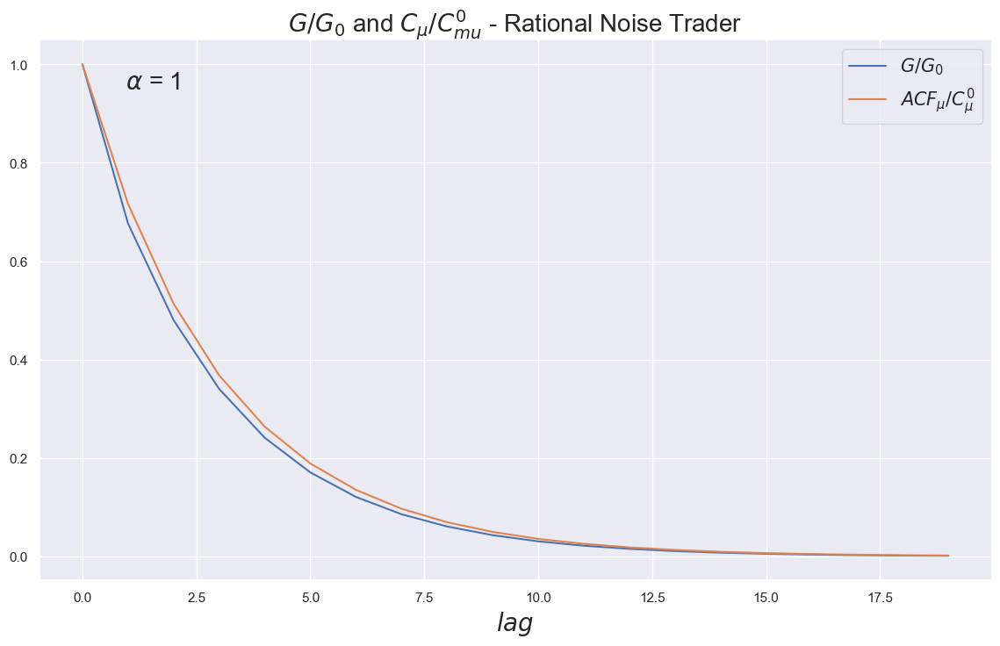

In [29]:
figure3 = plt.figure(figsize = (14,8))
plt.title(r"$G/G_{0}$ and $C_{\mu}/C_{mu}^{0}$ - Rational Noise Trader", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.plot(np.arange(0,20), G_Rational[0,:20]/G_Rational[0,0], label = r"$G/G_{0}$")
plt.plot(np.arange(0,20), ACF_MU_Rational[0,:20]/C_MU_0, label = r"$ACF_{\mu}/C_{\mu}^{0}$")
plt.text(0.95,0.95,r"$\alpha$ = {}".format(alpha), fontsize = 20)
plt.legend(prop={'size': 15})
plt.show()

## Collapse between $ACF_{Q}$ and $ACF_{NT}$ - Rational Noise Trader

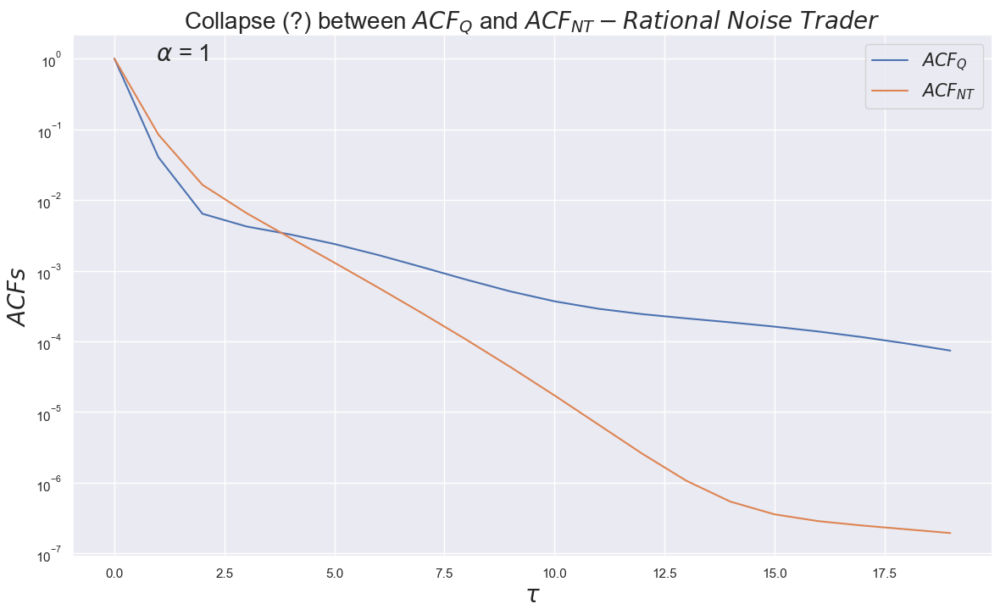

In [30]:
figure4 = plt.figure(figsize = (14,8))
plt.title(r"Collapse (?) between $ACF_{Q}$ and $ACF_{NT} - Rational \ Noise \ Trader$", fontsize = 20)
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$ACFs$", fontsize = 20)
plt.plot(np.arange(0,20), ACFs_Q_Rational[len(G_s_Rational)-1][0,:20]/ACFs_Q_Rational[len(G_s_Rational)-1][0,0], label = r"$ACF_{Q}$")
plt.plot(np.arange(0,20), ACFs_NT_Rational[len(G_s_Rational)-1][0,:20]/ACFs_NT_Rational[len(G_s_Rational)-1][0,0] , label = r"$ACF_{NT}$")
plt.text(0.95,0.95,r"$\alpha$ = {}".format(alpha), fontsize = 20)
plt.yscale('log')
plt.legend(prop={'size': 15})
plt.show()

**Plotting ACF of the Informed Trader**

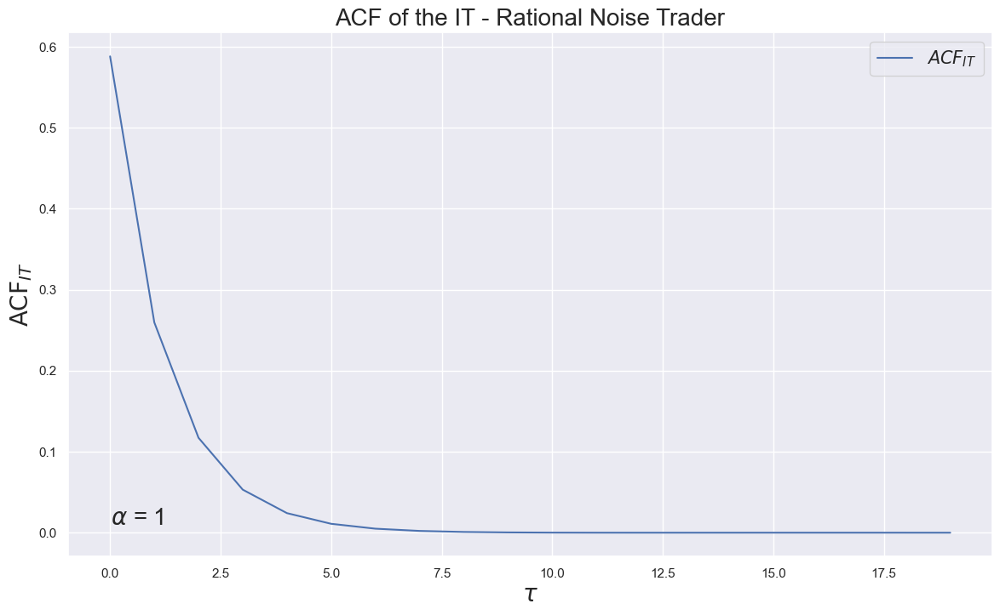

In [31]:
figure5 = plt.figure(figsize = (14,8))
plt.title("ACF of the IT - Rational Noise Trader", fontsize = 20)
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$\mathsf{ACF}_{IT}$", fontsize= 20)
plt.plot(np.arange(0,20), ACFs_IT[len(G_s_Rational)-1][0,:20], label = r"$ACF_{IT}$")
plt.text(0.01,0.01,r"$\alpha$ = {}".format(alpha), fontsize = 20)
plt.legend(prop={'size': 15})
plt.show()

## Transition Phase Analysis - Varying $\alpha$

**Propagator function for different values of $\alpha$**

In [37]:
T_phase_analysis = 100
T_it_phase_analysis = 10
G_0_seed = 1
alpha_G = 0.5
tau_MU = 3
tau_NT = 1
tau_IT = 1
alphas_vector = np.linspace(0.000001,40,10)
bound_for_convergence = 0.0001
cte = np.exp(-1/tau_MU)
C_MU_0 = ((1 - cte)/(cte))**2
C_NT_0 = 1
C_IT_0 = 1
tau = 3

# Target portfolio is a white noise
ACF_TGT = np.identity(T_phase_analysis)

seed_type_NT = "mark"

results_for_different_alphas = []

for i in range (0,len(alphas_vector)):
    results_for_different_alphas.append(numerical_solver_rational_noise_trader(T_phase_analysis, T_it_phase_analysis, G_0_seed, alpha_G, alphas_vector[i], C_MU_0, tau_MU, ACF_TGT, seed_type_NT, C_NT_0, tau_NT, C_IT_0, tau_IT, tau, _, bound_for_convergence))

Iteration: 1 is finhised 

Iteration: 2 is finhised 

Iteration: 3 is finhised 

Iteration: 4 is finhised 

Iteration: 5 is finhised 

Iteration: 6 is finhised 

Iteration: 7 is finhised 

Iteration: 8 is finhised 

Iteration: 9 is finhised 

Iteration: 10 is finhised 

Iteration: 1 is finhised 

Iteration: 2 is finhised 

Iteration: 3 is finhised 

Iteration: 4 is finhised 

Iteration: 5 is finhised 

Iteration: 6 is finhised 

Iteration: 7 is finhised 

Iteration: 8 is finhised 

Iteration: 9 is finhised 

Iteration: 10 is finhised 

Iteration: 1 is finhised 

Iteration: 2 is finhised 

Iteration: 3 is finhised 

Iteration: 4 is finhised 

Iteration: 5 is finhised 

Iteration: 6 is finhised 

Iteration: 7 is finhised 

Iteration: 8 is finhised 

Iteration: 9 is finhised 

Iteration: 10 is finhised 

Iteration: 1 is finhised 

Iteration: 2 is finhised 

Iteration: 3 is finhised 

Iteration: 4 is finhised 

Iteration: 5 is finhised 

Iteration: 6 is finhised 

Iteration: 7 is finhised 

**Propagator functions for different values of $\alpha$**

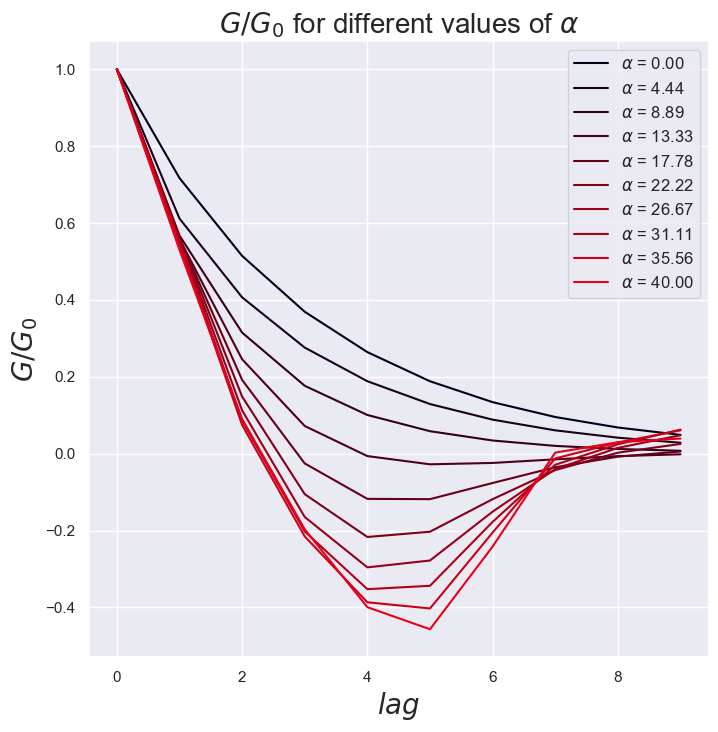

In [38]:
figure6 = plt.figure(figsize = (8,8))
plt.title(r"$G/G_{0}$ for different values of $\alpha$", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$G/G_{0}$", fontsize = 20)

for i in range (0,len(alphas_vector)):
    plt.plot(np.arange(0,10), results_for_different_alphas[i][0][0,:10]/results_for_different_alphas[i][0][0,0], color = color_conv((i)/len(alphas_vector)), label = r"$\alpha$ = {:.2f}".format(alphas_vector[i]))
plt.legend(loc = 1, prop={'size': 12})
plt.show()

**Auto-covariance of the Noise Trader for different values of $\alpha$**

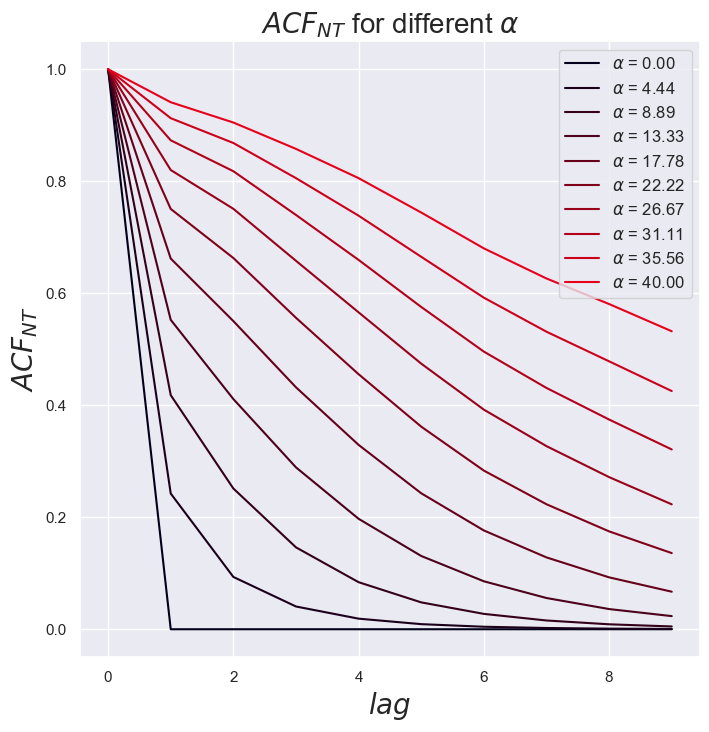

In [39]:
figure7 = plt.figure(figsize = (8,8))
plt.title(r"$ACF_{NT}$ for different $\alpha$", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$ACF_{NT}$", fontsize = 20)

for i in range (0,len(alphas_vector)):
    plt.plot(np.arange(0,10), results_for_different_alphas[i][2][-1][0,:10]/results_for_different_alphas[i][2][-1][0,0], color = color_conv((i)/len(alphas_vector)), label = r"$\alpha$ = {:.2f}".format(alphas_vector[i]))
plt.legend(loc = 1, prop={'size': 12})
#plt.yscale('log')
plt.show()

**Auto-covariance of the total excess demand for different values of $\alpha$**

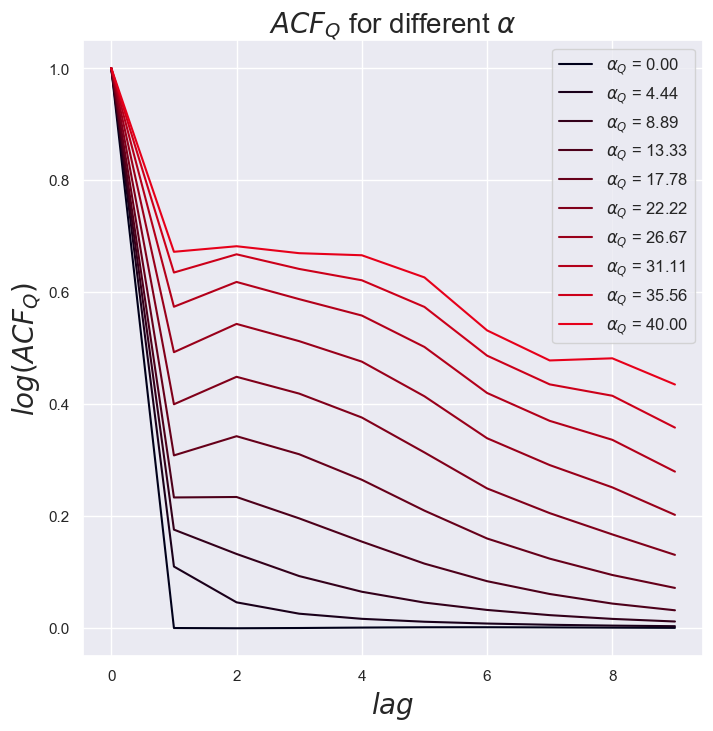

In [40]:
figure8 = plt.figure(figsize = (8,8))
plt.title(r"$ACF_{Q}$ for different $\alpha$", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$log(ACF_{Q})$", fontsize = 20)

for i in range (0,len(alphas_vector)):
    plt.plot(np.arange(0,10),  results_for_different_alphas[i][4][-1][0,:10]/results_for_different_alphas[i][4][-1][0,0], color = color_conv((i)/len(alphas_vector)), label = r"$\alpha_{{Q}}$ = {:.2f}".format(alphas_vector[i]))

#plt.yscale('log')
plt.legend(loc = 1, prop={'size': 12})
plt.show()

**Superposition of the Auto-Covariance of the Noise Trader and the Total Excess Demand - Investigating the
Cammouflage of the IT**

**Biggest $\alpha$**

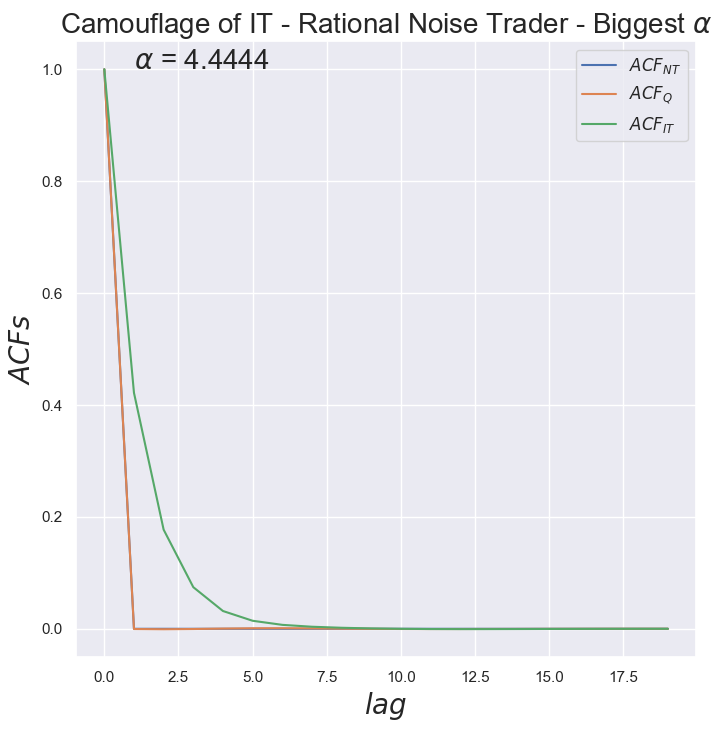

In [41]:
figure9 = plt.figure(figsize = (8,8))
plt.title(r"Camouflage of IT - Rational Noise Trader - Biggest $\alpha$", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$ACFs$", fontsize = 20)

##for i in range(len(alphas_vector)-1,len(alphas_vector)):

for i in range(0,1):
    plt.plot(np.arange(0,20),  results_for_different_alphas[i][2][-1][0,:20]/results_for_different_alphas[i][2][-1][0,0], label = r'$ACF_{NT}$')
    plt.plot(np.arange(0,20),  results_for_different_alphas[i][4][-1][0,:20]/results_for_different_alphas[i][4][-1][0,0], label = r'$ACF_{Q}$')
    plt.plot(np.arange(0,20),  results_for_different_alphas[i][3][-1][0,:20]/results_for_different_alphas[i][3][-1][0,0], label = r'$ACF_{IT}$')

    
plt.text(1,1,r"$\alpha$ = {:.4f}".format(alphas_vector[1]), fontsize = 20)
#plt.yscale('log')
plt.legend(prop={'size': 12})
plt.show()

**Smallest $\alpha$**

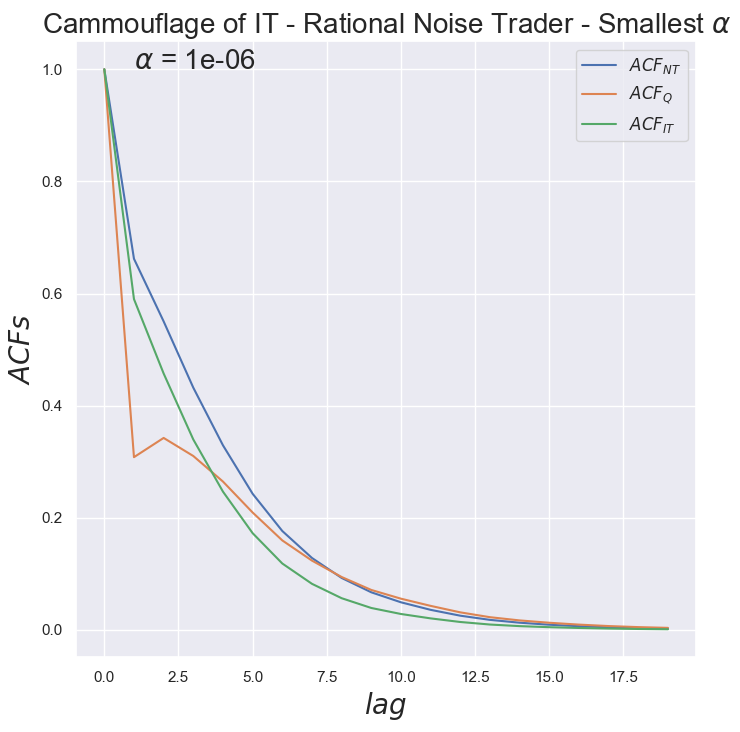

In [49]:
figure10 = plt.figure(figsize = (8,8))
plt.title(r"Cammouflage of IT - Rational Noise Trader - Smallest $\alpha$", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$ACFs$", fontsize = 20)

for i in range (4,5):
    plt.plot(np.arange(0,20),  results_for_different_alphas[i][2][-1][0,:20]/results_for_different_alphas[i][2][-1][0,0], label = r'$ACF_{NT}$')
    plt.plot(np.arange(0,20),  results_for_different_alphas[i][4][-1][0,:20]/results_for_different_alphas[i][4][-1][0,0], label = r'$ACF_{Q}$')
    plt.plot(np.arange(0,20),  results_for_different_alphas[i][3][-1][0,:20]/results_for_different_alphas[i][3][-1][0,0], label = r'$ACF_{IT}$')

#plt.yscale('log')
plt.text(1,1,r"$\alpha$ = {}".format(alphas_vector[0]), fontsize = 20)
plt.legend(prop={'size': 12})
plt.show()

## Variance Analysis

**Covariance of the Total Excess Demand for different values of $\alpha$**

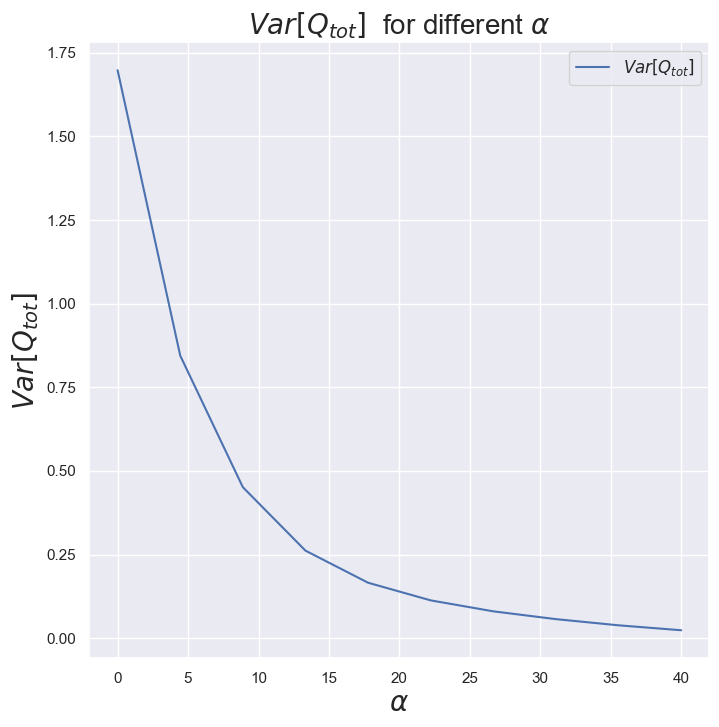

In [51]:
figure11 = plt.figure(figsize = (8,8))
plt.title(r"$Var[Q_{tot}]$  for different $\alpha$", fontsize = 20)
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var[Q_{tot}]$", fontsize = 20)

covariances_Q = []

for i in range(0, len(alphas_vector)):
    covariances_Q.append(results_for_different_alphas[i][4][-1][0,0])
    

plt.plot(alphas_vector, covariances_Q, label = r"$Var[Q_{tot}]$")
#plt.yscale('log')
plt.legend(prop={'size': 12})
plt.show()

**Covariance of the Noise Trader's Demand for different values of $\alpha$**

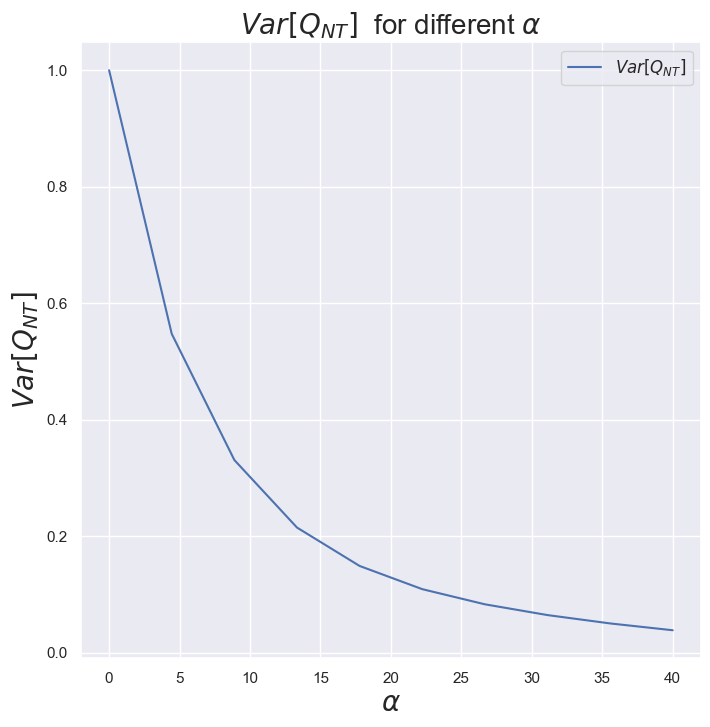

In [52]:
figure12 = plt.figure(figsize = (8,8))
plt.title(r"$Var[Q_{NT}]$  for different $\alpha$", fontsize = 20)
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var[Q_{NT}]$", fontsize = 20)


covariances_Q_NT = []

for i in range(0, len(alphas_vector)):
    covariances_Q_NT.append(results_for_different_alphas[i][2][-1][0,0])
    

plt.plot(alphas_vector, covariances_Q_NT, label = r"$Var[Q_{NT}]$")
#plt.yscale('log')
plt.legend(prop={'size': 12})
plt.show()

**Covariance of the Informed Trader's Demand for different values of $\alpha$**

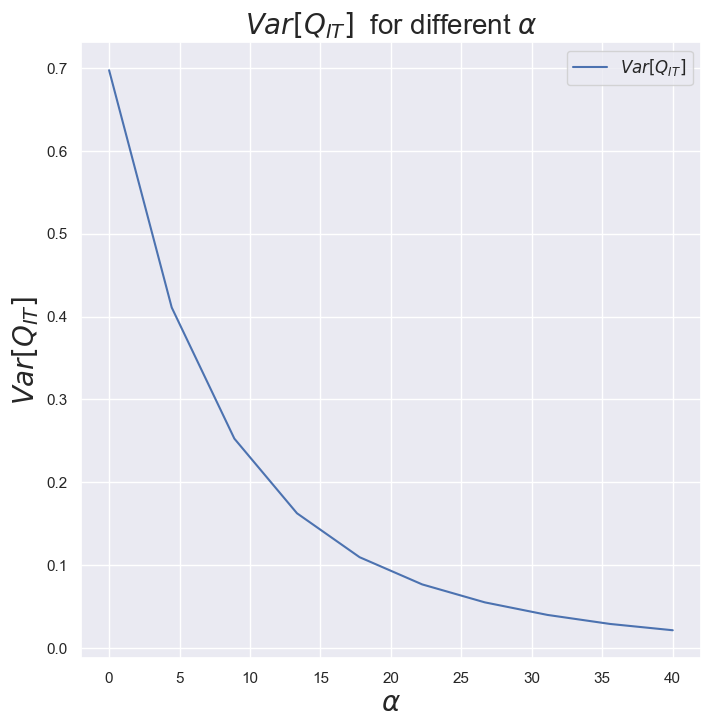

In [53]:
figure13 = plt.figure(figsize = (8,8))
plt.title(r"$Var[Q_{IT}]$  for different $\alpha$", fontsize = 20)
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var[Q_{IT}]$", fontsize = 20)


covariances_Q_IT = []

for i in range(0, len(alphas_vector)):
    covariances_Q_IT.append(results_for_different_alphas[i][3][-1][0,0])
    

plt.plot(alphas_vector, covariances_Q_IT, label = r"$Var[Q_{IT}]$")
#plt.yscale('log')
plt.legend(prop={'size': 12})
plt.show()

## Studying Price Efficiency

**Price efficiency for the biggest $\alpha$**

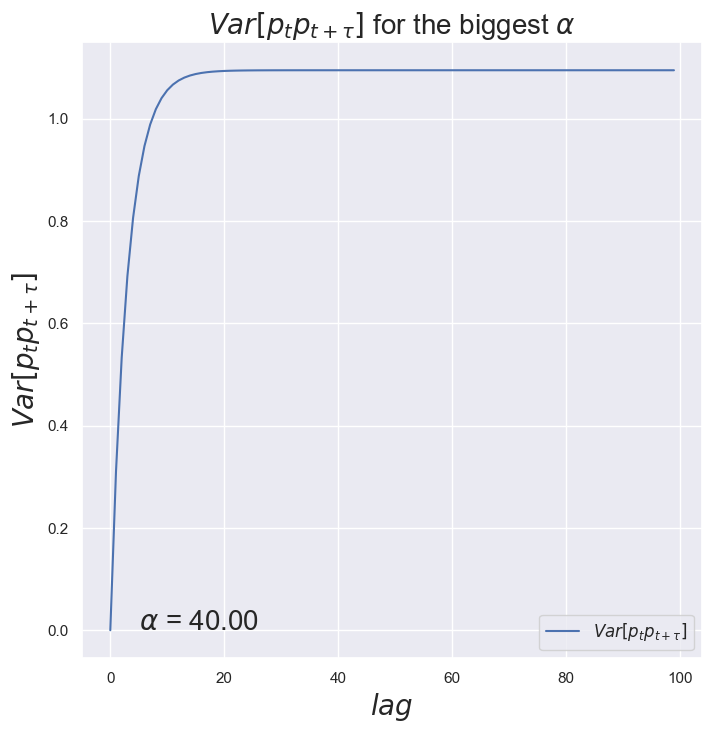

In [54]:
figure14 = plt.figure(figsize = (8,8))
plt.title(r"$Var[p_{t}p_{t + \tau}]$ for the biggest $\alpha$", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$Var[p_{t}p_{t + \tau}]$", fontsize = 20)

final_result = results_for_different_alphas[len(alphas_vector) - 1]

G_final = final_result[0]

ACF_Q_final = final_result[4][-1]

ACF_P_final = return_ACF_P(ACF_Q_final, G_final)


plt.plot(np.arange(0,T_phase_analysis), 2*ACF_P_final[0,0]*(1 - ACF_P_final[0,:]/ACF_P_final[0,0]), label = r"$Var[p_{t}p_{t + \tau}]$")
plt.text(5,0,r"$\alpha$ = {:.2f}".format(alphas_vector[len(alphas_vector)-1]), fontsize = 20)
#plt.yscale('log')
plt.legend(prop={'size': 12})
plt.show()

**Price efficiency for different values of $\alpha$**

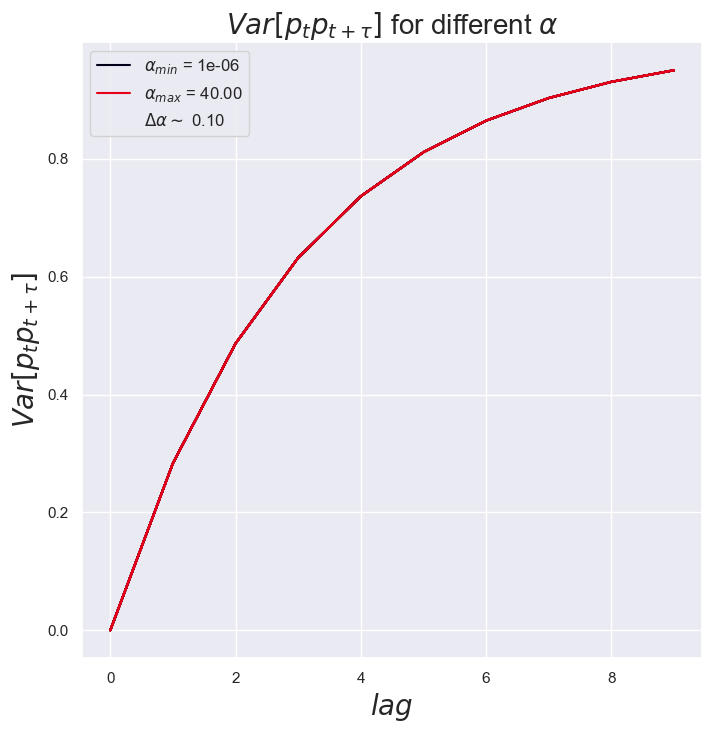

In [55]:
figure15 = plt.figure(figsize = (8,8))
plt.title(r"$Var[p_{t}p_{t + \tau}]$ for different $\alpha$", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$Var[p_{t}p_{t + \tau}]$", fontsize = 20)


final_results = []


for i in range(0,len(alphas_vector)):
    final_results.append(results_for_different_alphas[i])
 

ACFs_P = []

for i in range(0,len(alphas_vector)):
    G_final = final_results[i][0]
    ACF_Q_final = final_results[i][4][-1]
    ACFs_P.append(return_ACF_P(ACF_Q_final, G_final))
    
    

for i in range(0,len(alphas_vector)):
    #plt.plot(np.arange(0,25), (1 - ACFs_P[i][0,:25]/ACFs_P[i][0,0]), color = color_conv((i)/20), label = r"$\alpha$ = {:.6f}".format(alphas_vector[i]))
    if(i == 0):
        plt.plot(np.arange(0,10), (1 - ACFs_P[i][0,:10]/ACFs_P[i][0,0]), color = color_conv((i)/len(alphas_vector)), label = r"$\alpha_{{min}}$ = {:.0e}".format(alphas_vector[i]))
    if(i == len(alphas_vector) - 1):
        plt.plot(np.arange(0,10), (1 - ACFs_P[i][0,:10]/ACFs_P[i][0,0]), color = color_conv((i)/len(alphas_vector)), label = r"$\alpha_{{max}}$ = {:.2f}".format(alphas_vector[i]))
    if(i == len(alphas_vector)- 1):
        plt.plot([], [], ' ', label=r"$\Delta \alpha \sim $ {:.2f}".format(1/len(alphas_vector)))
    else:
        plt.plot(np.arange(0,10), (1 - ACFs_P[i][0,:10]/ACFs_P[i][0,0]), color = color_conv((i)/len(alphas_vector)))
        plt.plot(np.arange(0,10), (1 - ACFs_P[i][0,:10]/ACFs_P[i][0,0]), color = color_conv((i)/len(alphas_vector)))
#plt.plot(np.arange(0,25),2*(1 - ACF_MU_Rational[0,:25]/C_MU_0), label = r"$ACF_{MU}/C_{\mu}^{0}$")

#plt.yscale('log')
plt.legend(loc = 2 , prop={'size': 12})
plt.show()

## Analysis of Results - Irrational Noise Trader

In [56]:
T = 100
T_it = 10
G_0_seed = 1
alpha_G = 0.5 
tau_MU = 3
tau_NT = 1
cte = np.exp(-1/tau_MU)
C_MU_0 = ((1 - cte)/(cte))**2
C_NT_0 = 1

#numerical_solver_irrational_noise_trader(T, T_it, G_0_seed, alpha_G, C_MU_0, C_NT_0, tau_MU, tau_NT)
G_Irrational, G_s_Irrational, ACF_Q_Irrational, ACF_NT_Irrational, ACF_MU_Irrational, ACF_P_Irrational, ACF_P_F_Irrational, ACF_IT_Irrational = numerical_solver_irrational_noise_trader(T, T_it, G_0_seed, alpha_G, C_MU_0, C_NT_0, tau_MU, tau_NT)

This is iteration: 1

This is iteration: 2

This is iteration: 3

This is iteration: 4

This is iteration: 5

This is iteration: 6

This is iteration: 7

This is iteration: 8

This is iteration: 9

This is iteration: 10



## Last propagator found - Irrational Noise Trader

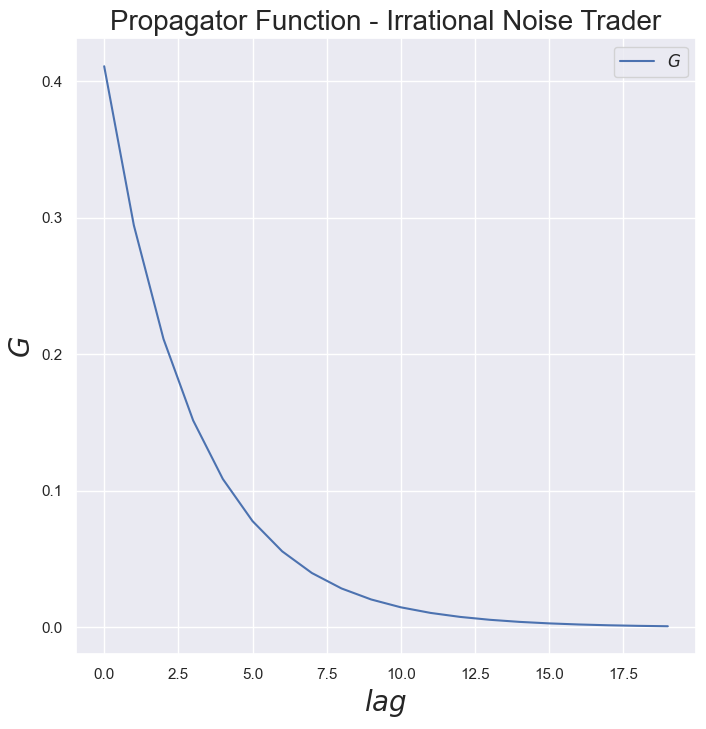

In [57]:
figure16 = plt.figure(figsize = (8,8))
plt.title("Propagator Function - Irrational Noise Trader", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$G$", fontsize = 20)
plt.plot(np.arange(0,20),G_Irrational[0,:20], label = r"$G$")
plt.legend(prop={'size': 12})
plt.show()

##  $G/G_{0}$ and $C_{\mu}/C_{\mu}^{0}$

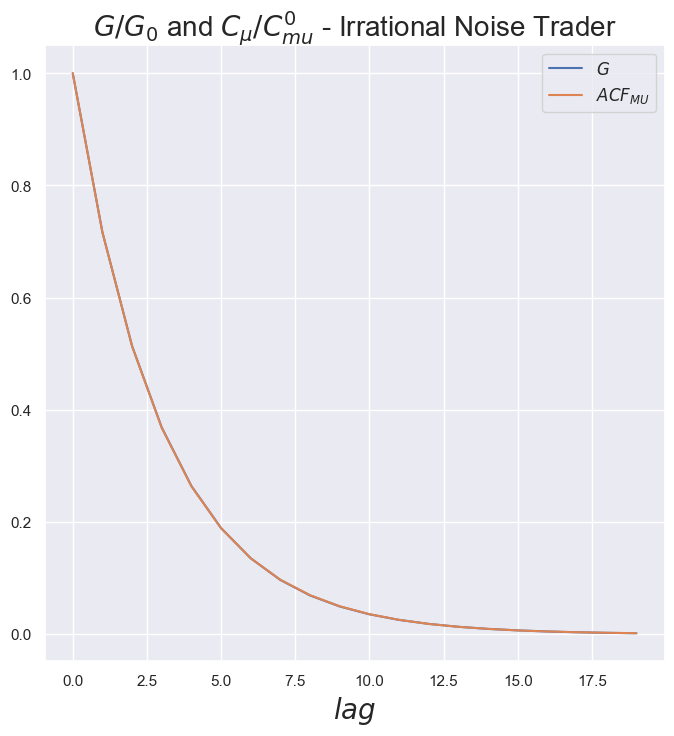

In [58]:
figure17 = plt.figure(figsize = (8,8))
plt.title(r"$G/G_{0}$ and $C_{\mu}/C_{mu}^{0}$ - Irrational Noise Trader", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.plot(np.arange(0,20), G_Irrational[0,:20]/G_Irrational[0,0], label = r"$G$")
plt.plot(np.arange(0,20), ACF_MU_Irrational[0,:20]/C_MU_0, label = r"$ACF_{MU}$")
plt.legend(prop={'size': 12})
plt.show()

## Collapse between $ACF_{Q}$ and $ACF_{NT}$ - Irrational Noise Trader

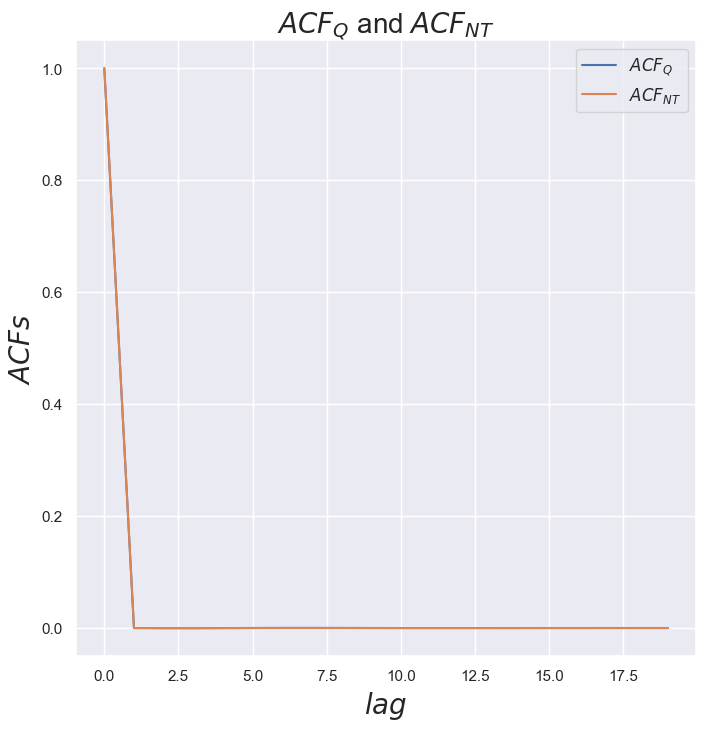

In [59]:
figure18 = plt.figure(figsize = (8,8))
plt.title(r"$ACF_{Q}$ and $ACF_{NT}$", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$ACFs$", fontsize = 20)
plt.plot(np.arange(0,20),ACF_Q_Irrational[0,:20]/ACF_Q_Irrational[0,0], label = r"$ACF_{Q}$")
plt.plot(np.arange(0,20), ACF_NT_Irrational[0,:20]/ACF_NT_Irrational[0,0], label = r"$ACF_{NT}$")
plt.legend(prop={'size': 12})
plt.show()

## $ACF_{IT}$

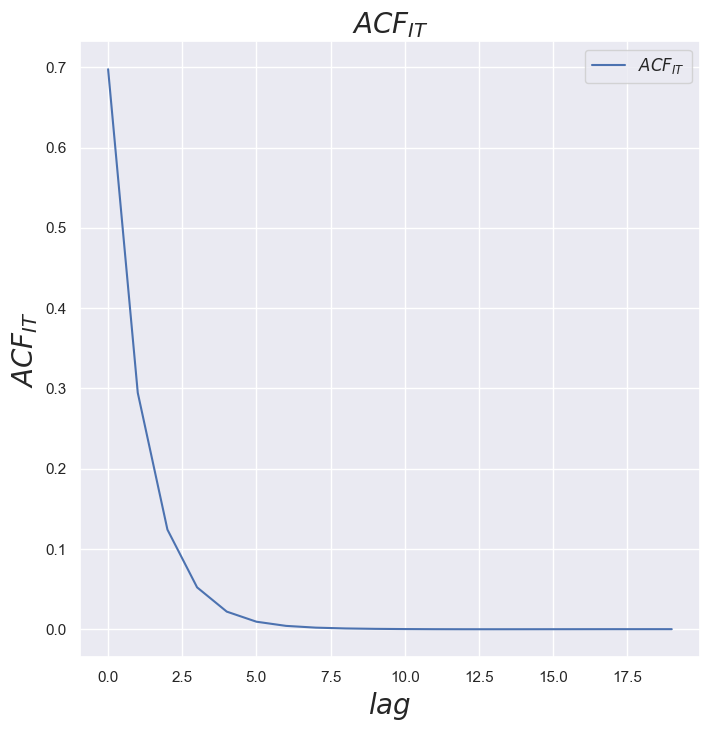

In [60]:
figure19 = plt.figure(figsize = (8,8))
plt.title(r"$ACF_{IT}$", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$ACF_{IT}$", fontsize = 20)
plt.plot(np.arange(0,20), ACF_IT_Irrational[0,:20], label = r"$ACF_{IT}$")
plt.legend(prop={'size': 12})
plt.show()

## $ACF_{P}$

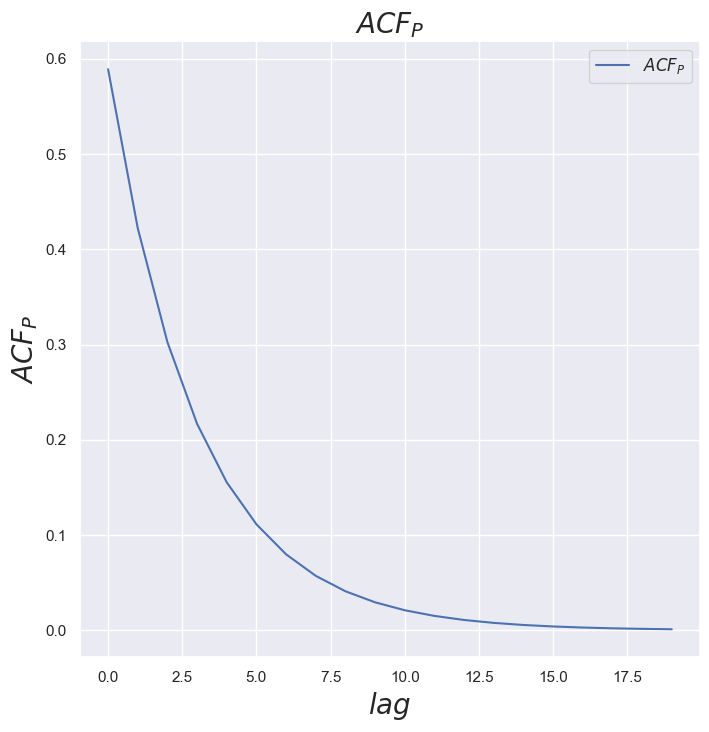

In [61]:
figure20 = plt.figure(figsize = (8,8))
plt.title(r"$ACF_{P}$", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$ACF_{P}$", fontsize = 20)
plt.plot(np.arange(0,20), ACF_P_Irrational[0,:20], label = r"$ACF_{P}$")
plt.legend(prop={'size': 12})
plt.show()

## Comparison between Irrational and Rational Noise Trader Cases

**Propagator Comparison**

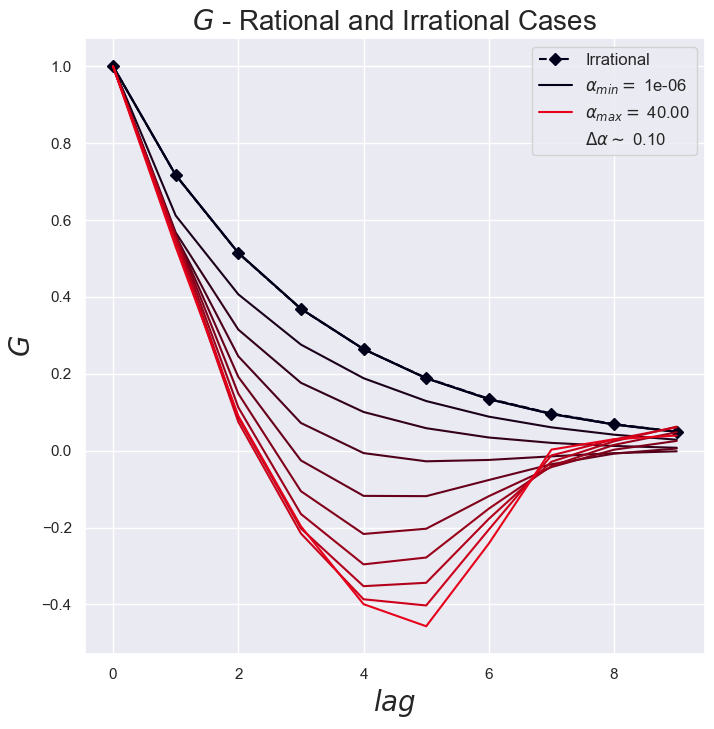

In [62]:
figure21 = plt.figure(figsize = (8,8))
plt.title(r"$G$ - Rational and Irrational Cases", fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$G$", fontsize = 20)


plt.plot(np.arange(10), G_Irrational[0,:10]/ G_Irrational[0,0],linestyle='dashed',  label = "Irrational", marker = 'D', color = color_conv(0))    
plt.legend(loc = 1, prop={'size': 8})
for i in range (0,len(alphas_vector)):
    if(i == 0):
        plt.plot(np.arange(0,10), results_for_different_alphas[i][0][0,:10]/ results_for_different_alphas[i][0][0,0], color = color_conv((i)/len(alphas_vector)), label=r"$\alpha_{{min}} = $ {:.0e}".format(alphas_vector[0]))
    if(i == len(alphas_vector) - 1):
         plt.plot(np.arange(0,10), results_for_different_alphas[i][0][0,:10]/results_for_different_alphas[i][0][0,0], color = color_conv((i)/len(alphas_vector)), label=r"$\alpha_{{max}} = $ {:.2f}".format(alphas_vector[-1]))
    if(i == len(alphas_vector) - 1):
        plt.plot([], [], ' ', label=r"$\Delta \alpha \sim $ {:.2f}".format(1/len(alphas_vector)))
    else:
        plt.plot(np.arange(0,10),  results_for_different_alphas[i][0][0,:10]/results_for_different_alphas[i][0][0,0], color = color_conv((i)/len(alphas_vector)))
        



plt.legend(loc = 1, prop={'size': 12})
plt.show()


#label = r"$\alpha$ = {:.5f}".format(alphas_vector[i])

**$ACF_{Q}$**

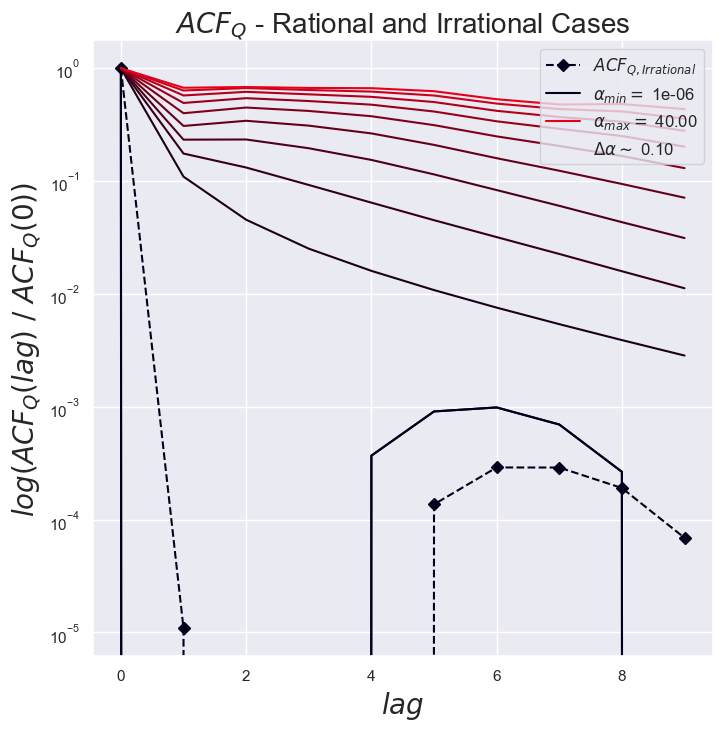

In [63]:
figure22 = plt.figure(figsize = (8,8))
plt.title(r"$ACF_{Q}$ - Rational and Irrational Cases" , fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$log(ACF_{Q}(lag) \ / \ ACF_{Q}(0))$", fontsize = 20)


plt.plot(np.arange(0,10), ACF_Q_Irrational[0,:10]/ACF_Q_Irrational[0,0], label = r"$ACF_{Q,Irrational}$", linestyle = 'dashed', marker = 'D', color = color_conv(0))

for i in range (0,len(alphas_vector)):
    if(i == 0):
        plt.plot(np.arange(0,10), results_for_different_alphas[i][4][-1][0,:10]/results_for_different_alphas[i][4][-1][0,0], color = color_conv((i)/len(alphas_vector)), label=r"$\alpha_{{min}} = $ {:.0e}".format(alphas_vector[0]))
    if(i == len(alphas_vector) - 1):
        plt.plot(np.arange(0,10), results_for_different_alphas[i][4][-1][0,:10]/results_for_different_alphas[i][4][-1][0,0], color = color_conv((i)/len(alphas_vector)), label=r"$\alpha_{{max}} = $ {:.2f}".format(alphas_vector[-1]))
    if(i == len(alphas_vector) - 1):
        plt.plot([], [], ' ', label=r"$\Delta \alpha \sim $ {:.2f}".format(1/len(alphas_vector)))
    else:
        plt.plot(np.arange(0,10),  results_for_different_alphas[i][4][-1][0,:10]/results_for_different_alphas[i][4][-1][0,0], color = color_conv(i/len(alphas_vector)))
plt.yscale('log')
plt.legend(loc = 1, prop={'size': 12})
plt.show()

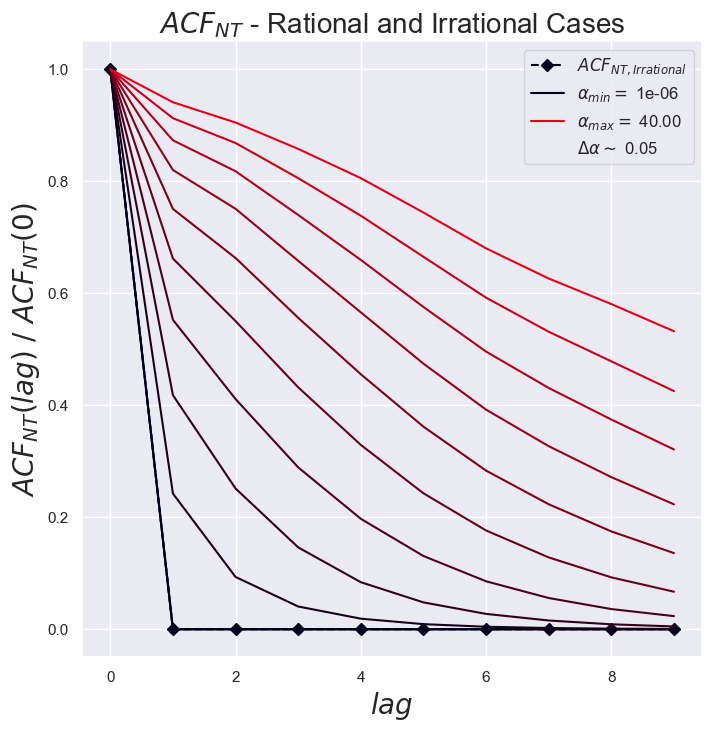

In [64]:
figure23 = plt.figure(figsize = (8,8))
plt.title(r"$ACF_{NT}$ - Rational and Irrational Cases" , fontsize = 20)
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$ACF_{NT}(lag) \ / \ ACF_{NT}(0)$", fontsize = 20)

plt.plot(np.arange(0,10), ACF_NT_Irrational[0,:10]/ACF_NT_Irrational[0,0], label = r"$ACF_{NT,Irrational}$", linestyle = 'dashed', marker = 'D', color = color_conv(0))

for i in range (0,len(alphas_vector)):
    if(i == 0):
        plt.plot(np.arange(0,10), results_for_different_alphas[i][2][-1][0,:10]/results_for_different_alphas[i][2][-1][0,0], color = color_conv((i)/len(alphas_vector)), label=r"$\alpha_{{min}} = $ {:.0e}".format(alphas_vector[0]))
    if(i == len(alphas_vector) - 1):
        plt.plot(np.arange(0,10), results_for_different_alphas[i][2][-1][0,:10]/results_for_different_alphas[i][2][-1][0,0], color = color_conv((i)/len(alphas_vector)), label=r"$\alpha_{{max}} = $ {:.2f}".format(alphas_vector[-1]))
    if(i == len(alphas_vector) - 1):
        plt.plot([], [], ' ', label=r"$\Delta \alpha \sim $ {:.2f}".format(1/20))
    else:
        plt.plot(np.arange(0,10),  results_for_different_alphas[i][2][-1][0,:10]/results_for_different_alphas[i][2][-1][0,0], color = color_conv(i/len(alphas_vector)))
#plt.yscale('log')
plt.legend(loc = 1, prop={'size': 12})
plt.show()


## Coding the tester for convergence - Two degrees of freedom: $Var(q^{tgt})$ and $\tau_{\mu}$

**Tester function**

In [26]:
def convergence_tester(T_analysis, T_it_max, number_of_tests, bound_for_convergence, alpha_min, alpha_max, var_tgt_min,
                       var_tgt_max, tau_mu_min, tau_mu_max, initial_seed_type, G_0_seed, alpha_G, C_NT_0, tau_NT, C_IT_0, tau_IT, tau):
    
    #C_NT_0, tau_NT, C_IT_0, tau_IT are only used in the case of initial_seed_type = "mark"
    
    counter = 1
    
    ACF_1_NT = np.zeros((1,T_analysis))
    ACF_1_Q = np.zeros((1,T_analysis))
    
    alpha_vector = np.linspace(alpha_min, alpha_max, number_of_tests)
    tau_mu_vector = np.linspace(tau_mu_min, tau_mu_max, number_of_tests)
    #var_tgt_vector = np.linspace(var_tgt_min, var_tgt_max, number_of_tests)
    
    var_tgt_vector = np.array([1])
    
    results = np.zeros((number_of_tests, number_of_tests, number_of_tests), dtype = object)
    convergence = np.zeros((number_of_tests, number_of_tests, number_of_tests))
    C_p = np.zeros((number_of_tests, number_of_tests, number_of_tests))
    collapse_measure = np.zeros((number_of_tests, number_of_tests, number_of_tests))
    
    last_result = np.zeros(1, dtype = object)
    
    I = np.identity(T_analysis)
    
    given_seeds = np.zeros(3, dtype = object) #Tuple -> List where first item is G_seed, second item is ACF_NT_seed and final item 
                     #is ACF_IT_seed
    
    seed_type = initial_seed_type
    
    for a in range(0, number_of_tests):
        for t in range(0, number_of_tests):
            for v in range(0, 1):
                
                ACF_TGT = var_tgt_vector[v]*I
                                
                if seed_type == "given":
                    given_seeds[0] = last_result[0][0]
                    given_seeds[1] = last_result[0][2][-1]
                    given_seeds[2] = last_result[0][3][-1]
                
                
                cte = np.exp(-1/tau_mu_vector[t])
                C_MU_0 = ((1 - cte)/(cte))**2
                
                results[a,t,v] = list(numerical_solver_rational_noise_trader(T_analysis, T_it_max, G_0_seed, alpha_G,
                                                                      alpha_vector[a], C_MU_0, tau_mu_vector[t],
                                                                      ACF_TGT, seed_type, C_NT_0, tau_NT, C_IT_0,
                                                                      tau_IT, tau, given_seeds, bound_for_convergence))
                
                last_result[0] = results[a,t,v]
                
                print()
                
                convergence[a,t,v] = results[a,t,v][-2]
                
                C_p[a,t,v]  = results[a,t,v][-3][0,0]
                
                collapse_measure[a,t,v] = err_ACF(results[a,t,v][4][-1][0,:], results[a,t,v][2][-1][0,:])
                #print(f"The error is {collapse_measure[a,t,v]} \n")
                
                if(convergence[a,t,v]):
                    seed_type = "given"
                else:
                    seed_type = "mark"
                    
                if(counter == 1):
                    ACF_1_NT = results[a,t,v][2][-1][0,:]
                    ACF_1_Q = results[a,t,v][4][-1][0,:]
                    
                
                print(f"Test {counter} is completed\n")
                counter += 1

    
    return results, convergence, C_p, collapse_measure, alpha_vector, tau_mu_vector, var_tgt_vector, ACF_1_NT, ACF_1_Q


## Runnig the Convergence Tester

In [53]:
#T_analysis = 100
#T_it_max = 10
#number_of_tests = 3
#bound_for_convergence = 0.0001
#alpha_min = 0.000001
#alpha_max = 1
#var_tgt_min = 1
#var_tgt_max = 1
#tau_mu_min = 1
#tau_mu_max = 10 # maximum for obtaining convergence with this max alpha
#initial_seed_type = "mark"
#G_0_seed = 1
#alpha_G = 0.5
#C_NT_0 = 1
#tau_NT = 1
#C_IT_0 = 1
#tau_IT = 1
#tau = 2

#results, convergence, C_p, collapse_measure, alpha_vector, tau_mu_vector, var_tgt_vector, ACF_1_NT, ACF_1_Q = convergence_tester(T_analysis, T_it_max, number_of_tests, bound_for_convergence, alpha_min, alpha_max, var_tgt_min,
#                       var_tgt_max, tau_mu_min, tau_mu_max, initial_seed_type, G_0_seed, alpha_G, C_NT_0, tau_NT, C_IT_0, tau_IT, tau)

## Studying the Convergence Region for Different $\alpha$ values

In [54]:
#alpha_unicode = "\u03B1"

#transformed_alpha_vector = np.zeros(number_of_tests)
#transformed_alpha_vector[0] = alpha_vector[0].round(6)
#transformed_alpha_vector[1:] = alpha_vector[1:].round(2)

#for i in range(0, 1):
#    plt.subplots(figsize=(8,5))
#    sns.heatmap(np.flip(convergence[:,:,i].T,0), linewidths=.5, cmap = 'coolwarm_r', vmin = 0, vmax = 1, xticklabels = transformed_alpha_vector, yticklabels = tau_mu_vector[::-1], cbar = False, fmt = '')
#    plt.ylabel(r"$\tau_{\mu}$", size = 12)
#    plt.xlabel(r"$\alpha$", size = 12)
#    plt.title(r"Convergence of $G$ and $ACF_{{Q}}$ - $\tau_{{\mu}}$ vs $\alpha$ - $Var(q^{{tgt}})$ = {:.2f}".format(var_tgt_vector[i]))
#    plt.show()

## Last Propagator Found for each set of parameters

In [55]:
#figure24, axs24 = plt.subplots(number_of_tests, number_of_tests, sharex = True , sharey = True , figsize = (5*number_of_tests,5*number_of_tests))

#figure24.suptitle(r"Last Propagator Found - $G$", fontsize = 18, y = 0.9, weight="bold")


#for k in range(0, number_of_tests):
#    for i in range(0, number_of_tests):
#            axs23[k,i].plot(np.arange(0, T_analysis), results[k,i,0][0][0,:], label = "$G$")
#            axs23[k,i].legend()
#            axs23[k,i].set_ylabel(r"$G$", size = 12)
#            axs23[k,i].set_xlabel(r"$\tau$", size = 12)
#            axs23[k,i].title.set_text( r"$\alpha$ = {:.2f}, $\tau_{{\mu}}$ = {:.2f}, $\sigma^{{2}}(q^{{tgt}})$ = {:.2f}".format(alpha_vector[k], tau_mu_vector[i], var_tgt_vector[0]))

## Investigating the Camouflage Property for each set of parameters

In [56]:
#figure25, axs25 = plt.subplots(number_of_tests, number_of_tests, sharex = True , sharey = False , figsize = (5*number_of_tests,5*number_of_tests))

#figure25.suptitle("Camouflage of the Informed Trader", fontsize = 18, y = 0.9, weight="bold")


#for k in range(0, number_of_tests):
#    for i in range(0, number_of_tests):
#            axs24[k,i].plot(np.arange(0, T_analysis), results[k,i,0][2][-1][0,:]/results[k,i,0][2][-1][0,0], label = r"$ACF_{NT}$")
#            axs24[k,i].legend()
#            axs24[k,i].plot(np.arange(0, T_analysis), results[k,i,0][4][-1][0,:]/results[k,i,0][4][-1][0,0], label = r"$ACF_{Q}$")
#            axs24[k,i].legend()
#            axs24[k,i].set_ylabel(r"$ACFs$", size = 12)
#            axs24[k,i].set_xlabel(r"$\tau$", size = 12)
#            axs24[k,i].title.set_text( r"$\alpha$ = {:.2f}, $\tau_{{\mu}}$ = {:.2f}, $\sigma^{{2}}(q^{{tgt}})$ = {:.2f}".format(alpha_vector[k], tau_mu_vector[i], var_tgt_vector[0]))

## Investigating the variance of the price $Var(p)$ as function of $\tau_{\mu}$ and $\alpha$, when $Var(p^{IT}) = 1$

In [57]:
#from matplotlib import ticker
#formatter = ticker.ScalarFormatter(useMathText=True)
#formatter.set_scientific(True) 
#formatter.set_powerlimits((-1,1)) 

#transformed_alpha_vector = np.zeros(number_of_tests)
#transformed_alpha_vector[0] = alpha_vector[0].round(6)
#transformed_alpha_vector[1:] = alpha_vector[1:].round(2)

#for i in range(0, 1):
#    plt.subplots(figsize=(8,5))
#    sns.heatmap(np.flip((C_p[:,:,i].T),0),linewidths=.5, cmap = 'Blues', xticklabels = transformed_alpha_vector, yticklabels = tau_mu_vector.round(2)[::-1], cbar = True, fmt = '.2f', annot = True, vmin = 0.55)
#    plt.ylabel(r"$\tau_{\mu}$", size = 12)
#    plt.xlabel(r"$\alpha$", size = 12)
#    plt.title(r"$Var(p)/Var(p^{{IT}})$ for $Var(q^{{tgt}})$ = {:.2f}".format(var_tgt_vector[i]))
#    plt.show()
#    plt.tight_layout()

## Measuring the Camouflage of the IT - How much collapse do we have between $ACF_{Q}$ and $ACF_{NT}$ ?

In [58]:
#transformed_alpha_vector = np.zeros(number_of_tests)
#transformed_alpha_vector[0] = alpha_vector[0].round(6)
#transformed_alpha_vector[1:] = alpha_vector[1:].round(2)

#for i in range(0, 1):
#    plt.subplots(figsize=(8,5))
#    sns.heatmap(np.flip(collapse_measure[:,:,i].T,0),linewidths=.5, cmap = 'coolwarm', xticklabels = transformed_alpha_vector, yticklabels = tau_mu_vector.round(2)[::-1], cbar = True, fmt = '.4f', annot = True)
#    plt.ylabel(r"$\tau_{\mu}$", size = 12)
#    plt.xlabel(r"$\alpha$", size = 12)
#    plt.title(r"Measure of Camouflage- $err(ACF_{{NT}}, ACF_{{Q}})$ for $Var(q^{{tgt}})$ = {:.2f}".format(var_tgt_vector[i]))
#    plt.show()
#    plt.tight_layout()

## Simulating the Market!

**Simulating a stochastic process given its ACF from a white noise**

In [25]:
from scipy.linalg import cholesky

def generate_order_flow(ACF, number_of_simulations):
    T = ACF.shape[0]
    white_noise = np.random.normal(0,1,(number_of_simulations,T))
    ACF_cholesky = cholesky(ACF)
    order_flow = np.matmul(ACF_cholesky, white_noise.transpose())
    return order_flow

**Functions for constructing the mean ACF of a series of realizations for a stochastic process**

In [26]:
def return_mean_ACF(order_flow, T, number_of_simulations):
    ACF = np.zeros(T)
    for i in range(0,number_of_simulations):
        ACF += return_series_autocovariance_for_lag(order_flow[i],order_flow[i],np.arange(0,T))/number_of_simulations
    return ACF

In [27]:
def return_mean_covariance(first_order_flow, second_order_flow, T, number_of_simulations):
    cov = np.zeros(T)
    for i in range(0,number_of_simulations):
        cov += return_series_autocovariance_for_lag(first_order_flow[i],second_order_flow[i],np.arange(0,T))/(np.std(first_order_flow[i])*np.std(second_order_flow[i])*number_of_simulations)
    return cov

In [28]:
def return_series_autocovariance_for_lag(x, y, taus):
    """Inputs :
    x: pd.Series
    y: pd.Series
    taus: array of integers, representinthe lags
    Returns:
    A numpy array containing the correlation function as the average x(t)*y(t+tau)
    for each value of tau in taus"""
    def c_group(T):
        return (x*y.shift(-T)).mean()
    c_g = np.vectorize(c_group)
    return c_g(taus)

**Numerical Solver for Simulation**

In [29]:
def numerical_solver_simulation(T, T_it, G_0_seed, alpha_G, alpha, C_MU_0, tau_MU, ACF_TGT, seed_type, C_NT_0, tau_NT, C_IT_0, tau_IT, tau, given_seeds, bound_for_convergence):
        
    if seed_type != "given": 
        G = return_G(G_0_seed, alpha_G, T)
    else:
        G = given_seeds[0]
    
    ACF_MU = return_Markovian_ACF(C_MU_0, tau_MU, T)
    F_MU = -np.flip(Mforecast('mark','MU',[tau_MU,_],T,2*T,_),1)

    G_s = []
    Ds_list = []
    ACFs_NT = []
    ACFs_Q = []
    ACFs_IT = []
    ACFs_P = []
    metrics_convergence = []
    
    for iteration in range(0,T_it):
        
        G_s.append(G)
        
        if(iteration == 0):
            if seed_type == "mark":
                ACF_NT = return_Markovian_ACF(C_NT_0, tau_NT, T)
                ACF_IT = return_Markovian_ACF(C_IT_0, tau_IT, T)
            if seed_type == "id":
                ACF_NT = np.identity(T)
                ACF_IT = np.identity(T)
            if seed_type == "given":
                ACF_NT = given_seeds[1]
                ACF_IT = given_seeds[2]
   
        Ds = return_Ds(G, alpha, ACF_NT, ACF_IT, F_MU, tau)
    
        Ds_list.append(Ds)
        
        ACF_Q = return_ACF_Q(ACF_MU, ACF_TGT, Ds)
        
        K = kalman_filter(G, ACF_MU, ACF_Q, Ds[0])

        G = new_G_from_equilibrium(G,K,F_MU) 

        ACF_NT = return_ACF_NT(ACF_MU, ACF_TGT, Ds)
        
        ACF_IT = return_ACF_IT(ACF_MU, ACF_TGT, Ds)
        ACF_IT = make_ACF_IT_invertible(ACF_IT)
        
        #plt.plot(np.arange(0,T), G[0,:T], label = r"$G$")
        #plt.legend()
        #plt.show()
        
        ACFs_IT.append(ACF_IT)
        ACFs_NT.append(ACF_NT)
        ACFs_Q.append(ACF_Q)
        ACFs_P.append(return_ACF_P(ACF_Q, G))
        
        #plt.plot(np.arange(0,T), ACF_NT[0,:T]/ACF_NT[0,0], label = r"$ACF_{NT}$")
        #plt.plot(np.arange(0,T), ACF_Q[0,:T]/ACF_Q[0,0],  label = r"$ACF_{Q}$")
        #plt.legend()
        #plt.show()
        
        #metric_for_convergence = err_G(G_s[-1], G[0,:])
        #metrics_convergence.append(metric_for_convergence)
            
        #print(f"This is iteration: {iteration + 1}\n")
        #print(f"The metric for convergence is {metric_for_convergence}\n")
        #print(f"Alpha is: {alpha}\n")
        #print(f"Tau mu is : {tau_MU}\n")
        #print(f"Var(TGT) is: {ACF_TGT[0][0]}\n")
        
        #if(math.isnan(metric_for_convergence)):
        #    convergence = 0
        #    break
        
        #if(iteration <= T_it - 1 and metric_for_convergence < bound_for_convergence):
        #    convergence = 1
        #    break
            
        #if(iteration == T_it - 1 and metric_for_convergence > bound_for_convergence):
        #    convergence = 0
        #    break
        
        #print(f"Iteration {iteration + 1} is finished\n")
        print(f"Iteration {iteration} completed.\n")
    
    
    return G, Ds, G_s, Ds_list, ACFs_NT, ACFs_IT, ACFs_Q, ACF_MU, ACFs_P #, convergence, metrics_convergence

**Function to return the total excess order flow**

In [30]:
def return_total_order_flow(D_MU, D_TGT, dividends_flow, target_portfolio_order_flow):
    return np.matmul(D_MU, dividends_flow) + np.matmul(D_TGT, target_portfolio_order_flow)

**Function to return the NT's order flow**

In [31]:
def return_NT_order_flow(D_MU_NT, D_TGT_NT, dividends_flow, target_portfolio_order_flow):
    return np.matmul(D_MU_NT, dividends_flow) + np.matmul(D_TGT_NT, target_portfolio_order_flow)

**Function to return tthe IT's/NT's informed order flow**

In [32]:
def return_informed_order_flow(D_MU, dividends_flow):
    return np.matmul(D_MU, dividends_flow)

**Function to return tthe IT's/NT's stochastic order flow**

In [33]:
def return_stochastic_order_flow(D_TGT, target_portfolio_order_flow):
    return np.matmul(D_TGT, target_portfolio_order_flow)

**Function to return the IT's order flow**

In [34]:
def return_IT_order_flow(D_MU_IT, D_TGT_IT, dividends_flow, target_portfolio_order_flow):
    return np.matmul(D_MU_IT, dividends_flow) + np.matmul(D_TGT_IT, target_portfolio_order_flow)

**Function to construct the price process given total order flow and G**

In [35]:
def return_price_series(total_order_flow, G):
    
    price_series = np.matmul(G, total_order_flow)

    return price_series

**Function to construct the fundamental price process given dividends flow and $\tau_{\mu}$**

In [36]:
def return_fundamental_price_series(dividends_flow, tau_MU):
    
    q = 1 - np.exp(-1/tau_MU)
    p_F = dividends_flow/q

    return p_F

**Function to construct the IT's estimated price series given dividends flow and $\tau_{\mu}$**

In [37]:
def return_IT_estimated_price_series(dividends_flow, tau_MU):
    dividends_flow = dividends_flow[1:, :]
    cte = np.exp(-1/tau_MU)
    q = 1- cte
    p_IT = (cte*dividends_flow)/q
    
    return p_IT

**Simulating the dividends order flow**

In [47]:
import numpy as np

In [39]:
T = 100
tau_MU = 3
cte = np.exp(-1/tau_MU)
C_MU_0 = ((1 - cte)/(cte))**2

ACF_MU = return_Markovian_ACF(C_MU_0, tau_MU, T)

In [236]:
number_of_simulations = 10000
dividends_flow = generate_order_flow(ACF_MU, number_of_simulations)

**Simulating the target portfolio process**

In [237]:
Var_TGT = 1
ACF_TGT = Var_TGT*np.identity(T) ## Var_tgt is a white noise process

In [238]:
target_portfolio_order_flow = generate_order_flow(ACF_TGT, number_of_simulations)

**Running the solver for getting the stationary G and Ds**

In [239]:
T = 100
T_it = 100
G_0_seed = 1
alpha_G = 0.5
alpha = 5
seed_type = "mark"
C_NT_0 = 1
tau_NT = 1
C_IT_0 = 1
tau_IT = 1
tau = 4
#bound_for_convergence = 0.00001


numerical_solution = numerical_solver_simulation(T, T_it, G_0_seed, alpha_G, alpha, C_MU_0, tau_MU, ACF_TGT, seed_type, C_NT_0, 
                            tau_NT, C_IT_0, tau_IT, tau, _ , _)


Iteration 0 completed.

Iteration 1 completed.

Iteration 2 completed.

Iteration 3 completed.

Iteration 4 completed.

Iteration 5 completed.

Iteration 6 completed.

Iteration 7 completed.

Iteration 8 completed.

Iteration 9 completed.

Iteration 10 completed.

Iteration 11 completed.

Iteration 12 completed.

Iteration 13 completed.

Iteration 14 completed.

Iteration 15 completed.

Iteration 16 completed.

Iteration 17 completed.

Iteration 18 completed.

Iteration 19 completed.

Iteration 20 completed.

Iteration 21 completed.

Iteration 22 completed.

Iteration 23 completed.

Iteration 24 completed.

Iteration 25 completed.

Iteration 26 completed.

Iteration 27 completed.

Iteration 28 completed.

Iteration 29 completed.

Iteration 30 completed.

Iteration 31 completed.

Iteration 32 completed.

Iteration 33 completed.

Iteration 34 completed.

Iteration 35 completed.

Iteration 36 completed.

Iteration 37 completed.

Iteration 38 completed.

Iteration 39 completed.

Iteration 

**Retrieving the G array**

In [240]:
G = numerical_solution[0]

**G**

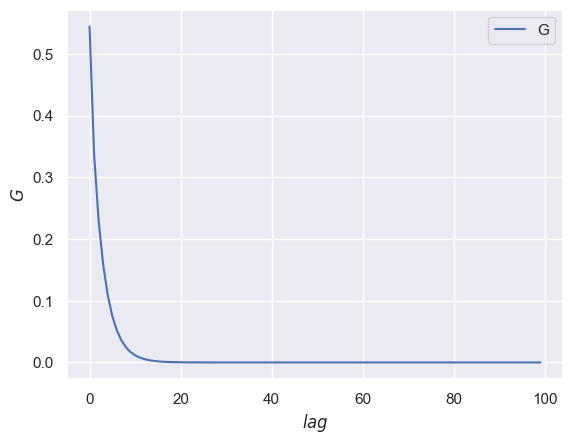

In [241]:
plt.plot(np.arange(0,T), G[0, :], label = "G")
plt.xlabel(r"$lag$")
plt.ylabel(r"$G$")
plt.legend()

**Retrieving the Ds matrices**

In [242]:
D_MU = numerical_solution[3][-1][0]
D_TGT =  numerical_solution[3][-1][1]
D_MU_NT =  numerical_solution[3][-1][2]
D_TGT_NT =  numerical_solution[3][-1][3] 
D_MU_IT =  numerical_solution[3][-1][4]
D_TGT_IT =  numerical_solution[3][-1][5]

**Retrieving ACFs**

In [243]:
ACF_NT = numerical_solution[4][-1][0,:]
ACF_Q = numerical_solution[6][-1][0,:]

**Simulating the NT's order flow**

In [244]:
NT_order_flow = return_NT_order_flow(D_MU_NT, D_TGT_NT, dividends_flow, target_portfolio_order_flow)

**Simulating NT's informed order flow**

In [245]:
NT_informed_order_flow = return_informed_order_flow(D_MU_NT, dividends_flow)

**Simulating NT's stochastic order flow**

In [246]:
NT_stochastic_order_flow = return_stochastic_order_flow(D_TGT_NT, target_portfolio_order_flow)

**NT's total position analysis**

In [171]:
NT_order_flow_matrix = np.zeros((T,number_of_simulations))

for time in range(0,T):
    for simulation in range(0, number_of_simulations):
        NT_order_flow_matrix[time,simulation] = NT_order_flow[time][simulation]

$Q_{total}(t) = \sum_{i = 0}^{t} q_{i}$

In [92]:
total_positions_NT = []

for simulation in range(0, number_of_simulations):
    total_positions_NT.append(np.cumsum(NT_order_flow_matrix[:,simulation]))
        
mean_total_positions_NT = []

for time in range(0,T):
    cummulated_position_current_time = 0.0
    for simulation in range(0, number_of_simulations):
        cummulated_position_current_time += total_positions_NT[simulation][time]
    mean_position_current_time = cummulated_position_current_time/number_of_simulations
    mean_total_positions_NT.append(mean_position_current_time)

In [93]:
total_positions_sign_NT = []
final_sign_total_positions_NT = []

for simulation in range(0, number_of_simulations):
    total_positions_sign_NT.append(np.sign(np.cumsum(NT_order_flow_matrix[:,simulation])))
    
for time in range(0,T):
    cummulated_sign_current_time = 0.0
    for simulation in range(0, number_of_simulations):
        cummulated_sign_current_time += total_positions_sign_NT[simulation][time]
    if(cummulated_sign_current_time > 0):
        final_sign_current_time = 1
    elif(cummulated_sign_current_time > 0):
        final_sign_current_time = -1
    else:
        final_sign_current_time = 0
    final_sign_total_positions_NT.append(final_sign_current_time)

**Samples of NT\`s total position paths** 

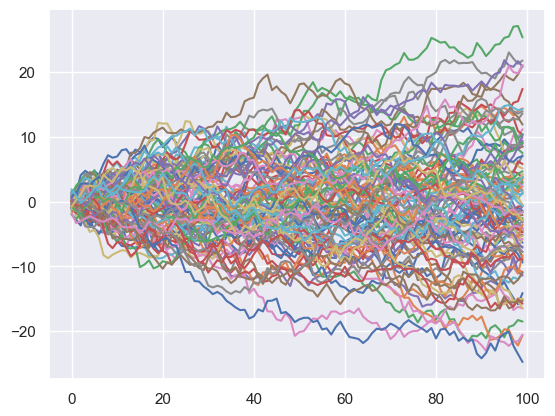

In [94]:
for i in range(0, 100):
    plt.plot(total_positions_NT[i])

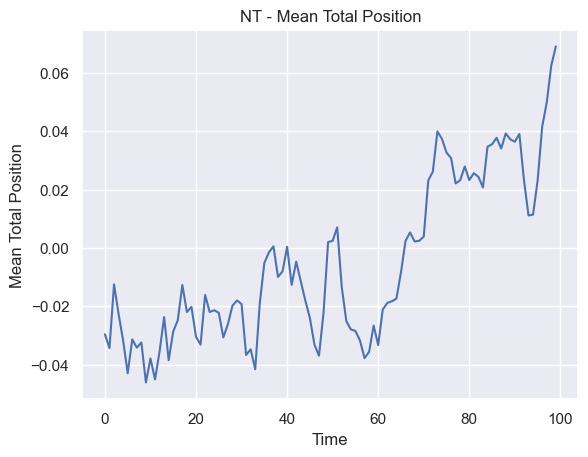

In [95]:
plt.plot(np.arange(0,T), np.array(mean_total_positions_NT))
plt.xlabel("Time")
plt.ylabel("Mean Total Position")
plt.title("NT - Mean Total Position")
plt.show()

$Q_{total}(t) = ∣\sum_{i = 0}^{t} q_{i}∣$

In [96]:
total_positions_NT_2 = []

for simulation in range(0, number_of_simulations):
    total_positions_NT_2.append(np.abs(np.cumsum(NT_order_flow_matrix[:,simulation])))
        
mean_total_positions_NT_2 = []

for time in range(0,T):
    cummulated_position_current_time = 0.0
    for simulation in range(0, number_of_simulations):
        cummulated_position_current_time += total_positions_NT_2[simulation][time]
    mean_position_current_time = cummulated_position_current_time/number_of_simulations
    mean_total_positions_NT_2.append(mean_position_current_time)

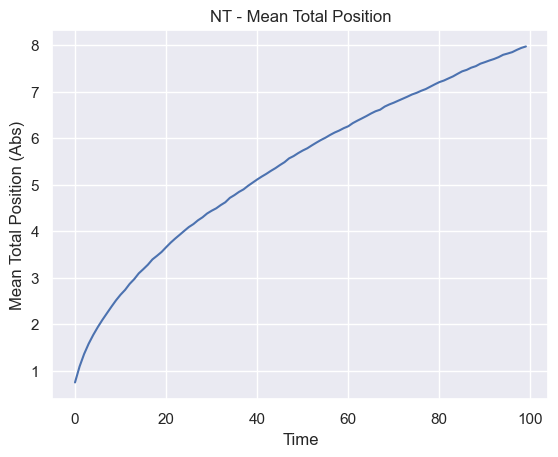

In [97]:
plt.plot(np.arange(0,T), mean_total_positions_NT_2)
plt.xlabel("Time")
plt.ylabel("Mean Total Position (Abs)")
plt.title("NT - Mean Total Position")
plt.show()

**Autocovariance Plot**

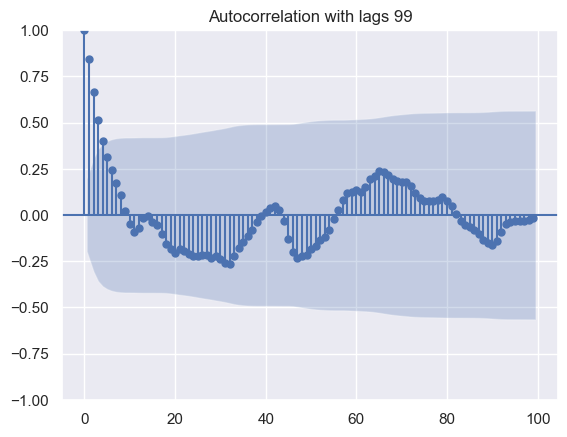

In [98]:
lags = [99]
for l in lags:
    titles = "Autocorrelation with lags "+ str(l)
    smt.graphics.tsa.plot_acf(total_positions_NT_2[10],lags=l,alpha=0.05,title=titles)


In [99]:
NT_order_flow.shape

(100, 10000)

**Simulating the IT's order flow**

In [247]:
IT_order_flow = return_IT_order_flow(D_MU_IT, D_TGT_IT, dividends_flow, target_portfolio_order_flow)

In [101]:
IT_order_flow_matrix = np.zeros((T,number_of_simulations))

for time in range(0,T):
    for simulation in range(0, number_of_simulations):
        IT_order_flow_matrix[time,simulation] = IT_order_flow[time][simulation]

In [102]:
total_positions_IT = []

for simulation in range(0, number_of_simulations):
    total_positions_IT.append(np.cumsum(IT_order_flow_matrix[:,simulation]))
        
mean_total_positions_IT = []

for time in range(0,T):
    cummulated_position_current_time = 0.0
    for simulation in range(0, number_of_simulations):
        cummulated_position_current_time += total_positions_IT[simulation][time]
    mean_position_current_time = cummulated_position_current_time/number_of_simulations
    mean_total_positions_IT.append(mean_position_current_time)

**Samples of IT\`s total position paths** 

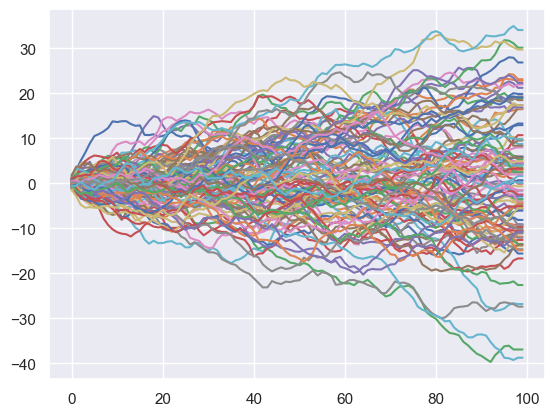

In [103]:
for i in range(0, 100):
    plt.plot(total_positions_IT[i])

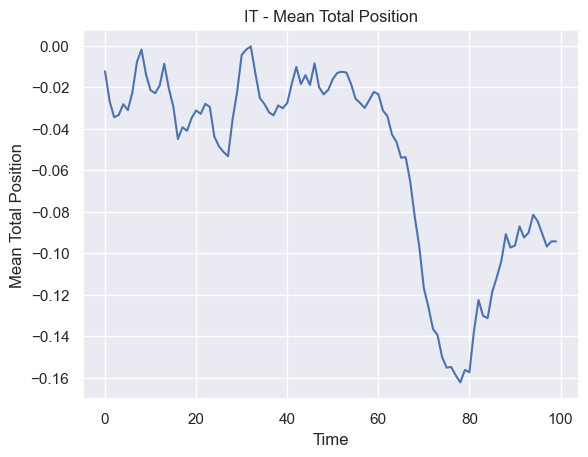

In [104]:
plt.plot(np.arange(0,T), mean_total_positions_IT)
plt.xlabel("Time")
plt.ylabel("Mean Total Position")
plt.title("IT - Mean Total Position")
plt.show()

In [106]:
total_positions_sign_IT = []
final_sign_total_positions_IT = []

for simulation in range(0, number_of_simulations):
    total_positions_sign_IT.append(np.sign(np.cumsum(IT_order_flow_matrix[:,simulation])))
    
for time in range(0,T):
    cummulated_sign_current_time = 0.0
    for simulation in range(0, number_of_simulations):
        cummulated_sign_current_time += total_positions_sign_IT[simulation][time]
    if(cummulated_sign_current_time > 0):
        final_sign_current_time = 1
    elif(cummulated_sign_current_time > 0):
        final_sign_current_time = -1
    else:
        final_sign_current_time = 0
    final_sign_total_positions_IT.append(final_sign_current_time)

**More frequent total order flow sign at each time instant $t$**

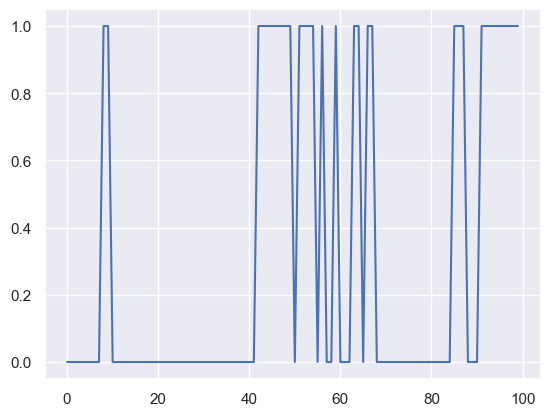

In [107]:
plt.plot(final_sign_total_positions_IT)

In [108]:
total_positions_IT_2 = []

for simulation in range(0, number_of_simulations):
    total_positions_IT_2.append(np.abs(np.cumsum(IT_order_flow_matrix[:,simulation])))
        
mean_total_positions_IT_2 = []

for time in range(0,T):
    cummulated_position_current_time = 0.0
    for simulation in range(0, number_of_simulations):
        cummulated_position_current_time += total_positions_IT_2[simulation][time]
    mean_position_current_time = cummulated_position_current_time/number_of_simulations
    mean_total_positions_IT_2.append(mean_position_current_time)

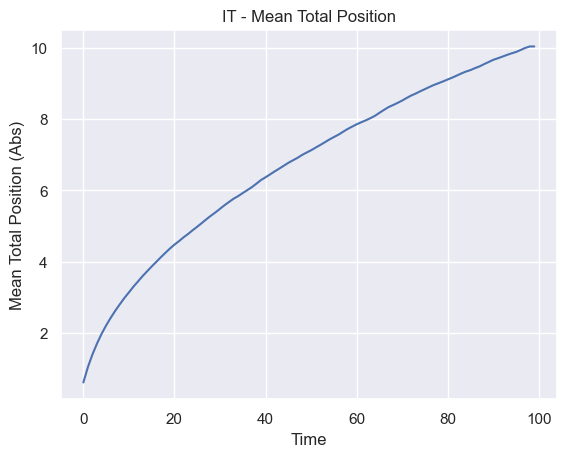

In [109]:
plt.plot(np.arange(0,T), mean_total_positions_IT_2)
plt.xlabel("Time")
plt.ylabel("Mean Total Position (Abs)")
plt.title("IT - Mean Total Position")
plt.show()

**Autocovariance Plot**

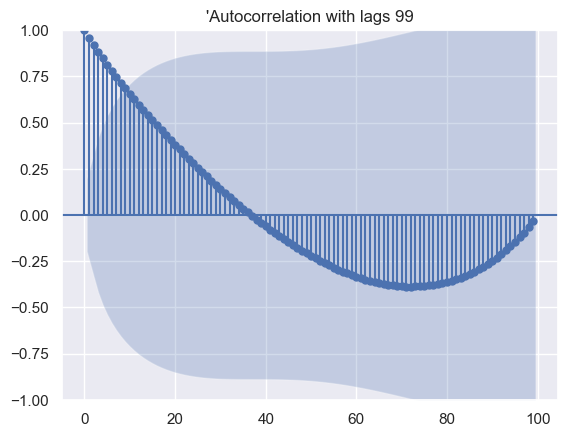

In [110]:
lags = [99]
for l in lags:
    titles = "'Autocorrelation with lags "+ str(l)
    smt.graphics.tsa.plot_acf(mean_total_positions_IT_2,lags=l,alpha=0.05,title=titles)

**Simulating the MM's Order Flow**

In [248]:
total_order_flow = return_total_order_flow(D_MU, D_TGT, dividends_flow, target_portfolio_order_flow)

MM_order_flow_matrix = np.zeros((T,number_of_simulations))

for time in range(0,T):
    for simulation in range(0, number_of_simulations):
        MM_order_flow_matrix[time,simulation] = total_order_flow[time][simulation]

In [112]:
##MM_order_flow_matrix = IT_order_flow_matrix + NT_order_flow_matrix 

total_positions_MM = []

for simulation in range(0, number_of_simulations):
    total_positions_MM.append(np.cumsum(MM_order_flow_matrix[:,simulation]))
        
mean_total_positions_MM = []

for time in range(0,T):
    cummulated_position_current_time = 0.0
    for simulation in range(0, number_of_simulations):
        cummulated_position_current_time += total_positions_MM[simulation][time]
    mean_position_current_time = cummulated_position_current_time/number_of_simulations
    mean_total_positions_MM.append(mean_position_current_time)




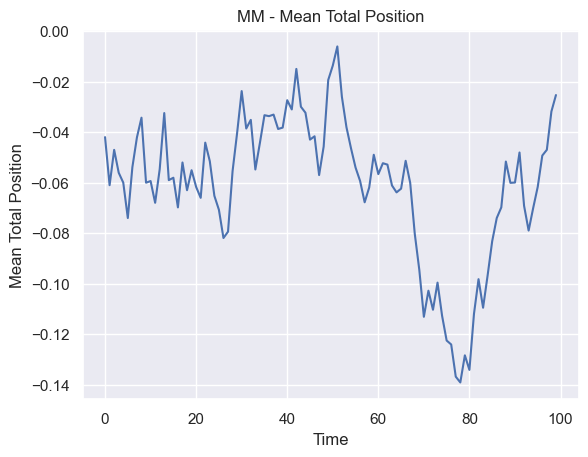

In [113]:
plt.plot(np.arange(0,T), mean_total_positions_MM)
plt.xlabel("Time")
plt.ylabel("Mean Total Position")
plt.title("MM - Mean Total Position")
plt.show()

In [114]:
total_positions_MM_2 = []

for simulation in range(0, number_of_simulations):
    total_positions_MM_2.append(np.abs(np.cumsum(MM_order_flow_matrix[:,simulation])))
        
mean_total_positions_MM_2 = []

for time in range(0,T):
    cummulated_position_current_time = 0.0
    for simulation in range(0, number_of_simulations):
        cummulated_position_current_time += total_positions_MM_2[simulation][time]
    mean_position_current_time = cummulated_position_current_time/number_of_simulations
    mean_total_positions_MM_2.append(mean_position_current_time)

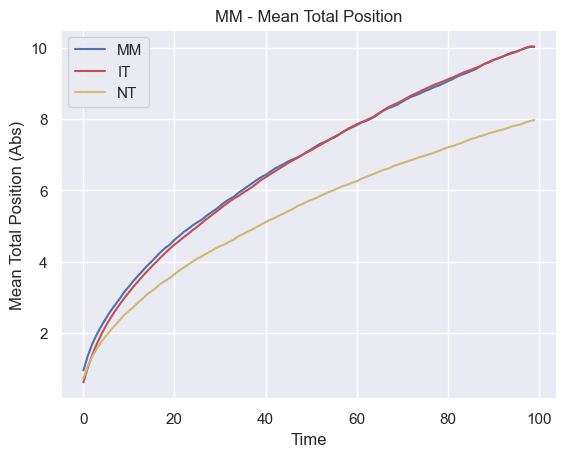

In [116]:
plt.plot(np.arange(0,T), mean_total_positions_MM_2, color = "b", label = "MM")
plt.plot(np.arange(0,T), mean_total_positions_IT_2, color = "r", label = "IT")
plt.plot(np.arange(0,T), mean_total_positions_NT_2, color = "y", label = "NT")
plt.xlabel("Time")
plt.ylabel("Mean Total Position (Abs)")
plt.title("MM - Mean Total Position")
plt.legend()
plt.show()

**Autocovariance Plot**

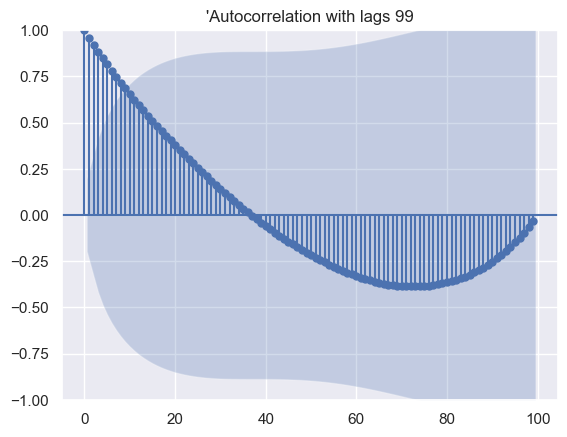

In [117]:
lags = [99]
for l in lags:
    titles = "'Autocorrelation with lags "+ str(l)
    smt.graphics.tsa.plot_acf(mean_total_positions_MM_2,lags=l,alpha=0.05,title=titles)

**A second trial for a total position metric: $Q_{total}^{2}(t) = (\sum_{i = 0}^{t} q_{t})(\sum_{k = 0}^{t} q_{k})$**

In [43]:
def alternative_total_position(order_flow, number_of_simulations, T):
    
    cum_sum_order_flow = []
    
    for sim in range (0,number_of_simulations):
        cum_sum_order_flow.append(np.cumsum(order_flow[:,sim]))

    mean_cum_sum_order_flow = []
    
    for time in range(0,T):
        time_t_mean = 0.0
        for sim in range(0,number_of_simulations):
            time_t_mean += cum_sum_order_flow[sim][time]
        time_t_mean /= number_of_simulations
        mean_cum_sum_order_flow.append(time_t_mean)
        
    return np.square(np.array(mean_cum_sum_order_flow))

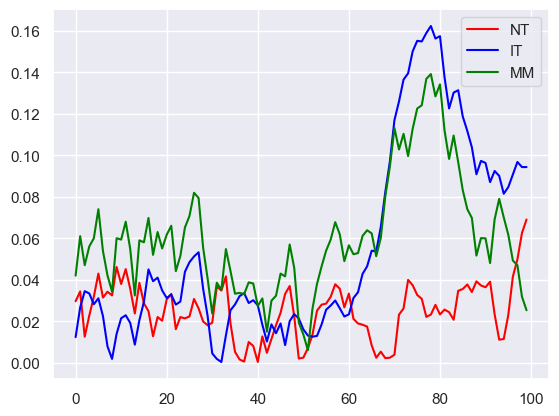

In [119]:
plt.plot(np.sqrt(alternative_total_position(NT_order_flow, number_of_simulations, T)), label = "NT", c = "red")
plt.plot(np.sqrt(alternative_total_position(IT_order_flow, number_of_simulations, T)), label = "IT", c = "blue")
plt.plot(np.sqrt(alternative_total_position(total_order_flow, number_of_simulations, T)), label = "MM", c = "green")
plt.legend()
plt.show()

**Generating the price series**

In [120]:
price_simulations = return_price_series(total_order_flow, G)

**Generating the fundamental price series**

In [121]:
fundamental_price_simulations = return_fundamental_price_series(dividends_flow, tau_MU)

**Generating IT's estimated price**

In [122]:
IT_estimated_price_simulations = return_IT_estimated_price_series(dividends_flow, tau_MU)

**Plotting price series**

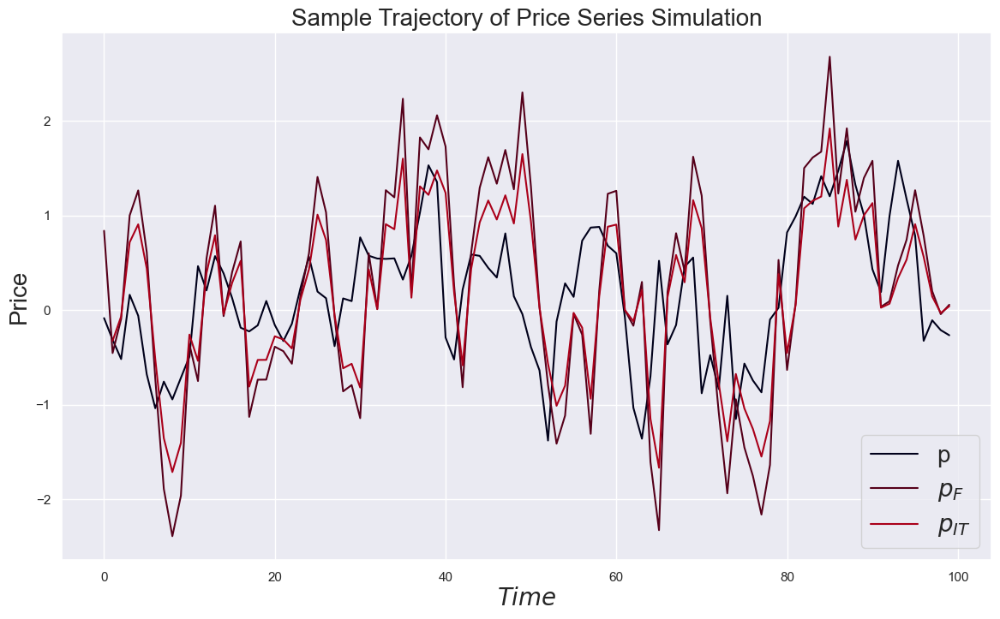

In [126]:
figure25 = plt.figure(figsize = (14,8))
colors = [color_conv(0), color_conv(1/3), color_conv(2/3)]
plt.plot(np.arange(0,T), price_simulations[:, 2], label = "p", color = colors[0])
plt.plot(np.arange(0,T), fundamental_price_simulations[:,2], label = r"$p_{F}$", color = colors[1])
plt.plot(np.arange(1,T), IT_estimated_price_simulations[:,2], label = r"$p_{IT}$", color = colors[2])
plt.xlabel(r"$Time$", fontsize = 20)
plt.ylabel("Price", fontsize = 20)
plt.legend(loc = 4, prop={'size': 20})
plt.title("Sample Trajectory of Price Series Simulation", fontsize = 20)
plt.show()

**Mean return analyzer**

In [38]:
def return_mean_gain(order_flow, price_simulations, fundamental_price_simulations):
    number_of_simulations = price_simulations.shape[1]
    
    order_flow = pd.DataFrame(order_flow)
    delta_price = pd.DataFrame(price_simulations - fundamental_price_simulations )

    cash_flow = pd.DataFrame(order_flow*delta_price)
    
    avg_cash = 0
    for i in range(0,number_of_simulations):
        avg_cash += cash_flow[i][:].mean()/number_of_simulations
        
    return -1*avg_cash 

**Analyzing Agents' Gains<br/><br/>**
$\langle gain_{MM} \rangle = -\langle q_t(p_t - p^F_t) \rangle$<br/><br/>
$\langle gain_{NT} \rangle = -\langle q_t^{NT}(p_t - p^F_t) \rangle$<br/><br/>
$\langle gain_{IT} \rangle = -\langle q_t^{IT}(p_t - p^F_t) \rangle$

**Is the MM's gain really zero ? Let's run more simulations..**

In [129]:
number_of_gains = 20
list_of_MM_mean_returns = []
list_of_NT_mean_returns = []
list_of_IT_mean_returns = []
number_of_simulations = 6000

for i in range(0, number_of_gains):
    dividends_flow = generate_order_flow(ACF_MU, number_of_simulations)
    target_portfolio_order_flow = generate_order_flow(ACF_TGT, number_of_simulations)
    NT_order_flow = return_NT_order_flow(D_MU_NT, D_TGT_NT, dividends_flow, target_portfolio_order_flow)
    IT_order_flow = return_IT_order_flow(D_MU_IT, D_TGT_IT, dividends_flow, target_portfolio_order_flow)
    total_order_flow = return_total_order_flow(D_MU, D_TGT, dividends_flow, target_portfolio_order_flow)
    price_simulations = return_price_series(total_order_flow, G)
    fundamental_price_simulations = return_fundamental_price_series(dividends_flow, tau_MU)
    list_of_MM_mean_returns.append(return_mean_gain(total_order_flow, price_simulations, fundamental_price_simulations))
    list_of_NT_mean_returns.append(return_mean_gain(NT_order_flow , price_simulations, fundamental_price_simulations))
    list_of_IT_mean_returns.append(return_mean_gain(IT_order_flow , price_simulations, fundamental_price_simulations))

final_MM_mean_return =  np.mean(list_of_MM_mean_returns)
print(f"The mean of MM's gain for all simulations is {final_MM_mean_return}\n\n")

final_NT_mean_return =  np.mean(list_of_NT_mean_returns)
print(f"The mean of NT's gain for all simulations is {final_NT_mean_return}\n\n")

final_IT_mean_return =  np.mean(list_of_IT_mean_returns)
print(f"The mean of IT's gain for all simulations is {final_IT_mean_return}\n\n")

The mean of MM's gain for all simulations is -0.002064139228213615


The mean of NT's gain for all simulations is -0.39294935527688846


The mean of IT's gain for all simulations is 0.39088521604867493




**Mean Market Maker's Gain**

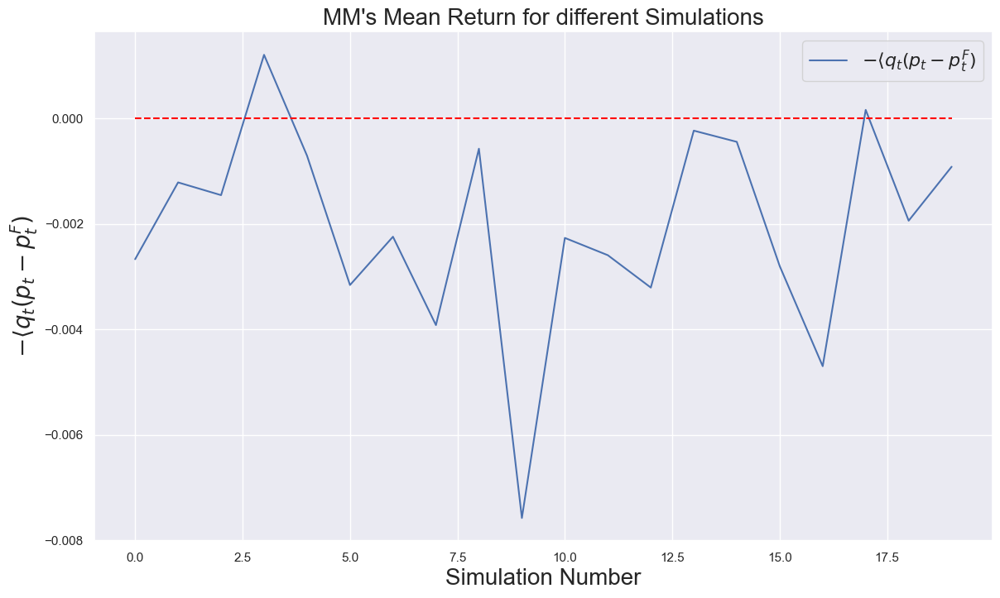

In [131]:
figure26 = plt.figure(figsize = (14,8))
plt.plot(np.arange(0,number_of_gains), list_of_MM_mean_returns, label = r"$-\langle q_t(p_t - p^F_t)$")
plt.plot(np.arange(0,number_of_gains), np.zeros(number_of_gains), color='red', linestyle='dashed',
     markerfacecolor='red')
plt.xlabel("Simulation Number", fontsize = 20)
plt.ylabel(r"$-\langle q_t(p_t - p^F_t)$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 16})
plt.title("MM's Mean Return for different Simulations", fontsize = 20)
plt.show()

**Mean Noise Trader's Gain**

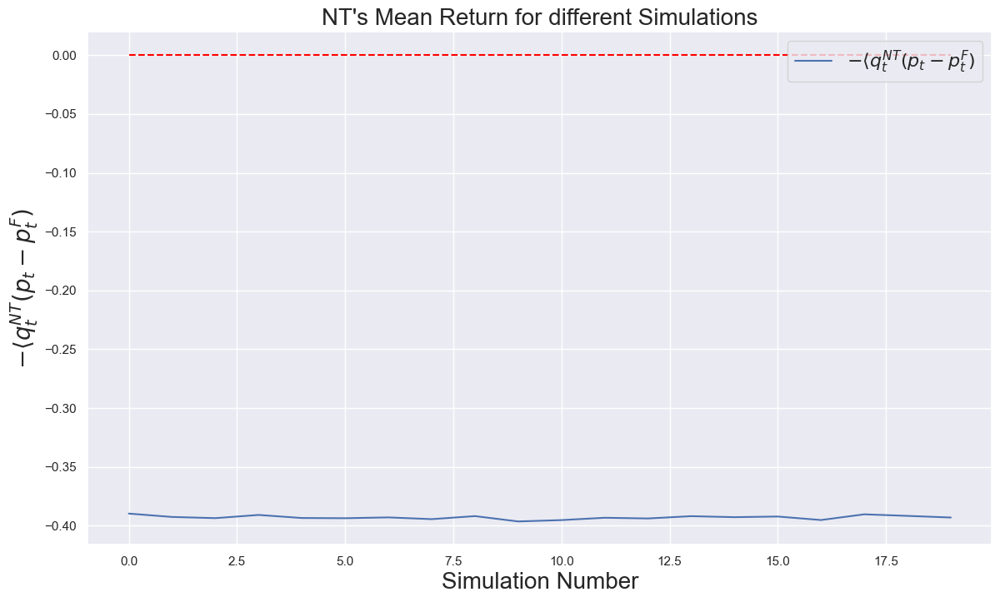

In [132]:
figure27 = plt.figure(figsize = (14,8))
plt.plot(np.arange(0,number_of_gains), list_of_NT_mean_returns, label = r"$-\langle q_t^{NT}(p_t - p^F_t)$")
plt.plot(np.arange(0,number_of_gains), np.zeros(number_of_gains), color='red', linestyle='dashed',
     markerfacecolor='red')
plt.xlabel("Simulation Number", fontsize = 20)
plt.ylabel(r"$-\langle q_t^{NT}(p_t - p^F_t)$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 16})
plt.title("NT's Mean Return for different Simulations", fontsize = 20)
plt.show()

**Mean Informed Trader's Gain**

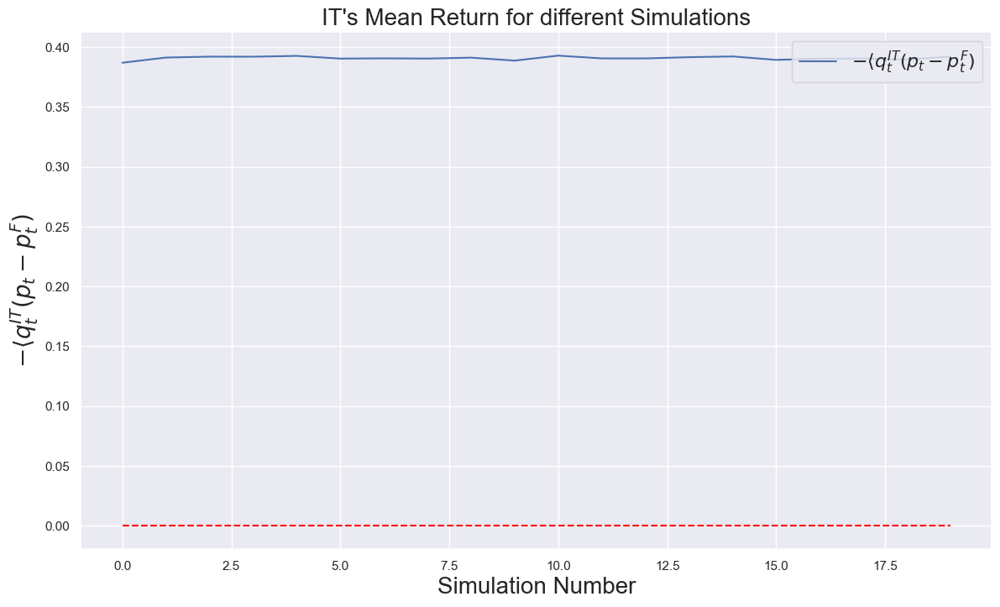

In [133]:
figure28 = plt.figure(figsize = (14,8))
plt.plot(np.arange(0,number_of_gains), list_of_IT_mean_returns, label = r"$-\langle q_t^{IT}(p_t - p^F_t)$")
plt.plot(np.arange(0,number_of_gains), np.zeros(number_of_gains), color='red', linestyle='dashed',
     markerfacecolor='red')
plt.xlabel("Simulation Number", fontsize = 20)
plt.ylabel(r"$-\langle q_t^{IT}(p_t - p^F_t)$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 16})
plt.title("IT's Mean Return for different Simulations", fontsize = 20)
plt.show()

## Implementing a Tracking Error Measure - $\phi_{t} =  \langle (Q_{t}^{NT} - Q_{t}^{tgt})^{2} \rangle$ 

In [39]:
import statsmodels.api as sm

def get_halflife(z):
    z_array = np.array(z)
    z_lag = np.roll(z_array,1)
    z_lag[0] = 0
    z_ret = z_array - z_lag
    z_ret[0] = 0

    #adds intercept terms to X variable for regression
    z_lag2 = sm.add_constant(z_lag)

    model = sm.OLS(z_ret,z_lag2)
    res = model.fit()

    halflife = -log(2) / res.params[1]
    return(halflife)

In [40]:
def return_phi_t_and_total_positions_information(NT_order_flow, IT_order_flow, total_order_flow, target_portfolio_order_flow):
    T = NT_order_flow.shape[0]
    number_of_simulations = NT_order_flow.shape[1]
    
    phi_matrix = np.zeros((T, number_of_simulations))
    NT_target_deviation_half_life = np.zeros(number_of_simulations)
    tracking_error_var = np.zeros(number_of_simulations)
    tracking_error_mean = np.zeros(number_of_simulations)
    NT_target_deviation_var = np.zeros(number_of_simulations)
    NT_target_deviation_mean = np.zeros(number_of_simulations)
    market_maker_total_position_matrix = np.zeros((T, number_of_simulations)) 
    noise_trader_total_position_matrix = np.zeros((T, number_of_simulations))
    informed_trader_total_position_matrix = np.zeros((T, number_of_simulations)) 
    target_portfolio_total_position_matrix = np.zeros((T, number_of_simulations))
    
    
    for i in range(0,T):
        for j in range(0, number_of_simulations):
            market_maker_total_position_matrix[i,j] = np.sum(total_order_flow[i:,j])
            informed_trader_total_position_matrix[i,j] = np.sum(IT_order_flow[i:,j]) 
            noise_trader_total_position_matrix[i,j] = np.sum(NT_order_flow[i:,j]) 
            target_portfolio_total_position_matrix[i,j] = np.sum(target_portfolio_order_flow[i:,j])
            phi_matrix[i,j] = (noise_trader_total_position_matrix[i,j] - target_portfolio_total_position_matrix[i,j])**2
            
    for i in range(0, number_of_simulations):
            tracking_error_mean[i] = np.mean(phi_matrix[:,i])
            tracking_error_var[i] = np.var(phi_matrix[:,i])
            NT_target_deviation_half_life[i] = get_halflife(noise_trader_total_position_matrix[:,i] - target_portfolio_total_position_matrix[:,i])
            NT_target_deviation_var[i] = np.var(noise_trader_total_position_matrix[:,i] - target_portfolio_total_position_matrix[:,i])
            NT_target_deviation_mean[i] = np.mean(noise_trader_total_position_matrix[:,i] - target_portfolio_total_position_matrix[:,i])
    
    mean_NT_target_deviation_half_life = np.mean(NT_target_deviation_half_life)
    mean_NT_target_deviation_var = np.mean(NT_target_deviation_var)
    mean_NT_target_deviation_mean = np.mean(NT_target_deviation_mean)
    mean_tracking_error_mean = np.mean(tracking_error_mean)
    mean_tracking_error_var = np.mean(tracking_error_var)
    
    phi_t = np.zeros(T)
    noise_trader_total_position_t = np.zeros(T)
    target_portfolio_total_position_t = np.zeros(T)
    informed_trader_total_position_t = np.zeros(T)
    market_maker_total_position_t = np.zeros(T)
    var_noise_trader_total_position_t = np.zeros(T)
    var_target_portfolio_total_position_t = np.zeros(T)
    var_informed_trader_total_position_t = np.zeros(T)
    var_market_maker_total_position_t = np.zeros(T)
    
    for i in range(0, T):
        phi_t[i] = np.mean(phi_matrix[i,:])
        noise_trader_total_position_t[i] = np.mean(noise_trader_total_position_matrix[i,:])
        target_portfolio_total_position_t[i] = np.mean(target_portfolio_total_position_matrix[i,:])
        market_maker_total_position_t[i] = np.mean(market_maker_total_position_matrix[i, :])
        informed_trader_total_position_t[i] = np.mean(informed_trader_total_position_matrix[i,:])
        var_noise_trader_total_position_t[i] = np.var(noise_trader_total_position_matrix[i,:])
        var_target_portfolio_total_position_t[i] = np.var(target_portfolio_total_position_matrix[i,:])
        var_informed_trader_total_position_t[i] = np.var(informed_trader_total_position_matrix[i,:])
        var_market_maker_total_position_t[i] = np.var(market_maker_total_position_matrix[i, :])

        
    return phi_t[::-1], noise_trader_total_position_t[::-1], target_portfolio_total_position_t[::-1], informed_trader_total_position_t[::-1], market_maker_total_position_t[::-1], var_noise_trader_total_position_t[::-1], var_target_portfolio_total_position_t[::-1], var_informed_trader_total_position_t[::-1], var_market_maker_total_position_t[::-1], market_maker_total_position_matrix, noise_trader_total_position_matrix, informed_trader_total_position_matrix, target_portfolio_total_position_matrix, mean_NT_target_deviation_half_life, mean_NT_target_deviation_var, mean_NT_target_deviation_mean, mean_tracking_error_var, mean_tracking_error_mean 


## Simulating the Market for different $\alpha$

**Auxiliary function to evaluate the mean / variance of a price series at the different instants of time**

In [41]:
def return_price_variance_t(price_series):
    T = price_series.shape[0]
    
    var_price_series_t = np.zeros(T) 
    
    for i in range(0,T):
        var_price_series_t[i] = np.var(price_series[i,:])
        
    return var_price_series_t[::-1]

In [42]:
def return_price_mean_t(price_series):
    T = price_series.shape[0]
    
    mean_price_series_t = np.zeros(T) 
    
    for i in range(0,T):
        mean_price_series_t[i] = np.mean(price_series[i,:])
        
    return mean_price_series_t[::-1]

In [43]:
def return_series_lagged_correlation(series1, series2, number_of_simulations, lags):
    
    lagged_correlations = []
    
    for lag in range(0,lags):
        current_lag_correlations = []
        for simulation in range(0,number_of_simulations):
            if(lag != 0):
                current_lag_correlations.append(scipy.stats.pearsonr(pd.DataFrame(series1).iloc[:-lag,simulation], pd.DataFrame(series2).iloc[:,simulation].shift(lag)[lag:])[0])
            else:
                current_lag_correlations.append(scipy.stats.pearsonr(pd.DataFrame(series1).iloc[:,simulation], pd.DataFrame(series2).iloc[:,simulation])[0])

        lagged_correlations.append(np.mean(current_lag_correlations))
            
    return lagged_correlations

In [44]:
import scipy.stats

def simulate_market_for_different_alphas_and_taus(tau_mu_min, tau_mu_max, tau_min, tau_max, alpha_min, alpha_max, number_of_points, number_of_simulations):
    
    #Defining fixed parameters for the solver
    T = 100
    T_it = 100
    Var_TGT = 1
    ACF_TGT = Var_TGT*np.identity(T) ## Var_tgt is a white noise process
    G_0_seed = 1
    alpha_G = 0.5
    seed_type = "mark"
    C_NT_0 = 1
    tau_NT = 1
    C_IT_0 = 1
    tau_IT = 1
    bound_for_convergence = 0.00001
    taus_MU = np.linspace(tau_mu_min, tau_mu_max, number_of_points)
    #tau_MU = 3
    #cte = np.exp(-1/tau_MU)
    #C_MU_0 = ((1 - cte)/(cte))**2
    #ACF_MU = return_Markovian_ACF(C_MU_0, tau_MU, T)
    
    #Lists for storing results
    alpha_vector = np.linspace(alpha_min, alpha_max, number_of_points)
    tau_vector = np.linspace(tau_min, tau_max, number_of_points)
    
    phi_t_vector = []
    propagators = []
    price_simulations_list = []
    fundamental_price_simulations_list = []
    noise_trader_total_position_t = []
    target_portfolio_total_position_t = []
    market_maker_total_position_t = []
    informed_trader_total_position_t = []
    std_NT_order_flow = []
    std_IT_order_flow = []
    std_total_order_flow = []
    std_tgt_order_flow = []
    cor_IT_NT_order_flow = []
    cor_IT_MM_order_flow = []
    cor_NT_MM_order_flow = []
    cor_IT_mu_order_flow = []
    cor_NT_mu_order_flow = []
    cor_NT_tgt_order_flow = []
    var_noise_trader_total_position_t = []
    var_informed_trader_total_position_t = []
    var_market_maker_total_position_t = []
    var_target_portfolio_total_position_t = []
    mean_price_t = []
    var_price_t = []
    var_IT_estimated_price_t = []
    MM_order_flows = []
    NT_order_flows = []
    IT_order_flows = []
    tgt_order_flows = []
    MM_total_position_simulations = []
    NT_total_position_simulations = []
    IT_total_position_simulations = []
    target_portfolio_total_position_simulations = []
    MM_mean_gain_vector = []
    NT_mean_gain_vector = []
    IT_mean_gain_vector = []
    ACFs_NT = []
    ACFs_IT = []
    ACFs_Q = []
    ACFs_MU = []
    ACFs_P = []
    var_MM_flow = []
    var_IT_flow = []
    var_NT_flow = []
    var_NT_informed = []
    var_IT_informed = []
    var_NT_stochastic = []
    var_IT_stochastic = []
    var_ratio_NT_informed_total = []
    var_ratio_IT_informed_total = []
    scaled_var_ratio_NT_informed_total = []
    scaled_var_ratio_IT_informed_total = []
    scaled_var_ratio_NT_stochastic_total = []
    scaled_var_ratio_IT_stochastic_total = []
    NT_target_deviation_half_life = []
    NT_target_deviation_var = []
    NT_target_deviation_mean = []
    tracking_error_var = []
    tracking_error_mean = []
    
    #for j in range(0, number_of_points):
            
        #tau = tau_vector[j]
            
    for i in range(0, number_of_points):

            tau = tau_vector[i]
            tau_MU = taus_MU[i]
            
            cte = np.exp(-1/tau_MU)
            C_MU_0 = ((1 - cte)/(cte))**2
            ACF_MU = return_Markovian_ACF(C_MU_0, tau_MU, T)
            
            numerical_solution = numerical_solver_simulation(T, T_it, G_0_seed, alpha_G, alpha_vector[i], C_MU_0, tau_MU, ACF_TGT, seed_type, C_NT_0, 
                                    tau_NT, C_IT_0, tau_IT,tau, _ , bound_for_convergence)

            G = numerical_solution[0]
            
            propagators.append(G)

            ACFs_NT.append(numerical_solution[4])
            ACFs_IT.append(numerical_solution[5])
            ACFs_Q.append(numerical_solution[6])
            ACFs_MU.append(numerical_solution[7])
            ACFs_P.append(numerical_solution[8])

            D_MU = numerical_solution[3][-1][0]
            D_TGT =  numerical_solution[3][-1][1]
            D_MU_NT =  numerical_solution[3][-1][2]
            D_TGT_NT =  numerical_solution[3][-1][3] 
            D_MU_IT =  numerical_solution[3][-1][4]
            D_TGT_IT =  numerical_solution[3][-1][5]
            
            dividends_flow = generate_order_flow(ACF_MU, number_of_simulations)
            target_portfolio_order_flow = generate_order_flow(ACF_TGT, number_of_simulations)
            NT_order_flow = return_NT_order_flow(D_MU_NT, D_TGT_NT, dividends_flow, target_portfolio_order_flow)
            NT_informed_flow = return_informed_order_flow(D_MU_NT, dividends_flow)
            NT_stochastic_flow = return_stochastic_order_flow(D_TGT_NT, target_portfolio_order_flow)
            IT_informed_flow = return_informed_order_flow(D_MU_IT, dividends_flow)
            IT_order_flow = return_IT_order_flow(D_MU_IT, D_TGT_IT, dividends_flow, target_portfolio_order_flow)
            IT_stochastic_flow = return_stochastic_order_flow(D_TGT_IT, target_portfolio_order_flow)
            total_order_flow = return_total_order_flow(D_MU, D_TGT, dividends_flow, target_portfolio_order_flow)
 
            MM_order_flows.append(total_order_flow)
            IT_order_flows.append(IT_order_flow)
            NT_order_flows.append(NT_order_flow)
            tgt_order_flows.append(total_order_flow)

            current_var_MM_flow = []
            current_var_IT_flow = []
            current_var_NT_flow = []
            current_alpha_std_NT_order_flow = []
            current_alpha_std_IT_order_flow = []
            current_alpha_std_total_order_flow = []
            current_alpha_std_tgt_order_flow = []
            current_alpha_cor_IT_NT_flow = []
            current_alpha_cor_IT_MM_flow = []
            current_alpha_cor_NT_MM_flow = []
            current_alpha_cor_IT_mu_flow = []
            current_alpha_cor_NT_tgt_flow = []
            current_alpha_cor_NT_mu_flow = []
            current_var_ratio_NT_informed_total = []
            current_var_ratio_IT_informed_total = []
            current_scaled_var_ratio_IT_informed_total = []
            current_scaled_var_ratio_NT_informed_total = []
            current_scaled_var_ratio_NT_stochastic_total = []
            current_scaled_var_ratio_IT_stochastic_total = []
            current_var_NT_informed = []
            current_var_IT_informed = []
            current_var_NT_stochastic = []
            current_var_IT_stochastic = []

            for simulation in range(0, number_of_simulations):
                current_alpha_std_NT_order_flow.append(np.std(NT_order_flow[:,simulation]))
                current_alpha_std_IT_order_flow.append(np.std(IT_order_flow[:,simulation]))
                current_alpha_std_total_order_flow.append(np.std(total_order_flow[:,simulation]))
                current_alpha_std_tgt_order_flow.append(np.std(target_portfolio_order_flow[:,simulation]))
                current_alpha_cor_IT_NT_flow.append(scipy.stats.pearsonr(IT_order_flow[:,simulation], NT_order_flow[:,simulation])[0])
                current_alpha_cor_IT_MM_flow.append(scipy.stats.pearsonr(IT_order_flow[:,simulation], total_order_flow[:,simulation])[0])
                current_alpha_cor_NT_MM_flow.append(scipy.stats.pearsonr(NT_order_flow[:,simulation], total_order_flow[:,simulation])[0])
                current_alpha_cor_IT_mu_flow.append(scipy.stats.pearsonr(IT_order_flow[:,simulation], dividends_flow[:,simulation])[0])
                current_alpha_cor_NT_tgt_flow.append(scipy.stats.pearsonr(NT_order_flow[:,simulation], target_portfolio_order_flow[:,simulation])[0])
                current_alpha_cor_NT_mu_flow.append(scipy.stats.pearsonr(NT_order_flow[:,simulation], dividends_flow[:,simulation])[0])
                current_var_ratio_NT_informed_total.append(np.var(NT_informed_flow[:,simulation])/(np.var(NT_stochastic_flow[:,simulation]) + np.var(NT_stochastic_flow[:,simulation])))
                current_var_ratio_IT_informed_total.append(np.var(IT_informed_flow[:,simulation])/(np.var(IT_stochastic_flow[:,simulation]) + np.var(IT_informed_flow[:,simulation])))
                current_scaled_var_ratio_IT_informed_total.append(np.var(IT_informed_flow[:,simulation])/(np.var(IT_informed_flow[:,simulation]) + np.var(NT_informed_flow[:,simulation])))
                current_scaled_var_ratio_NT_informed_total.append(np.var(NT_informed_flow[:,simulation])/(np.var(IT_informed_flow[:,simulation]) + np.var(NT_informed_flow[:,simulation])))
                current_scaled_var_ratio_IT_stochastic_total.append(np.var(IT_stochastic_flow[:,simulation])/(np.var(IT_stochastic_flow[:,simulation]) + np.var(NT_stochastic_flow[:,simulation])))
                current_scaled_var_ratio_NT_stochastic_total.append(np.var(NT_stochastic_flow[:,simulation])/(np.var(IT_stochastic_flow[:,simulation]) + np.var(NT_stochastic_flow[:,simulation])))
                current_var_NT_informed.append(np.var(NT_informed_flow[:,simulation]))
                current_var_IT_informed.append(np.var(IT_informed_flow[:,simulation]))
                current_var_NT_stochastic.append(np.var(NT_stochastic_flow[:,simulation])) 
                current_var_IT_stochastic.append(np.var(IT_stochastic_flow[:,simulation])) 
                current_var_MM_flow.append(np.var(total_order_flow[:,simulation]))
                current_var_IT_flow.append(np.var(IT_order_flow[:,simulation]))
                current_var_NT_flow.append(np.var(NT_order_flow[:,simulation]))
                                    
            current_alpha_std_NT_order_flow = np.mean(current_alpha_std_NT_order_flow)
            current_alpha_std_IT_order_flow = np.mean(current_alpha_std_IT_order_flow)
            current_alpha_std_total_order_flow = np.mean(current_alpha_std_total_order_flow)
            current_alpha_std_tgt_order_flow = np.mean(current_alpha_std_tgt_order_flow)
            current_alpha_cor_IT_NT_flow = np.mean(current_alpha_cor_IT_NT_flow)
            current_alpha_cor_IT_MM_flow = np.mean(current_alpha_cor_IT_MM_flow)
            current_alpha_cor_NT_MM_flow = np.mean(current_alpha_cor_NT_MM_flow)
            current_alpha_cor_IT_mu_flow = np.mean(current_alpha_cor_IT_mu_flow)
            current_alpha_cor_NT_mu_flow = np.mean(current_alpha_cor_NT_mu_flow)
            current_alpha_cor_NT_tgt_flow = np.mean(current_alpha_cor_NT_tgt_flow)
            current_var_ratio_NT_informed_total = np.mean(current_var_ratio_NT_informed_total)
            current_var_ratio_IT_informed_total = np.mean(current_var_ratio_IT_informed_total)
            current_scaled_var_ratio_IT_informed_total = np.mean(current_scaled_var_ratio_IT_informed_total)
            current_scaled_var_ratio_NT_informed_total = np.mean(current_scaled_var_ratio_NT_informed_total)
            current_scaled_var_ratio_IT_stochastic_total = np.mean(current_scaled_var_ratio_IT_stochastic_total)
            current_scaled_var_ratio_NT_stochastic_total = np.mean(current_scaled_var_ratio_NT_stochastic_total)
            current_var_NT_informed = np.mean(current_var_NT_informed)
            current_var_IT_informed = np.mean(current_var_IT_informed)
            current_var_NT_stochastic = np.mean(current_var_NT_stochastic)
            current_var_IT_stochastic = np.mean(current_var_IT_stochastic)
            current_var_MM_flow = np.mean(current_var_MM_flow)
            current_var_IT_flow = np.mean(current_var_IT_flow)
            current_var_NT_flow = np.mean(current_var_NT_flow)
            
            var_NT_informed.append(current_var_NT_informed)
            var_IT_informed.append(current_var_IT_informed)
            var_NT_stochastic.append(current_var_NT_stochastic)
            var_IT_stochastic.append(current_var_IT_stochastic)
            var_MM_flow.append(current_var_MM_flow)
            var_IT_flow.append(current_var_IT_flow)
            var_NT_flow.append(current_var_NT_flow)
            
            var_ratio_NT_informed_total.append(current_var_ratio_NT_informed_total)
            var_ratio_IT_informed_total.append(current_var_ratio_IT_informed_total)
            
            scaled_var_ratio_IT_informed_total.append(current_scaled_var_ratio_IT_informed_total)
            scaled_var_ratio_NT_informed_total.append(current_scaled_var_ratio_NT_informed_total)
            scaled_var_ratio_IT_stochastic_total.append(current_scaled_var_ratio_IT_stochastic_total)
            scaled_var_ratio_NT_stochastic_total.append(current_scaled_var_ratio_NT_stochastic_total)

            std_NT_order_flow.append(current_alpha_std_NT_order_flow)
            std_IT_order_flow.append(current_alpha_std_IT_order_flow)
            std_total_order_flow.append(current_alpha_std_total_order_flow)
            std_tgt_order_flow.append(current_alpha_std_tgt_order_flow)
            
            cor_IT_NT_order_flow.append(current_alpha_cor_IT_NT_flow)
            cor_IT_MM_order_flow.append(current_alpha_cor_IT_MM_flow)
            cor_NT_MM_order_flow.append(current_alpha_cor_NT_MM_flow)
            cor_IT_mu_order_flow.append(current_alpha_cor_IT_mu_flow)
            cor_NT_mu_order_flow.append(current_alpha_cor_NT_mu_flow)
            cor_NT_tgt_order_flow.append(current_alpha_cor_NT_tgt_flow)

            price_simulations = return_price_series(total_order_flow, G)
            price_simulations_list.append(price_simulations)
            fundamental_price_simulations = return_fundamental_price_series(dividends_flow, tau_MU)
            fundamental_price_simulations_list.append(fundamental_price_simulations)
            IT_estimated_price_simulations = return_IT_estimated_price_series(dividends_flow, tau_MU)
            mean_price_t.append(return_price_mean_t(price_simulations))
            var_price_t.append(return_price_variance_t(price_simulations))
            var_IT_estimated_price_t.append(return_price_variance_t(IT_estimated_price_simulations))
            result_phi_and_total_positions_information = return_phi_t_and_total_positions_information(NT_order_flow, IT_order_flow, total_order_flow, target_portfolio_order_flow)
            phi_t_vector.append(result_phi_and_total_positions_information[0])
            noise_trader_total_position_t.append(result_phi_and_total_positions_information[1])
            target_portfolio_total_position_t.append(result_phi_and_total_positions_information[2])
            informed_trader_total_position_t.append(result_phi_and_total_positions_information[3])
            market_maker_total_position_t.append(result_phi_and_total_positions_information[4])
            var_noise_trader_total_position_t.append(result_phi_and_total_positions_information[5])
            var_target_portfolio_total_position_t.append(result_phi_and_total_positions_information[6])
            var_informed_trader_total_position_t.append(result_phi_and_total_positions_information[7])
            var_market_maker_total_position_t.append(result_phi_and_total_positions_information[8])
            MM_total_position_simulations.append(result_phi_and_total_positions_information[9])
            NT_total_position_simulations.append(result_phi_and_total_positions_information[10])
            IT_total_position_simulations.append(result_phi_and_total_positions_information[11])
            target_portfolio_total_position_simulations.append(result_phi_and_total_positions_information[12])
            NT_target_deviation_half_life.append(result_phi_and_total_positions_information[13])
            NT_target_deviation_var.append(result_phi_and_total_positions_information[14])
            NT_target_deviation_mean.append(result_phi_and_total_positions_information[15])
            tracking_error_var.append(result_phi_and_total_positions_information[16])
            tracking_error_mean.append(result_phi_and_total_positions_information[17])
            MM_mean_gain_vector.append(return_mean_gain(total_order_flow, price_simulations, fundamental_price_simulations)) 
            NT_mean_gain_vector.append(return_mean_gain(NT_order_flow, price_simulations, fundamental_price_simulations)) 
            IT_mean_gain_vector.append(return_mean_gain(IT_order_flow, price_simulations, fundamental_price_simulations))
            print(f"Finished test for Tau MU = {taus_MU[i]}\n")
            print(f"Finished test for alpha = {alpha_vector[i]}\n")
            print(f"Finished test for tau = {tau_vector[i]}\n")
        
       # print(f"Finished test for tau = {tau_vector[j]}\n")
        
    return phi_t_vector, noise_trader_total_position_t, target_portfolio_total_position_t, informed_trader_total_position_t, market_maker_total_position_t, var_noise_trader_total_position_t, var_target_portfolio_total_position_t, var_informed_trader_total_position_t, var_market_maker_total_position_t, MM_mean_gain_vector, NT_mean_gain_vector, IT_mean_gain_vector, alpha_vector, var_price_t, var_IT_estimated_price_t, ACFs_NT, ACFs_IT, ACFs_Q, ACFs_MU, ACFs_P, std_NT_order_flow, std_IT_order_flow, std_total_order_flow, tau_vector, cor_IT_NT_order_flow, cor_IT_MM_order_flow, cor_NT_MM_order_flow, cor_IT_mu_order_flow, cor_NT_tgt_order_flow, cor_NT_mu_order_flow, var_ratio_NT_informed_total, var_ratio_IT_informed_total, scaled_var_ratio_NT_informed_total, scaled_var_ratio_IT_informed_total, scaled_var_ratio_NT_stochastic_total, scaled_var_ratio_IT_stochastic_total, var_NT_informed, var_IT_informed, var_NT_stochastic, var_IT_stochastic, var_MM_flow, var_NT_flow, var_IT_flow, propagators, mean_price_t, MM_order_flows, NT_order_flows, IT_order_flows, MM_total_position_simulations, NT_total_position_simulations, IT_total_position_simulations, target_portfolio_total_position_simulations, price_simulations_list, NT_target_deviation_half_life, NT_target_deviation_var, NT_target_deviation_mean, tracking_error_var, tracking_error_mean, ACF_MU, fundamental_price_simulations_list, tgt_order_flows, std_tgt_order_flow, taus_MU 

In [47]:
number_of_points = 1
number_of_simulations = 500000
#market_simulation  = simulate_market_for_different_alphas_and_taus(2, 2, 4, 4, 0.00001, 40, number_of_points, number_of_simulations)
market_simulation  = simulate_market_for_different_alphas_and_taus(2, 2, 5, 5, 60, 60, number_of_points, number_of_simulations)
phi_t_vector  = market_simulation[0] 
noise_trader_total_position_t = market_simulation[1] 
target_portfolio_total_position_t = market_simulation[2] 
informed_trader_total_position_t = market_simulation[3] 
market_maker_total_position_t = market_simulation[4] 
var_noise_trader_total_position_t = market_simulation[5] 
var_target_portfolio_total_position_t = market_simulation[6] 
var_informed_trader_total_position_t = market_simulation[7] 
var_market_maker_total_position_t = market_simulation[8] 
MM_mean_gain_vector = market_simulation[9] 
NT_mean_gain_vector = market_simulation[10] 
IT_mean_gain_vector = market_simulation[11] 
alpha_vector = market_simulation[12]
var_price_t = market_simulation[13]
var_IT_estimated_price_t = market_simulation[14]
ACFs_NT = market_simulation[15]
ACFs_IT = market_simulation[16]
ACFs_Q = market_simulation[17]
ACFs_MU = market_simulation[18]
ACFs_P = market_simulation[19]
std_NT_order_flow = market_simulation[20]
std_IT_order_flow = market_simulation[21]
std_total_order_flow = market_simulation[22]
tau_vector = market_simulation[23]
cor_IT_NT_order_flow = market_simulation[24]
cor_IT_MM_order_flow = market_simulation[25]
cor_NT_MM_order_flow = market_simulation[26]
cor_IT_mu_order_flow = market_simulation[27]
cor_NT_tgt_order_flow = market_simulation[28]
cor_NT_mu_order_flow = market_simulation[29]
var_ratio_NT_informed_total = market_simulation[30]
var_ratio_IT_informed_total = market_simulation[31]
scaled_var_ratio_NT_informed_total = market_simulation[32]
scaled_var_ratio_IT_informed_total = market_simulation[33]
scaled_var_ratio_NT_stochastic_total = market_simulation[34]
scaled_var_ratio_IT_stochastic_total = market_simulation[35]
var_NT_informed = market_simulation[36]
var_IT_informed = market_simulation[37]
var_NT_stochastic = market_simulation[38]  
var_IT_stochastic = market_simulation[39]
var_MM_flow = market_simulation[40]
var_NT_flow = market_simulation[41]
var_IT_flow = market_simulation[42]
propagators = market_simulation[43]
mean_price_t = market_simulation[44]
MM_order_flows = market_simulation[45]
NT_order_flows = market_simulation[46]
IT_order_flows = market_simulation[47]
MM_total_position_simulations = market_simulation[48]
NT_total_position_simulations = market_simulation[49]
IT_total_position_simulations = market_simulation[50]
target_portfolio_total_position_simulations = market_simulation[51]
price_simulations_list =  market_simulation[52]
NT_target_deviation_half_life = market_simulation[53]
NT_target_deviation_var = market_simulation[54]
NT_target_deviation_mean = market_simulation[55]
tracking_error_var = market_simulation[56]
tracking_error_mean = market_simulation[57]
ACF_MU = market_simulation[58]
fundamental_price_simulations_list = market_simulation[59]
tgt_order_flows = market_simulation[60]
std_tgt_order_flow = market_simulation[61]
taus_MU = market_simulation[62]

Iteration 0 completed.

Iteration 1 completed.

Iteration 2 completed.

Iteration 3 completed.

Iteration 4 completed.

Iteration 5 completed.

Iteration 6 completed.

Iteration 7 completed.

Iteration 8 completed.

Iteration 9 completed.

Iteration 10 completed.

Iteration 11 completed.

Iteration 12 completed.

Iteration 13 completed.

Iteration 14 completed.

Iteration 15 completed.

Iteration 16 completed.

Iteration 17 completed.

Iteration 18 completed.

Iteration 19 completed.

Iteration 20 completed.

Iteration 21 completed.

Iteration 22 completed.

Iteration 23 completed.

Iteration 24 completed.

Iteration 25 completed.

Iteration 26 completed.

Iteration 27 completed.

Iteration 28 completed.

Iteration 29 completed.

Iteration 30 completed.

Iteration 31 completed.

Iteration 32 completed.

Iteration 33 completed.

Iteration 34 completed.

Iteration 35 completed.

Iteration 36 completed.

Iteration 37 completed.

Iteration 38 completed.

Iteration 39 completed.

Iteration 

In [ ]:
#### figure29 = plt.figure(figsize = (8,8))
plt.title("Standard Deviation of Order Flow", fontsize = 20)

colors = ['magenta', 'green', 'red', 'orange', 'blue','black']

def color_conv(color_range):
    return (COLOR[0] + color_range, COLOR[1], COLOR[2])

color = []

for i in range(0, number_of_points):
    plt.plot(alpha_vector, np.array(std_total_order_flow[(i*number_of_points):(i*number_of_points + number_of_points)])**2, label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    plt.plot(alpha_vector, std_NT_order_flow[(i*number_of_points):(i*number_of_points + number_of_points)], color =  color_conv((i)/number_of_points))
    plt.plot(alpha_vector, std_IT_order_flow[(i*number_of_points):(i*number_of_points + number_of_points)], color =  color_conv((i)/number_of_points))
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"Std q(t)", fontsize = 20)

plt.text(1.5,1.25,"MM", fontsize = 20)
plt.text(1.5,0.95,"NT", fontsize = 20)
plt.text(1.5,0.77,"IT", fontsize = 20)

plt.legend(loc = 1, prop={'size': 12})
plt.show()

**Plotting Tracking Error Measure Without normalization - Tracking Error is an increasing function of $\alpha$ and a decreasing function of $\tau$**

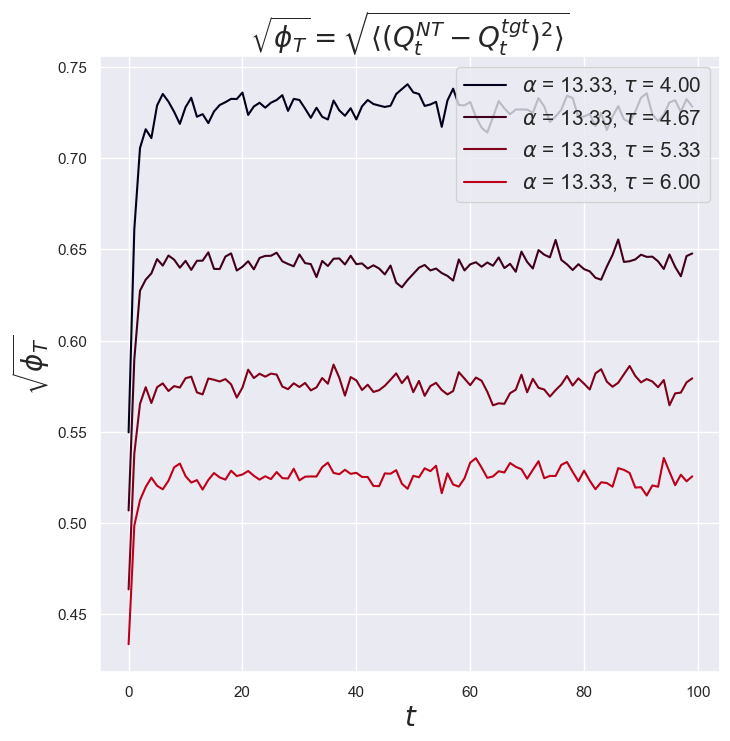

In [55]:
figure29 = plt.figure(figsize = (8,8))
plt.title(r"$\sqrt{\phi_{T}} =  \sqrt{\langle (Q_{t}^{NT} - Q_{t}^{tgt})^{2} \rangle}$ ", fontsize = 20)

for i in range (0,number_of_points):
    for j in range(1,2):
        plt.plot(np.arange(0,len(phi_t_vector[0])), np.sqrt(phi_t_vector[i*number_of_points + j]), label = r"$\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((i)/number_of_points))
    
plt.xlabel(r"$t$", fontsize = 20)
plt.ylabel(r"$\sqrt{\phi_{T}}$", fontsize = 20)##
plt.legend(loc = 1, prop={'size': 15})
plt.show()

**Analyzing $\phi_{T}$ in function of $\alpha$**

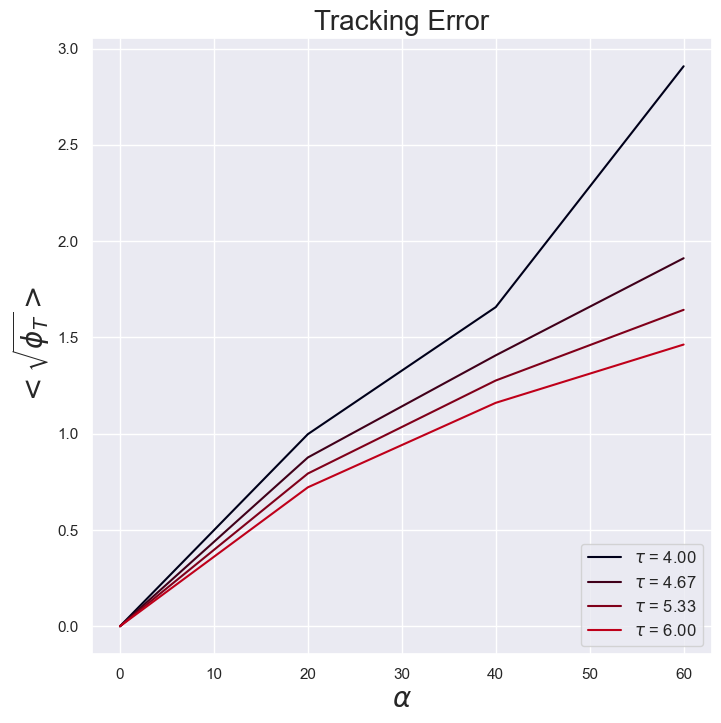

In [105]:
figure30 = plt.figure(figsize = (8,8))
plt.title(r"Tracking Error", fontsize = 20)


phi_stationary_sqrt = []

cointegration_NT_tgt_total_order_flow = []
var_cointegration_NT_tgt_total_order_flow = []

for i in range(number_of_points):
    for j in range(number_of_points):
        phi_stationary_sqrt.append(np.sqrt(phi_t_vector[i*number_of_points +j][-1]))
    

for i in range (0,number_of_points):
    plt.plot(alpha_vector, phi_stationary_sqrt[(i*number_of_points):(i*number_of_points + number_of_points)], color = color_conv((i)/number_of_points), label = r"$\tau$ = {:.2f}".format(tau_vector[i]))
    #plt.plot(alpha_vector, np.gradient(np.array(tracking_error_mean[(i*number_of_points):(i*number_of_points + number_of_points)])), color = colors[i], label = r"$\tau$ = {:.2f}".format(tau_vector[i]))
    #plt.plot(alpha_vector, np.gradient(np.divide(NT_target_deviation_mean[(i*number_of_points):(i*number_of_points + number_of_points)]**2,NT_target_deviation_var[(i*number_of_points):(i*number_of_points + number_of_points)]), edge_order = 2), color = colors[i], label = r"$\tau$ = {:.2f}".format(tau_vector[i]))
    #plt.plot(alpha_vector, np.divide(np.array(NT_target_deviation_mean[(i*number_of_points):(i*number_of_points + number_of_points)])**2,np.array(NT_target_deviation_var[(i*number_of_points):(i*number_of_points + number_of_points)])), color = color_conv((i)/number_of_points), label = r"$\tau$ = {:.2f}".format(tau_vector[i]))
    #plt.plot(alpha_vector, np.gradient(NT_target_deviation_mean[(i*number_of_points):(i*number_of_points + number_of_points)], edge_order = 2), color = colors[i], label = r"$\tau$ = {:.2f}".format(tau_vector[i]))
    #plt.plot(alpha_vector, np.array(NT_target_deviation_mean[(i*number_of_points):(i*number_of_points + number_of_points)]), color = colors[i], label = r"$\tau$ = {:.2f}".format(tau_vector[i]))

plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$<\sqrt{\phi_{T}}>$", fontsize = 20)
plt.legend(loc = 4, prop={'size': 12})
#plt.yscale('log')
plt.show()

**Analyzing the Mean Gain of the Traders vs $\sqrt{\phi_{T}}$**

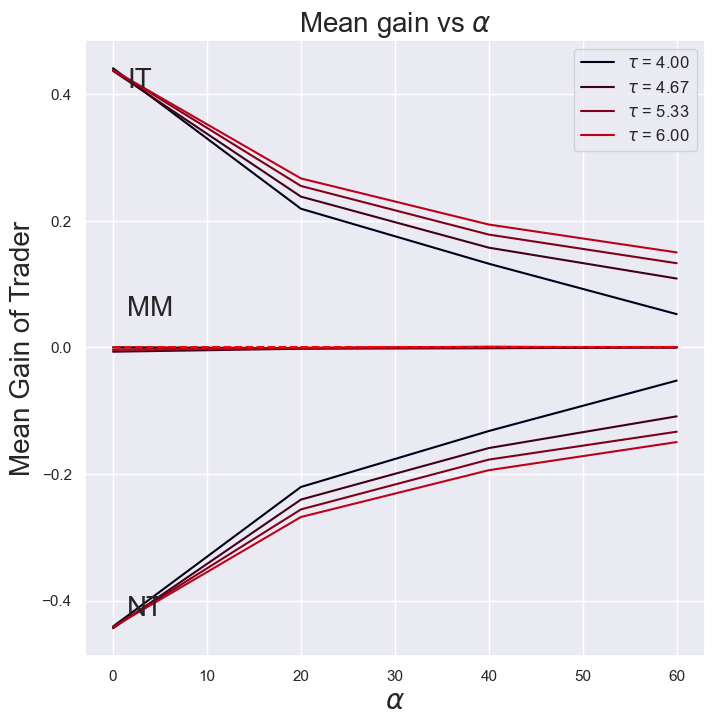

In [106]:
figure31 = plt.figure(figsize = (8,8))
plt.title(r"Mean gain vs $\alpha$", fontsize = 20)
for i in range(0,number_of_points):
    plt.plot(alpha_vector, NT_mean_gain_vector[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    plt.plot(alpha_vector, IT_mean_gain_vector[(i*number_of_points):(i*number_of_points + number_of_points)], color = color_conv((i)/number_of_points))
    plt.plot(alpha_vector, MM_mean_gain_vector[(i*number_of_points):(i*number_of_points + number_of_points)], color = color_conv((i)/number_of_points))
plt.plot(alpha_vector, np.zeros(len(alpha_vector)), color='red', linestyle='dashed',
     markerfacecolor='red')

plt.text(1.5,0.05,"MM", fontsize = 20)
plt.text(1.5,-0.425,"NT", fontsize = 20)
plt.text(1.5,0.41,"IT", fontsize = 20)

plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"Mean Gain of Trader", fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})
plt.show()

## Studying Total Position's Properties

**Noise trader's total position and Target Portfolio's total position - $Q_{t}^{NT} \ \& \ Q_{t}^{tgt}$**

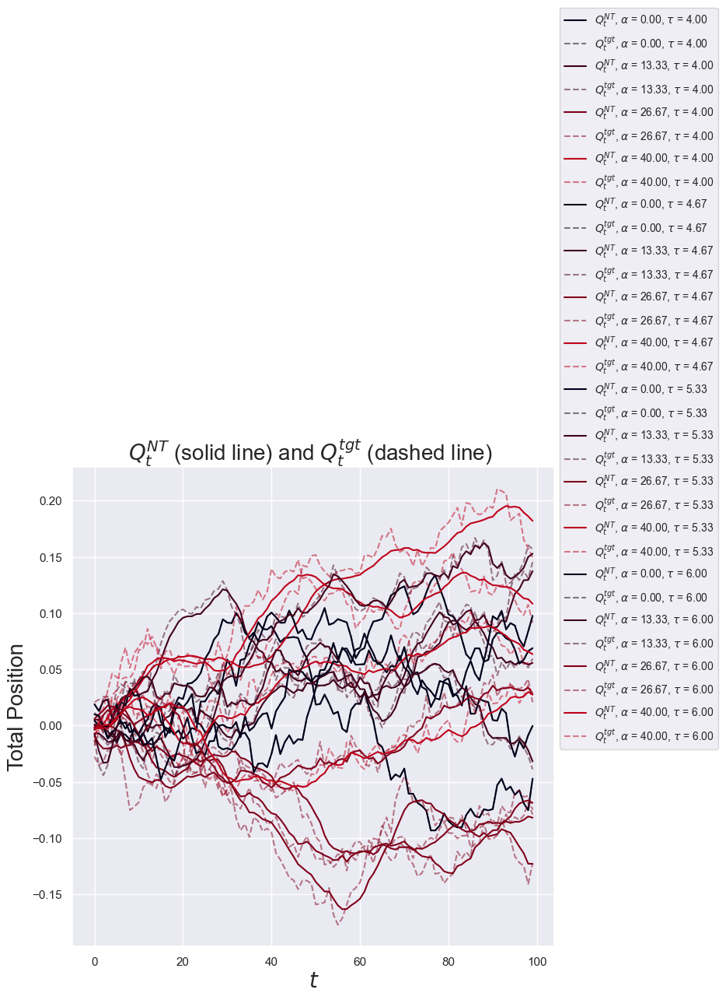

In [59]:
figure33 = plt.figure(figsize = (8,8))
plt.title(r"$Q_{t}^{NT}$ (solid line) and $Q_{t}^{tgt}$ (dashed line)  ", fontsize = 20)

for i in range (0,number_of_points):
    for j in range(0,number_of_points):
        plt.plot(np.arange(0,len(phi_t_vector[0])), noise_trader_total_position_t[i*number_of_points + j], label = r"$Q_{{t}}^{{NT}}$, $\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points))
        plt.plot(np.arange(0,len(phi_t_vector[0])), target_portfolio_total_position_t[i*number_of_points + j], label = r"$Q_{{t}}^{{tgt}}$, $\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points), alpha = 0.5, linestyle = "dashed")

plt.xlabel(r"$t$", fontsize = 20)
plt.ylabel(r"Total Position", fontsize = 20)
plt.legend(loc = 3, prop={'size': 10}, bbox_to_anchor=(1, 0.4))
#plt.text(2.5,0.1,r"$\alpha$ = {:.2f}".format(alpha_vector[j]), fontsize = 20)
plt.show()

## Analyzing mean reversion between NT total order flow and target portfolio total order flow

**Evaluating the moving average of the Target Total Order Fow**

In [60]:
cointegration_NT_tgt_total_order_flow = []
var_cointegration_NT_tgt_total_order_flow = []

for i in range(0, number_of_points):
    for j in range(0, number_of_points):
        cointegration_NT_tgt_total_order_flow.append(noise_trader_total_position_t[i*number_of_points +j] - target_portfolio_total_position_t[i*number_of_points +j])

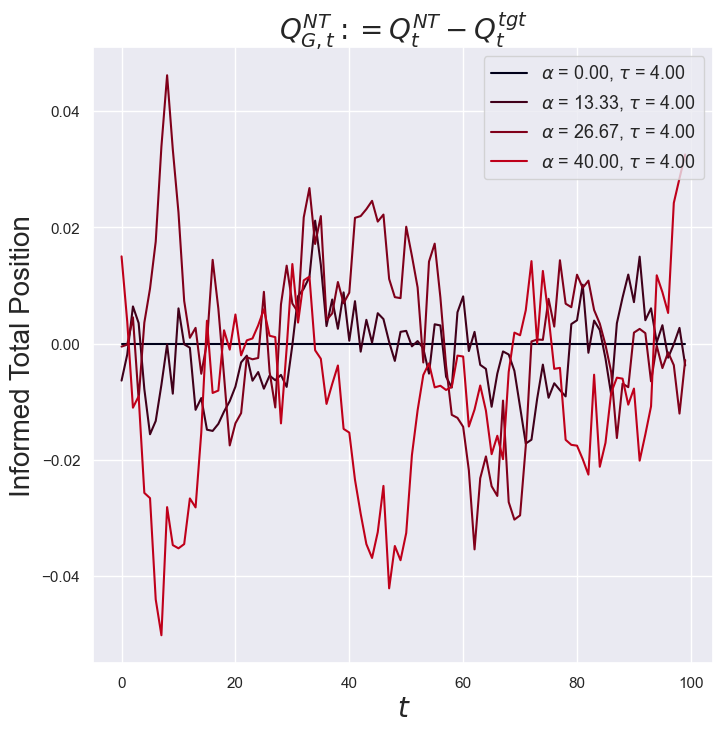

In [61]:
figure33 = plt.figure(figsize = (8,8))

plt.title(r"$Q_{G,t}^{NT} := Q_{t}^{NT} - Q_{t}^{tgt}$ ", fontsize = 20)

T = 100
for i in range (0,1):
    for j in range(0,number_of_points):
        plt.plot(np.arange(0,T), cointegration_NT_tgt_total_order_flow[i*number_of_points + j], label = r"$\alpha$ = {:.2f}, $\tau$ = {:.2f} ".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points))

plt.xlabel(r"$t$", fontsize = 20)
plt.ylabel(r"Informed Total Position", fontsize = 20)
plt.legend(loc = 1, prop={'size': 13})
plt.show()

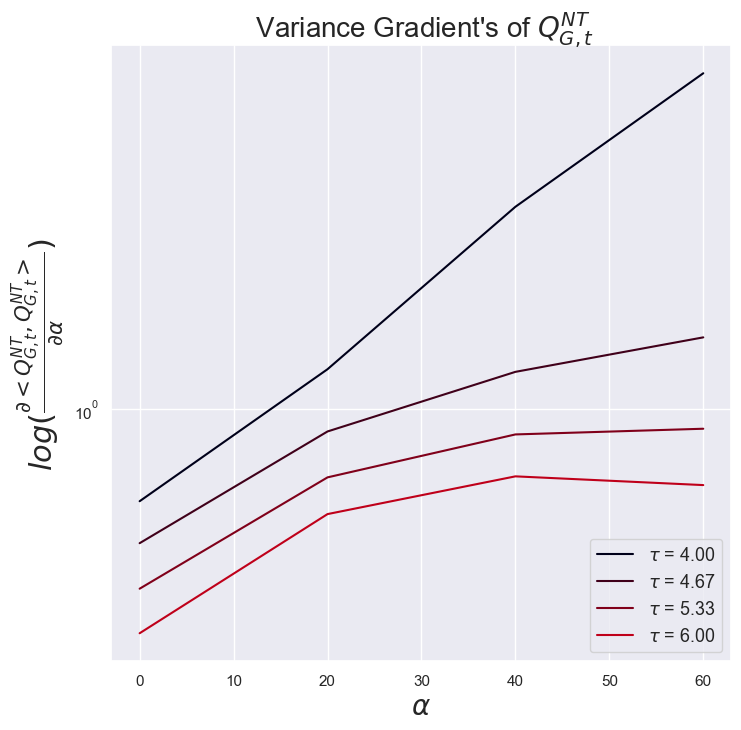

In [107]:
figure30 = plt.figure(figsize = (8,8))
plt.title(r" Variance Gradient's of $Q_{G,t}^{NT}$", fontsize = 20)

dx = 1/number_of_points

for i in range (0,number_of_points):
    plt.plot(alpha_vector, np.gradient(NT_target_deviation_var[(i*number_of_points):(i*number_of_points + number_of_points)], edge_order = 2), color = color_conv((i)/number_of_points), label = r"$\tau$ = {:.2f}".format(tau_vector[i]))

plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$log(\frac{\partial{<Q_{G,t}^{NT}, Q_{G,t}^{NT}>}}{\partial{\alpha}})$", fontsize = 22)
plt.legend(loc = 4, prop={'size': 13})
plt.yscale('log')
plt.show()

**Measuring Speed of Mean Reversion**

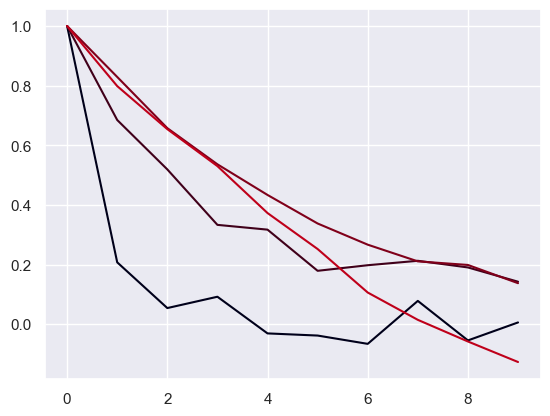

In [64]:
import statsmodels.api as sm
from scipy.optimize import curve_fit
mean_reversion_timescales_informed_flow = []

def exp(x, a, tau):
    return a*np.exp(-x/tau)

nlags = 100

for i in range (0,1):
    for j in range(0,number_of_points):
        acf = sm.tsa.acf(cointegration_NT_tgt_total_order_flow[i*number_of_points + j], nlags = nlags)
        plt.plot(acf[0:10], label = r"$\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points))
        y = acf[0:nlags]
        x = np.arange(0,nlags)
        parameters, cov = curve_fit(f = exp, xdata = x, ydata = y, p0 = [1,1])
        mean_reversion_timescales_informed_flow.append(parameters[1])

#plt.legend()


In [65]:
mean_reversion_timescales_informed_flow

[0.660434492979234, 3.285460893351503, 3.573416974964162, 2.7940296035761163]

## Investigating the ACF of the IT <br/><br/>

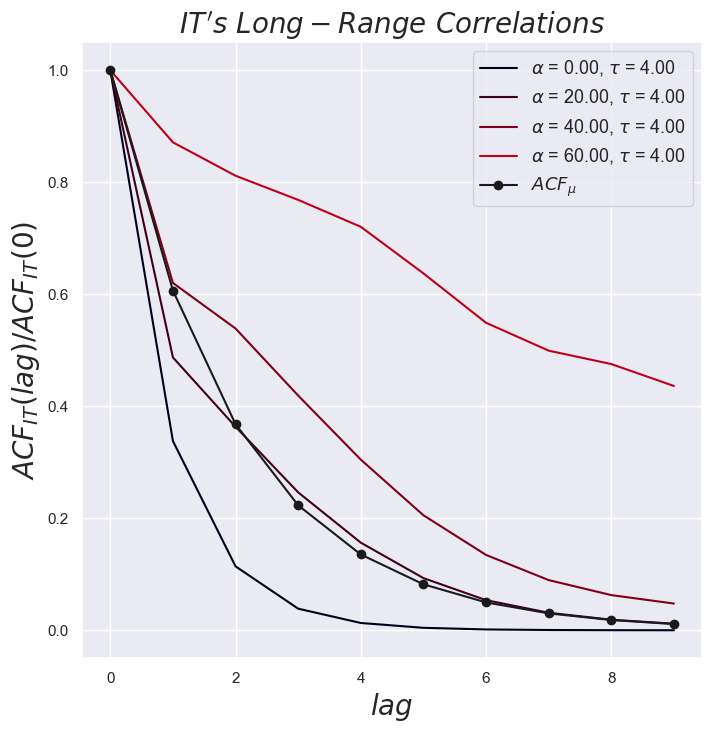

In [108]:
figure29 = plt.figure(figsize = (8,8))
plt.title(r"$IT's \ Long-Range \ Correlations$ ", fontsize = 20)

for i in range (0,1):
    for j in range(0,number_of_points):
        plt.plot(np.arange(0,10), ACFs_IT[i*number_of_points + j][-1][0,:10]/ACFs_IT[i*number_of_points + j][-1][0,0], label = r"$\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points))
        #plt.plot(np.arange(0,10), ACFs_P[i*number_of_points + j][-1][0,:10]/ACFs_P[i*number_of_points + j][-1][0,0], label = r"$ACF_{{P}}, \alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = colors[j], marker = 'x')
        #plt.plot(np.arange(0,10), ACFs_NT[i*number_of_points + j][-1][0,:10]/ACFs_NT[i*number_of_points + j][-1][0,0], label = r"$\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = colors[j], marker = 'x')
        #plt.plot(np.arange(0,10), ACFs_IT[i*number_of_points + j][-1][0,:10], label = r"$\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = colors[i])


plt.plot(np.arange(0,10), ACF_MU[0,:10]/ACF_MU[0,0], label = r"$ACF_{{\mu}}$", marker = 'o', color = 'k')

#plt.plot(np.arange(0,10), ACF_MU[0,:10], label = r"$ACF_{{\mu}}$", marker = 'o', color = 'k')

plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$ACF_{IT}(lag)/ACF_{IT}(0)$", fontsize = 20)##
plt.legend(loc = 1, prop={'size': 13})
plt.show()

## Investigating the ACF of the NT <br/><br/>

<Figure size 800x800 with 0 Axes>

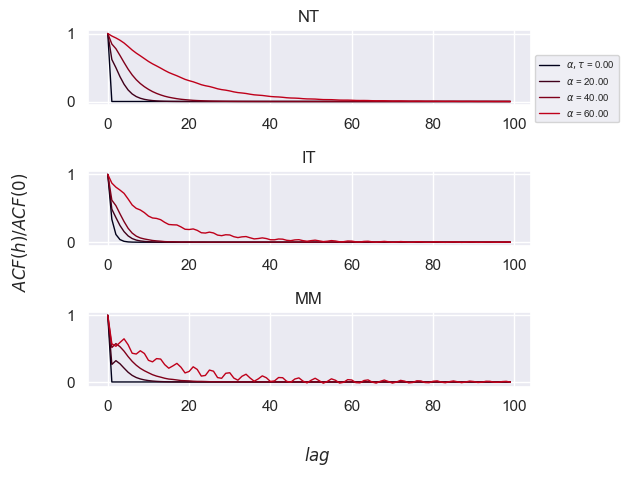

In [109]:
figure29 = plt.figure(figsize = (8,8))
#plt.title(r"$NT's \ ACF \ Decay \ vs \ \alpha $ ", fontsize = 20)

lag_zero_NT_ACF = []
lag_zero_IT_ACF = []
lag_zero_total_order_flow_ACF = []

transience_NT_ACF = []
transience_IT_ACF = []
transience_total_order_flow_ACF = []

half_life_NT_ACF = []
half_life_IT_ACF = []
half_life_total_order_flow_ACF = []

for i in range (0,number_of_points):
    for j in range(0,number_of_points):
        #plt.plot(np.arange(0,10), ACFs_NT[i*number_of_points + j][-1][0,:10]/ACFs_NT[i*number_of_points + j][-1][0,0], label = r"$\alpha$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points))
        #plt.plot(np.arange(0,10), ACFs_NT[i*number_of_points + j][-1][0,:10], label = r"$\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = colors[i])
        lag_zero_NT_ACF.append(ACFs_NT[i*number_of_points + j][-1][0,0])
        lag_zero_IT_ACF.append(ACFs_IT[i*number_of_points + j][-1][0,0])
        transience_NT_ACF.append(ACFs_NT[i*number_of_points + j][-1][0,:]/ACFs_NT[i*number_of_points + j][-1][0,0])
        transience_IT_ACF.append(ACFs_IT[i*number_of_points + j][-1][0,:]/ACFs_IT[i*number_of_points + j][-1][0,0])
        transience_total_order_flow_ACF.append(ACFs_Q[i*number_of_points + j][-1][0,:]/ACFs_Q[i*number_of_points + j][-1][0,0])
        lag_zero_total_order_flow_ACF.append(ACFs_Q[i*number_of_points + j][-1][0,0])
        half_life_NT_ACF.append(get_halflife(ACFs_NT[i*number_of_points + j][-1][0,:]))
        half_life_IT_ACF.append(get_halflife(ACFs_IT[i*number_of_points + j][-1][0,:]))
        half_life_total_order_flow_ACF.append(get_halflife(ACFs_Q[i*number_of_points + j][-1][0,:]))

        
#fig, axis = plt.subplots(3, 1, sharey = False)
#for i in range(len(tau_vector)):
#    for j in range(len(alpha_vector)-1):
#        xj = alpha_vector[j:j+2]
#        yj = lag_zero_NT_ACF[(i*number_of_points + j):(i*number_of_points + j)+2]
#        zj = lag_zero_IT_ACF[(i*number_of_points + j):(i*number_of_points + j)+2]
#        wj = lag_zero_total_order_flow_ACF[(i*number_of_points + j):(i*number_of_points + j)+2]
#        cj = color_conv(i/number_of_points)
#        if(j == 1):
#            axis[0].plot(xj, yj, color = cj, linewidth='1', label = r"$\tau$ = {:.2f}".format(tau_vector[i])) 
#            axis[0].set_title("NT") 
#            axis[0].legend(loc = 3 ,prop={'size': 7}, bbox_to_anchor=(1, -0.25)) 
#        else:
#            axis[0].plot(xj, yj, color = cj, linewidth='1') 
#            axis[0].set_title("NT") 
#        axis[1].plot(xj, zj, color = cj, linewidth='1') 
#        axis[1].set_title("IT")      
#        axis[2].plot(xj, wj, color = cj, linewidth='1', ) 
#        axis[2].set_title("MM") 


#fig, axis = plt.subplots(3, 1)
#for i in range(len(tau_vector)):
#    for j in range(len(alpha_vector)-1):
#        xj = alpha_vector[j:j+2]
#        yj = half_life_NT_ACF[(i*number_of_points + j):(i*number_of_points + j)+2]
#        zj = half_life_IT_ACF[(i*number_of_points + j):(i*number_of_points + j)+2]
#        wj = half_life_zero_total_order_flow_ACF[(i*number_of_points + j):(i*number_of_points + j)+2]
#        cj = color_conv(i/number_of_points)
#        if(j == 1):
#            axis[0].plot(xj, yj, color = cj, linewidth='1', label = r"$\tau$ = {:.2f}".format(tau_vector[i])) 
#            axis[0].set_title("NT") 
            #axis[0].legend(loc = 3 ,prop={'size': 7}, bbox_to_anchor=(1, -0.5)) 
#        else:
#            axis[0].plot(xj, yj, color = cj, linewidth='1') 
#            axis[0].set_title("NT") 
#        axis[1].plot(xj, zj, color = cj, linewidth='1') 
#        axis[1].set_title("IT")      
#        axis[2].plot(xj, wj, color = cj, linewidth='1', ) 
#        axis[2].set_title("MM") 

fig, axis = plt.subplots(3, 1, sharey = False)
for i in range(len(alpha_vector)):
        xj = np.arange(0,100)
        yj = transience_NT_ACF[i]
        zj = transience_IT_ACF[i]
        wj = transience_total_order_flow_ACF[i]
        cj = color_conv(i/number_of_points)
        if(i == 0):
            axis[0].plot(xj, yj, color = cj, linewidth='1', label = r"$\alpha, \tau$ = {:.2f}".format(alpha_vector[i], tau_vector[i]))
        else:
            axis[0].plot(xj, yj, color = cj, linewidth='1', label = r"$\alpha$ = {:.2f}".format(alpha_vector[i])) 
        axis[0].set_title("NT") 
        axis[0].legend(loc = 3 ,prop={'size': 7}, bbox_to_anchor=(1, -0.3)) 
        axis[1].plot(xj, zj, color = cj, linewidth='1') 
        axis[1].set_title("IT")      
        axis[2].plot(xj, wj, color = cj, linewidth='1', ) 
        axis[2].set_title("MM") 


fig.supxlabel(r"$lag$", fontsize = 12)
fig.supylabel(r"$ACF(h)/ACF(0)$", fontsize = 12)##
#fig.supylabel(r"$ACFs' \ Half \ Life$", fontsize = 12)##
#fig.legend(tau_vector[0], loc = 1, prop={'size': 8})
#plt.text(110,0.001, r"$\tau$ = {}".format(tau_vector[0]), fontsize = 7)
plt.tight_layout() 
plt.show()

## Investigating the Variance of Total Positions <br/><br/>
$ Var_{(Q_{MM})}  = \langle Q_{MM}^{2} \rangle$<br/><br/>
$ Var_{(Q_{NT})}  = \langle Q_{NT}^{2} \rangle$<br/><br/>
$ Var_{(Q_{IT})} = \langle Q_{IT}^{2} \rangle $

**Variance of total positions is a decreasing function of $\alpha$ and a increasing function of $\tau$**

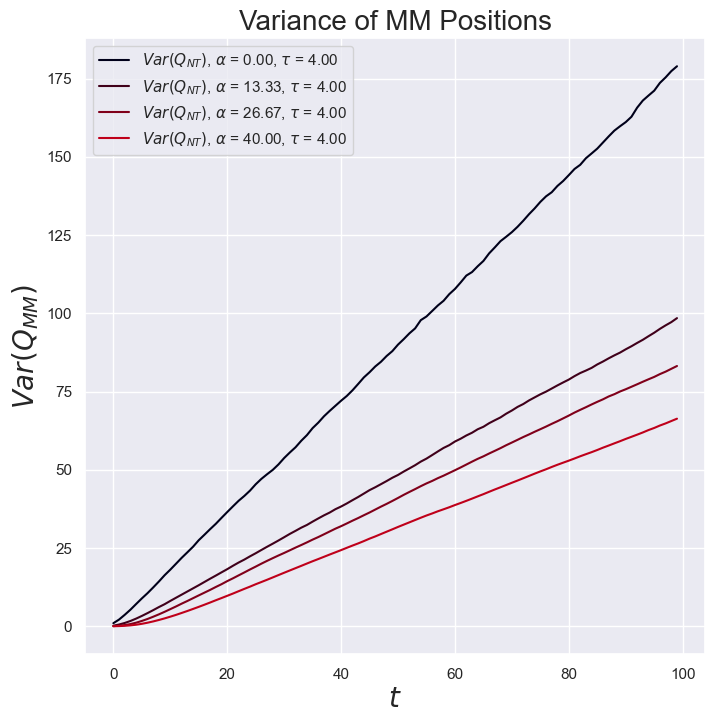

In [68]:
figure33 = plt.figure(figsize = (8,8))
plt.title(r"Variance of MM Positions", fontsize = 20)

for i in range(0,1):
    for j in range(0,number_of_points):
        #plt.plot(np.arange(0,len(phi_t_vector[0])), var_noise_trader_total_position_t[i*number_of_points + j], label = r"$Var(Q_{{NT}})$, $\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]))
        #plt.plot(np.arange(0,len(phi_t_vector[0])), var_informed_trader_total_position_t[i*number_of_points + j], label = r"$Var(Q_{{IT}})$, $\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = colors[j])
        plt.plot(np.arange(0,len(phi_t_vector[0])), var_market_maker_total_position_t[i*number_of_points + j], color = color_conv((j)/number_of_points),  label = r"$Var(Q_{{NT}})$, $\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]))
        #plt.plot(np.arange(0,len(phi_t_vector[0])), var_target_portfolio_total_position_t[i*number_of_points + j], label = r"$Var(Q_{TGT})$")


plt.xlabel(r"$t$", fontsize = 20)
plt.ylabel(r"$Var(Q_{MM})$", fontsize = 20)
plt.legend(loc = 2, prop={'size': 11})
plt.show()

**Investigating the Variance of Price Series** <br/><br/>
$ Var_{p}  = \langle p^{2} \rangle$<br/><br/>
$ Var_{p^{IT}}  = \langle (p^{IT})^{2} \rangle$<br/><br/>

**Variance of IT's price series is independent of $\alpha$ or $\tau$. Total order flow variance increases with $\tau$ and decreases wth $\alpha$** 

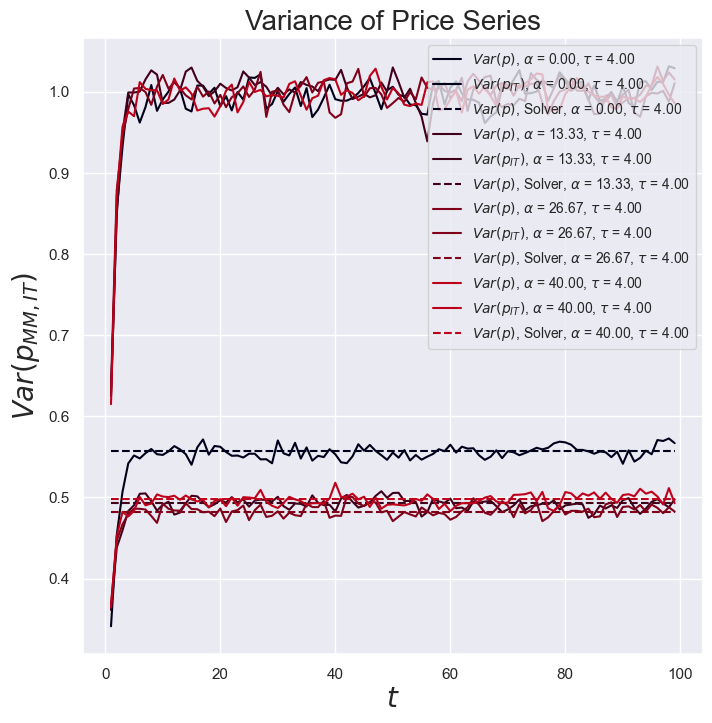

In [69]:
figure34 = plt.figure(figsize = (8,8))
plt.title(r"Variance of Price Series", fontsize = 20)


var_p_IT = []
for i in range(0, number_of_points*number_of_points):
    var_p_IT.append(var_IT_estimated_price_t[i][-1])


for i in range(0,1):
    for j in range(0,number_of_points):
        plt.plot(np.arange(1,len(phi_t_vector[0])), var_price_t[i*number_of_points + j][1:], label = r"$Var(p)$, $\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points))
        plt.plot(np.arange(1,len(phi_t_vector[0])), var_IT_estimated_price_t[i*number_of_points + j], label = r"$Var(p_{{IT}})$, $\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points))
        plt.plot(np.arange(1,len(phi_t_vector[0])),np.ones(len(phi_t_vector[0]) - 1)*ACFs_P[i*number_of_points + j][-1][0,0], linestyle = "dashed", label = r"$Var(p)$, Solver, $\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points))
        #plt.plot(np.arange(1,len(phi_t_vector[0])),np.ones(len(phi_t_vector[0]) - 1)*var_p_IT[i*number_of_points + j], linestyle = "-", marker = 'o', label = r"$Var(p_{{IT}})$, Solver, $\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = colors[j])

        #plt.text(7,0.3,r"$\alpha$ = {:.4f}".format(alpha_vector[j]), fontsize = 20)
 


plt.xlabel(r"$t$", fontsize = 20)
plt.ylabel(r"$Var(p_{MM,IT})$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 10})
plt.show()

## Investigating the correlation between $q_{IT}$ and $q_{NT}$ 

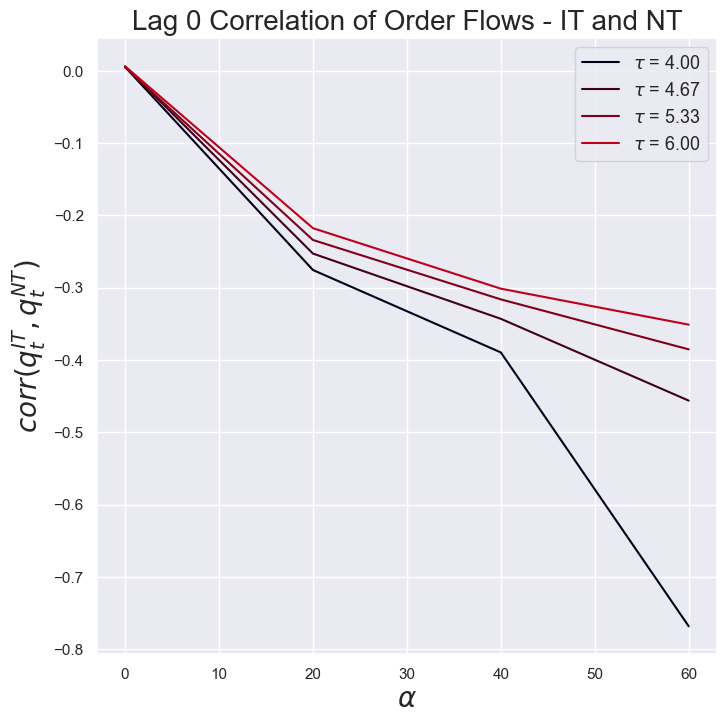

In [110]:
figure34 = plt.figure(figsize = (8,8))
plt.title(r"Lag 0 Correlation of Order Flows - IT and NT", fontsize = 20)

for i in range(0,number_of_points):
        plt.plot(alpha_vector, cor_IT_NT_order_flow[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
       
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$corr(q_{{t}}^{{IT}}, q_{{t}}^{{NT}})$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 13})
plt.show()

## Investigating the correlation between $q_{IT}$ and $q_{MM}$ 

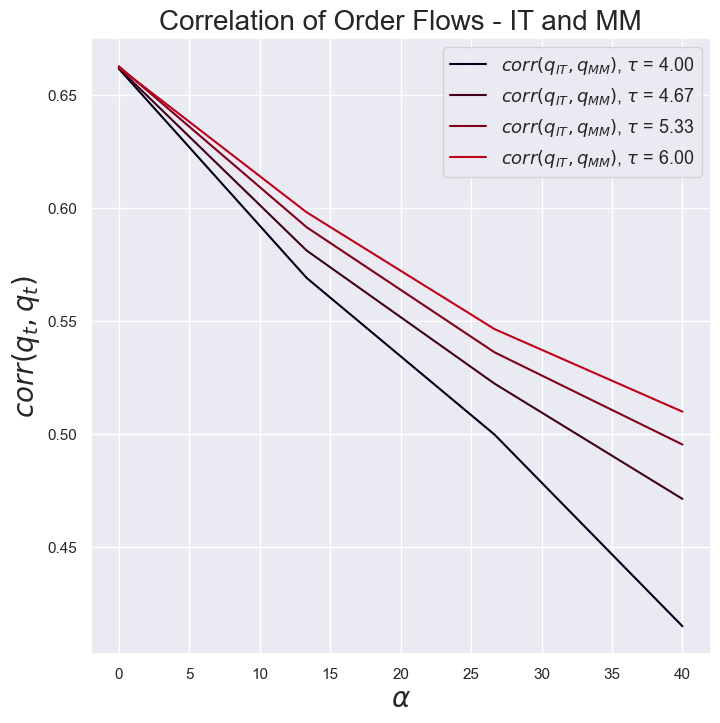

In [71]:
figure34 = plt.figure(figsize = (8,8))
plt.title(r"Correlation of Order Flows - IT and MM", fontsize = 20)

for i in range(0,number_of_points):
        plt.plot(alpha_vector, cor_IT_MM_order_flow[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$corr(q_{{IT}}, q_{{MM}})$, $\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
       
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$corr(q_{t}, q_{t})$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 13})
plt.show()

## Investigating the correlation between $q_{NT}$ and $q_{MM}$ 

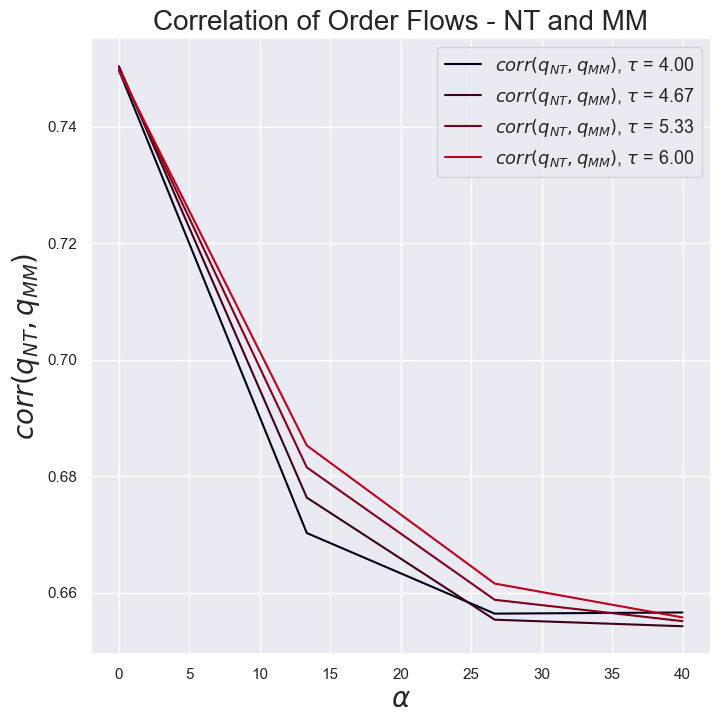

In [72]:
figure34 = plt.figure(figsize = (8,8))
plt.title(r"Correlation of Order Flows - NT and MM", fontsize = 20)

for i in range(0,number_of_points):
        plt.plot(alpha_vector, cor_NT_MM_order_flow[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$corr(q_{{NT}}, q_{{MM}})$, $\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
       
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$corr(q_{{NT}}, q_{{MM}})$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 13})
plt.show()

## Investigating the correlation between $q_{IT}$ and $\mu_{t}$ 

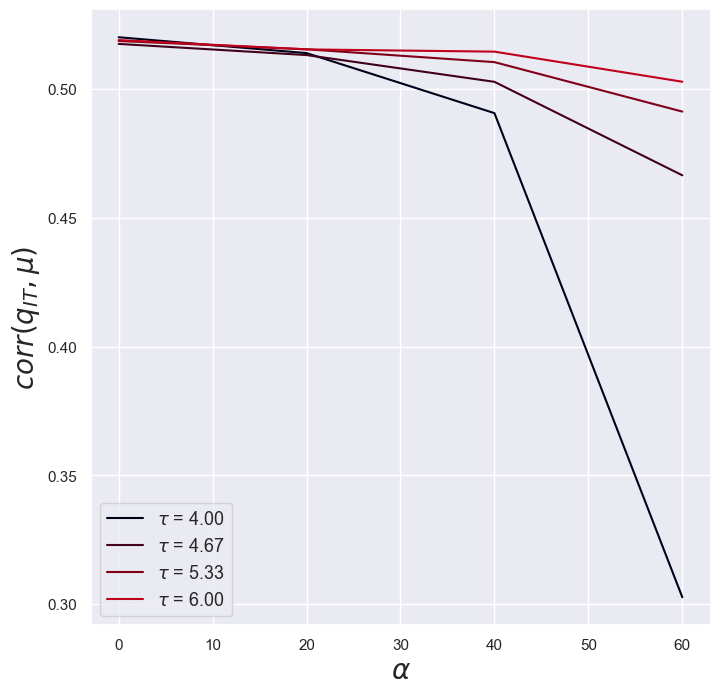

In [111]:
figure34 = plt.figure(figsize = (8,8))
#plt.title(r"Lag 0 Correlation of Order Flows - IT and Dividends", fontsize = 20)

for i in range(0,number_of_points):
        plt.plot(alpha_vector, cor_IT_mu_order_flow[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
        #plt.plot(alpha_vector, cor_NT_mu_order_flow[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$corr(q_{{NT}}, \mu)$, $\tau$ = {:.2f}".format(tau_vector[i]), color = colors[i])
        #plt.plot(alpha_vector, k1[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = colors[i])

#plt.plot(alpha_vector, k1[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = colors[i])

plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$corr(q_{{IT}}, \mu)$", fontsize = 20)
plt.legend(loc = 3, prop={'size': 13})
#plt.show()

## Investigating the correlation between $q_{NT}$ and $\mu_{t}$ 

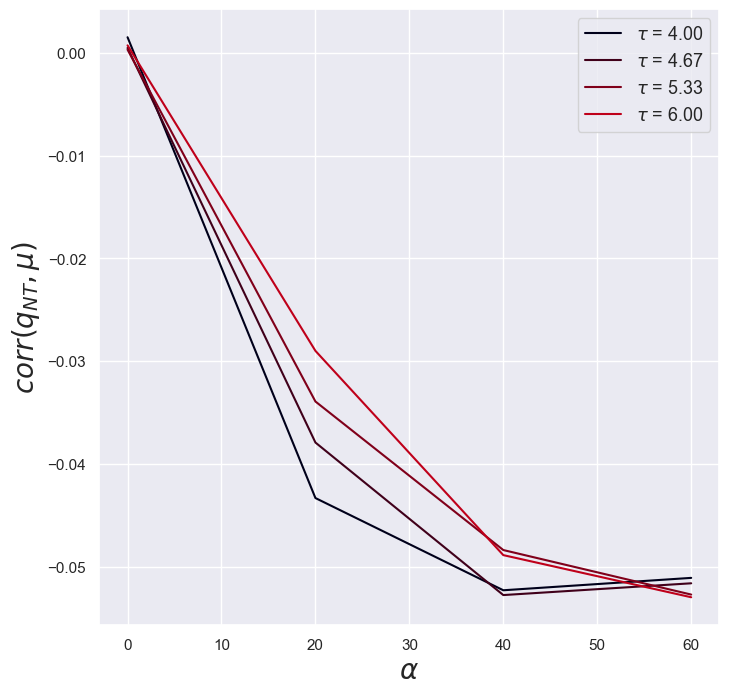

In [112]:
figure34 = plt.figure(figsize = (8,8))
#plt.title(r"Correlation of Order Flows - NT and Dividends", fontsize = 20)

for i in range(0,number_of_points):
        plt.plot(alpha_vector, cor_NT_mu_order_flow[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
       
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$corr(q_{{NT}}, \mu)$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 13})
plt.show()

## Investigating the correlation between $q_{NT}$ and $q_{TGT}$ 

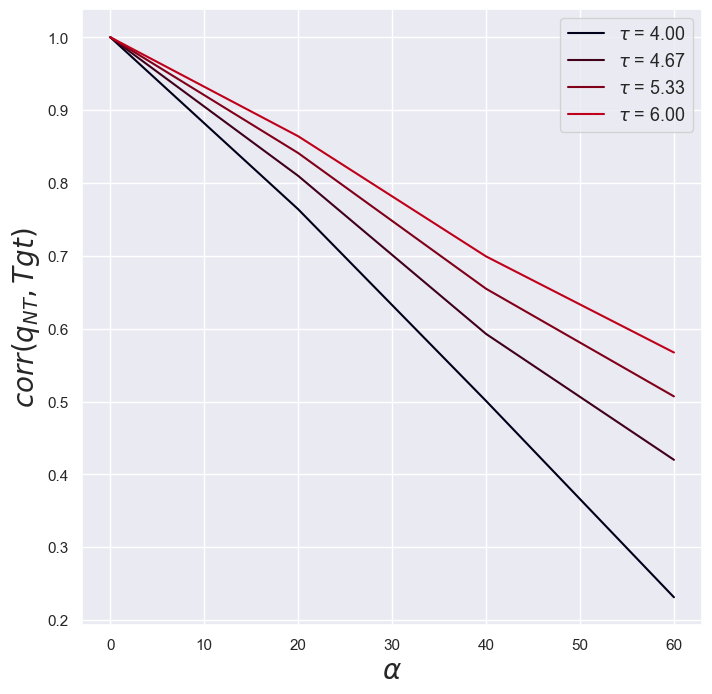

In [113]:
figure34 = plt.figure(figsize = (8,8))
#plt.title(r"Correlation of Order Flows - NT and Tgt", fontsize = 20)

for i in range(0,number_of_points):
        plt.plot(alpha_vector, cor_NT_tgt_order_flow[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
       
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$corr(q_{{NT}}, Tgt)$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 13})
plt.show()

**Analyzing gain per trade: $Utility_{i}(t)/std(q_{i}(t))$**

In [76]:
gain_per_trade_NT = []
gain_per_trade_IT = []
gain_per_trade_MM = []

for i in range(0,number_of_points*number_of_points):
    gain_per_trade_NT.append(NT_mean_gain_vector[i]/std_NT_order_flow[i])
    gain_per_trade_IT.append(IT_mean_gain_vector[i]/std_IT_order_flow[i])
    gain_per_trade_MM.append(MM_mean_gain_vector[i]/std_total_order_flow[i])

<Figure size 800x800 with 0 Axes>

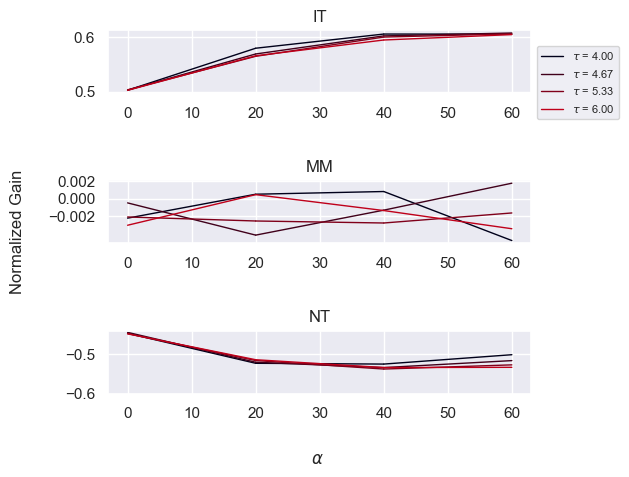

In [114]:
figure35 = plt.figure(figsize = (8,8))

fig, axis = plt.subplots(3, 1, sharey = False)

yticks1 = [0.5, 0.6]
yticks2 = [-0.5,-0.6]
yticks3 = [-0.002,0,0.002]


for i in range(len(tau_vector)):
    for j in range(len(alpha_vector)-1):
        xj = alpha_vector[j:j+2]
        yj = gain_per_trade_NT[(i*number_of_points + j):(i*number_of_points + j)+2]
        zj = gain_per_trade_IT[(i*number_of_points + j):(i*number_of_points + j)+2]
        wj = gain_per_trade_MM[(i*number_of_points + j):(i*number_of_points + j)+2]
        cj = color_conv(i/number_of_points)
        if(j == 1):
            axis[0].plot(xj, zj, color = cj, linewidth='1', label = r"$\tau$ = {:.2f}".format(tau_vector[i])) 
            axis[0].set_title("IT") 
            axis[0].legend(loc = 3 ,prop={'size': 8}, bbox_to_anchor=(1, -0.5)) 
            axis[0].set_yticks(yticks1)

        else:
            axis[0].plot(xj, zj, color = cj, linewidth='1') 
            axis[0].set_title("IT") 
            axis[0].set_yticks(yticks1)

        axis[1].plot(xj, wj, color = cj, linewidth='1') 
        axis[1].set_title("MM") 
        axis[1].set_yticks(yticks3)
        axis[2].plot(xj, yj, color = cj, linewidth='1', ) 
        axis[2].set_title("NT") 
        axis[2].set_yticks(yticks2)


fig.supxlabel(r"$\alpha$", fontsize = 12)
fig.supylabel(r"Normalized Gain", fontsize = 12)
plt.tight_layout() 
plt.show()

NT -> takes the role of MM -> less excess demand -> maybe the IT gains more money due to that because there is less price impact

THe reason for hedging is precisly because in this way the NT can follow his target without needing the service of MM. And as well, this decreases the adverse selection (decrease in the variance of public price) -> the IT gain more, the NT looses more per trade.

Thw amount of net information revelead in Market decreases --> the MM activity decreases (try to investiate the decrease in revelead information)

**Ratio of Variances in function of time**</br></br>

In [78]:
ratio_var_nt_it_stationary = []
ratio_var_nt_tgt_stationary = []
ratio_var_nt_tgt_stationary_numerical_solver = []
ratio_var_nt_mm_stationary = []
ratio_var_it_mm_stationary = []

std_NT_order_flow = market_simulation[20]
std_IT_order_flow = market_simulation[21]
std_total_order_flow = market_simulation[22]

for i in range(0, number_of_points*number_of_points):
        ratio_var_it_mm_stationary.append((std_IT_order_flow[i]/std_total_order_flow[i])**2)
        ratio_var_nt_mm_stationary.append((std_NT_order_flow[i]/std_total_order_flow[i])**2)
        ratio_var_nt_it_stationary.append((std_NT_order_flow[i]/std_IT_order_flow[i])**2)
        ratio_var_nt_tgt_stationary.append((var_noise_trader_total_position_t[i]/var_target_portfolio_total_position_t[i])[-1])

$Var(Q_{NT})_{T}/Var(Q_{TGT})_{T}$ as function of $\alpha$<br/><br/>

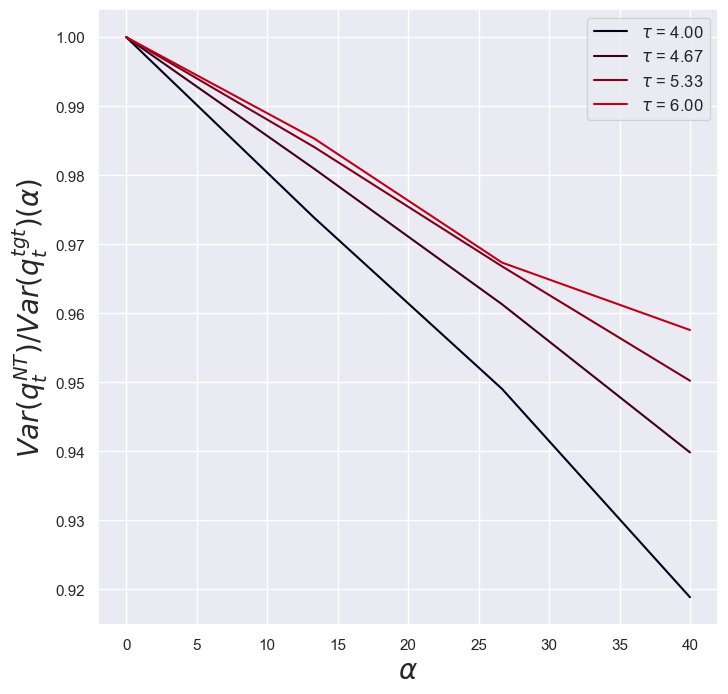

In [79]:
figure35 = plt.figure(figsize = (8,8))
#plt.title(r"$ Var_{(q_{NT})}/Var_{(q_{TGT})}$", fontsize = 20)

for i in range(0,number_of_points):
    plt.plot(alpha_vector, ratio_var_nt_tgt_stationary[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
        
#plt.plot(phi_stationary_sqrt, ratio_var_nt_tgt_stationary_numerical_solver, label = r"$Var(Q_{{NT}})/Var(Q_{{TGT}}) - Numerical \ Solver$")
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var(q_{t}^{NT})/Var(q_{t}^{tgt})(\alpha)$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})
plt.show()

$Var(Q_{IT})_{T}/Var(Q_{NT})_{T}$ as function of $\alpha$<br/><br/>

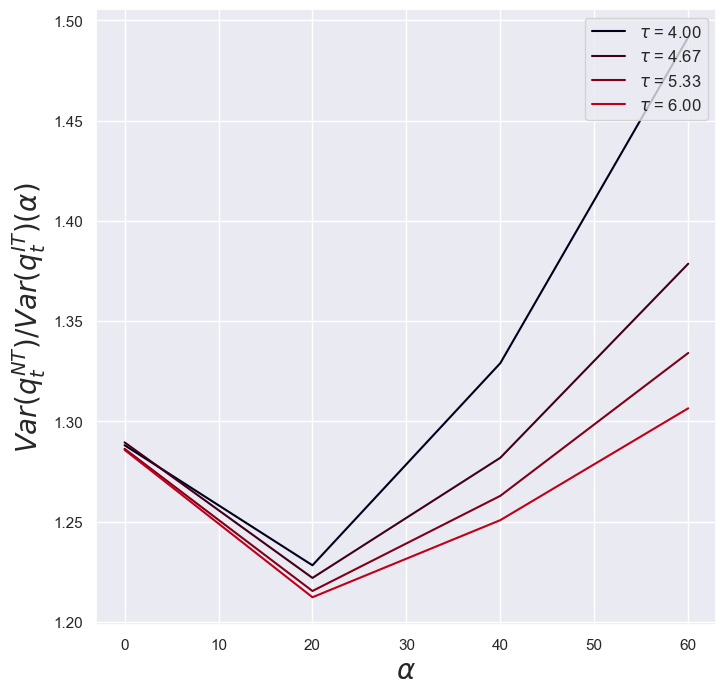

In [115]:
figure35 = plt.figure(figsize = (8,8))
#plt.title(r"$ Var_{(q_{NT})}/Var_{(q_{IT})}$", fontsize = 20)

for i in range(0,number_of_points):
    plt.plot(alpha_vector, ratio_var_nt_it_stationary[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
        
#plt.plot(phi_stationary_sqrt, ratio_var_nt_tgt_stationary_numerical_solver, label = r"$Var(Q_{{NT}})/Var(Q_{{TGT}}) - Numerical \ Solver$")
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var(q_{t}^{NT})/Var(q_{t}^{IT})(\alpha)$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})
plt.show()

$Var_{(Q_{NT})}/Var_{(Q_{MM})}$ as function of $\alpha$<br/><br/>

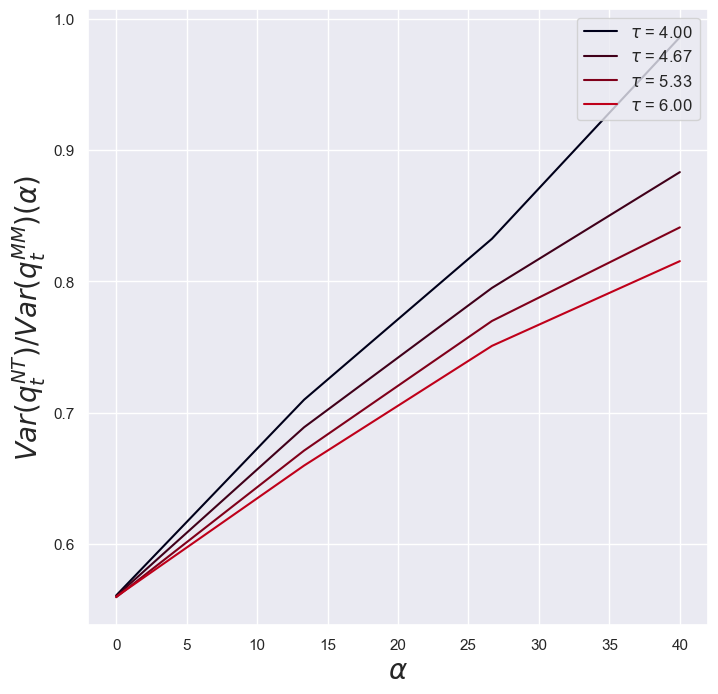

In [81]:
figure35 = plt.figure(figsize = (8,8))
#plt.title(r"$ Var_{(q_{NT})}/Var_{(q_{MM})}$", fontsize = 20)

for i in range(0,number_of_points):
    plt.plot(alpha_vector, ratio_var_nt_mm_stationary[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
        
#plt.plot(phi_stationary_sqrt, ratio_var_nt_tgt_stationary_numerical_solver, label = r"$Var(Q_{{NT}})/Var(Q_{{TGT}}) - Numerical \ Solver$")
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var(q_{t}^{NT})/Var(q_{t}^{MM})(\alpha)$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})
plt.show()

$Var_{(Q_{IT})}/Var_{(Q_{MM})}$ as function of $\alpha$<br/><br/>

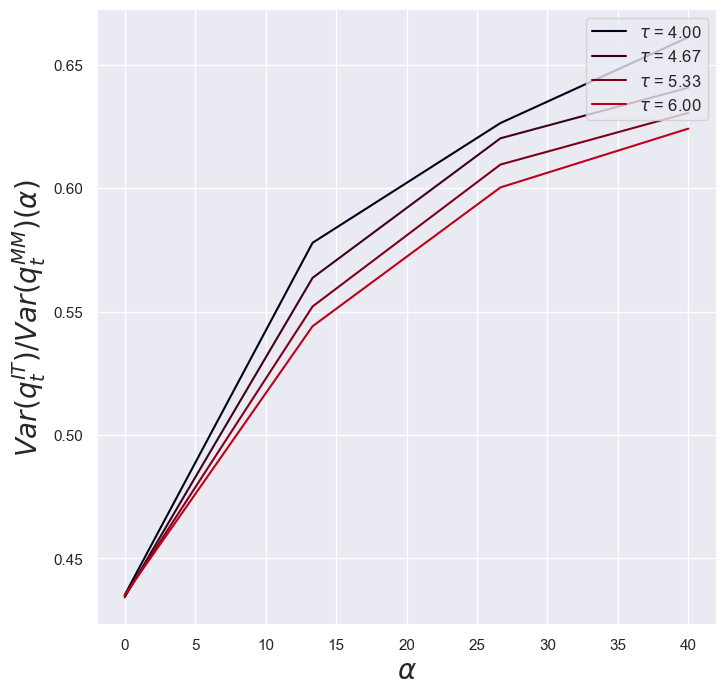

In [82]:
figure35 = plt.figure(figsize = (8,8))
#plt.title(r"$ Var_{(q_{IT})}/Var_{(q_{MM})}$", fontsize = 20)

for i in range(0,number_of_points):
    plt.plot(alpha_vector, ratio_var_it_mm_stationary[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
        
#plt.plot(phi_stationary_sqrt, ratio_var_nt_tgt_stationary_numerical_solver, label = r"$Var(Q_{{NT}})/Var(Q_{{TGT}}) - Numerical \ Solver$")
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var(q_{t}^{IT})/Var(q_{t}^{MM})(\alpha)$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})
plt.show()

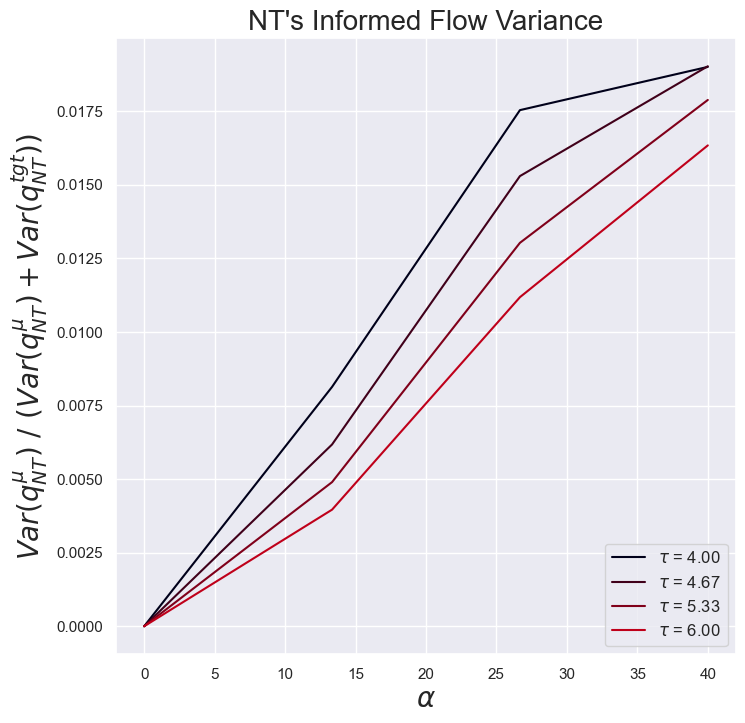

In [83]:
figure35 = plt.figure(figsize = (8,8))

for i in range(0,number_of_points):
    plt.plot(alpha_vector, var_ratio_NT_informed_total[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    #plt.plot(alpha_vector, ratio_var_p_pt_it_stationary_numerical_solver[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$ Var_{p}/Var_{p^{IT}}$ - Numerical Solver", linestyle = "dashed", color = colors[i])

plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var(q_{NT}^{\mu}) \ / \  (Var(q_{NT}^{\mu}) + Var(q_{NT}^{tgt}))$", fontsize = 20)
plt.legend(loc = 4, prop={'size': 12})
plt.title("NT's Informed Flow Variance", fontsize = 20)
plt.show()

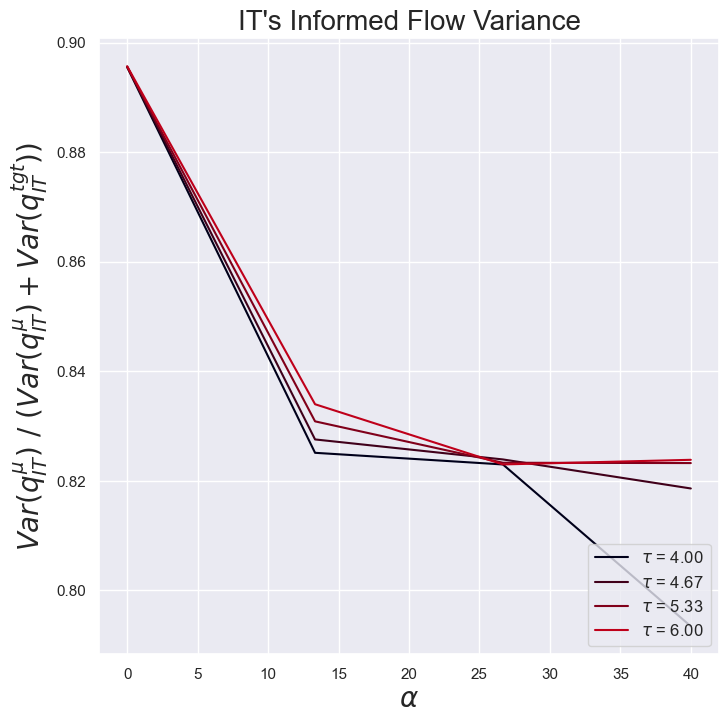

In [84]:
var_ratio_IT_informed_total

figure35 = plt.figure(figsize = (8,8))

for i in range(0,number_of_points):
    plt.plot(alpha_vector, var_ratio_IT_informed_total[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    #plt.plot(alpha_vector, ratio_var_p_pt_it_stationary_numerical_solver[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$ Var_{p}/Var_{p^{IT}}$ - Numerical Solver", linestyle = "dashed", color = colors[i])

plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var(q_{IT}^{\mu}) \ / \  (Var(q_{IT}^{\mu}) + Var(q_{IT}^{tgt}))$", fontsize = 20)
plt.legend(loc = 4, prop={'size': 12})
plt.title("IT's Informed Flow Variance", fontsize = 20)
plt.show()

## BETTER SCALE FOR INFORMED FLOW AND STOCHASTIC FLOW - PLOTTING BOTH IT AND NT TOGETHER

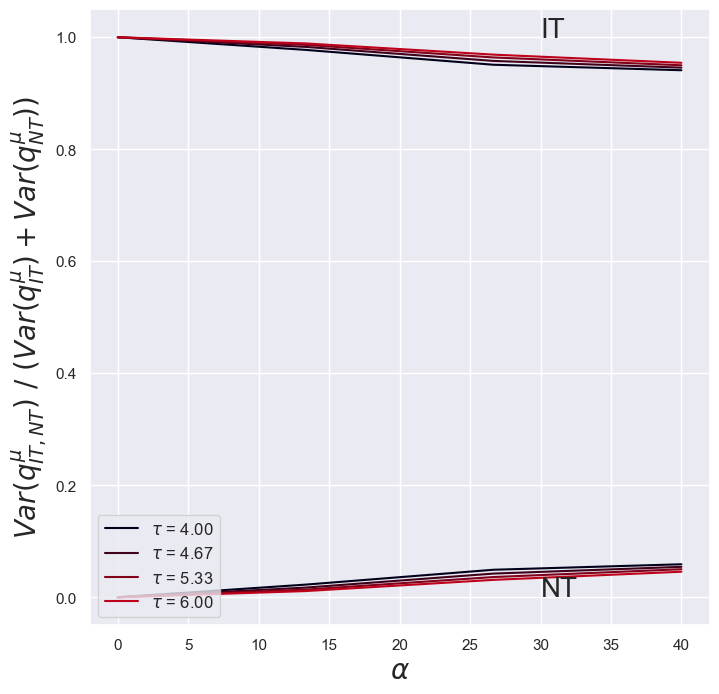

In [85]:
var_ratio_IT_informed_total

figure35 = plt.figure(figsize = (8,8))

for i in range(0,number_of_points):
    plt.plot(alpha_vector, scaled_var_ratio_NT_informed_total[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    plt.plot(alpha_vector, scaled_var_ratio_IT_informed_total[(i*number_of_points):(i*number_of_points + number_of_points)], color = color_conv((i)/number_of_points))


plt.text(30,0.0025,"NT", fontsize = 20)
plt.text(30,1,"IT", fontsize = 20)    
    
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var(q_{IT,NT}^{\mu}) \ / \  (Var(q_{IT}^{\mu}) + Var(q_{NT}^{\mu}))$", fontsize = 20)
plt.legend(loc = 3, prop={'size': 12})
plt.show()

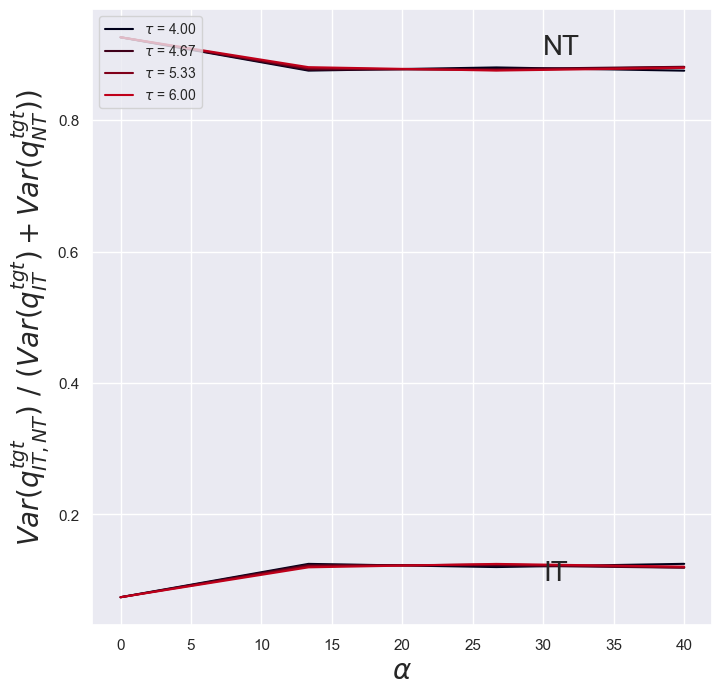

In [86]:
figure35 = plt.figure(figsize = (8,8))

for i in range(0,number_of_points):
    plt.plot(alpha_vector, scaled_var_ratio_NT_stochastic_total[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    plt.plot(alpha_vector, scaled_var_ratio_IT_stochastic_total[(i*number_of_points):(i*number_of_points + number_of_points)], color = color_conv((i)/number_of_points))

    
plt.text(30,0.1,"IT", fontsize = 20)
plt.text(30,0.9,"NT", fontsize = 20) 

plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$Var(q_{IT,NT}^{tgt}) \ / \  (Var(q_{IT}^{tgt}) + Var(q_{NT}^{tgt}))$", fontsize = 20)
plt.legend(loc = 2, prop={'size': 10})
plt.show()

IndexError: index 1 is out of bounds for axis 0 with size 1

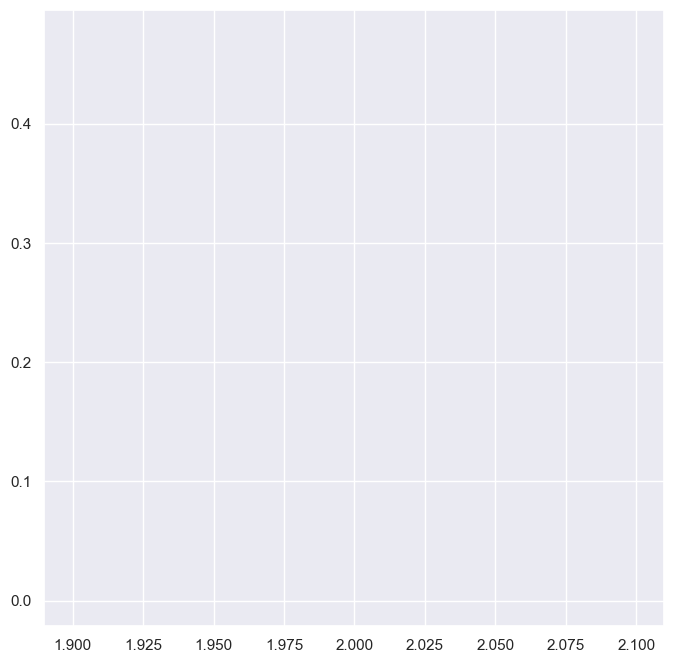

In [596]:
figure35 = plt.figure(figsize = (8,8))

informed_flow_variance = np.array(var_NT_informed) + np.array(var_IT_informed)
stochastic_flow_variance = np.array(var_NT_stochastic) + np.array(var_IT_stochastic)

#ratio_informed_stochastic_variance = np.array(informed_flow_variance)/ np.array((informed_flow_variance + stochastic_flow_variance))
k1 = np.array(var_NT_informed)
k2 = np.array(var_IT_informed)
k3 = np.array(var_NT_stochastic)
k4 = np.array(var_IT_stochastic)

#k = k1/k2

for i in range(0,number_of_points):
    #plt.plot(alpha_vector, k[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = colors[i])
    plt.plot(alpha_vector, k1[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    plt.plot(alpha_vector, k3[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    plt.plot(alpha_vector, k2[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    plt.plot(alpha_vector, k4[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points))

    
    
plt.xlabel(r"$\alpha$", fontsize = 20)
#plt.ylabel(r"$Var(q_{{\mu}}) \ / \  Var(q)$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 10})
plt.show()

## Propagators

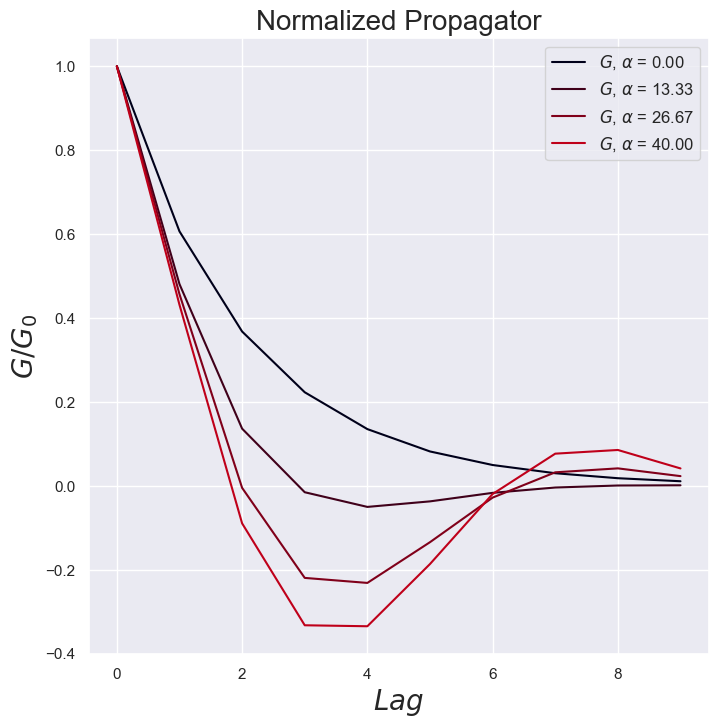

In [89]:
figure35 = plt.figure(figsize = (8,8))

for i in range(0,1):
    for j in range(0,number_of_points):
        #plt.plot(np.arange(0,10), propagators[i*number_of_points + j][0,0:10], label = r"$G$, $\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = colors[j])
        plt.plot(np.arange(0,10), propagators[i*number_of_points + j][0,0:10]/propagators[i*number_of_points + j][0,0], label = r"$G$, $\alpha$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points))
   
plt.title("Normalized Propagator", fontsize = 20)
plt.xlabel(r"$Lag$", fontsize = 20)
plt.ylabel(r"$G/G_{0}$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})
plt.show()

**Evaluating Propagator Half Life**

<Figure size 800x800 with 0 Axes>

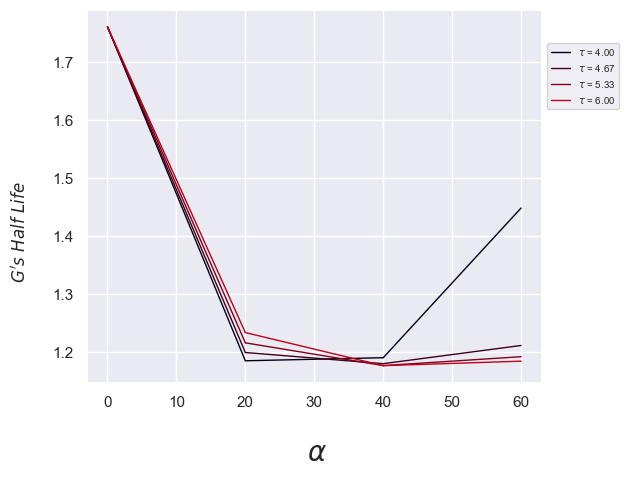

In [116]:
figure35 = plt.figure(figsize = (8,8))

half_life_G = []

for i in range (0,number_of_points):
    for j in range(0,number_of_points):
        half_life_G.append(get_halflife(propagators[i*number_of_points + j][0,:]))

        
fig, axis = plt.subplots(1, 1, sharey = False)
for i in range(len(tau_vector)):
    for j in range(len(alpha_vector)-1):
        xj = alpha_vector[j:j+2]
        yj = half_life_G[(i*number_of_points + j):(i*number_of_points + j)+2]
        cj = color_conv(i/number_of_points)
        if(j == 1):
            axis.plot(xj, yj, color = cj, linewidth='1', label = r"$\tau$ = {:.2f}".format(tau_vector[i])) 
            #axis[0].set_title("NT") 
            axis.legend(loc = 3 ,prop={'size': 7}, bbox_to_anchor=(1, 0.72)) 
        else:
            axis.plot(xj, yj, color = cj, linewidth='1') 
            #axis[0].set_title("NT") 
       

fig.supxlabel(r"$\alpha$", fontsize = 20)
fig.supylabel(r"$G's \ Half \ Life$", fontsize = 12)##
#fig.legend(tau_vector, loc = 1, prop={'size': 8})
plt.tight_layout() 
plt.show()

## Noise Trader's Penalty Functions - $P_{t}^{NT,hedge}$ and $P_{t}^{NT,tracking}$ 

In [129]:
def noise_trader_costs_t(NT_total_position_simulations, target_portfolio_total_position_simulations, NT_order_flows, price_simulations_list, alpha_vector, tau_vector, number_of_points):
    
    T = NT_total_position_simulations[0].shape[0]
        
    costs_nt = []
    costs_tracking = []
    costs_hedge = []
    
    p = 0
    
    for tau_index in range(0, number_of_points):
        for alpha_index in range(0, number_of_points):
            
            current_costs_tracking_matrix = np.zeros((T, number_of_simulations)) 
            current_costs_hedge_matrix = np.zeros((T, number_of_simulations)) 
            current_costs_tracking = np.zeros(T)
            current_costs_hedge = np.zeros(T)
            
            for i in range(0,T):
                for j in range(0, number_of_simulations):
                    current_alpha = alpha_vector[alpha_index]
                    current_tau = tau_vector[tau_index]
                    exp_memory_decay = np.zeros(i+1)
                    for k in range(0,i+1):
                        exp_memory_decay[k] = np.exp(-k/current_tau)
                    
                    current_costs_tracking_matrix[i,j] = sum(np.multiply(exp_memory_decay, (NT_total_position_simulations[tau_index*number_of_points + alpha_index][i,j] - target_portfolio_total_position_simulations[tau_index*number_of_points + alpha_index][i,j])**2))
                    current_costs_hedge_matrix[i,j] = current_alpha*sum(np.multiply(price_simulations_list[tau_index*number_of_points + alpha_index][:(i+1),j], NT_order_flows[tau_index*number_of_points + alpha_index][:(i+1),j]))
                    
            for i in range(0,T):
                current_costs_tracking[i] = np.mean(current_costs_tracking_matrix[i,:])
                current_costs_hedge[i] = np.mean(current_costs_hedge_matrix[i,:])
                
            
            costs_tracking.append(current_costs_tracking[::-1])
            costs_hedge.append(current_costs_hedge[::-1])
            costs_nt.append(current_costs_tracking[::-1] + current_costs_hedge[::-1])
            
            p += 1
            print("Test completed {:.2f} %.\n".format((100*p)/(number_of_points*number_of_points)))
        
                        
    return costs_tracking, costs_hedge, costs_nt    

In [130]:
cost_tracking, cost_hedge, cost_nt   = noise_trader_costs_t(NT_total_position_simulations, target_portfolio_total_position_simulations, NT_order_flows, price_simulations_list, alpha_vector, tau_vector, number_of_points)


Test completed 2.78 %.

Test completed 5.56 %.

Test completed 8.33 %.

Test completed 11.11 %.

Test completed 13.89 %.

Test completed 16.67 %.

Test completed 19.44 %.

Test completed 22.22 %.

Test completed 25.00 %.

Test completed 27.78 %.

Test completed 30.56 %.

Test completed 33.33 %.

Test completed 36.11 %.

Test completed 38.89 %.

Test completed 41.67 %.

Test completed 44.44 %.

Test completed 47.22 %.

Test completed 50.00 %.

Test completed 52.78 %.

Test completed 55.56 %.

Test completed 58.33 %.

Test completed 61.11 %.

Test completed 63.89 %.

Test completed 66.67 %.

Test completed 69.44 %.

Test completed 72.22 %.

Test completed 75.00 %.

Test completed 77.78 %.

Test completed 80.56 %.

Test completed 83.33 %.

Test completed 86.11 %.

Test completed 88.89 %.

Test completed 91.67 %.

Test completed 94.44 %.

Test completed 97.22 %.

Test completed 100.00 %.



**NT's Mean Hedge Cost**

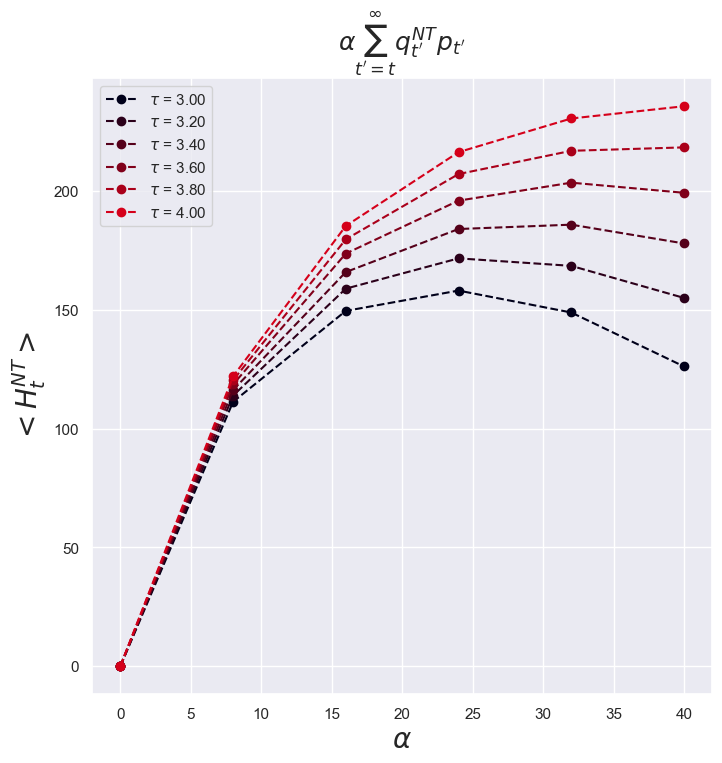

In [137]:
figure29 = plt.figure(figsize = (8,8))

mean_hedge = []

for i in range (0,number_of_points):
    for j in range(0,number_of_points):
        mean_hedge.append(np.mean(cost_hedge[i*number_of_points + j]))


for i in range (0,number_of_points):
    plt.plot(alpha_vector, mean_hedge[(i*number_of_points):(i*number_of_points + number_of_points)], color = color_conv((i)/number_of_points), label = r"$\tau$ = {:.2f}".format(tau_vector[i]),  linestyle='dashed', marker='o')
        

from matplotlib import rcParams
rcParams['axes.titlepad'] = 20 
plt.title(r"$\alpha\sum_{t'=t}^{\infty}q_{t'}^{NT}p_{t'}}$", fontsize = 18)
#plt.title("NT's Mean Hedge Penalty", fontsize = 20)

plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$<H_{t}^{NT}>$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})

plt.legend()  

**NT's Mean Tracking Cost**

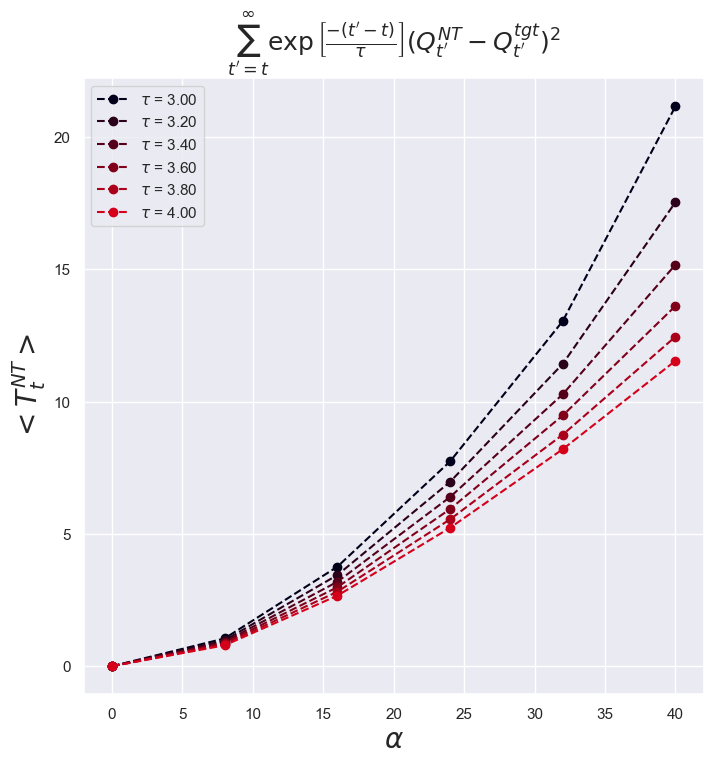

In [138]:
figure29 = plt.figure(figsize = (8,8))

mean_tracking = []

for i in range (0,number_of_points):
    for j in range(0,number_of_points):
        mean_tracking.append(np.mean(cost_tracking[i*number_of_points + j]))


for i in range (0,number_of_points):
    plt.plot(alpha_vector, mean_tracking[(i*number_of_points):(i*number_of_points + number_of_points)], color = color_conv((i)/number_of_points), label = r"$\tau$ = {:.2f}".format(tau_vector[i]),  linestyle='dashed', marker='o')

    

from matplotlib import rcParams
rcParams['axes.titlepad'] = 20 
plt.title(r"$\sum_{t'=t}^{\infty}\exp{\left[\frac{-(t'-t)}{\tau}\right]}(Q_{t'}^{NT} - Q_{t'}^{tgt})^{2}$", fontsize = 18)
    
#plt.title("NT's Mean Tracking Cost", fontsize = 20)
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$<T_{t}^{NT}>$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})

plt.legend()  

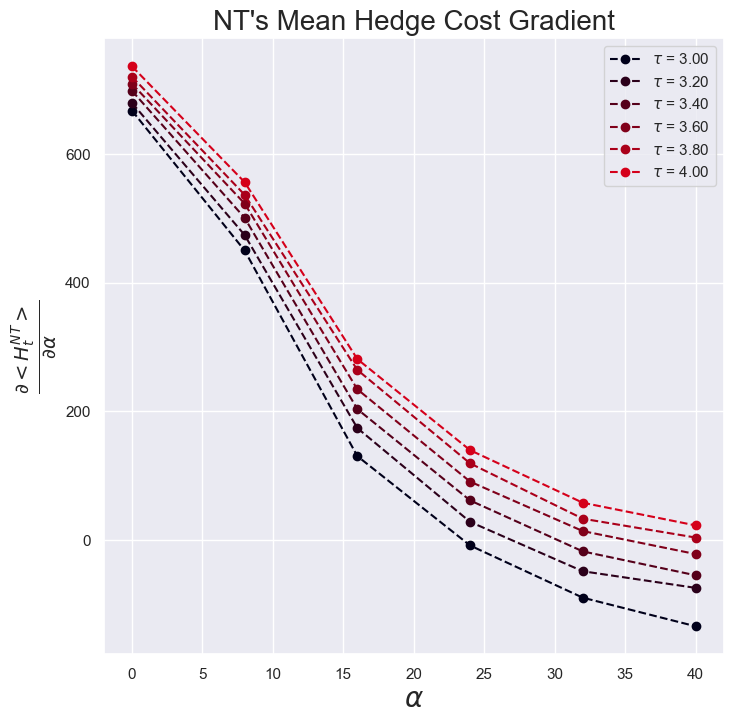

In [95]:
figure29 = plt.figure(figsize = (8,8))


dx = 1/(number_of_points)


for i in range (0,number_of_points):
    plt.plot(alpha_vector, np.gradient(mean_hedge[(i*number_of_points):(i*number_of_points + number_of_points)],dx), color = color_conv((i)/number_of_points), label = r"$\tau$ = {:.2f}".format(tau_vector[i]),  linestyle='dashed', marker='o')

plt.title("NT's Mean Hedge Cost Gradient", fontsize = 20)
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$\frac{\partial{<H_{t}^{NT}>}}{\partial{\alpha}}$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})

plt.legend()  


## Lagged auto-correlations between NT's order flow and IT's order flow

In [216]:
lagged_correlations = []
lags = 5
i = 0
for tau_index in range(0,number_of_points):
    for alpha_index in range(0,number_of_points):
        lagged_correlations.append(return_series_lagged_correlation(IT_order_flows[number_of_points*tau_index + alpha_index], NT_order_flows[number_of_points*tau_index + alpha_index], number_of_simulations, lags))
        i += 1
        print("Test completed {:.2f} %.\n".format((100*i)/(number_of_points*number_of_points)))

Test completed 2.78 %.

Test completed 5.56 %.

Test completed 8.33 %.

Test completed 11.11 %.

Test completed 13.89 %.

Test completed 16.67 %.

Test completed 19.44 %.

Test completed 22.22 %.

Test completed 25.00 %.

Test completed 27.78 %.

Test completed 30.56 %.

Test completed 33.33 %.

Test completed 36.11 %.

Test completed 38.89 %.

Test completed 41.67 %.

Test completed 44.44 %.

Test completed 47.22 %.

Test completed 50.00 %.

Test completed 52.78 %.

Test completed 55.56 %.

Test completed 58.33 %.

Test completed 61.11 %.

Test completed 63.89 %.

Test completed 66.67 %.

Test completed 69.44 %.

Test completed 72.22 %.

Test completed 75.00 %.

Test completed 77.78 %.

Test completed 80.56 %.

Test completed 83.33 %.

Test completed 86.11 %.

Test completed 88.89 %.

Test completed 91.67 %.

Test completed 94.44 %.

Test completed 97.22 %.

Test completed 100.00 %.



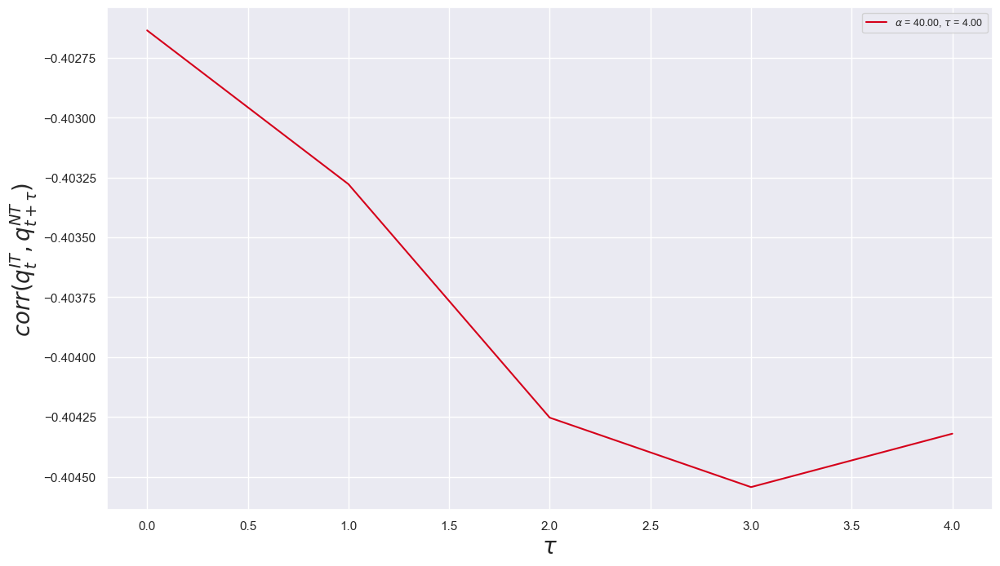

In [236]:
figure29 = plt.figure(figsize = (14,8))

for i in range (5,6):
    for j in range(5,6):
        plt.plot(np.arange(0,lags), lagged_correlations[i*number_of_points + j], label = r"$\alpha$ = {:.2f}, $\tau$ = {:.2f}".format(alpha_vector[j], tau_vector[i]), color = color_conv((j)/number_of_points))

plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$corr(q^{IT}_{t},q^{NT}_{t + \tau})$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 9})

## **Informational Market Efficiency**<br/><br/>
$Var_{(p)}$ as function of $\alpha$<br/><br/>

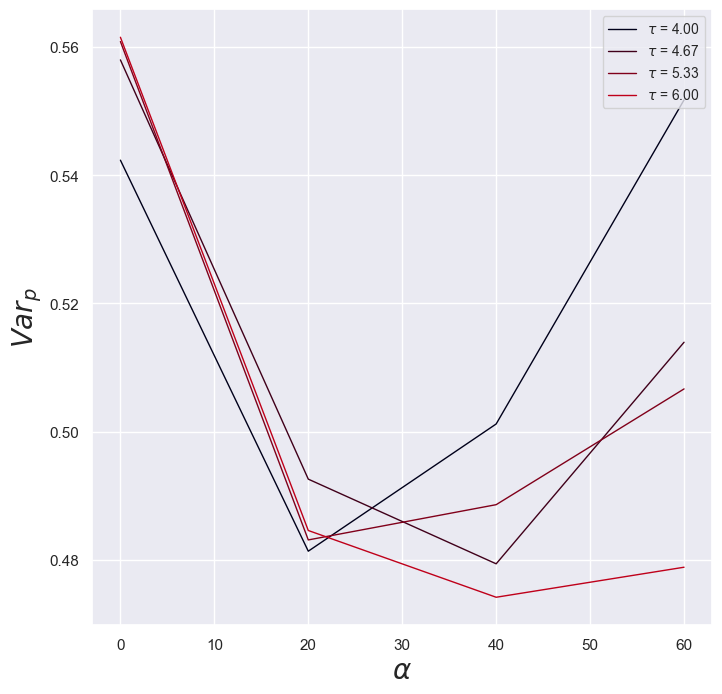

In [119]:

figure35 = plt.figure(figsize = (8,8))

var_p_stationary = []
var_p_stationary_numerical_solver = []


for i in range(0, number_of_points*number_of_points):
    var_p_stationary.append((var_price_t[i][-1]))
    var_p_stationary_numerical_solver.append(ACFs_P[i][-1][0,0])
    

for i in range(0,number_of_points):
    plt.plot(alpha_vector, var_p_stationary[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$\tau$ = {:.2f}".format(tau_vector[i]), color = color_conv((i)/number_of_points), linewidth = 1)
    #plt.plot(alpha_vector, var_p_stationary_numerical_solver[(i*number_of_points):(i*number_of_points + number_of_points)], label = r"$ Var_{p}/Var_{p^{IT}}$ - Numerical Solver", linestyle = "dashed", color = colors[i])

#plt.title("Informational Market Efficiency", fontsize = 20)
    
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$ Var_{p}$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 10})
plt.show()



##  $Var_{p}^{IT}$ -- It is constant for all combinations of $\alpha$'s and $\tau$'s

In [126]:
var_p_IT = []
for i in range(0, number_of_points*number_of_points):
    var_p_IT.append(var_IT_estimated_price_t[i][-1])

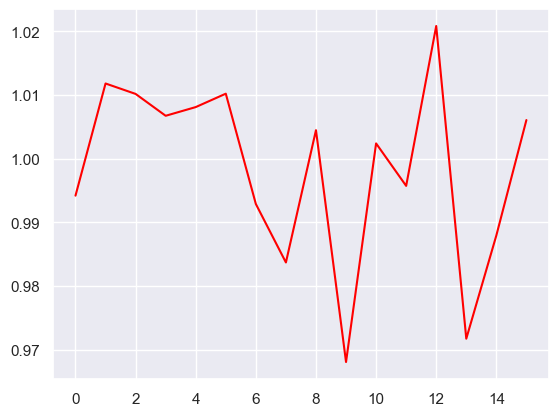

In [127]:
plt.plot(var_p_IT, color = "red")

## Studying if the NT is an Order Spllitng Trader (ST) or a Random Trader (RT)

In [355]:
import statsmodels.api as sm
from scipy.optimize import curve_fit
from statsmodels.distributions.empirical_distribution import ECDF
#from scipy.stats import chisquare 
from scipy.stats import ks_2samp


def power_law_runs(x, c, decay):
    return c*(x**(-1*(decay + 1)))

def exp_law(x, c, decay):
    return c*(np.exp(-x/decay))

def exp_law_2(x, decay):
    return (np.exp(1/decay) - 1)*(np.exp(-x/decay))

def power_law_sign_ACF_Q(x, c, decay):
    return c*(x**(-1*decay))


def return_order_flow_runs(order_flows, ACFs_Q, alpha_vector, tau_vector, indexes, excess_demand = False, percent_to_start = 0.25, percent_to_finish = 0.5):
    print(f"Number of Different Noise Traders Analyzed: {len(indexes)}")
    number_of_points = int(sqrt(len(order_flows)))
    decays = []
    prefactors = []
    distribution_means = []
    decays_numerical_solver = []
    alphas = []
    max_lengths = []
    taus = []
    acfs_q = []
    
    for index in indexes:
        #alpha = alpha_vector[index % number_of_points]
        alpha = alpha_vector[index]
        #tau = tau_vector[int(index / number_of_points)]
        tau = tau_vector[index]
        print(f"Alpha: {alpha}")
        print(f"Tau: {tau}")
        alphas.append(alpha)
        taus.append(tau)
        order_flow = order_flows[index]
        T = order_flow.shape[0]
        number_of_simulations = order_flow.shape[1]
        concatenated_order_flows = []

        for sim in range(0,number_of_simulations):
            concatenated_order_flows.extend(order_flow[:,sim])
        
        concatenated_order_flows_sign = np.sign(concatenated_order_flows)
                
        if(excess_demand == False):
            runs_order_flows_sign = []
            
            for sim in range(0,number_of_simulations):
                order = 0
                order_flow_sign = np.sign(order_flow[:,sim])
                while order < (len(order_flow_sign)-1):
                    count = 1
                    while(order < (len(order_flow_sign)-1) and order_flow_sign[order] == order_flow_sign[order+1]):
                        count = count + 1
                        order = order + 1
                    runs_order_flows_sign.append(count)
                    order = order + 1
                    count = 1
               
            kde = sns.kdeplot(runs_order_flows_sign, bw_method = 0.5, cut = 0, color = color_conv((index)/len(indexes)))
            plt.xlabel("Metaorder Length")
            line = kde.lines[0]
            x, y = line.get_data()
            max_length = np.max(x)
            max_lengths.append(max_length)
            
        else:
            acf = sm.tsa.acf(concatenated_order_flows_sign, nlags = T-1)
            #acf = return_mean_covariance(pd.DataFrame(order_flow), pd.DataFrame(order_flow), T, number_of_simulations)
            acfs_q.append(acf)
            y = acf
            x = np.arange(0,T)
            
        if(excess_demand == False):
            parameters, cov = curve_fit(f = exp_law, xdata = x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], ydata = y[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], p0 = [1,1], maxfev= 5000000)
        else:
            parameters, cov = curve_fit(f = exp_law, xdata = x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], ydata = y[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], p0 = [1,1], maxfev= 5000000)

        prefactors.append(parameters[0])
        decays.append(parameters[1])
        
        print(f"Prefactor: {parameters[0]}")
        print(f"Decay: {parameters[1]}")
        
        if(excess_demand == False):
            vlaw = np.vectorize(exp_law, excluded=['c', 'decay'])
        else:
            vlaw = np.vectorize(exp_law, excluded=['c', 'decay'])

        if(excess_demand == False):
            fitted_curve = vlaw(x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], parameters[0], parameters[1])
        else:
            fitted_curve = vlaw(x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], parameters[0], parameters[1])

        plt.figure()
        if(excess_demand == False):
            print(f"Distribution Mean - MetaOrder Length: {np.mean(x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)])}")
            distribution_means.append(np.mean(x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)]))
            #distribution_means.append(np.mean(x))
            plt.plot(x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], y[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], label = "density", color = color_conv((index)/len(indexes)))
            plt.plot(x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], fitted_curve, label = "fit", linestyle = "dashed", color = color_conv((index)/len(indexes)))
            plt.ylabel("log(Density Tail)")
            plt.xlabel("Metaorder Length")
        else:
            plt.plot(x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], y[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], label = r"$ACF_{Q}$", color = color_conv((index)/len(indexes)))
            plt.plot(x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], fitted_curve, label = "fit", linestyle = "dashed", color = color_conv((index)/len(indexes)))
            plt.ylabel("log(ACF Tail)")
            plt.xlabel("Lag")

        
        if(excess_demand == True):
            parameters_numerical_solver, cov_numerical_solver = curve_fit(f = exp_law, xdata = x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], ydata = ACFs_Q[index][-1][0,int(len(x)*percent_to_start):int(len(x)*percent_to_finish)]/ACFs_Q[index][-1][0,0], p0 = [1,1], maxfev= 5000000)
            decays_numerical_solver.append(parameters_numerical_solver[1])
            print(f"Decay Numerical Solver: {parameters_numerical_solver[1]}")
            plt.plot(x[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], ACFs_Q[index][-1][0,int(len(x)*percent_to_start):int(len(x)*percent_to_finish)]/ACFs_Q[index][-1][0,0], linestyle = 'dashdot', label = "numerical solver")

        p_value = ks_2samp(y[int(len(x)*percent_to_start):int(len(x)*percent_to_finish)], fitted_curve, method = "asymp").pvalue
        
        print(f"p-value: {p_value}")
        
        plt.yscale('log') 
        plt.legend()
        plt.show()
        
    if(excess_demand == False):  
        return alphas, taus, decays, max_lengths, distribution_means, prefactors
    else:
        return alphas, taus, decays, prefactors, acfs_q

In [356]:
alpha_vector

array([1., 1., 1., 1., 1.])

In [357]:
tau_vector

array([1.000000e-04, 2.500075e+00, 5.000050e+00, 7.500025e+00,
       1.000000e+01])

Number of Different Noise Traders Analyzed: 5
Alpha: 1.0
Tau: 0.0001
Prefactor: 0.6210438328797466
Decay: 2.080684809782727
Distribution Mean - MetaOrder Length: 3.1859296482412054
p-value: 1.0


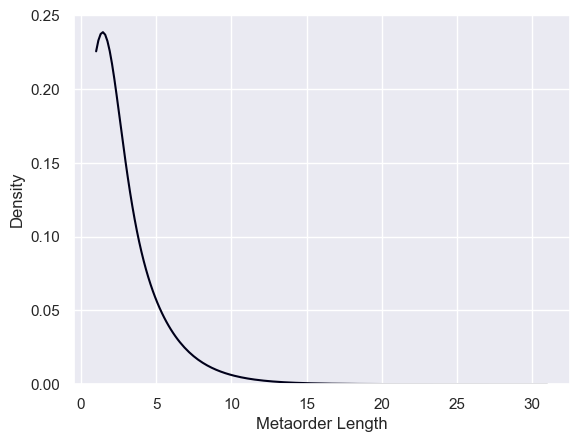

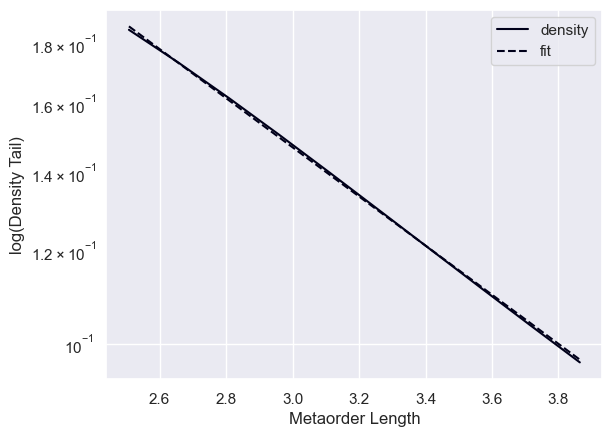

Alpha: 1.0
Tau: 2.5000750000000003
Prefactor: 0.932981084190336
Decay: 1.621059219444063
Distribution Mean - MetaOrder Length: 2.675879396984924
p-value: 1.0


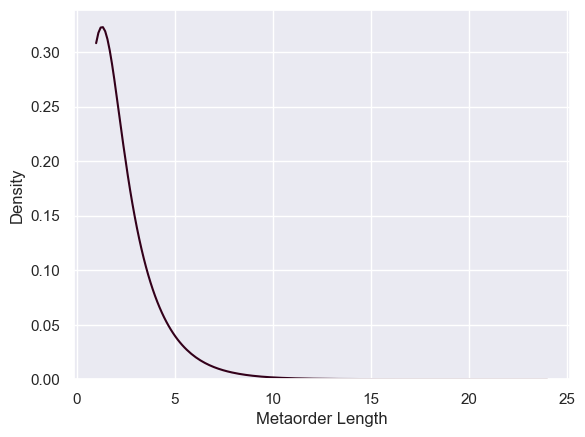

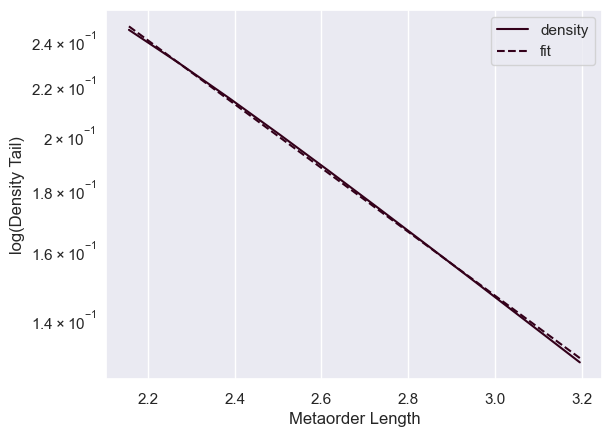

Alpha: 1.0
Tau: 5.00005
Prefactor: 0.9784918536638113
Decay: 1.5703174899063919
Distribution Mean - MetaOrder Length: 2.6030150753768844
p-value: 1.0


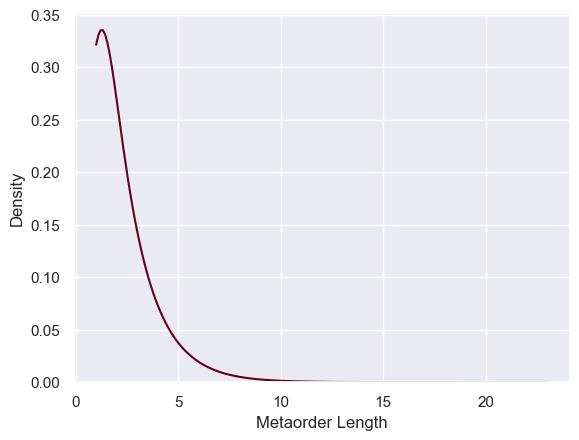

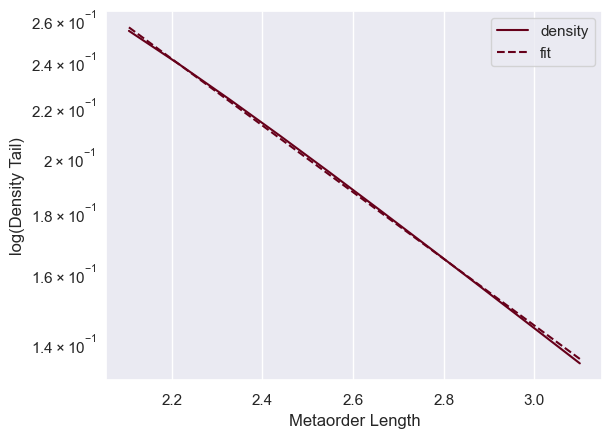

Alpha: 1.0
Tau: 7.500025
Prefactor: 1.0179144523112456
Decay: 1.5311702098493427
Distribution Mean - MetaOrder Length: 2.675879396984924
p-value: 1.0


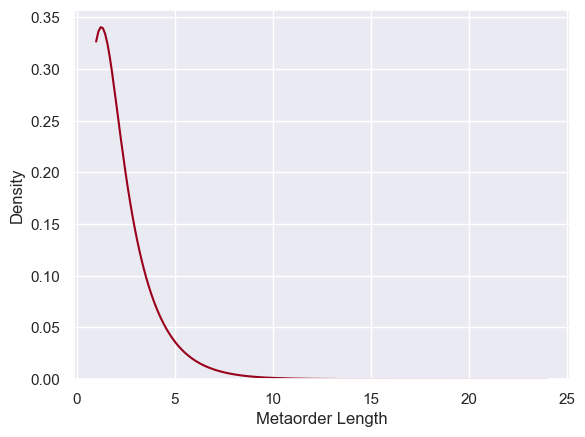

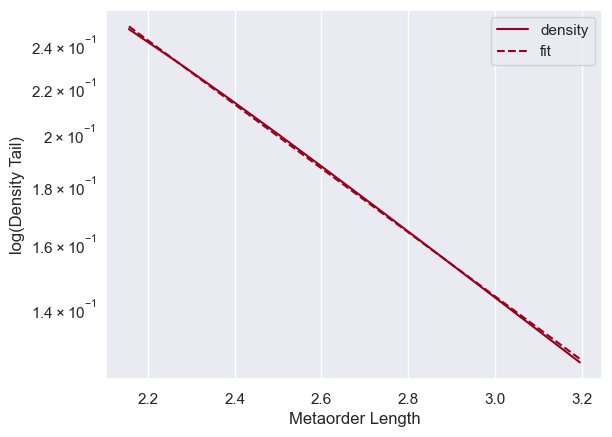

Alpha: 1.0
Tau: 10.0
Prefactor: 1.0172714507228322
Decay: 1.5306081037534793
Distribution Mean - MetaOrder Length: 2.6030150753768844
p-value: 1.0


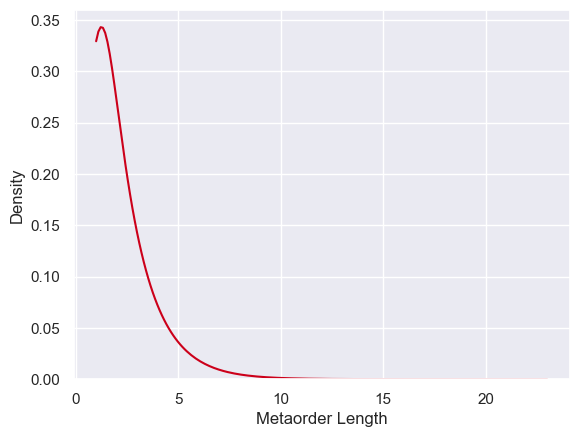

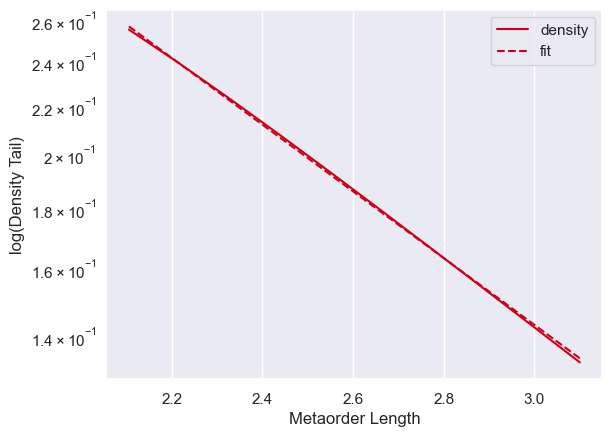

In [358]:
alphas_NT, taus_NT, decays_NT, max_lengths_NT, distribution_mean_NT, prefactor_NT = return_order_flow_runs(NT_order_flows, ACFs_Q, alpha_vector, tau_vector, indexes = np.arange(0,5), excess_demand = False, percent_to_start = 0.05, percent_to_finish = 0.1)

Number of Different Noise Traders Analyzed: 5
Alpha: 1.0
Tau: 0.0001
Prefactor: 0.5794283968042311
Decay: 2.2037947561618774
Distribution Mean - MetaOrder Length: 3.7688442211055273
p-value: 1.0


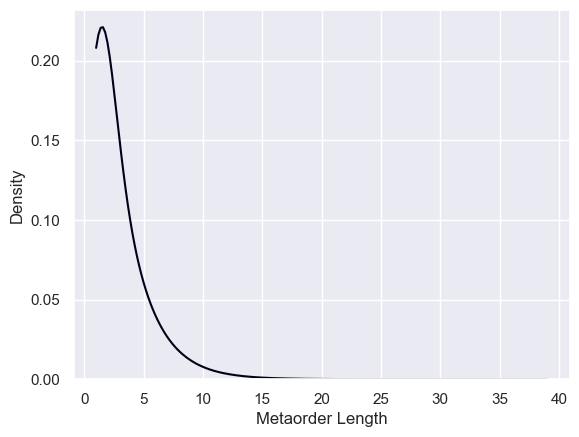

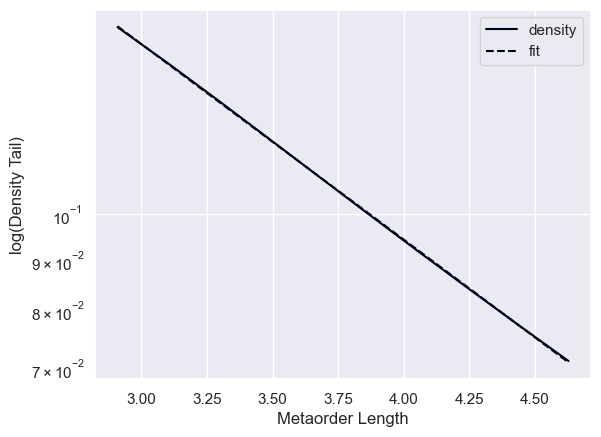

Alpha: 1.0
Tau: 2.5000750000000003
Prefactor: 0.6060067777474617
Decay: 2.194764598730392
Distribution Mean - MetaOrder Length: 3.1859296482412054
p-value: 1.0


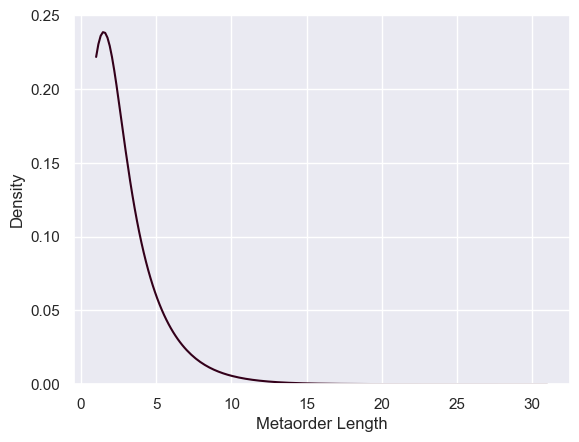

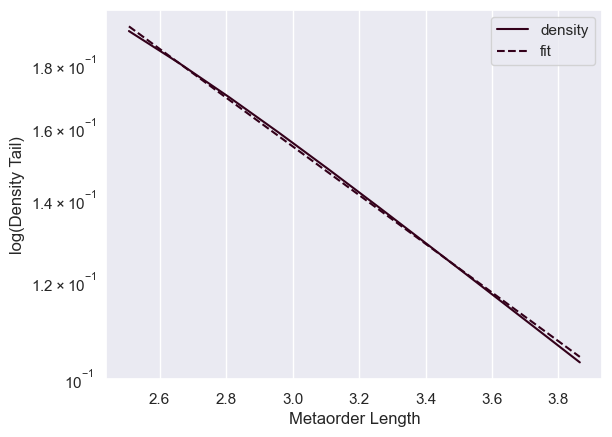

Alpha: 1.0
Tau: 5.00005
Prefactor: 0.624286489706914
Decay: 2.155361749603004
Distribution Mean - MetaOrder Length: 3.258793969849246
p-value: 1.0


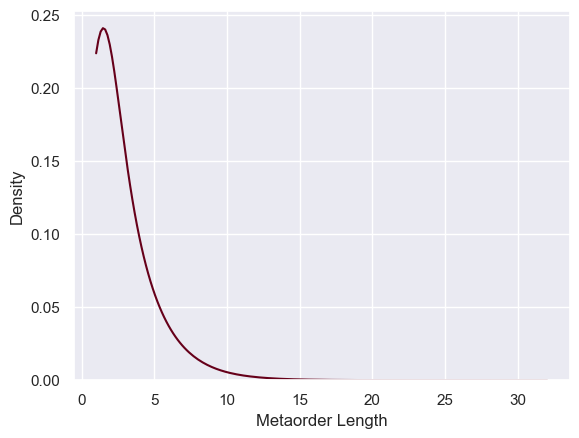

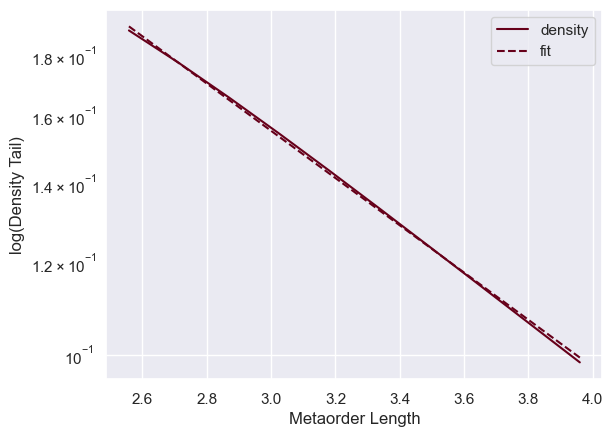

Alpha: 1.0
Tau: 7.500025
Prefactor: 0.6293025367486732
Decay: 2.14403359279838
Distribution Mean - MetaOrder Length: 3.258793969849246
p-value: 1.0


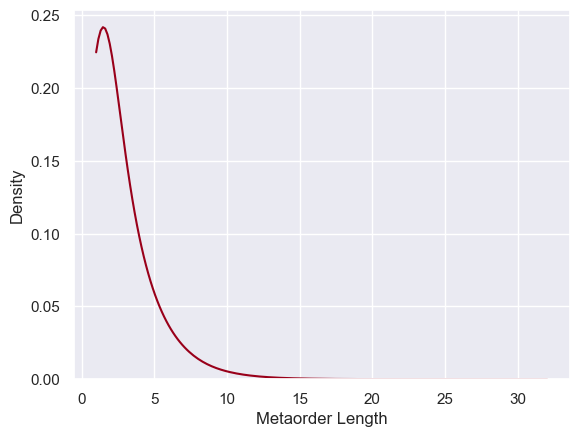

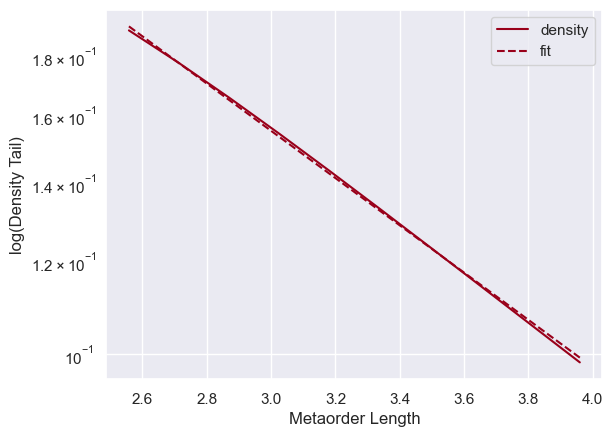

Alpha: 1.0
Tau: 10.0
Prefactor: 0.6014156919294968
Decay: 2.2149017429444378
Distribution Mean - MetaOrder Length: 3.040201005025126
p-value: 1.0


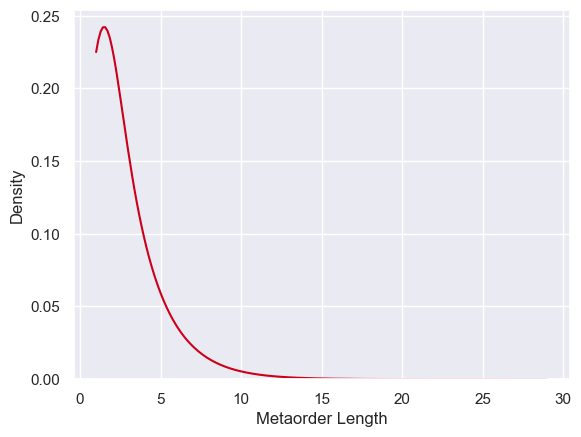

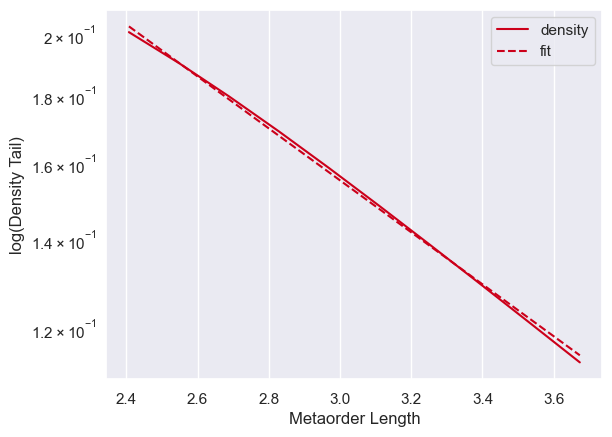

In [360]:
alphas_IT, taus_IT, decays_IT, max_lengths_IT, distribution_mean_IT, prefactor_IT = return_order_flow_runs(IT_order_flows, ACFs_Q, alpha_vector, tau_vector, indexes = np.arange(0,5), excess_demand = False, percent_to_start = 0.05, percent_to_finish = 0.1)

Number of Different Noise Traders Analyzed: 5
Alpha: 1.0
Tau: 0.0001
Prefactor: 1.0378406269203835
Decay: 1.4752503102824817
Distribution Mean - MetaOrder Length: 3.040201005025126
p-value: 1.0


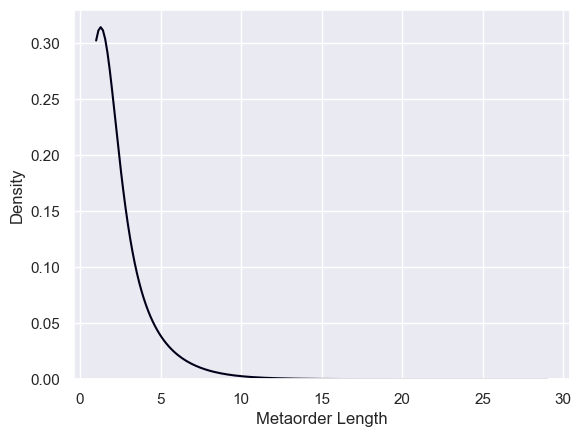

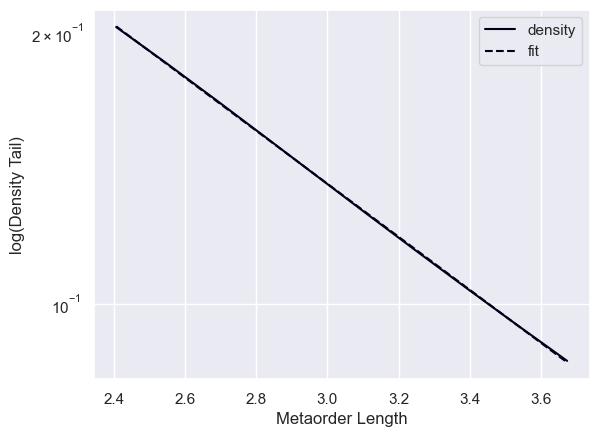

Alpha: 1.0
Tau: 2.5000750000000003
Prefactor: 1.0536313770707646
Decay: 1.4980013347172043
Distribution Mean - MetaOrder Length: 2.8216080402010046
p-value: 1.0


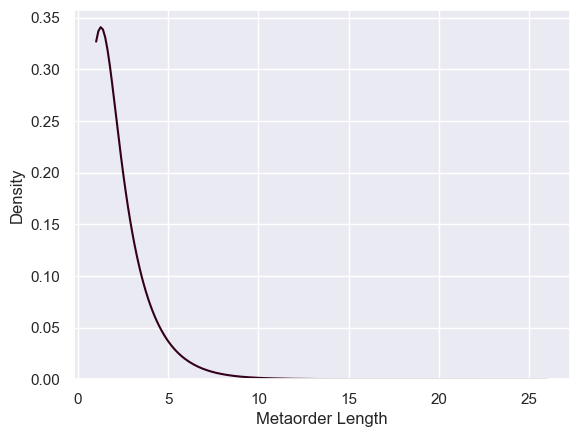

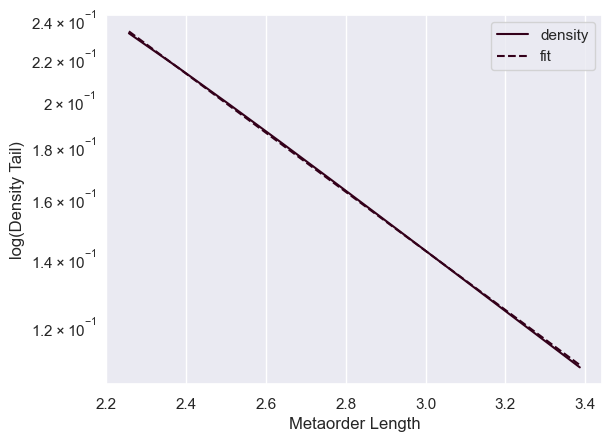

Alpha: 1.0
Tau: 5.00005
Prefactor: 1.032761584007667
Decay: 1.514664894654818
Distribution Mean - MetaOrder Length: 2.6030150753768844
p-value: 1.0


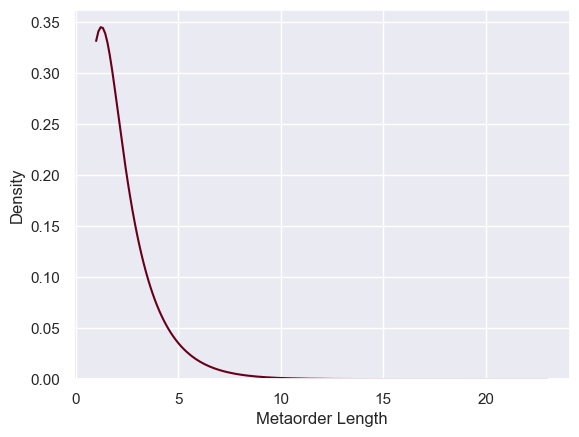

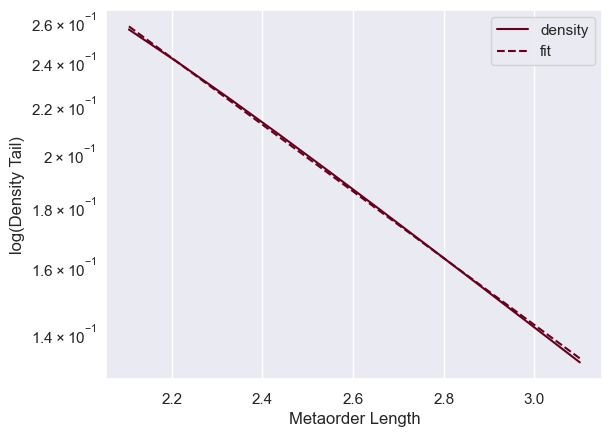

Alpha: 1.0
Tau: 7.500025
Prefactor: 1.0996819982849035
Decay: 1.4614315578006383
Distribution Mean - MetaOrder Length: 2.894472361809045
p-value: 1.0


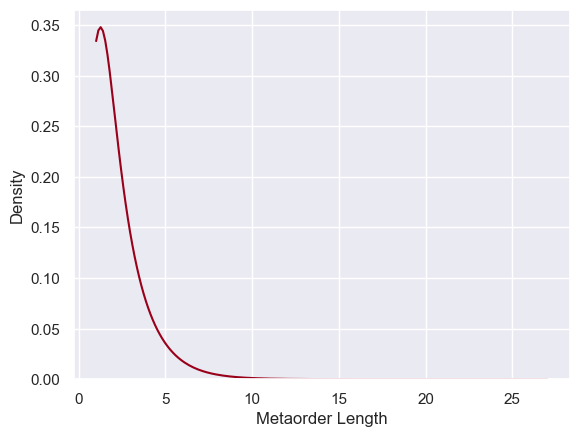

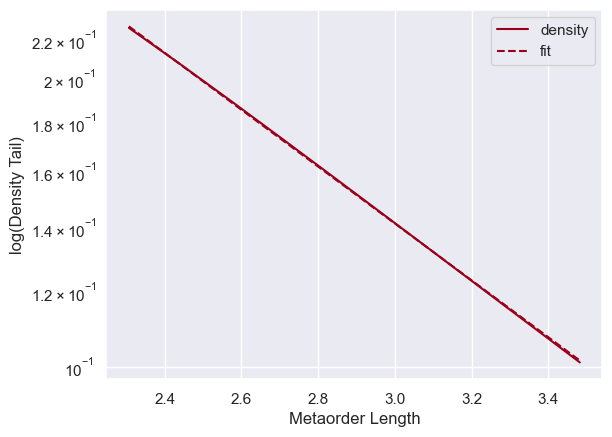

Alpha: 1.0
Tau: 10.0
Prefactor: 1.0071315996758803
Decay: 1.5382338146604841
Distribution Mean - MetaOrder Length: 2.457286432160804
p-value: 1.0


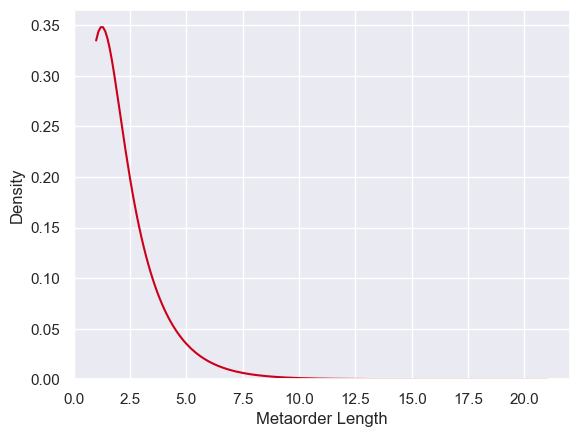

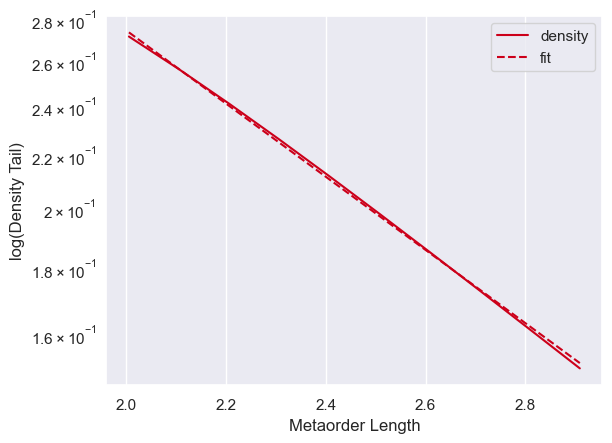

In [361]:
alphas_MM, taus_MM, decays_MM, max_lengths_MM, distribution_means_MM, prefactors_MM = return_order_flow_runs(MM_order_flows, ACFs_Q, alpha_vector, tau_vector, indexes = np.arange(0,5), excess_demand = False, percent_to_start = 0.05, percent_to_finish = 0.1)

Number of Different Noise Traders Analyzed: 5
Alpha: 1.0
Tau: 0.0001
Prefactor: 0.20041212039117617
Decay: 1.9527955062994435
Decay Numerical Solver: 1.9518319319793451
p-value: 1.0


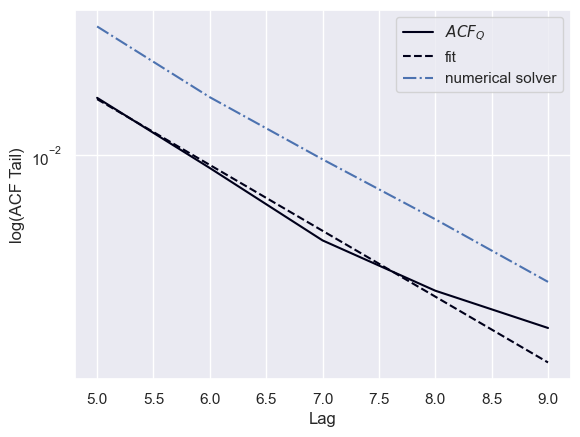

Alpha: 1.0
Tau: 2.5000750000000003
Prefactor: 0.0323604132566266
Decay: 1.561655021192038
Decay Numerical Solver: 2.0533274065502085
p-value: 1.0


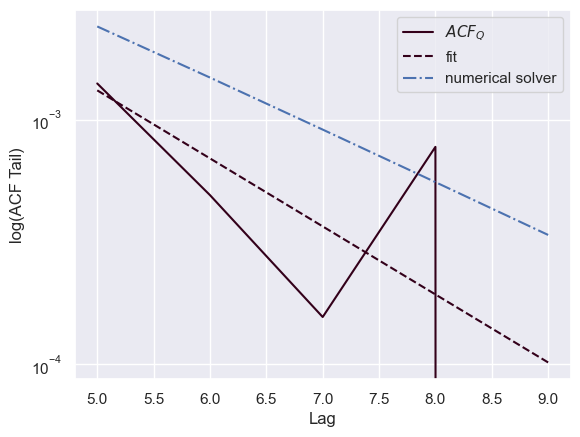

Alpha: 1.0
Tau: 5.00005
Prefactor: 0.00410263649508608
Decay: 3.2809394452817604
Decay Numerical Solver: 2.063738354653646
p-value: 1.0


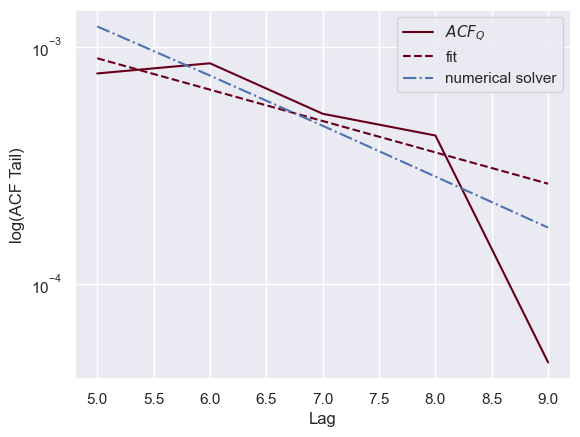

Alpha: 1.0
Tau: 7.500025
Prefactor: 3.882563244416769e+19
Decay: 0.09191767606183068
Decay Numerical Solver: 2.0672854323086827
p-value: 0.31999999999999984


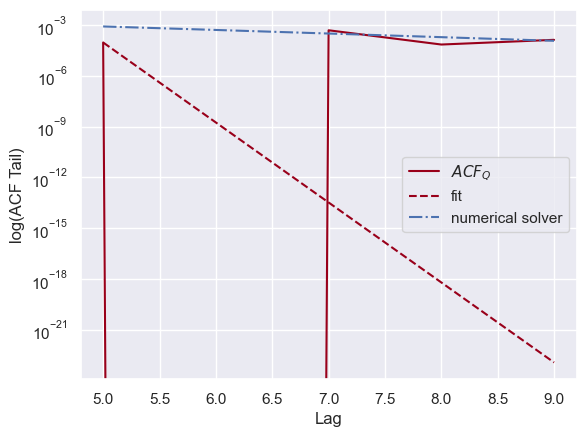

Alpha: 1.0
Tau: 10.0
Prefactor: 3288363727608.202
Decay: 0.129519156129162
Decay Numerical Solver: 2.0691095761391494
p-value: 0.07999999999999996


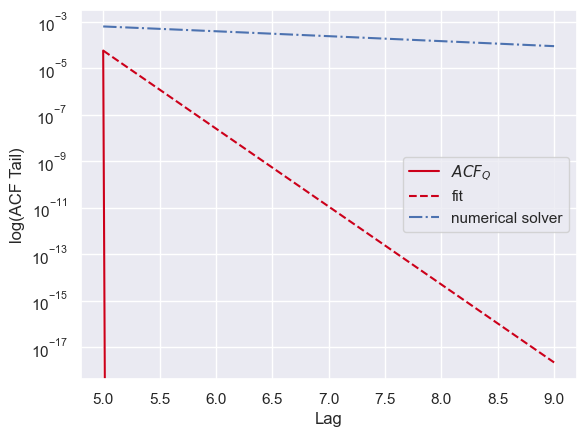

In [362]:
alphas_Q, taus_Q, decays_Q, prefactor_Q, acfs_q = return_order_flow_runs(MM_order_flows, ACFs_Q, alpha_vector, tau_vector, indexes = np.arange(0,5), excess_demand = True, percent_to_start = 0.05, percent_to_finish = 0.1)

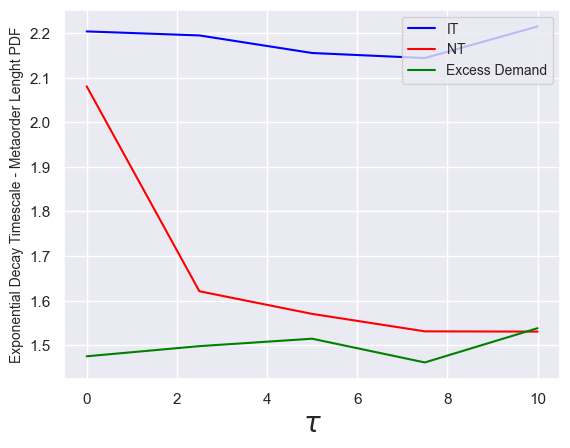

In [371]:
plt.plot(taus_IT, decays_IT, color = "blue", label = "IT")
plt.plot(taus_NT, decays_NT, color = "red", label = "NT")#
plt.plot(taus_MM, decays_MM, color = "green", label = "Excess Demand")
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel("Exponential Decay Timescale - Metaorder Lenght PDF", fontsize = 10)
plt.legend(loc = 1, prop={'size': 10})

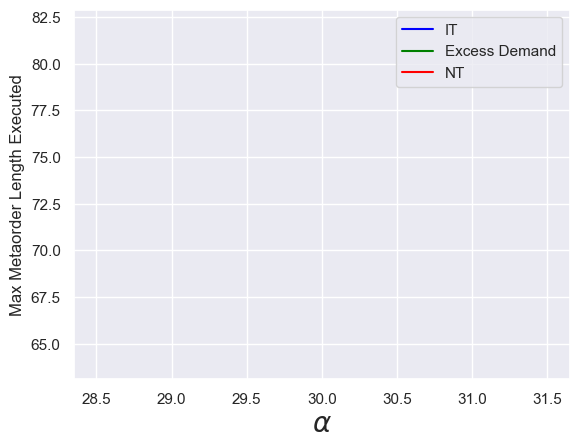

In [56]:
plt.plot(alphas_IT,max_lengths_IT, color = "blue", label = "IT")
plt.plot(alphas_NT,max_lengths_MM, color = "green", label = "Excess Demand")
plt.plot(alphas_MM,max_lengths_NT, color = "red", label = "NT")
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel("Max Metaorder Length Executed", fontsize = 12)
plt.legend()

## **Functions to analyze the decaying density of ACFs - Based on the LMF original paper**

In [264]:
#def q_tau_L(lag, L, p):
#    s = lag - 1
#    return (p/2*L)*(-1*np.exp(-1*((s*p)**2)/(2*s*p*(1-p))) + np.sqrt(2/np.pi)*np.sqrt(s*p*(1-p))*(np.exp(-1*((L-1-s*p)**2)/(2*s*p*(1-p))))  + (s*p - 1)*math.erf((1-s*p)/(np.sqrt(2*s*p*(1-p)))) + (L-2)*math.erf((0.5 + s*p)/np.sqrt(2*s*p*(1-p))) + (1 + s*p - L)*math.erf((1 - L + s*p)/(np.sqrt(2*s*p*(1-p))))) 

In [265]:
def q_tau_L(L):
    L = math.ceil(L)
    import scipy.special
    total_sum = 0.0
    for j in range(1, L-1):
        for h in range(0,j+1):
            total_sum = total_sum + pow(p,h)*pow(1-p, lag - 1 - h)*scipy.special.binom(lag - 1, h)
    return (p/L)*total_sum

In [266]:
def integrand_ACF_Q_tau(L):
    #return (q_tau_L(L)*L*prefactor*np.exp(-L/metaorder_decay))/(distribution_mean)
    return (q_tau_L(L)*L*np.exp(-L/metaorder_decay))

In [267]:
def ACF_Q_from_metaorder(metaorder_lengths = np.arange(1,50)):
    total_sum = 0.0
    if(lag == 0):
        return 1.0
    for metaorder_length in metaorder_lengths:
        total_sum = total_sum + integrand_ACF_Q_tau(metaorder_length)
    return total_sum 

In [282]:
ACFs_Q_metaorder =  [[] for i in range(len(alpha_vector))]
for distribution_index in range(0,len(alpha_vector)):
    p = 0.65
    metaorder_decay = decays_MM[distribution_index]  
    prefactor = prefactors_MM[distribution_index]
    distribution_mean = distribution_means_MM[distribution_index]
    for l in range(10,30):
        lag = l
        ACFs_Q_metaorder[distribution_index].append(ACF_Q_from_metaorder(np.arange(1,100)))

Alpha: 60.0
LinregressResult(slope=-0.199760862341273, intercept=1.6719588296332324, rvalue=-0.9999999997617747, pvalue=2.3465856002651456e-85, stderr=1.0277396613216852e-06, intercept_stderr=2.089877708230959e-05)
LinregressResult(slope=-0.19817557125874383, intercept=0.17723268121028468, rvalue=-0.9993427725952528, pvalue=2.1674958803774914e-27, stderr=0.0016943411201022593, intercept_stderr=0.03445391737132206)


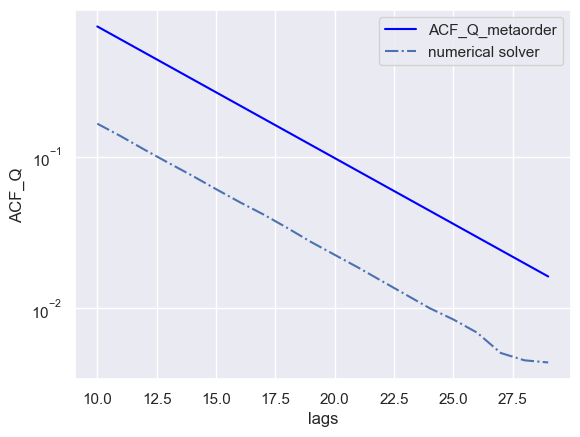

In [283]:
from scipy.stats import linregress

for ACF_index in range(0,len(alpha_vector)):
    print(f"Alpha: {alpha_vector[ACF_index]}")
    plt.figure()
    plt.plot(np.arange(10,30), ACFs_Q_metaorder[ACF_index], c = "blue", label = "ACF_Q_metaorder")
    #plt.plot(np.arange(20,30), acfs_q[ACF_index][20:30], c = "violet", label = "mean_excess_demand_sign_ACF" )
    plt.plot(np.arange(10,30), ACFs_Q[ACF_index][-1][0,10:30]/ACFs_Q[ACF_index][-1][0,0], linestyle = 'dashdot', label = "numerical solver")
    print(linregress(np.arange(10,30), np.log(ACFs_Q_metaorder[ACF_index])))
    print(linregress(np.arange(10,30), np.log(ACFs_Q[ACF_index][-1][0,10:30]/ACFs_Q[ACF_index][-1][0,0])))
    plt.yscale('log')
    plt.ylabel("ACF_Q")
    plt.xlabel("lags")
    plt.legend()
    plt.show()

## **Functions to analyze the decaying density of ACFs - Based on Yuki Sato · Kiyoshi Kanazawa paper**

In [284]:
def return_excess_demand_expression_proability(order_flows_NT, order_flows_IT, indexes = np.arange(0,5)):
    
    NT_probabilities = []
    IT_probabilities = []
    
    for index in indexes:
        order_flow_NT = order_flows_NT[index]
        order_flow_IT = order_flows_IT[index]
        
        T = order_flow_NT.shape[0]
        number_of_simulations = order_flow_NT.shape[1]
        concatenated_order_flows_NT = []
        concatenated_order_flows_IT = []

        for sim in range(0,number_of_simulations):
            concatenated_order_flows_NT.extend(np.abs(order_flow_NT[:,sim]))
            concatenated_order_flows_IT.extend(np.abs(order_flow_IT[:,sim]))

        #Evaluating the probability that the order sign of the IT/NT will be expressed in the excess demand
        difference_IT_NT = [q_it - q_nt for q_it, q_nt in zip(concatenated_order_flows_IT, concatenated_order_flows_NT)]
        ecdf_difference = ECDF(difference_IT_NT)
        IT_expression_probability =  1 - ecdf_difference(0)
        NT_expression_probability = 1 - IT_expression_probability 
        IT_probabilities.append(IT_expression_probability)
        NT_probabilities.append(NT_expression_probability)

    return NT_probabilities, IT_probabilities 

In [285]:
NT_probabilities, IT_probabilities = return_excess_demand_expression_proability(NT_order_flows, IT_order_flows, indexes = np.arange(0,1))

In [286]:
NT_probabilities

[0.59135022]

In [287]:
IT_probabilities

[0.40864977999999996]

In [288]:
def return_acf_trader_from_metaorder_2(trader_decays, trader_probabilities, lags, indexes = np.arange(0,5)):
    ACFs_metaorder = [[] for i in range(len(indexes))]
    for index in indexes:
        current_prefactor = (((trader_probabilities[index]**2))*np.exp(-1/trader_decays[index]))/(1 - trader_probabilities[index]*(1 - np.exp(-1/trader_decays[index])))
        inverse_decay = np.log(1/(1 - trader_probabilities[index]*(1-np.exp(-1/trader_decays[index]))))
        for lag in lags:
            ACFs_metaorder[index].append(current_prefactor*np.exp(-lag*inverse_decay))       
    return ACFs_metaorder

In [289]:
def return_acf_trader_from_metaorder(trader_decays, trader_probabilities, lags, indexes = np.arange(0,5)):
    ACFs_metaorder = [[] for i in range(len(indexes))]
    for index in indexes:
        for lag in lags:
            ACFs_metaorder[index].append((trader_probabilities[index]**2)*np.exp(-1/trader_decays[index])*((1 - trader_probabilities[index] + trader_probabilities[index]*np.exp(-1/trader_decays[index]))**(lag - 1)))
    return ACFs_metaorder

In [290]:
for index in np.arange(len(ACFs_NT)):
    print(ACFs_NT[index][-1][0,1]/ACFs_NT[index][-1][0,0])

0.8651921765985078


In [294]:
for index in np.arange(len(ACFs_NT)):
    print((NT_probabilities[index]**2)*np.exp(-1/decays_NT[index]))

0.8522870464875028


In [292]:
IT_probabilities = np.sqrt(np.array(std_IT_order_flow) / np.array(std_total_order_flow)) 

In [293]:
NT_probabilities = np.sqrt(np.array(std_NT_order_flow) / np.array(std_total_order_flow)) 

In [98]:
#IT_probabilities = IT_probabilities*IT_probabilities

In [99]:
#NT_probabilities = NT_probabilities*NT_probabilities

In [301]:
ACFs_metaorder_NT = return_acf_trader_from_metaorder(decays_NT, NT_probabilities, lags = np.arange(1,100), indexes = np.arange(0,1))

In [302]:
ACFs_metaorder_IT = return_acf_trader_from_metaorder(decays_IT, IT_probabilities, lags = np.arange(1,100), indexes = np.arange(0,1))

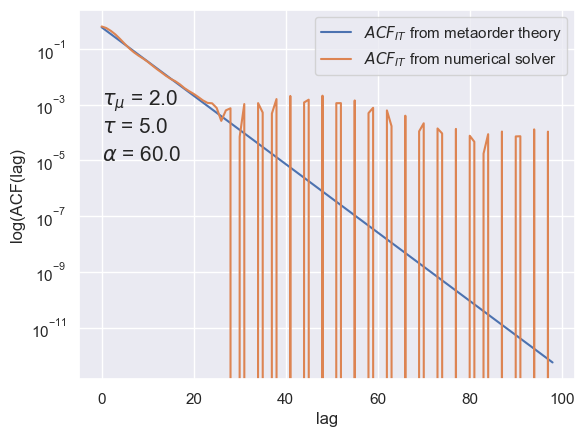

In [303]:
index = 0
plt.plot(ACFs_metaorder_IT[index], label = r"$ACF_{IT}$ from metaorder theory")
plt.plot(ACFs_IT[index][-1][0,1:]/ACFs_IT[index][-1][0,0], label = r"$ACF_{IT}$ from numerical solver")
plt.xlabel("lag")
plt.ylabel("log(ACF(lag)")
plt.yscale("log")
plt.text(0.01,0.0001,r"$\tau$ = {}".format(taus_IT[0]), fontsize = 15)
plt.text(0.01,0.00001,r"$\alpha$ = {}".format(alphas_IT[0]), fontsize = 15)
plt.text(0.1,0.001,r"$\tau_{{\mu}}$ = {}".format(taus_MU[0]), fontsize = 15)
plt.legend()
plt.show()

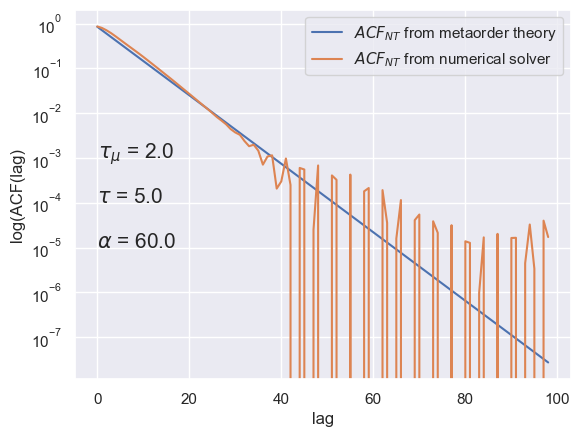

In [304]:
index = 0
plt.plot(ACFs_metaorder_NT[index], label = r"$ACF_{NT}$ from metaorder theory")
plt.plot(ACFs_NT[index][-1][0,1:]/ACFs_NT[index][-1][0,0], label = r"$ACF_{NT}$ from numerical solver")
plt.xlabel("lag")
plt.ylabel("log(ACF(lag)")
plt.yscale("log")
plt.text(0.01,0.0001,r"$\tau$ = {}".format(taus_NT[0]), fontsize = 15)
plt.text(0.01,0.00001,r"$\alpha$ = {}".format(alphas_NT[0]), fontsize = 15)
plt.text(0.1,0.001,r"$\tau_{{\mu}}$ = {}".format(taus_MU[0]), fontsize = 15)
plt.legend()
plt.show()

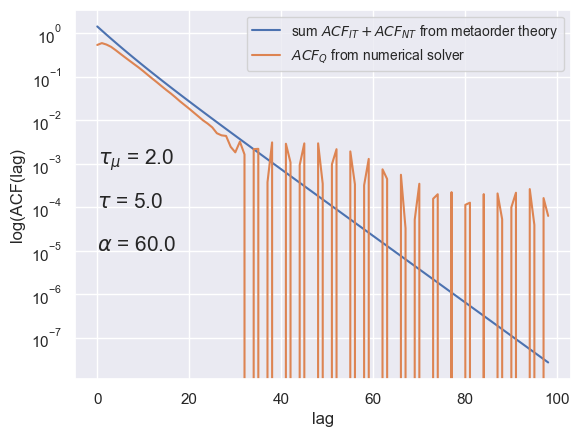

In [305]:
index = 0
plt.plot(np.array(ACFs_metaorder_IT[index]) + np.array(ACFs_metaorder_NT[index]), label = r"sum $ACF_{IT} + ACF_{NT}$ from metaorder theory")
plt.plot(ACFs_Q[index][-1][0,1:]/ACFs_Q[index][-1][0,0], label = r"$ACF_Q$ from numerical solver")
plt.yscale('log')
plt.xlabel("lag")
plt.ylabel("log(ACF(lag)")
plt.text(0.01,0.0001,r"$\tau$ = {}".format(taus_NT[0]), fontsize = 15)
plt.text(0.01,0.00001,r"$\alpha$ = {}".format(alphas_NT[0]), fontsize = 15)
plt.text(0.1,0.001,r"$\tau_{{\mu}}$ = {}".format(taus_MU[0]), fontsize = 15)
plt.legend(loc = 1, fontsize = "10")
plt.show()

In [308]:
ACFs_metaorder_MM = return_acf_trader_from_metaorder(decays_MM, [0.65], lags = np.arange(1,100), indexes = np.arange(0,1))

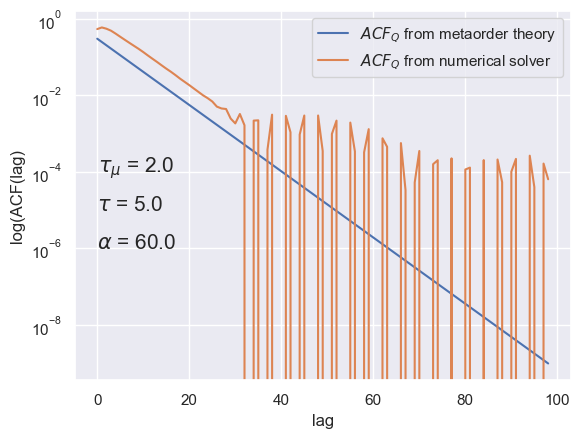

In [309]:
index = 0
plt.plot(ACFs_metaorder_MM[index], label = r"$ACF_{Q}$ from metaorder theory")
plt.plot(ACFs_Q[index][-1][0,1:]/ACFs_Q[index][-1][0,0], label = r"$ACF_Q$ from numerical solver")
plt.yscale('log')
plt.xlabel("lag")
plt.ylabel("log(ACF(lag)")
plt.yscale("log")
plt.text(0.01,0.00001,r"$\tau$ = {}".format(taus_NT[0]), fontsize = 15)
plt.text(0.01,0.000001,r"$\alpha$ = {}".format(alphas_NT[0]), fontsize = 15)
plt.text(0.1,0.0001,r"$\tau_{{\mu}}$ = {}".format(taus_MU[0]), fontsize = 15)
plt.legend()
plt.show()

## Analyzing the order flow relative to impact - $q_{G}^{NT}$ and $q_{G}^{IT}$

**Functions to return mean flow**

In [45]:
def return_order_flow_impact_NT(NT_order_flow, target_portfolio_order_flow):     
    return NT_order_flow - target_portfolio_order_flow 

In [46]:
def return_mean_price_series(price_simulations):
    T = price_simulations.shape[0]
    mean_price_series = np.zeros((T,1))
    
    for i in range(0,T):
        mean_price_series[i,0] = np.mean(price_simulations[i,:])
        
    return mean_price_series

In [47]:
def return_mean_NT_order_flow(NT_order_flow):
    T = NT_order_flow.shape[0]
    mean_NT_order_flow = np.zeros((T,1))
    
    for i in range(0,T):
        mean_NT_order_flow [i,0] = np.mean(NT_order_flow[i,:])
        
    return mean_NT_order_flow

In [48]:
def return_mean_target_portfolio_order_flow(target_portfolio_order_flow):
    T = target_portfolio_order_flow.shape[0]
    mean_target_portfolio_order_flow = np.zeros((T,1))
    
    for i in range(0,T):
        mean_target_portfolio_order_flow[i,0] = np.mean(target_portfolio_order_flow[i,:])
        
    return mean_target_portfolio_order_flow

In [49]:
def return_mean_NT_informed_order_flow(NT_informed_order_flow):
    T = NT_informed_order_flow.shape[0]
    mean_NT_informed_order_flow = np.zeros((T,1))
    
    for i in range(0,T):
        mean_NT_informed_order_flow [i,0] = np.mean(NT_informed_order_flow[i,:])
        
    return mean_NT_informed_order_flow

In [50]:
def return_mean_NT_stochastic_order_flow(NT_stochastic_order_flow):
    T = NT_stochastic_order_flow.shape[0]
    mean_NT_stochastic_order_flow = np.zeros((T,1))
    
    for i in range(0,T):
        mean_NT_stochastic_order_flow [i,0] = np.mean(NT_stochastic_order_flow[i,:])
        
    return mean_NT_stochastic_order_flow

**Evaluating Impact Flow**

In [537]:
order_flow_impact_NT = return_order_flow_impact_NT(NT_order_flow, target_portfolio_order_flow)

**We have that:<br/>**

$q_{G}^{NT}(t) = q^{NT}(t) - q^{tgt}(t)$

**And: <br/>**

$ \langle q_{t}^{NT}q_{t + \tau}^{NT} \rangle = \langle q_{t}^{tgt}q_{G_{ t + \tau}}^{NT} \rangle + \langle   q_{G_{t}}^{NT} q_{t + \tau}^{tgt} \rangle + \langle   q_{G_{ t }}^{NT}q_{G_{ t + \tau}}^{NT} \rangle  + \langle   q_{t}^{tgt}q_{t+\tau}^{tgt} \rangle  $

**Verifying  $\langle   q_{G_{t}}^{NT} q_{t + \tau}^{tgt} \rangle$**

In [538]:
def return_cross_product_impact_target(order_flow_impact_NT, target_portfolio_order_flow):
    number_of_lags = order_flow_impact_NT.shape[0]
    number_of_simulations = order_flow_impact_NT.shape[1] 
    cross_products_for_tau = np.zeros((T,number_of_simulations))
    
    for tau in range(0,number_of_lags):
        cross_products_for_tau[tau] = order_flow_impact_NT[0,:]*target_portfolio_order_flow[tau,:]
    
    cross_products_for_tau_mean = np.zeros((T,1))
    
    for tau in range(0,number_of_lags):
        cross_products_for_tau_mean[tau] = np.mean(cross_products_for_tau[tau,:])
         
    return cross_products_for_tau_mean

**Cross product from simulations**

In [539]:
cross_product_impact_target = return_cross_product_impact_target(order_flow_impact_NT, target_portfolio_order_flow)

**Deterministic cross product obtained from numerical solver data**

In [540]:
I = np.identity(T)
deterministic_cross_product_impact_target = np.matmul((D_TGT_NT - I),ACF_TGT)

**Fit for finding the timescale**

In [541]:
from scipy.optimize import curve_fit
y_1 = deterministic_cross_product_impact_target[0,1:]
x_1 = np.arange(1,100)
def sum_exp(x, a, b, tau_1, tau_2):
    return a*np.exp(-x_1/tau_1) + b*np.exp(-x_1/tau_2)
parameters_1, cov = curve_fit(f = sum_exp, xdata = x_1, ydata = y_1, p0 = [1,1,1,1], maxfev= 50000)

**Sum of squares error**

In [542]:
error = (y_1 - sum_exp(x_1, *parameters_1))**2
print(np.sum(error))

8.342352958764027e-10


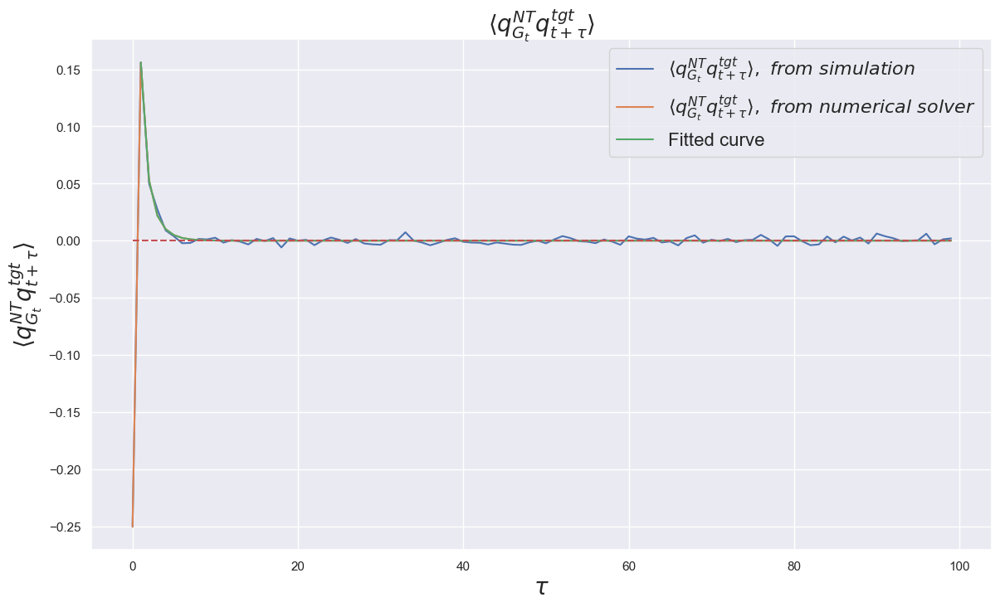

In [545]:
figure36 = plt.figure(figsize = (14,8))
plt.title(r"$\langle   q_{G_{t}}^{NT} q_{t + \tau}^{tgt} \rangle$", fontsize = 20)

plt.plot(np.arange(0,100), cross_product_impact_target[0:], label = r"$\langle   q_{G_{t}}^{NT} q_{t + \tau}^{tgt} \rangle, \ from \ simulation$")
plt.plot(np.arange(0, 100), deterministic_cross_product_impact_target[0,0:100], label = r"$\langle   q_{G_{t}}^{NT} q_{t + \tau}^{tgt} \rangle, \ from \ numerical \ solver$")
plt.plot(x_1,sum_exp(x_1, parameters_1[0], parameters_1[1], parameters_1[2], parameters_1[3]), label = "Fitted curve")
plt.plot(np.arange(0,100), np.zeros(100), linestyle = 'dashed', color = 'r')
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$\langle   q_{G_{t}}^{NT} q_{t + \tau}^{tgt} \rangle$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 16})
#plt.yscale('log')
plt.show()

In [546]:
parameters_1

array([0.1618442 , 0.4418534 , 1.42395235, 0.56724235])

$\tau_{ q_{G_{t}}^{NT} q_{t + \tau}^{tgt}}$

**Verifying $\langle q_{t}^{tgt}q_{G_{ t + \tau}}^{NT} \rangle$**

In [547]:
def return_cross_product_target_impact(order_flow_impact_NT, target_portfolio_order_flow):
    number_of_lags = order_flow_impact_NT.shape[0]
    number_of_simulations = order_flow_impact_NT.shape[1] 
    cross_products_for_tau = np.zeros((T,number_of_simulations))
    
    for tau in range(0,number_of_lags):
        cross_products_for_tau[tau] = target_portfolio_order_flow[0,:]*order_flow_impact_NT[tau,:]
    
    cross_products_for_tau_mean = np.zeros((T,1))
    
    for tau in range(0,number_of_lags):
        cross_products_for_tau_mean[tau] = np.mean(cross_products_for_tau[tau,:])
         
    return cross_products_for_tau_mean

**Cross product from simulations**

In [548]:
cross_product_target_impact = return_cross_product_target_impact(order_flow_impact_NT, target_portfolio_order_flow)

**Deterministic cross product obtained from numerical solver data**

In [549]:
deterministic_cross_product_target_impact = np.matmul(ACF_TGT, (D_TGT_NT.T - I))

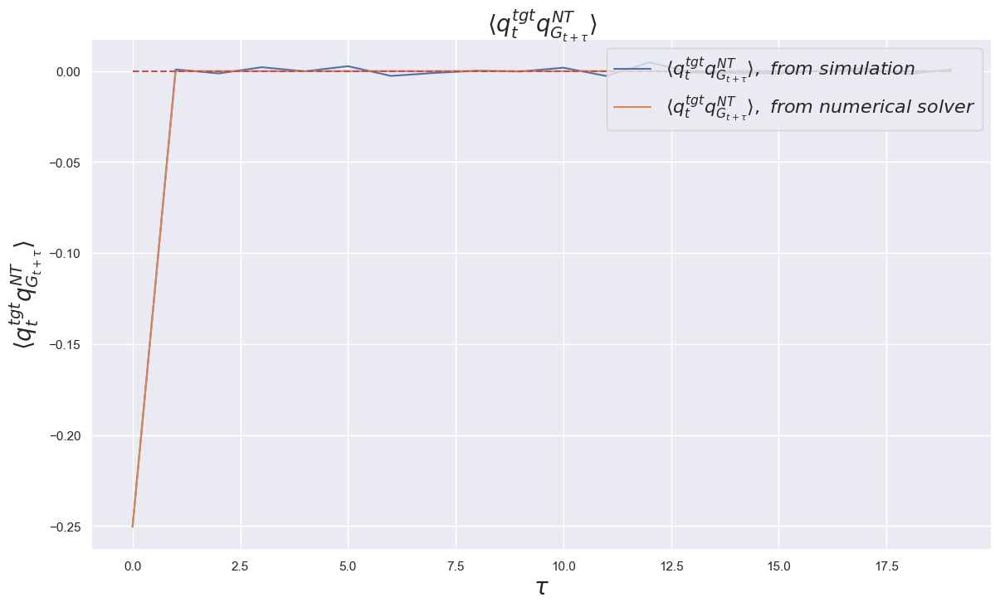

In [550]:
figure37 = plt.figure(figsize = (14,8))
plt.title(r"$\langle q_{t}^{tgt}q_{G_{ t + \tau}}^{NT} \rangle$", fontsize = 20)

plt.plot(np.arange(0,20), cross_product_target_impact[:20], label = r"$\langle q_{t}^{tgt}q_{G_{ t + \tau}}^{NT} \rangle, \ from \ simulation$")
plt.plot(np.arange(0,20), deterministic_cross_product_target_impact[0,:20], label = r"$\langle q_{t}^{tgt}q_{G_{ t + \tau}}^{NT} \rangle, \ from \ numerical \ solver$")
plt.plot(np.arange(0,20), np.zeros(20), linestyle = 'dashed', color = 'r')
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$\langle q_{t}^{tgt}q_{G_{ t + \tau}}^{NT} \rangle$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 16})
plt.show()

**Delta contribution at lag 0**

In [551]:
deterministic_cross_product_target_impact[0,0]

-0.2504545697014301

**Verifying $\langle   q_{G_{ t }}^{NT}q_{G_{ t + \tau}}^{NT} \rangle$**

In [552]:
def return_cross_product_impact_impact(order_flow_impact_NT):
    number_of_lags = order_flow_impact_NT.shape[0]
    number_of_simulations = order_flow_impact_NT.shape[1] 
    cross_products_for_tau = np.zeros((T,number_of_simulations))
    
    for tau in range(0,number_of_lags):
        cross_products_for_tau[tau] = order_flow_impact_NT[0,:]*order_flow_impact_NT[tau,:]
    
    cross_products_for_tau_mean = np.zeros((T,1))
    
    for tau in range(0,number_of_lags):
        cross_products_for_tau_mean[tau] = np.mean(cross_products_for_tau[tau,:])
         
    return cross_products_for_tau_mean

**Cross product from simulations**

In [553]:
cross_product_impact_impact = return_cross_product_impact_impact(order_flow_impact_NT)

**Deterministic cross product obtained from numerical solver data**

In [554]:
deterministic_cross_product_impact_impact = np.matmul(D_MU_NT, np.matmul(ACF_MU, D_MU_NT.T)) + np.matmul((D_TGT_NT - I), np.matmul(ACF_TGT, (D_TGT_NT.T - I)))

**Fit for finding the timescale**

In [555]:
from scipy.optimize import curve_fit
y_2 = -1*deterministic_cross_product_impact_impact[0,25:100]
x_2 = np.arange(25,100)
def exp(x_2, a, tau):
    return a*np.exp(-x_2/tau)
parameters_2, cov = curve_fit(f = exp, xdata = x_2, ydata = y_2, p0 = [1,1])

**Sum of squares error**

In [556]:
error = (y_2 - exp(x_2, *parameters_2))**2
print(np.sum(error))

4.137340071509503e-21


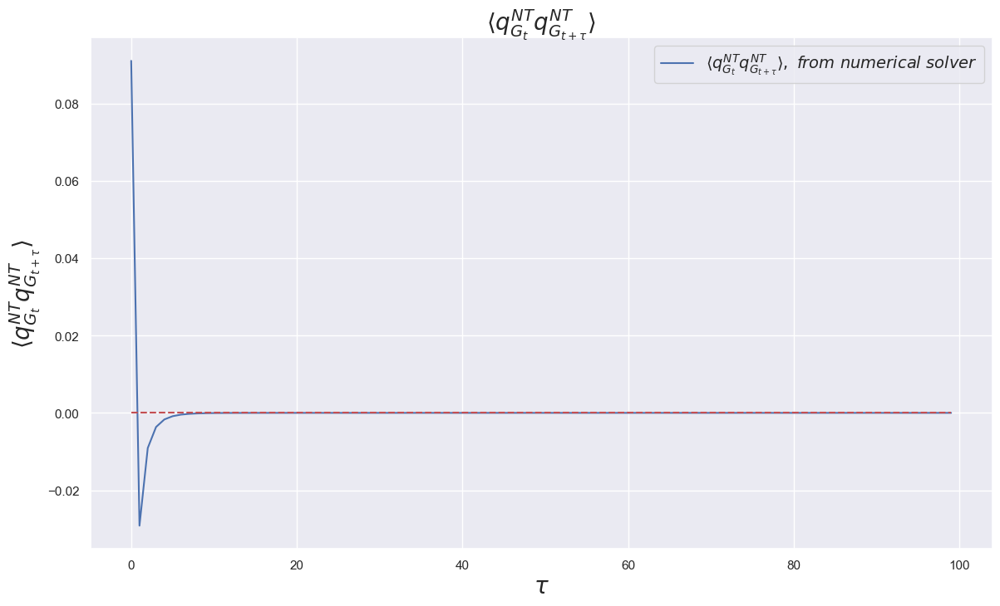

In [557]:
figure38 = plt.figure(figsize = (14,8))
plt.title(r"$\langle q_{G_{ t }}^{NT} q_{G_{ t + \tau}}^{NT} \rangle$", fontsize = 20)
plt.plot(np.arange(0,100), deterministic_cross_product_impact_impact[0,0:100], label = r"$\langle q_{G_{ t }}^{NT} q_{G_{ t + \tau}}^{NT} \rangle, \ from \ numerical \ solver$")
#plt.plot(x_1,sum_exp(x_1, parameters_1[0], parameters_1[1], parameters_1[2], parameters_1[3]), label = "Fitted curve")
#plt.plot(x_2,exp(x_2, parameters_2[0], parameters_2[1]), label = "Fitted curve")
#plt.plot(np.arange(0,100), cross_product_impact_target[0:], label = r"$\langle   q_{G_{t}}^{NT} q_{t + \tau}^{tgt} \rangle, \ from \ simulation$")
plt.plot(np.arange(0,100), np.zeros(100), linestyle = 'dashed', color = 'r')
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$\langle q_{G_{ t }}^{NT} q_{G_{ t + \tau}}^{NT} \rangle$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 14})
##plt.yscale('log')
plt.show()

$\tau_{ q_{G_{t}}^{NT} q_{G_{t + \tau}}^{NT}}$

In [558]:
parameters_2[1]

2.9954741955729194

**Verifying $\langle   q_{t}^{tgt}q_{t+\tau}^{tgt} \rangle$** 

In [559]:
def return_cross_product_target_target(target_portfolio_order_flow):
    number_of_lags = target_portfolio_order_flow.shape[0]
    number_of_simulations = target_portfolio_order_flow.shape[1] 
    cross_products_for_tau = np.zeros((T,number_of_simulations))
    
    for tau in range(0,number_of_lags):
        cross_products_for_tau[tau] = target_portfolio_order_flow[0,:]*target_portfolio_order_flow[tau,:]
    
    cross_products_for_tau_mean = np.zeros((T,1))
    for tau in range(0,number_of_lags):
        cross_products_for_tau_mean[tau] = np.mean(cross_products_for_tau[tau,:])
         
    return cross_products_for_tau_mean

**Cross product from simulations**

In [560]:
cross_product_target_target = return_cross_product_target_target(target_portfolio_order_flow)

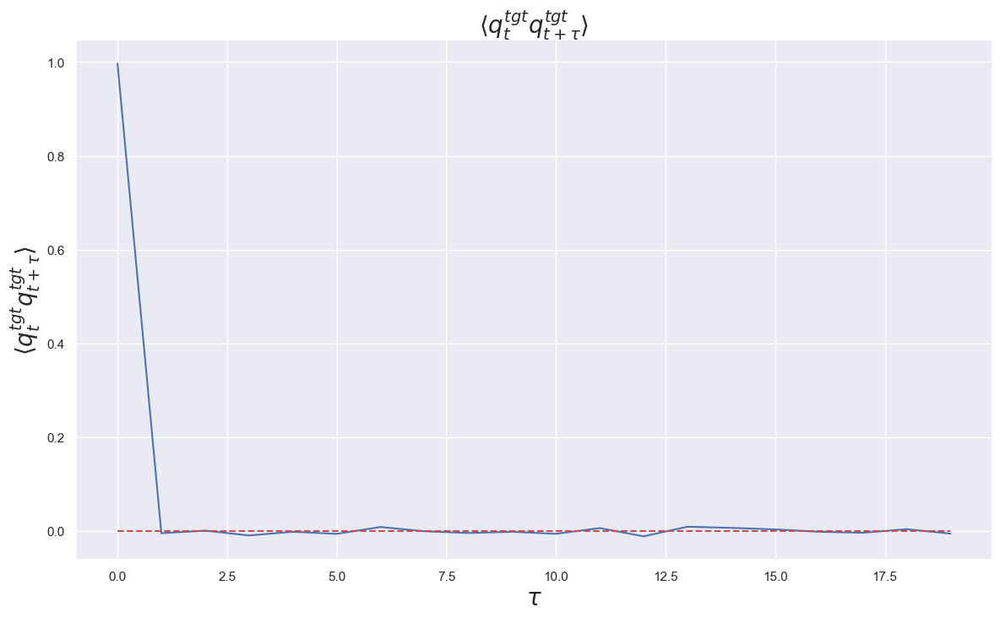

In [561]:
figure39 = plt.figure(figsize = (14,8))
plt.title(r"$\langle   q_{t}^{tgt}q_{t+\tau}^{tgt} \rangle$", fontsize = 20)

plt.plot(np.arange(0,20), cross_product_target_target[:20])
plt.plot(np.arange(0,20), np.zeros(20), linestyle = 'dashed', color = 'r')
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$\langle   q_{t}^{tgt}q_{t+\tau}^{tgt} \rangle$", fontsize = 20)
plt.show()

**Checking the consistency equation from simulation, this is: <br/>**

$ \langle q_{t}^{NT}q_{t + \tau}^{NT} \rangle = \langle q_{t}^{tgt}q_{G_{ t + \tau}}^{NT} \rangle + \langle   q_{G_{t}}^{NT} q_{t + \tau}^{tgt} \rangle + \langle   q_{G_{ t }}^{NT}q_{G_{ t + \tau}}^{NT} \rangle  + \langle   q_{t}^{tgt}q_{t+\tau}^{tgt} \rangle  $

In [562]:
right_hand_side = cross_product_impact_target + cross_product_target_impact + cross_product_impact_impact + cross_product_target_target 

In [563]:
left_hand_side = return_mean_ACF(pd.DataFrame(NT_order_flow), T, number_of_simulations)

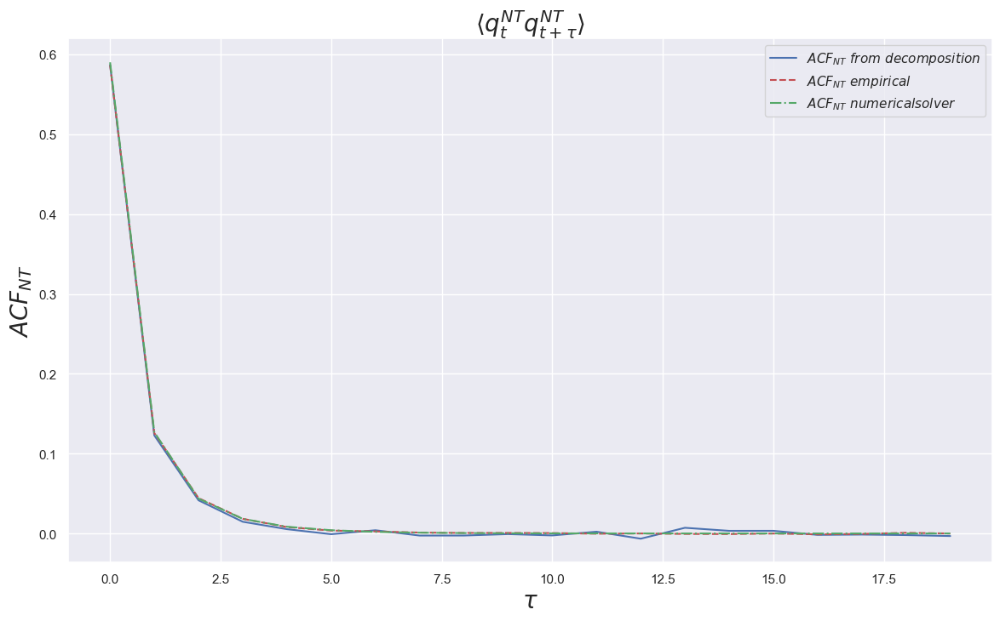

In [564]:
figure40 = plt.figure(figsize = (14,8))
plt.title(r"$\langle   q_{t}^{NT}q_{t+\tau}^{NT} \rangle$", fontsize = 20)
plt.plot(np.arange(0,20), right_hand_side[:20], label = r"$ACF_{NT} \ from \ decomposition$")
plt.plot(np.arange(0,20), left_hand_side[:20], linestyle = 'dashed', color = 'r', label = r"$ACF_{NT} \ empirical$")
plt.plot(np.arange(0,20), ACF_NT[:20], linestyle = 'dashdot', color = 'g', label = r"$ACF_{NT} \ numerical solver$" )
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$ACF_{NT}$", fontsize = 20)
plt.legend()
plt.show()

In [565]:
ACF_NT

array([ 5.90110486e-01,  1.26823264e-01,  4.36434162e-02,  1.82774931e-02,
        8.41697291e-03,  4.03719832e-03,  1.96034663e-03,  9.50829550e-04,
        4.57112359e-04,  2.16314875e-04,  9.98189081e-05,  4.41923879e-05,
        1.81552166e-05,  6.34456307e-06,  1.26511064e-06, -7.06066049e-07,
       -1.29734245e-06, -1.31757674e-06, -1.13415269e-06, -9.05737204e-07,
       -6.94584606e-07, -5.20047935e-07, -3.83613444e-07, -2.80283942e-07,
       -2.03513379e-07, -1.47161649e-07, -1.06120700e-07, -7.63841415e-08,
       -5.49118576e-08, -3.94425030e-08, -2.83149775e-08, -2.03189333e-08,
       -1.45771356e-08, -1.04560189e-08, -7.49907878e-09, -5.37790961e-09,
       -3.85650828e-09, -2.76539976e-09, -1.98293967e-09, -1.42184606e-09,
       -1.01950506e-09, -7.31007229e-10, -5.24143621e-10, -3.75817490e-10,
       -2.69463948e-10, -1.93206532e-10, -1.38530080e-10, -9.93257439e-11,
       -7.12161562e-11, -5.10616696e-11, -3.66109926e-11, -2.62498192e-11,
       -1.88206549e-11, -

**Trying to fit the $ACF_{NT}$ with curve fit**

In [566]:
from scipy.optimize import curve_fit
y_3 = ACF_NT[:10]
x_3 = np.arange(0,10)

def delta_sum_exp(x_3, a, b, c, tau_1, tau_2, delta_magnitude):
    return delta_magnitude*delta_vector(len(x_3)) + a*np.exp(-x_3/tau_1) + b*np.exp(-x_3/tau_2)  + c*np.exp(-x_3/tau_MU) 

parameters_3, cov = curve_fit(f = delta_sum_exp, xdata = x_3, ydata = y_3, p0 = [1,1,1,1,1,1], maxfev = 500000000)

**Sum of squares error**

In [567]:
error = (y_3 - delta_sum_exp(x_3, *parameters_3))**2
print(np.sum(error))

0.0003540895145041039


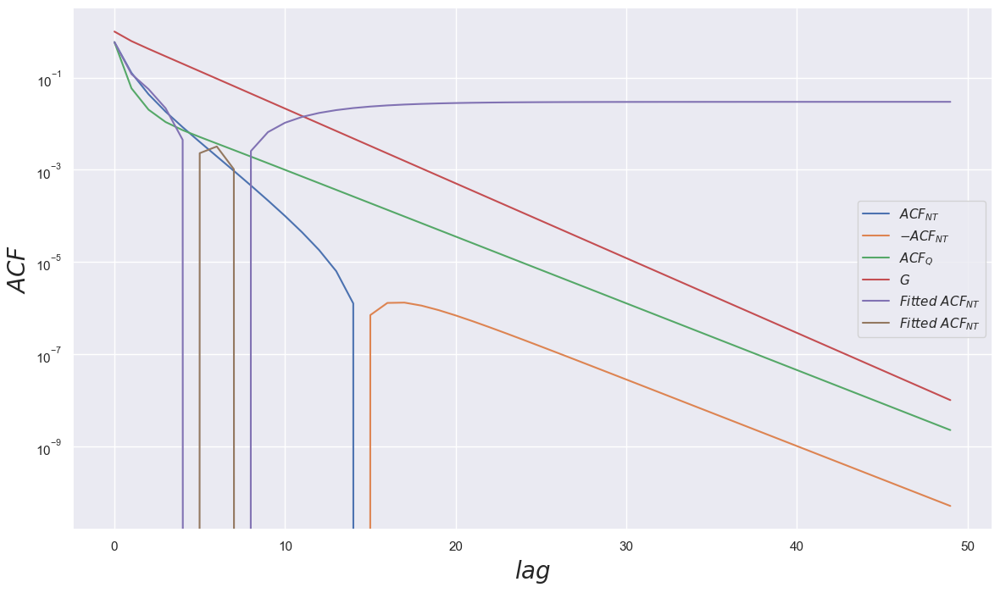

In [568]:
figure40 = plt.figure(figsize = (14,8))

plt.plot(np.arange(0,50), ACF_NT[:50], label = r"$ACF_{NT}$")
plt.plot(np.arange(0,50), -1*ACF_NT[:50], label = r"$-ACF_{NT}$")

plt.plot(np.arange(0,50), (ACF_Q[:50]/ACF_Q[0])*ACF_NT[0], label = r"$ACF_{Q}$")
plt.plot(np.arange(0,50), G[0,:50]/G[0,0], label = r"$G$")

plt.plot(np.arange(0,50),delta_sum_exp(np.arange(0,50), parameters_3[0], parameters_3[1], parameters_3[2], parameters_3[3], parameters_3[4], parameters_3[5]), label = r"$Fitted \ ACF_{NT}$")
plt.plot(np.arange(0,50),-1*delta_sum_exp(np.arange(0,50), parameters_3[0], parameters_3[1], parameters_3[2], parameters_3[3], parameters_3[4], parameters_3[5]), label = r"$Fitted \ ACF_{NT}$")
plt.yscale('log')
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$ACF$", fontsize = 20)
plt.legend()

In [569]:
parameters_3  

array([-7.94540043e+02,  2.96728188e-02,  7.94739454e+02,  3.00083558e+00,
       -6.25690640e+03,  3.61026305e-01])

In [570]:
ACF_NT[10:30]

array([ 9.98189081e-05,  4.41923879e-05,  1.81552166e-05,  6.34456307e-06,
        1.26511064e-06, -7.06066049e-07, -1.29734245e-06, -1.31757674e-06,
       -1.13415269e-06, -9.05737204e-07, -6.94584606e-07, -5.20047935e-07,
       -3.83613444e-07, -2.80283942e-07, -2.03513379e-07, -1.47161649e-07,
       -1.06120700e-07, -7.63841415e-08, -5.49118576e-08, -3.94425030e-08])

## NT's Informed & Stochastic Order Flows

In [571]:
ACF_NT_informed_flow = return_mean_ACF(pd.DataFrame(NT_informed_order_flow), T, number_of_simulations)

In [572]:
ACF_NT_stochastic_flow = return_mean_ACF(pd.DataFrame(NT_stochastic_order_flow), T, number_of_simulations)

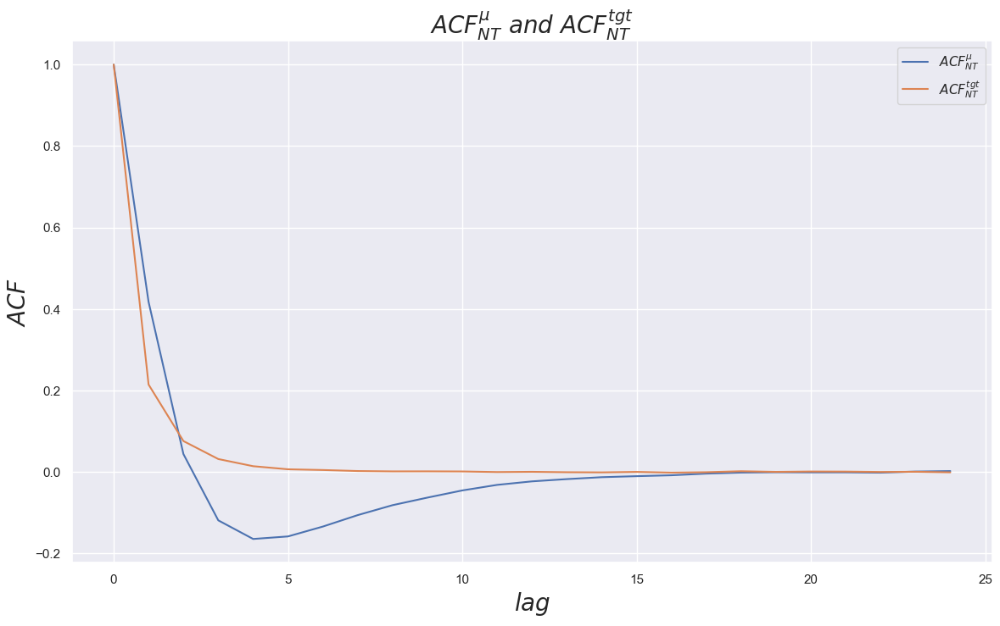

In [573]:
figure40 = plt.figure(figsize = (14,8))
plt.title(r"$ACF_{NT}^{\mu} \ and \ ACF_{NT}^{tgt}$", fontsize = 20)
plt.plot(np.arange(0,25), ACF_NT_informed_flow[:25]/ACF_NT_informed_flow[0], label = r"$ACF_{NT}^{\mu}$")
plt.plot(np.arange(0,25), ACF_NT_stochastic_flow[:25]/ACF_NT_stochastic_flow[0], label = r"$ACF_{NT}^{tgt}$")
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$ACF$", fontsize = 20)
plt.legend()
plt.show()

**Fit for finding the timescales**

$ACF_{NT}^{\mu}$

In [574]:
from scipy.optimize import curve_fit
y = ACF_NT_informed_flow[0:25]
x = np.arange(0,25)
def exp(x, a, b, tau_1, tau_2):
    return a*np.exp(-x/tau_1) + b*np.exp(-x/tau_2)
parameters, cov = curve_fit(f = exp, xdata = x, ydata = y, p0 = [1,1,1,1], maxfev = 500000)

**Sum of squares error**

In [575]:
error = (y - exp(x, *parameters))**2
print(np.sum(error))

1.0856911991467785e-09


**Parameters**

In [576]:
parameters

array([-2.13929489,  2.13985377,  2.40124732,  2.4005807 ])

$ACF_{NT}^{tgt}$

In [577]:
from scipy.optimize import curve_fit
y = ACF_NT_stochastic_flow[0:25]
x = np.arange(0,25)
def exp(x, a,tau):
    return a*np.exp(-x/tau)
parameters, cov = curve_fit(f = exp, xdata = x, ydata = y, p0 = [1,1], maxfev = 500000)

**Sum of squares error**

In [578]:
error = (y - exp(x, *parameters))**2
print(np.sum(error))

0.0004500912463202821


**Parameters**

In [579]:
parameters

array([0.58501424, 0.67842762])

**Correlation between the two NT's order flow components**

In [580]:
cov_NT_informed_stochastic = return_mean_covariance(pd.DataFrame(NT_informed_order_flow), pd.DataFrame(NT_stochastic_order_flow), T, number_of_simulations)

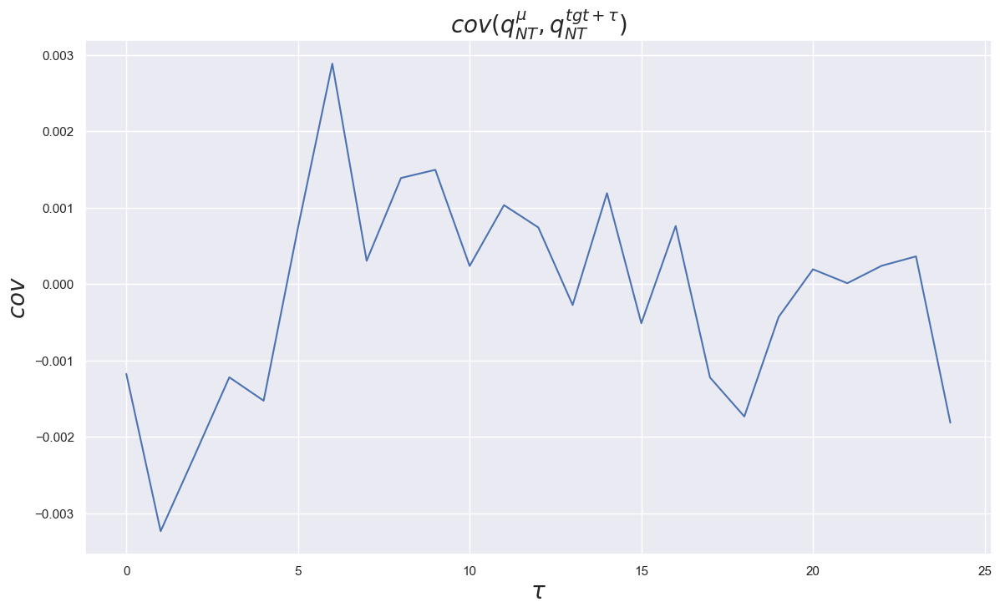

In [582]:
figure40 = plt.figure(figsize = (14,8))
plt.title(r"$cov(q_{NT}^{\mu},q_{NT}^{tgt+\tau})$", fontsize = 20)
plt.plot(np.arange(0,25), cov_NT_informed_stochastic[:25])
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$cov$", fontsize = 20)
plt.show()

In [290]:
cov_NT_stochastic_informed = return_mean_covariance(pd.DataFrame(NT_stochastic_order_flow), pd.DataFrame(NT_informed_order_flow), T, number_of_simulations)

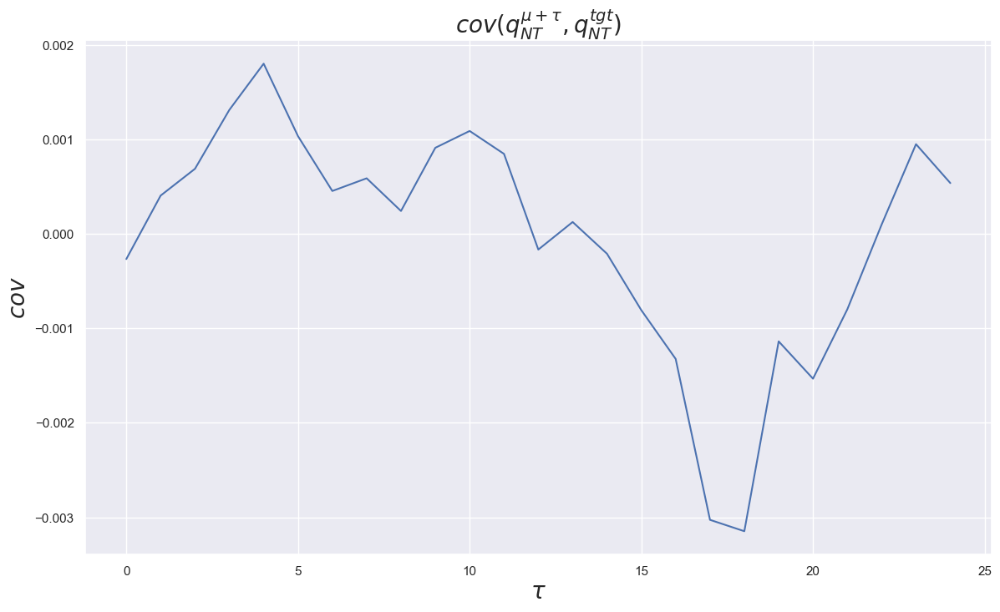

In [291]:
figure40 = plt.figure(figsize = (14,8))
plt.title(r"$cov(q_{NT}^{\mu + \tau},q_{NT}^{tgt})$", fontsize = 20)
plt.plot(np.arange(0,25), cov_NT_stochastic_informed[:25])
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$cov$", fontsize = 20)
plt.show()

## An Ansatz for G

**Trying to fit $G$ as $\delta_{0} + A*exp$**

In [672]:
from scipy.optimize import curve_fit
y_G = G[0,25:100]
x_G = np.arange(25,100)
def delta_exp(x_G, a, tau, delta_amplitude):
    return a*np.exp(-x_G/tau) + delta_amplitude*delta_vector(len(x_G))
parameters_G, cov = curve_fit(f = delta_exp, xdata = x_G, ydata = y_G, p0 = [3,3,3], maxfev = 500000)

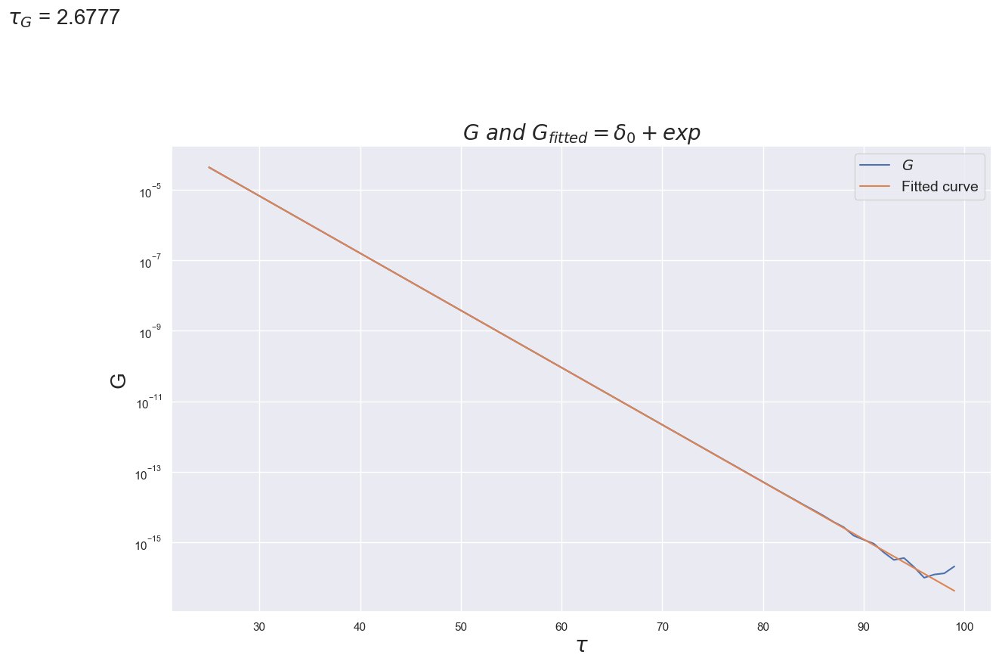

In [673]:
figure40 = plt.figure(figsize = (14,8))
plt.title(r"$G \ and \ G_{fitted} = \delta_{0} + exp$", fontsize = 20)
plt.plot(np.arange(25,100), G[0,25:100], label = r"$G$")
plt.plot(x_G,delta_exp(x_G, parameters_G[0], parameters_G[1], parameters_G[2]), label = "Fitted curve")
#plt.plot(np.arange(20,90), np.zeros(70), linestyle = 'dashed', color = 'r')
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"G", fontsize = 20)
plt.text(5,0.5,r"$\tau_{{G}}$ = {:.4f}".format(parameters_G[1]), fontsize = 20)
plt.legend(loc = 1, prop={'size': 14})
plt.yscale('log')
plt.show()

In [670]:
parameters_G

array([4.86698243e-01, 2.67772893e+00, 7.32837586e-10])

In [671]:
tau_MU

3

## Is the  timescale's properties robust ?

In [174]:
T = 100
T_it = 100
G_0_seed = 1
alpha_G = 0.5
seed_type = "mark"
C_NT_0 = 1
tau_NT = 1
C_IT_0 = 1
tau_IT = 1
tau = 4
alpha = 10

bound_for_convergence = 0.00001

Var_TGT = 1
ACF_TGT = Var_TGT*np.identity(T) ## Var_tgt is a white noise process

I = np.identity(T)

tau_MU_min = 3
tau_MU_max = 3

##alpha_min = 0.1
##alpha_max = 1.5

number_of_points = 1

#alpha_vector = np.linspace(alpha_min, alpha_max, number_of_points)
tau_MU_vector = np.linspace(tau_MU_min, tau_MU_max, number_of_points)


D_MUs = []
D_TGTs = []
D_MU_NTs = []
D_TGT_NTs = []
D_MU_ITs = []
D_TGT_ITs = []
ACFs_NT = []
ACFs_Q = []
Gs = []
ACFs_MU = []

for i in range(0, number_of_points*number_of_points):
    cte = np.exp(-1/tau_MU_vector[i%number_of_points])
    C_MU_0 = ((1 - cte)/(cte))**2
    ACFs_MU.append(return_Markovian_ACF(C_MU_0, tau_MU_vector[i%number_of_points], T))

In [175]:
for j in range(0, number_of_points):
    cte = np.exp(-1/tau_MU_vector[j])
    C_MU_0 = ((1 - cte)/(cte))**2
    
    numerical_solution = numerical_solver_simulation(T, T_it, G_0_seed, alpha_G, alpha, C_MU_0, tau_MU_vector[j], ACF_TGT, seed_type, C_NT_0, 
                            tau_NT, C_IT_0, tau_IT, tau, _ , bound_for_convergence)

    D_MU = numerical_solution[3][-1][0]
    D_TGT =  numerical_solution[3][-1][1]
    D_MU_NT =  numerical_solution[3][-1][2]
    D_TGT_NT =  numerical_solution[3][-1][3] 
    D_MU_IT =  numerical_solution[3][-1][4]
    D_TGT_IT =  numerical_solution[3][-1][5]
    
    D_MUs.append(D_MU)
    D_TGTs.append(D_TGT)
    D_MU_NTs.append(D_MU_NT)
    D_TGT_NTs.append(D_TGT_NT)
    D_MU_ITs.append(D_MU_IT)
    D_TGT_ITs.append(D_TGT_IT)
    ACFs_NT.append(numerical_solution[4][-1][0,:])
    ACFs_Q.append(numerical_solution[6][-1][0,:])
    Gs.append(numerical_solution[2][-1])
    
    print(f"Finished test {j + 1}")

Iteration 0 completed.

Iteration 1 completed.

Iteration 2 completed.

Iteration 3 completed.

Iteration 4 completed.

Iteration 5 completed.

Iteration 6 completed.

Iteration 7 completed.

Iteration 8 completed.

Iteration 9 completed.

Iteration 10 completed.

Iteration 11 completed.

Iteration 12 completed.

Iteration 13 completed.

Iteration 14 completed.

Iteration 15 completed.

Iteration 16 completed.

Iteration 17 completed.

Iteration 18 completed.

Iteration 19 completed.

Iteration 20 completed.

Iteration 21 completed.

Iteration 22 completed.

Iteration 23 completed.

Iteration 24 completed.

Iteration 25 completed.

Iteration 26 completed.

Iteration 27 completed.

Iteration 28 completed.

Iteration 29 completed.

Iteration 30 completed.

Iteration 31 completed.

Iteration 32 completed.

Iteration 33 completed.

Iteration 34 completed.

Iteration 35 completed.

Iteration 36 completed.

Iteration 37 completed.

Iteration 38 completed.

Iteration 39 completed.

Iteration 

**Generating impact order flow ACF for different $\tau_{\mu}$ values - Evaluation of $\tau_{GG}$ (lags >= 25)**

In [176]:
deterministic_cross_products_impact_impact = []
taus_GG = []

from scipy.optimize import curve_fit

seeds = [3,3]

def exp(x, a, tau):
    return a*np.exp(-x/tau)

x = np.arange(30,100)

for i in range(0, number_of_points):
    seeds[0] = 1.0
    seeds[1] = tau_MU_vector[i]
    deterministic_cross_products_impact_impact.append(np.matmul(D_MU_NTs[i], np.matmul(ACFs_MU[i], D_MU_NTs[i].T)) + np.matmul((D_TGT_NTs[i] - I), np.matmul(ACF_TGT, (D_TGT_NTs[i].T - I))))
    y = deterministic_cross_products_impact_impact[-1][0,30:100]
    parameters_GG, cov = curve_fit(f = exp, xdata = x, ydata = y, p0 = [seeds[0], seeds[1]], maxfev = 50000)
    seeds[0] = parameters_GG[0]
    seeds[1] = parameters_GG[1]
    taus_GG.append(parameters_GG[1])

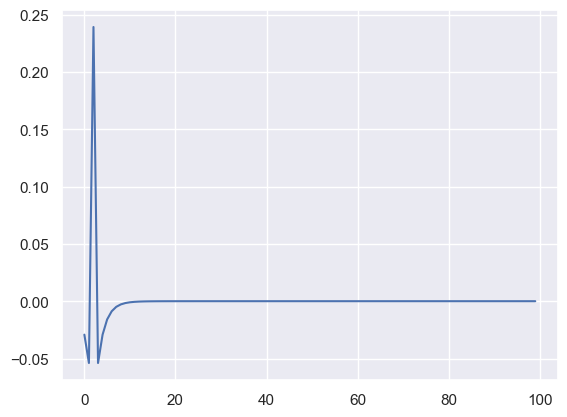

In [177]:
plt.plot(deterministic_cross_products_impact_impact[-1][2])

In [178]:
taus_GG

[2.9767634134093983]

**Evaluating $\tau_{Q}$ values - (lags >= 25)**

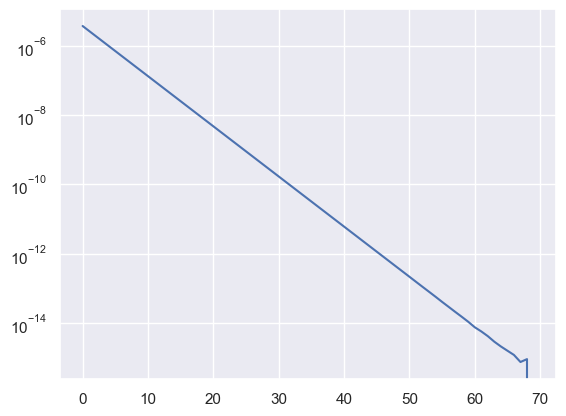

In [182]:
taus_Q = []

from scipy.optimize import curve_fit

def exp(x, a, tau):
    return a*np.exp(-x/tau)

x = np.arange(30,100)

#seed_Q = np.zeros(2)
#seed_Q[0] = 1
#seed_Q[1] = 1


for i in range(0, number_of_points):
    y = ACFs_Q[i][30:100]
    plt.plot(y)
    plt.yscale('log')
    parameters_Q, cov = curve_fit(f = exp, xdata = x, ydata = y, p0 = [3,3], maxfev = 50000000)
    taus_Q.append(parameters_Q[1])

In [180]:
taus_Q

[2.998830183480451]

In [181]:
tau_MU_vector

array([3.])

**Analysis of timeacales**

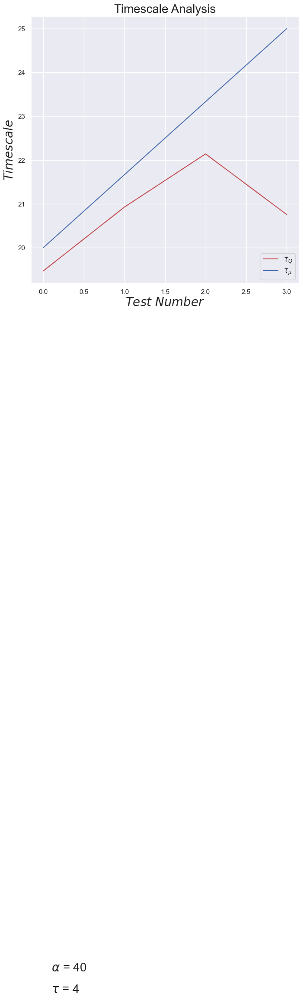

In [803]:
figure44 = plt.figure(figsize = (8,8))
plt.title(r"Timescale Analysis", fontsize = 20)

#plt.plot(np.arange(0,number_of_points), taus_GG[:],  color = 'r', label = r"$\tau_{GG}$")
plt.plot(np.arange(0,number_of_points), taus_Q[:],  color = 'r', label = r"$\tau_{Q}$")
plt.plot(np.arange(0,number_of_points), tau_MU_vector,  color = 'b', label = r"$\tau_{\mu}$" )

plt.text(0.1,3,r"$\tau$ = {}".format(tau), fontsize = 20)
plt.text(0.1,3.5,r"$\alpha$ = {}".format(alpha), fontsize = 20)

plt.xlabel(r"$Test \ Number$", fontsize = 20)
plt.ylabel(r"$Timescale$", fontsize = 20)
plt.legend(loc = 4, prop={'size': 12})
#plt.yscale('log')
plt.show()

## Is $\tau_{Q} = \tau_{\mu}$ ?

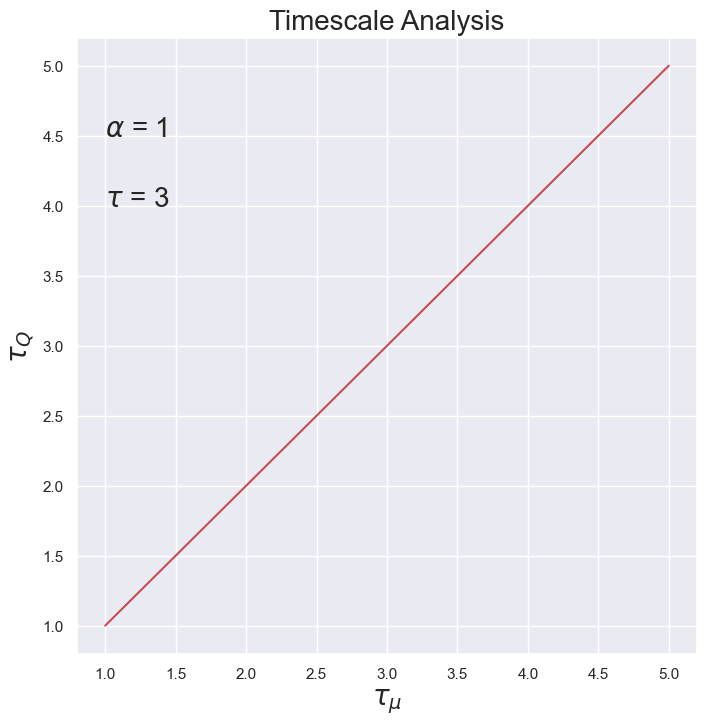

In [644]:
figure44 = plt.figure(figsize = (8,8))
plt.title(r"Timescale Analysis", fontsize = 20)


plt.plot(tau_MU_vector, taus_Q,  color = 'r')

plt.xlabel(r"$\tau_{\mu}$", fontsize = 20)
plt.ylabel(r"$\tau_{Q}$", fontsize = 20)
#plt.yscale('log')


plt.text(1,4,r"$\tau$ = {}".format(tau), fontsize = 20)
plt.text(1,4.5,r"$\alpha$ = {}".format(alpha), fontsize = 20)

                        
plt.show()

**Is $\tau_{NT} = \tau_{\mu}$ for large lags ?** 

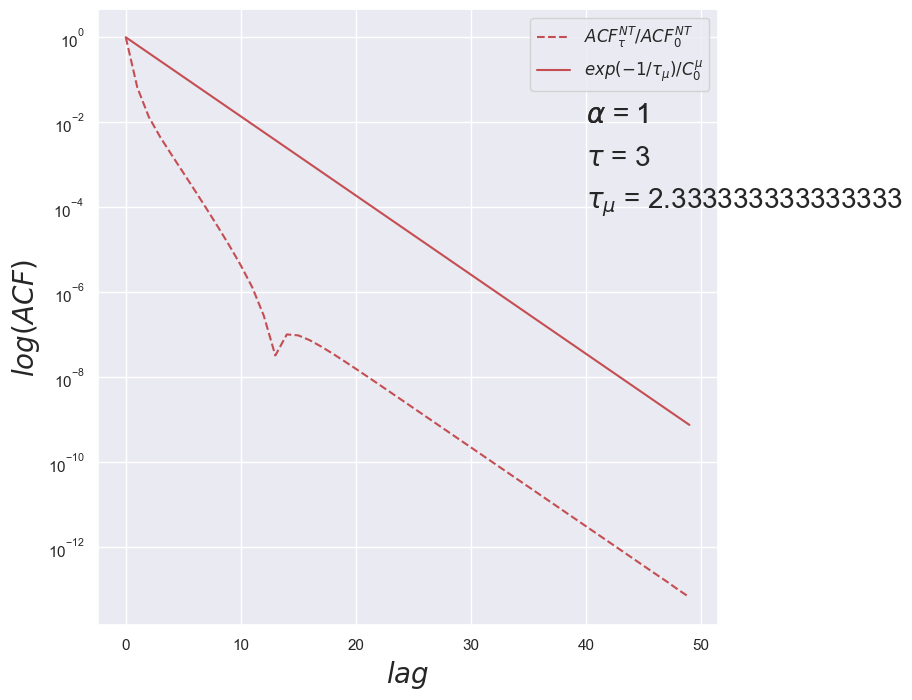

In [664]:
figure44 = plt.figure(figsize = (8,8))

i = 1

cte = np.exp(-1/tau_MU_vector[i])
C_MU_0 = ((1 - cte)/(cte))**2

plt.plot(np.arange(0,50), np.abs(ACFs_NT[i][0:50]/ACFs_NT[i][0]), label = r"$ACF^{NT}_{\tau}/ACF^{NT}_{0}$", color = "r", linestyle = "dashed")
plt.plot(np.arange(0,50), np.exp(-np.arange(0,50)/tau_MU_vector[i]), label = r"$exp(-1/\tau_{{\mu}})/C^{{\mu}}_{{0}}$".format(tau_MU_vector[i]), color = "r")
plt.yscale('log')
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$log(ACF)$", fontsize = 20)
plt.text(40,0.0001,r"$\tau_{{\mu}}$ = {}".format(tau_MU_vector[i]), fontsize = 20)
plt.text(40,0.01,r"$\alpha$ = {}".format(alpha), fontsize = 20)
plt.text(40,0.001,r"$\tau$ = {}".format(tau), fontsize = 20)
plt.text(40,0.01,r"$\alpha$ = {}".format(alpha), fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})

**Fitting multiple Gs as $\delta_{0} + A*exp$**

In [86]:
parameters_G = []
from scipy.optimize import curve_fit

#Possible optimization methods
#method{‘lm’, ‘trf’, ‘dogbox’}

def delta_exp(x_G, a, tau, delta_amplitude):
    return a*np.exp(-x_G/tau) + delta_amplitude*delta_vector(len(x_G))

#def delta_exp(x_G, a, tau):
#    return a*np.exp(-x_G/tau) 

for i in range(0, number_of_points):
    y_G = Gs[i][0,0:100]
    x_G = np.arange(0,100)
    parameters, cov = curve_fit(f = delta_exp, xdata = x_G, ydata = y_G, p0 = [0.4,tau_MU_vector[i],0.01], method = 'lm')
    parameters_G.append(parameters)

In [87]:
parameters_G

[array([ 0.58978309,  0.85423519, -0.05276644]),
 array([0.47263267, 1.91230967, 0.01024937]),
 array([0.42742073, 2.94034172, 0.01527046]),
 array([0.39697305, 3.95614274, 0.01513874]),
 array([0.37367383, 4.96565486, 0.01415557])]

**Is $\tau_{G} = \tau{\mu}$ ?**

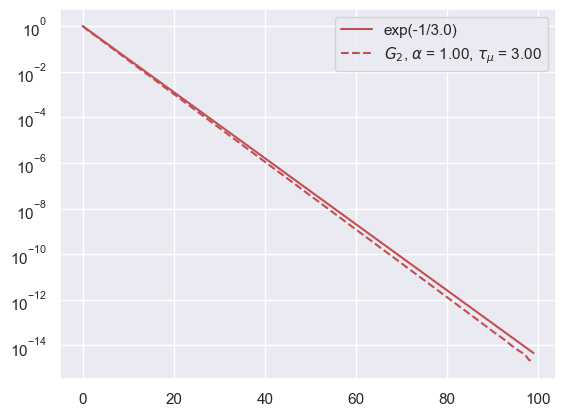

In [88]:
t = 100
i = 2

cte = np.exp(-1/tau_MU_vector[i])
C_MU_0 = ((1 - cte)/(cte))**2

plt.plot(np.arange(0,t), np.exp(-1*np.arange(0,t)/tau_MU_vector[i]), label = f"exp(-1/{tau_MU_vector[i]})", color = "r")
plt.plot(np.arange(0,t), Gs[i][0,0:t]/Gs[i][0,0], label = r"$G_{}$, $\alpha$ = {:.2f}, $\tau_{{\mu}}$ = {:.2f} ".format(i, alpha, tau_MU_vector[i]), color = 'r', linestyle = 'dashed')
plt.legend()
plt.yscale('log')

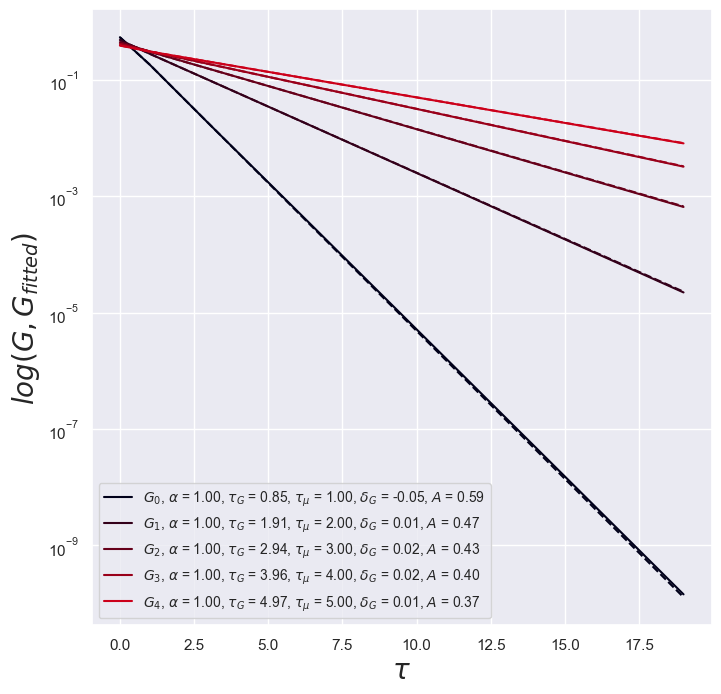

In [89]:
figure41 = plt.figure(figsize = (8,8))
#plt.title(r"$ G \approx \delta_{G} + A exp \left( -\frac{1}{\tau_{G}} \right) $", fontsize = 18)

colors_vector = ['b', 'g', 'r','c', 'm', 'k', 'y', 'lime', 'indigo', 'magenta'] 

t = 20

for i in range(0, number_of_points):
    #plt.plot(np.arange(0,t), (parameters_G[i][0]*np.exp(-1*np.arange(0,t)/parameters_G[i][1])), linestyle = "dashed", color = colors_vector[i])
    plt.plot(np.arange(0,t), (parameters_G[i][0]*np.exp(-1*np.arange(0,t)/parameters_G[i][1]) + parameters_G[i][2]*delta_vector(t)), linestyle = "dashed", color = color_conv((i)/number_of_points))
    plt.plot(np.arange(0,t), Gs[i][0,0:t], label = r"$G_{}$, $\alpha$ = {:.2f}, $\tau_{{G}}$ = {:.2f}, $\tau_{{\mu}}$ = {:.2f}, $\delta_{{G}}$ = {:.2f}, $A$ = {:.2f}".format(i, alpha, parameters_G[i][1], tau_MU_vector[i], parameters_G[i][2], parameters_G[i][0]), color = color_conv((i)/number_of_points))
    #plt.plot(np.arange(0,t), Gs[i][0,0:t], label = r"$G_{}$, $\alpha$ = {:.2f}, $\tau_{{G}}$ = {:.2f}, $\tau_{{\mu}}$ = {:.2f}, $\delta_{{G}}$ = {:.2f}".format(i, alpha, parameters_G[i][1], tau_MU_vector[i], 0), color = colors_vector[i])

plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$log(G,G_{fitted})$", fontsize = 20)
plt.legend(loc = 3, prop={'size': 10})
plt.yscale('log')

**Investigating the behavior of $G^{-1}$**

In [468]:
G_invs = []
for i in range(0, number_of_points):
    G_invs.append(np.linalg.inv(Gs[i]))

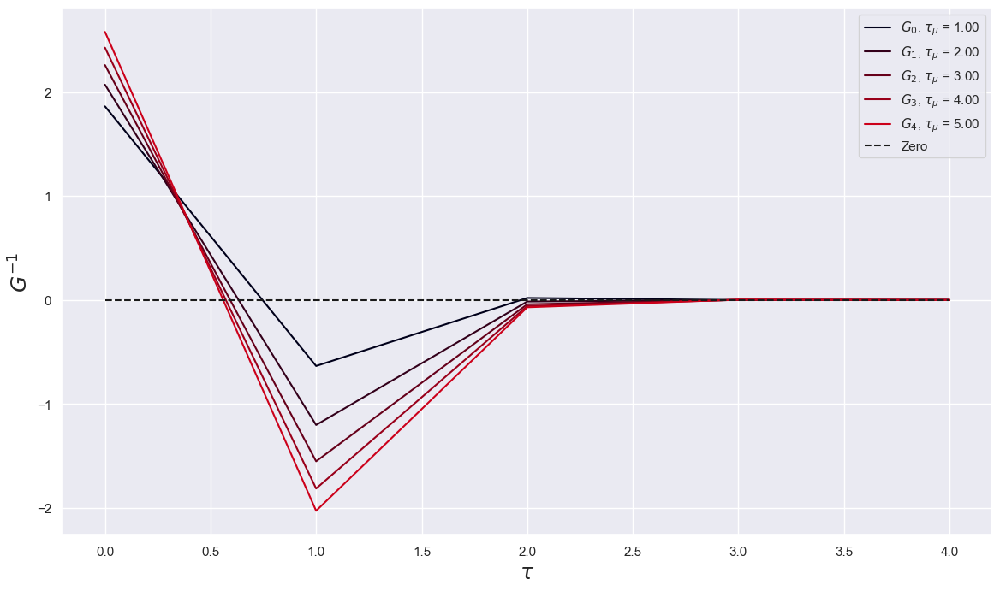

In [469]:
figure41 = plt.figure(figsize = (14,8))

for i in range(0, number_of_points):
    plt.plot(np.arange(0,5), G_invs[i][0,0:5], label = r"$G_{}$, $\tau_{{\mu}}$ = {:.2f}".format(i,tau_MU_vector[i]), color = color_conv((i)/number_of_points))
plt.plot(np.arange(0,5), np.zeros(5), color='k', linestyle='dashed', label = "Zero")

plt.xlabel(r"$\tau$", fontsize = 18)
plt.ylabel(r"$G^{-1}$", fontsize = 18)
plt.legend()

## Exploring properties in function of the Discouting Factor - $\tau$

In [478]:
T = 100
T_it = 100
G_0_seed = 1
alpha_G = 0.5
seed_type = "mark"
C_NT_0 = 1
tau_NT = 1
C_IT_0 = 1
tau_IT = 1

Var_TGT = 1
ACF_TGT = Var_TGT*np.identity(T) ## Var_tgt is a white noise process

I = np.identity(T)

tau = 3
tau_MU = 3
alpha = 1

tau_min = 0.0000001
tau_max = 10

number_of_points = 5

tau_vector = np.linspace(tau_min, tau_max, number_of_points)

cte = np.exp(-1/tau_MU)
C_MU_0 = ((1 - cte)/(cte))**2

D_MUs = []
D_TGTs = []
D_MU_NTs = []
D_TGT_NTs = []
D_MU_ITs = []
D_TGT_ITs = []
ACFs_NT = []
ACFs_Q = []
Gs = []
ACFs_MU = []
ACFs_IT = []
ACFs_P = []

In [479]:
for i in range(0, number_of_points):
    
        numerical_solution = numerical_solver_simulation(T, T_it, G_0_seed, alpha_G, alpha, C_MU_0, tau_MU, ACF_TGT, seed_type, C_NT_0, 
                            tau_NT, C_IT_0, tau_IT, tau_vector[i], _ , bound_for_convergence)

        D_MU = numerical_solution[3][-1][0]
        D_TGT =  numerical_solution[3][-1][1]
        D_MU_NT =  numerical_solution[3][-1][2]
        D_TGT_NT =  numerical_solution[3][-1][3] 
        D_MU_IT =  numerical_solution[3][-1][4]
        D_TGT_IT =  numerical_solution[3][-1][5]
    
        D_MUs.append(D_MU)
        D_TGTs.append(D_TGT)
        D_MU_NTs.append(D_MU_NT)
        D_TGT_NTs.append(D_TGT_NT)
        D_MU_ITs.append(D_MU_IT)
        D_TGT_ITs.append(D_TGT_IT)
        ACFs_NT.append(numerical_solution[4][-1][0,:])
        ACFs_Q.append(numerical_solution[6][-1][0,:])
        ACFs_IT.append(numerical_solution[5][-1][0,:])
        ACFs_P.append(numerical_solution[8][-2][0,:])
        Gs.append(numerical_solution[2][-1])
    
        print(f"Finished test {i + 1}")

Iteration 0 completed.

Iteration 1 completed.

Iteration 2 completed.

Iteration 3 completed.

Iteration 4 completed.

Iteration 5 completed.

Iteration 6 completed.

Iteration 7 completed.

Iteration 8 completed.

Iteration 9 completed.

Iteration 10 completed.

Iteration 11 completed.

Iteration 12 completed.

Iteration 13 completed.

Iteration 14 completed.

Iteration 15 completed.

Iteration 16 completed.

Iteration 17 completed.

Iteration 18 completed.

Iteration 19 completed.

Iteration 20 completed.

Iteration 21 completed.

Iteration 22 completed.

Iteration 23 completed.

Iteration 24 completed.

Iteration 25 completed.

Iteration 26 completed.

Iteration 27 completed.

Iteration 28 completed.

Iteration 29 completed.

Iteration 30 completed.

Iteration 31 completed.

Iteration 32 completed.

Iteration 33 completed.

Iteration 34 completed.

Iteration 35 completed.

Iteration 36 completed.

Iteration 37 completed.

Iteration 38 completed.

Iteration 39 completed.

Iteration 

Iteration 28 completed.

Iteration 29 completed.

Iteration 30 completed.

Iteration 31 completed.

Iteration 32 completed.

Iteration 33 completed.

Iteration 34 completed.

Iteration 35 completed.

Iteration 36 completed.

Iteration 37 completed.

Iteration 38 completed.

Iteration 39 completed.

Iteration 40 completed.

Iteration 41 completed.

Iteration 42 completed.

Iteration 43 completed.

Iteration 44 completed.

Iteration 45 completed.

Iteration 46 completed.

Iteration 47 completed.

Iteration 48 completed.

Iteration 49 completed.

Iteration 50 completed.

Iteration 51 completed.

Iteration 52 completed.

Iteration 53 completed.

Iteration 54 completed.

Iteration 55 completed.

Iteration 56 completed.

Iteration 57 completed.

Iteration 58 completed.

Iteration 59 completed.

Iteration 60 completed.

Iteration 61 completed.

Iteration 62 completed.

Iteration 63 completed.

Iteration 64 completed.

Iteration 65 completed.

Iteration 66 completed.

Iteration 67 completed.



## Plotting Informational Market Efficiency vs $\tau$

Text(0.5, 1.0, 'Informational Market Efficiency')

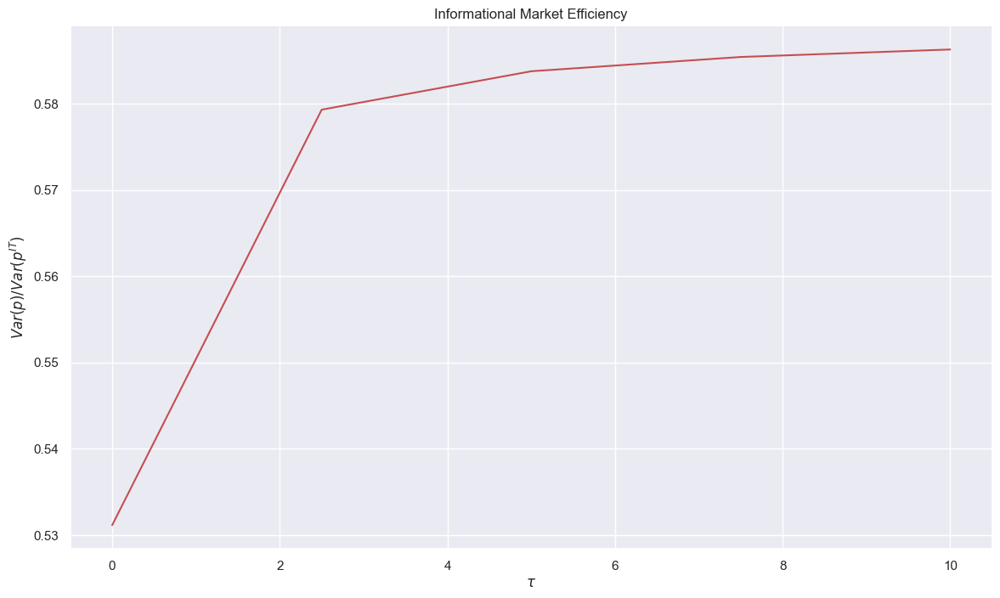

In [481]:
figure41 = plt.figure(figsize = (14,8))

informational_market_efficiency_for_different_tau = []

for i in range(0, number_of_points):
      informational_market_efficiency_for_different_tau.append(ACFs_P[i][0])
        
plt.plot(tau_vector, informational_market_efficiency_for_different_tau, color = "r")
plt.xlabel(r"$\tau$")
plt.ylabel(r"$Var(p)/Var(p^{IT})$")
plt.title("Informational Market Efficiency")

## Plotting IT's Order Flow Variance vs $\tau$


Text(0.5, 1.0, "IT's Order Flow Variance vs Discounting Factor")

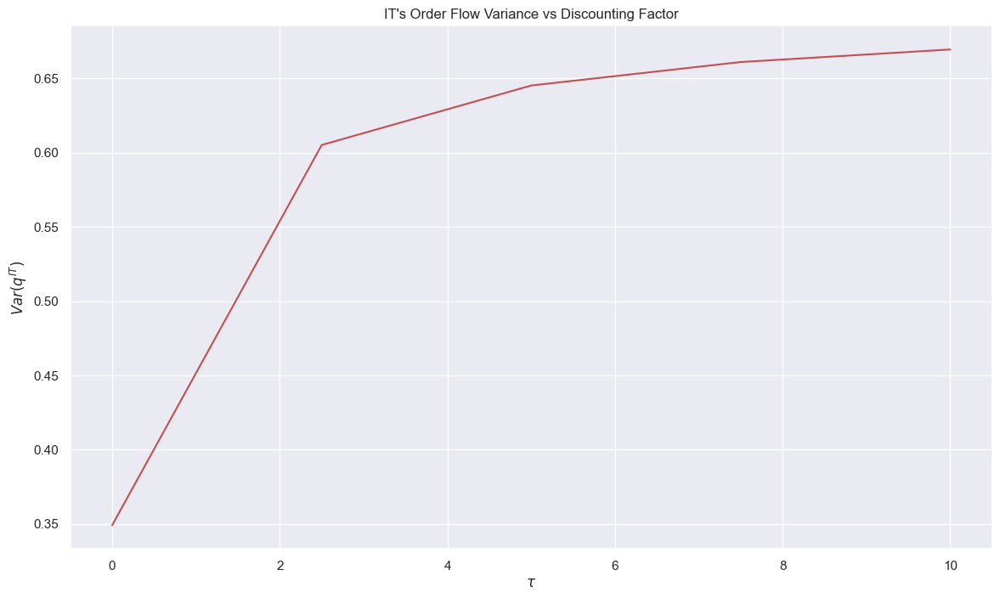

In [483]:
figure41 = plt.figure(figsize = (14,8))

IT_order_flow_variance = []

for i in range(0, number_of_points):
      IT_order_flow_variance.append(ACFs_IT[i][0])
        
plt.plot(tau_vector, IT_order_flow_variance, color = "r")
plt.xlabel(r"$\tau$")
plt.ylabel(r"$Var(q^{IT})$")
plt.title("IT's Order Flow Variance vs Discounting Factor")

## Plotting NT's Order Flow Variance vs $\tau$


Text(0.5, 1.0, "NT's Order Flow Variance vs Discounting Factor")

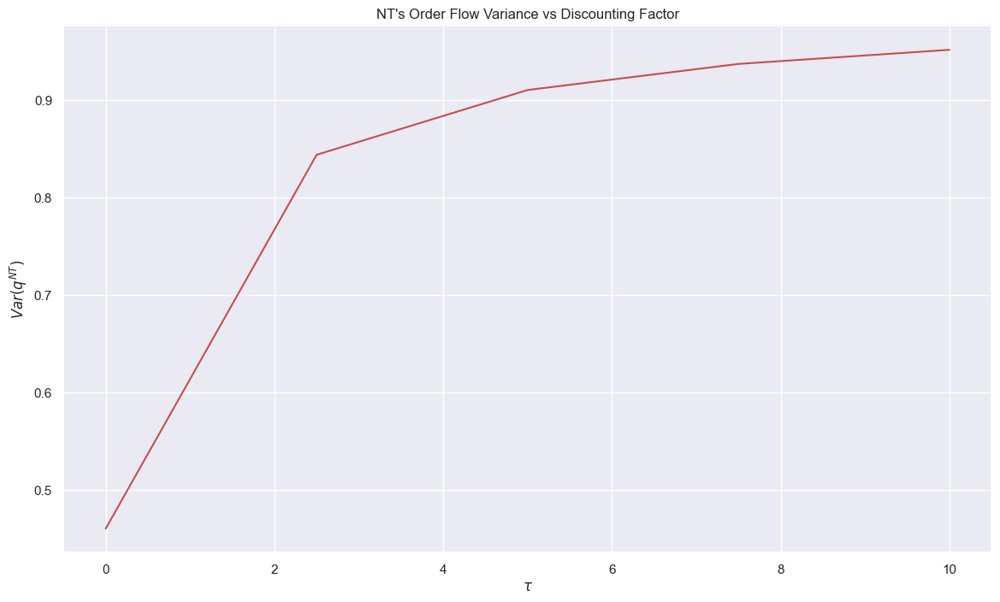

In [486]:
figure41 = plt.figure(figsize = (14,8))

NT_order_flow_variance = []

for i in range(0, number_of_points):
      NT_order_flow_variance.append(ACFs_NT[i][0])
        
plt.plot(tau_vector, NT_order_flow_variance, color = "r")
plt.xlabel(r"$\tau$")
plt.ylabel(r"$Var(q^{NT})$")
plt.title("NT's Order Flow Variance vs Discounting Factor")

## Plotting Total Order Flow Variance vs $\tau$

Text(0.5, 1.0, 'Total Order Flow Variance vs Discounting Factor')

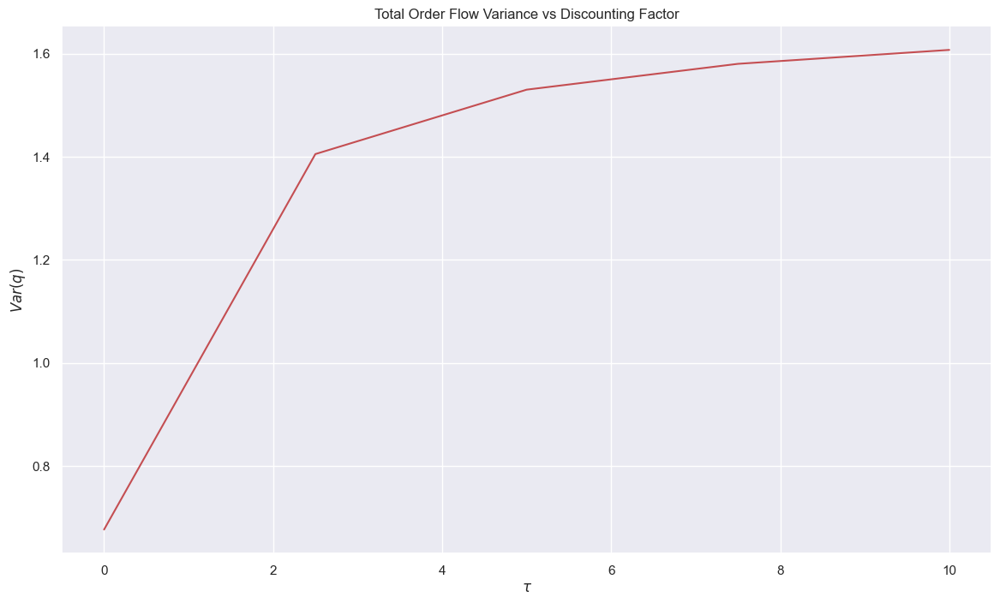

In [488]:
figure41 = plt.figure(figsize = (14,8))

total_order_flow_variance = []

for i in range(0, number_of_points):
      total_order_flow_variance.append(ACFs_Q[i][0])
        
plt.plot(tau_vector,total_order_flow_variance, color = "r")
plt.xlabel(r"$\tau$")
plt.ylabel(r"$Var(q)$")
plt.title("Total Order Flow Variance vs Discounting Factor")

## Do we retrieve the simplified case ? $\alpha = 1, \tau_{\mu} = 3$

In [489]:
G_full_case_tau_zero = Gs[0][0,:]

**Data imported from Simplified Model's Notebook**

In [490]:
G_simplified_case = np.array([ 6.22840355e-01,  4.06409033e-01,  2.44456502e-01,  1.47442862e-01,
        9.12871048e-02,  5.80804259e-02,  3.73378402e-02,  2.39413872e-02,
        1.52631722e-02,  9.69929284e-03,  6.16315060e-03,  3.92102873e-03,
        2.49682286e-03,  1.59013736e-03,  1.01245192e-03,  6.44523763e-04,
        4.10327608e-04,  2.61285658e-04,  1.66418310e-04,  1.06015648e-04,
        6.75481803e-05,  4.30469288e-05,  2.74394716e-05,  1.74958232e-05,
        1.11592339e-05,  7.12017704e-06,  4.54486498e-06,  2.90232638e-06,
        1.85434873e-06,  1.18545205e-06,  7.58322488e-07,  4.85438273e-07,
        3.11000017e-07,  1.99422032e-07,  1.28001831e-07,  8.22503187e-08,
        5.29163070e-08,  3.40901058e-08,  2.19945281e-08,  1.42138965e-08,
        9.20221753e-09,  5.96931970e-09,  3.88047959e-09,  2.52843389e-09,
        1.65159088e-09,  1.08172530e-09,  7.10516009e-10,  4.68110948e-10,
        3.09395984e-10,  2.05180947e-10,  1.36545532e-10,  9.11980329e-11,
        6.11372454e-11,  4.11397961e-11,  2.77894176e-11,  1.88434215e-11,
        1.28263888e-11,  8.76328751e-12,  6.00978769e-12,  4.13617071e-12,
        2.85671611e-12,  1.97941908e-12,  1.37611667e-12,  9.59406411e-13,
        6.71027737e-13,  4.70236864e-13,  3.30667039e-13,  2.32815745e-13,
        1.64489055e-13,  1.16274678e-13,  8.23720905e-14,  5.84351706e-14,
        4.17157702e-14,  2.94499830e-14,  2.10244133e-14,  1.49678952e-14,
        1.08097532e-14,  7.56841837e-15,  5.43473762e-15,  4.00108251e-15,
        2.83327330e-15,  1.94920505e-15,  1.34060591e-15,  1.17511483e-15,
        7.06025486e-16,  5.46249786e-16,  3.16142103e-16,  3.19825124e-16,
        2.40374506e-16,  1.35165474e-16,  3.58012462e-17,  1.94395360e-16,
        2.74454245e-17,  3.07528013e-17, -1.04613141e-17,  2.28140708e-16,
        3.90028994e-17,  6.88535314e-20,  1.27338044e-16, -5.67636381e-17])

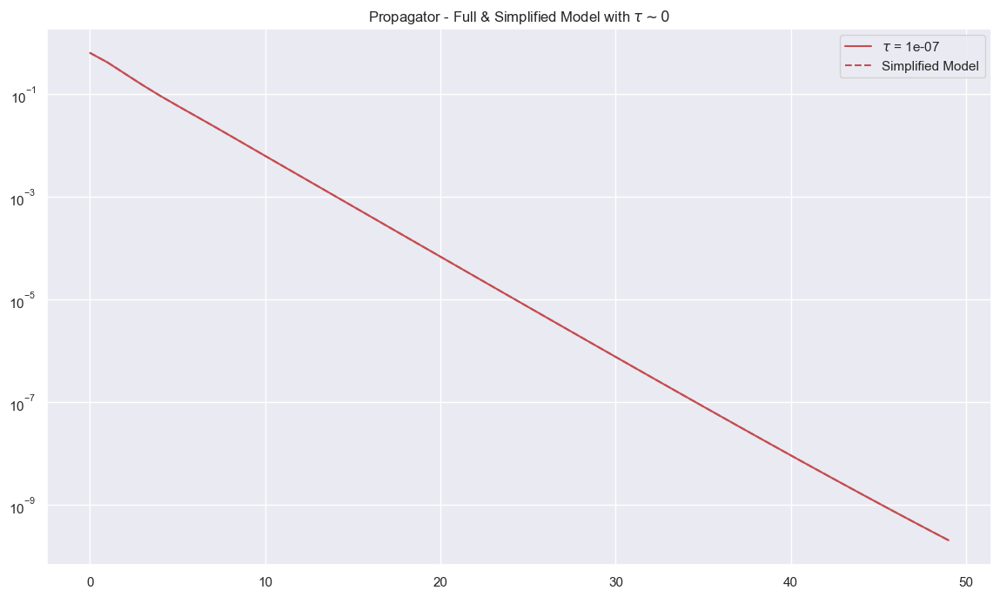

In [493]:
figure41 = plt.figure(figsize = (14,8))
plt.plot(np.arange(0,50), G_full_case_tau_zero[:50], label = r"$\tau$ = {}".format(tau_vector[0]), color = 'r')
plt.plot(np.arange(0,50), G_simplified_case[:50], label = r"Simplified Model", linestyle = 'dashed', color = 'r')
plt.title(r"Propagator - Full & Simplified Model with $\tau \sim 0$")
plt.yscale('log')
plt.legend()

## Testing the two models for the same parameters

**Gs**

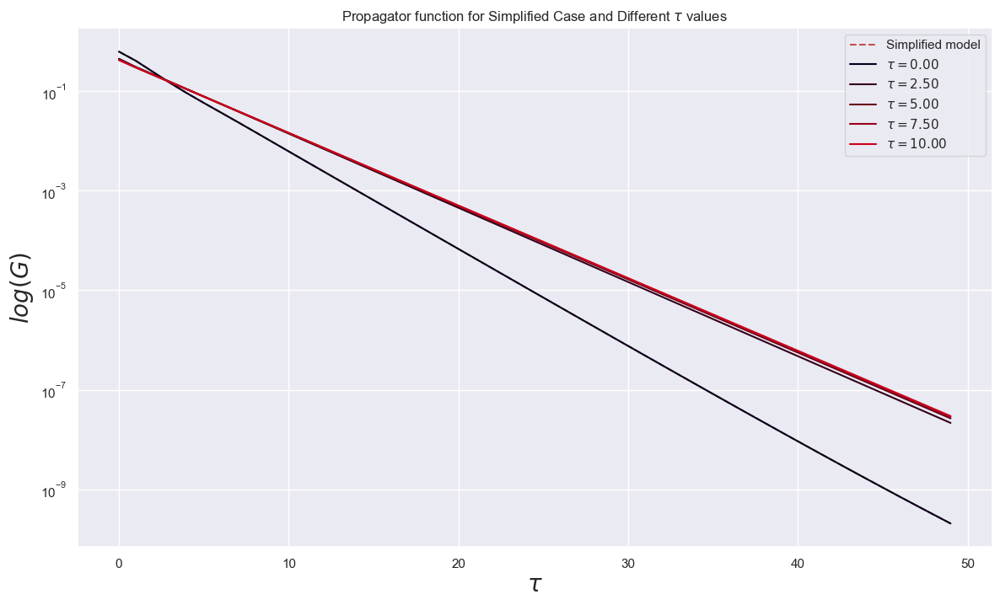

In [495]:
figure41 = plt.figure(figsize = (14,8))

plt.title(r"Propagator function for Simplified Case and Different $\tau$ values")
plt.plot(np.arange(0,50), G_simplified_case[:50], color = 'r', linestyle = 'dashed', label = "Simplified model")

for i in range(0, number_of_points):
    plt.plot(np.arange(0,50), Gs[i][0,:50], label = r"$\tau = {:.2f}$".format(tau_vector[i]), color = color_conv((i)/number_of_points)) 
    
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$log(G)$", fontsize = 20)   
plt.yscale('log')
#plt.text(44.5,0.2,r"$\alpha$ = {}".format(alpha), fontsize = 20)
#plt.text(44.5,0.01,r"$\tau_{{\mu}}$ = {}".format(tau_MU), fontsize = 20)
plt.legend()    
plt.show()

**It seems impact increases with bigger $\tau$.**

**ACFs**

**Data imported from Simplified Model's Notebook**

**$ACF_{NT}$**

In [497]:
ACF_NT_simplified_case = np.array([ 4.60739549e-01,  1.28832030e-01,  7.53282825e-02,  3.63029105e-02,
        1.63125451e-02,  7.12929358e-03,  3.23495472e-03,  1.52948076e-03,
        7.14873647e-04,  3.05529278e-04,  1.05131378e-04,  1.52408649e-05,
       -1.95564272e-05, -2.92974444e-05, -2.87770609e-05, -2.46649685e-05,
       -1.97888586e-05, -1.52770550e-05, -1.15096196e-05, -8.53440829e-06,
       -6.26225866e-06, -4.56279097e-06, -3.30841281e-06, -2.39065476e-06,
       -1.72325269e-06, -1.24000299e-06, -8.91167602e-07, -6.39905191e-07,
       -4.59198945e-07, -3.29375893e-07, -2.36179968e-07, -1.69314484e-07,
       -1.21359431e-07, -8.69764790e-08, -6.23294925e-08, -4.46641670e-08,
       -3.20041440e-08, -2.29318917e-08, -1.64310043e-08, -1.17728517e-08,
       -8.43518393e-09, -6.04371795e-09, -4.33023628e-09, -3.10254069e-09,
       -2.22291274e-09, -1.59267333e-09, -1.14111843e-09, -8.17588046e-10,
       -5.85785214e-10, -4.19703147e-10, -3.00708956e-10, -2.15452030e-10,
       -1.54367291e-10, -1.10601154e-10, -7.92437132e-11, -5.67766926e-11,
       -4.06795169e-11, -2.91460802e-11, -2.08827180e-11, -1.49620549e-11,
       -1.07200872e-11, -7.68072065e-12, -5.50310840e-12, -3.94283530e-12,
       -2.82498191e-12, -2.02399267e-12, -1.45018528e-12, -1.03898295e-12,
       -7.44432010e-13, -5.33379363e-13, -3.82097918e-13, -2.73831293e-13,
       -1.96216530e-13, -1.40499557e-13, -1.00697098e-13, -7.21397008e-14,
       -5.17549031e-14, -3.70697889e-14, -2.66310230e-14, -1.91483964e-14,
       -1.37268912e-14, -9.88410690e-15, -7.14138071e-15, -5.24564654e-15,
       -3.76059145e-15, -2.76243026e-15, -1.97743925e-15, -1.51783920e-15,
       -1.11978128e-15, -8.47467702e-16, -6.34231426e-16, -6.05467327e-16,
       -4.10387409e-16, -4.42178019e-16, -3.71665633e-16, -3.64866628e-16,
       -2.75076061e-16, -2.95265075e-16, -1.70071759e-16, -9.61139420e-17])

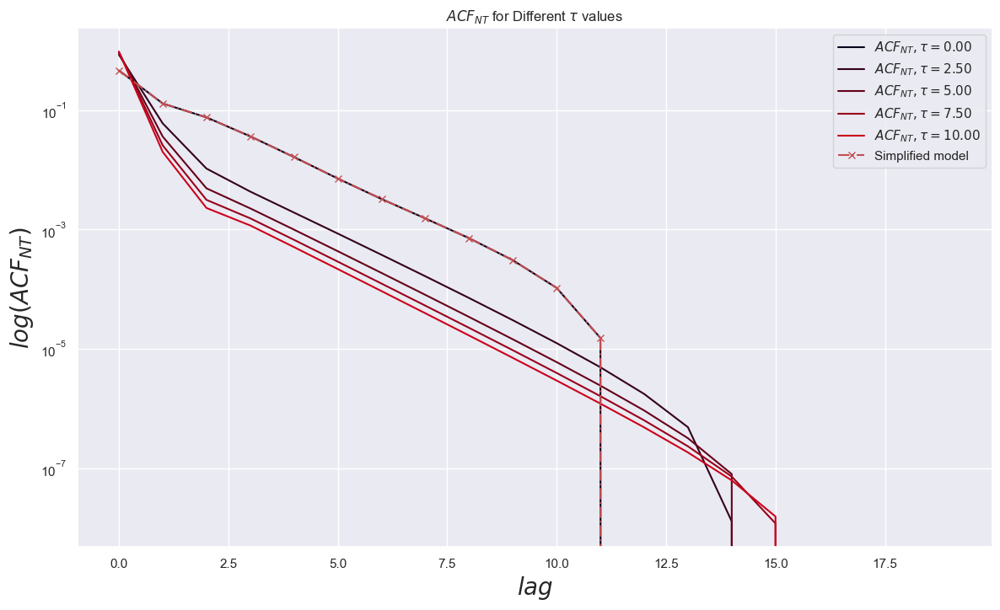

In [501]:
figure41 = plt.figure(figsize = (14,8))

plt.title(r"$ACF_{NT}$ for Different $\tau$ values")
for i in range(0, number_of_points):
    plt.plot(np.arange(0,20), ACFs_NT[i][0:20], label = r"$ACF_{{NT}}, \tau = {:.2f}$".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    
plt.plot(np.arange(0,20), ACF_NT_simplified_case[:20], color = 'r', linestyle = 'dashdot', label = "Simplified model", marker = "x")

plt.xlabel(r"$ lag $", fontsize = 20)
plt.ylabel(r"$log(ACF_{NT})$", fontsize = 20)   
plt.yscale('log')
plt.legend()    
plt.show()

In [502]:
ACF_Q_simplified_case = np.array([ 6.76642401e-01,  5.12205346e-02,  5.84907105e-02,  4.00601100e-02,
        2.61620085e-02,  1.72573529e-02,  1.19971530e-02,  8.60560721e-03,
        6.21271844e-03,  4.46835107e-03,  3.20196060e-03,  2.29205501e-03,
        1.64141803e-03,  1.17609421e-03,  8.42800905e-04,  6.03890208e-04,
        4.32647303e-04,  3.09947513e-04,  2.22047603e-04,  1.59078861e-04,
        1.13967705e-04,  8.16487095e-05,  5.84943888e-05,  4.19061474e-05,
        3.00221000e-05,  2.15082208e-05,  1.54087624e-05,  1.10390231e-05,
        7.90848091e-06,  5.66571980e-06,  4.05897863e-06,  2.90789087e-06,
        2.08323901e-06,  1.49244981e-06,  1.06920259e-06,  7.65984371e-07,
        5.48756214e-07,  3.93132213e-07,  2.81642017e-07,  2.01769675e-07,
        1.44548628e-07,  1.03555146e-07,  7.41872077e-08,  5.31478861e-08,
        3.80752344e-08,  2.72771388e-08,  1.95413539e-08,  1.39994226e-08,
        1.00291747e-08,  7.18488685e-09,  5.14723780e-09,  3.68746752e-09,
        2.64168911e-09,  1.89249600e-09,  1.35577525e-09,  9.71270354e-10,
        6.95812155e-10,  4.98475684e-10,  3.57104082e-10,  2.55826749e-10,
        1.83271996e-10,  1.31294599e-10,  9.40579846e-11,  6.73823390e-11,
        4.82717279e-11,  3.45816570e-11,  2.47735543e-11,  1.77476936e-11,
        1.27139907e-11,  9.10827935e-12,  6.52497837e-12,  4.67441804e-12,
        3.34847134e-12,  2.39914968e-12,  1.71849788e-12,  1.23116778e-12,
        8.81813201e-13,  6.31948290e-13,  4.52560424e-13,  3.24111268e-13,
        2.32268804e-13,  1.66409578e-13,  1.19184164e-13,  8.51100105e-14,
        6.11973905e-14,  4.36589005e-14,  3.13718755e-14,  2.22995512e-14,
        1.60145616e-14,  1.14637518e-14,  8.22794241e-15,  5.65097200e-15,
        4.21080679e-15,  2.86819782e-15,  2.07457036e-15,  1.17693837e-15,
        1.07907899e-15,  6.38512286e-16,  4.77667960e-16, -3.99393291e-17])

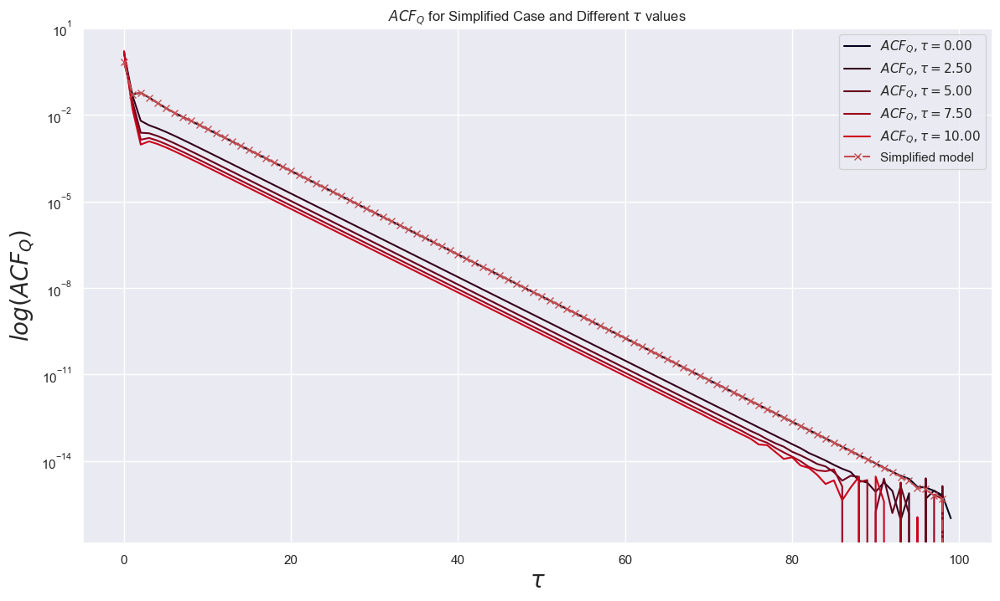

In [503]:
figure42 = plt.figure(figsize = (14,8))

plt.title(r"$ACF_{Q}$ for Simplified Case and Different $\tau$ values")
for i in range(0, number_of_points):
    plt.plot(np.arange(0,T), ACFs_Q[i][0:T], label = r"$ACF_{{Q}}, \tau = {:.2f}$".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    
plt.plot(np.arange(0,T), ACF_Q_simplified_case[:T], color = 'r', linestyle = 'dashdot', label = "Simplified model", marker = "x")

plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$log(ACF_{Q})$", fontsize = 20)   
plt.yscale('log')
plt.legend()    
plt.show()

**Evaluating $\tau_{NT}$**

In [504]:
taus_NT = []
amplitude_NT = []

from scipy.optimize import curve_fit

def exp(x, a, tau):
    return a*np.exp(-x/tau)

x = np.arange(20,T)

for i in range(0, number_of_points):
    y = np.abs(ACFs_NT[i][20:T])
    parameters_NT, cov = curve_fit(f = exp, xdata = x, ydata = y, p0 = [1,1], maxfev = 50000)
    taus_NT.append(parameters_NT[1])
    amplitude_NT.append(parameters_NT[0])

In [505]:
taus_NT

[3.089297564630984,
 3.0889919912836397,
 3.1280100768660524,
 3.171875686788279,
 3.2189800155488406]

In [506]:
tau_MU

3

**$ACF_{P}$**

In [507]:
ACF_P_simplified_case = np.array([ 5.31152552e-01,  3.80587434e-01,  2.72702813e-01,  1.95400104e-01,
        1.40010293e-01,  1.00321759e-01,  7.18836811e-02,  5.15069082e-02,
        3.69063125e-02,  2.64445284e-02,  1.89483326e-02,  1.35770736e-02,
        9.72839834e-03,  6.97070201e-03,  4.99472625e-03,  3.57887775e-03,
        2.56437796e-03,  1.83745710e-03,  1.31659555e-03,  9.43381932e-04,
        6.75962692e-04,  4.84348433e-04,  3.47050818e-04,  2.48672777e-04,
        1.78181831e-04,  1.27672861e-04,  9.14816023e-05,  6.55494324e-05,
        4.69682207e-05,  3.36542007e-05,  2.41142886e-05,  1.72786428e-05,
        1.23806886e-05,  8.87115100e-06,  6.35645745e-06,  4.55460079e-06,
        3.26351407e-06,  2.33841002e-06,  1.67554399e-06,  1.20057973e-06,
        8.60252970e-07,  6.16398188e-07,  4.41668601e-07,  3.16469382e-07,
        2.26760221e-07,  1.62480798e-07,  1.16422579e-07,  8.34204234e-08,
        5.97733453e-08,  4.28294734e-08,  3.06886587e-08,  2.19893849e-08,
        1.57560828e-08,  1.12897266e-08,  8.08944261e-09,  5.79633892e-09,
        4.15325832e-09,  2.97593963e-09,  2.13235392e-09,  1.52789835e-09,
        1.09478701e-09,  7.84449169e-10,  5.62082391e-10,  4.02749632e-10,
        2.88582722e-10,  2.06778556e-10,  1.48163310e-10,  1.06163650e-10,
        7.60695796e-11,  5.45062356e-11,  3.90554244e-11,  2.79844344e-11,
        2.00517235e-11,  1.43676877e-11,  1.02948981e-11,  7.37661683e-12,
        5.28557692e-12,  3.78728136e-12,  2.71370568e-12,  1.94445508e-12,
        1.39326294e-12,  9.98316515e-13,  7.15325026e-13,  5.12552748e-13,
        3.67260034e-13,  2.63153199e-13,  1.88557286e-13,  1.35106770e-13,
        9.68073978e-14,  6.93639155e-14,  4.96982976e-14,  3.56043860e-14,
        2.55000924e-14,  1.82491250e-14,  1.30319848e-14,  9.25213549e-15,
        6.47036609e-15,  4.35415259e-15,  2.69354052e-15, -1.42091067e-32])

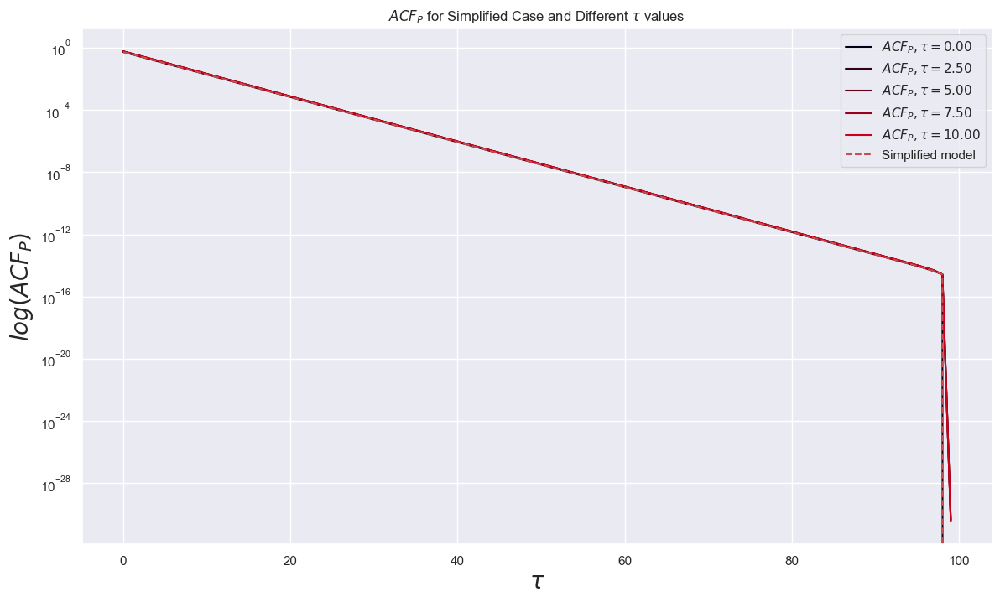

In [510]:
figure41 = plt.figure(figsize = (14,8))


plt.title(r"$ACF_{P}$ for Simplified Case and Different $\tau$ values")
for i in range(0, number_of_points):
    plt.plot(np.arange(0,T), ACFs_P[i][:T], label = r"$ACF_{{P}}, \tau = {:.2f}$".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    #plt.plot(np.arange(0,T), -1*ACFs_P[i][:T],  color = colors_vector[i])
    
plt.plot(np.arange(0,T), ACF_P_simplified_case[:T], color = 'r', linestyle = 'dashed', label = "Simplified model")

plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$log(ACF_{P})$", fontsize = 20)  
plt.yscale('log')
plt.legend()    
plt.show()

**Evaluating $\tau_{P}$**

In [511]:
taus_P = []
amplitude_P = []

from scipy.optimize import curve_fit

def exp(x, a, tau):
    return a*np.exp(-x/tau)

x = np.arange(10,T)

for i in range(0, number_of_points):
    y = ACFs_P[i][10:T]
    parameters_P, cov = curve_fit(f = exp, xdata = x, ydata = y, p0 = [1,1], maxfev = 50000)
    taus_P.append(parameters_P[1])
    amplitude_P.append(parameters_P[0])

In [512]:
taus_P

[2.9999999999999996,
 3.000000000000001,
 2.9999999999999982,
 3.0000000000000013,
 3.000000000000001]

In [513]:
tau_MU

3

**$ACF_{Q}$**

In [514]:
ACF_Q_simplified_case = np.array([ 6.76642401e-01,  5.12205346e-02,  5.84907105e-02,  4.00601100e-02,
        2.61620085e-02,  1.72573529e-02,  1.19971530e-02,  8.60560721e-03,
        6.21271844e-03,  4.46835107e-03,  3.20196060e-03,  2.29205501e-03,
        1.64141803e-03,  1.17609421e-03,  8.42800905e-04,  6.03890208e-04,
        4.32647303e-04,  3.09947513e-04,  2.22047603e-04,  1.59078861e-04,
        1.13967705e-04,  8.16487095e-05,  5.84943888e-05,  4.19061474e-05,
        3.00221000e-05,  2.15082208e-05,  1.54087624e-05,  1.10390231e-05,
        7.90848091e-06,  5.66571980e-06,  4.05897863e-06,  2.90789087e-06,
        2.08323901e-06,  1.49244981e-06,  1.06920259e-06,  7.65984371e-07,
        5.48756214e-07,  3.93132213e-07,  2.81642017e-07,  2.01769675e-07,
        1.44548628e-07,  1.03555146e-07,  7.41872077e-08,  5.31478861e-08,
        3.80752344e-08,  2.72771388e-08,  1.95413539e-08,  1.39994226e-08,
        1.00291747e-08,  7.18488685e-09,  5.14723780e-09,  3.68746752e-09,
        2.64168911e-09,  1.89249600e-09,  1.35577525e-09,  9.71270354e-10,
        6.95812155e-10,  4.98475684e-10,  3.57104082e-10,  2.55826749e-10,
        1.83271996e-10,  1.31294599e-10,  9.40579846e-11,  6.73823390e-11,
        4.82717279e-11,  3.45816570e-11,  2.47735543e-11,  1.77476936e-11,
        1.27139907e-11,  9.10827935e-12,  6.52497837e-12,  4.67441804e-12,
        3.34847134e-12,  2.39914968e-12,  1.71849788e-12,  1.23116778e-12,
        8.81813201e-13,  6.31948290e-13,  4.52560424e-13,  3.24111268e-13,
        2.32268804e-13,  1.66409578e-13,  1.19184164e-13,  8.51100105e-14,
        6.11973905e-14,  4.36589005e-14,  3.13718755e-14,  2.22995512e-14,
        1.60145616e-14,  1.14637518e-14,  8.22794241e-15,  5.65097200e-15,
        4.21080679e-15,  2.86819782e-15,  2.07457036e-15,  1.17693837e-15,
        1.07907899e-15,  6.38512286e-16,  4.77667960e-16, -3.99393291e-17])

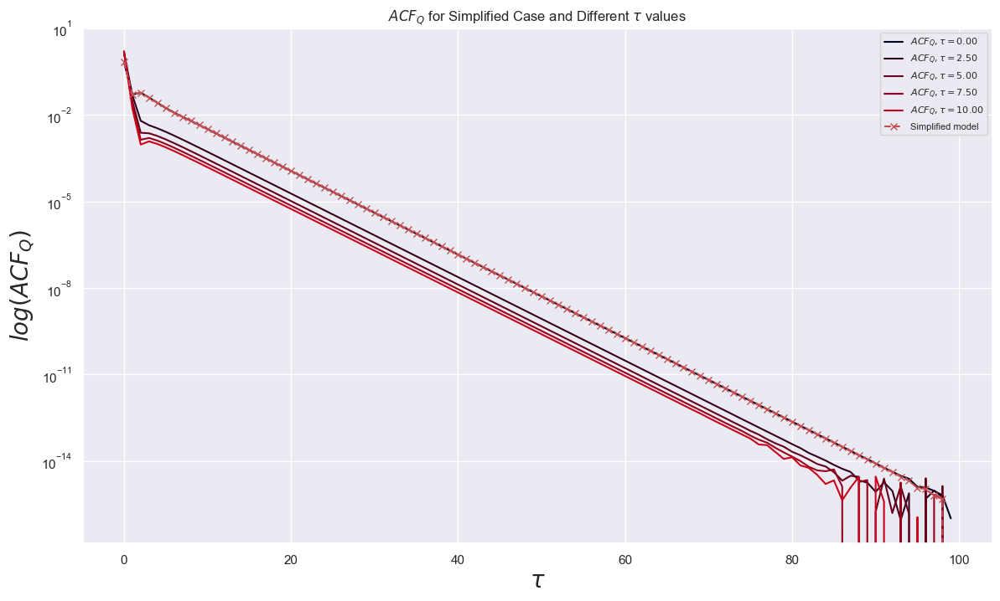

In [515]:
figure41 = plt.figure(figsize = (14,8))



plt.title(r"$ACF_{Q}$ for Simplified Case and Different $\tau$ values")
for i in range(0, number_of_points):
    plt.plot(np.arange(0,T), ACFs_Q[i][:T], label = r"$ACF_{{Q}}, \tau = {:.2f}$".format(tau_vector[i]), color = color_conv((i)/number_of_points))
    
plt.plot(np.arange(0,T), ACF_Q_simplified_case[:T], color = 'r', linestyle = 'dashed', label = "Simplified model", marker = "x")

plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$log(ACF_{Q})$", fontsize = 20)  
plt.yscale('log')
plt.legend(prop={'size': 8}, loc = 1)
plt.show()

**Evaluating $\tau_{Q}$**

In [516]:
taus_Q = []
amplitude_Q = []

from scipy.optimize import curve_fit

def exp(x, a, tau):
    return a*np.exp(-x/tau)

x = np.arange(10,T)

for i in range(0, number_of_points):
    y = ACFs_Q[i][10:T]
    parameters_Q, cov = curve_fit(f = exp, xdata = x, ydata = y, p0 = [1,1], maxfev = 50000)
    taus_Q.append(parameters_Q[1])
    amplitude_Q.append(parameters_Q[0])

In [517]:
taus_Q

[2.996595846893544,
 3.0085212967763852,
 3.0095526336333998,
 3.009909931158245,
 3.0100969135716253]

In [518]:
tau_MU

3

## Investigating gains in function of $\tau$

In [519]:
def simulate_market_for_different_taus(alpha, tau_min, tau_max, number_of_points, number_of_simulations):
    
    #Defining fixed parameters for the solver
    T = 100
    T_it = 100
    alpha = 1
    Var_TGT = 1
    ACF_TGT = Var_TGT*np.identity(T) ## Var_tgt is a white noise process
    G_0_seed = 1
    alpha_G = 0.5
    seed_type = "mark"
    C_NT_0 = 1
    tau_NT = 1
    C_IT_0 = 1
    tau_IT = 1
    bound_for_convergence = 0.00001
    tau_MU = 3
    cte = np.exp(-1/tau_MU)
    C_MU_0 = ((1 - cte)/(cte))**2
    ACF_MU = return_Markovian_ACF(C_MU_0, tau_MU, T)
    
    #Lists for storing results
    tau_vector = np.linspace(tau_min, tau_max, number_of_points)
    
    phi_t_vector = []
    noise_trader_total_position_t = []
    target_portfolio_total_position_t = []
    market_maker_total_position_t = []
    informed_trader_total_position_t = []
    var_noise_trader_total_position_t = []
    var_informed_trader_total_position_t = []
    var_market_maker_total_position_t = []
    var_target_portfolio_total_position_t = []
    var_price_t = []
    var_IT_estimated_price_t = []
    MM_mean_gain_vector = []
    NT_mean_gain_vector = []
    IT_mean_gain_vector = []
    ACFs_NT = []
    ACFs_IT = []
    ACFs_Q = []
    ACFs_MU = []
    ACFs_P = []
    Ds_MU_IT = []
    
    for i in range(0, number_of_points):
        
        numerical_solution = numerical_solver_simulation(T, T_it, G_0_seed, alpha_G, alpha, C_MU_0, tau_MU, ACF_TGT, seed_type, C_NT_0, 
                                tau_NT, C_IT_0, tau_IT,tau_vector[i], _ , bound_for_convergence)
        
        G = numerical_solution[0]
        
        ACFs_NT.append(numerical_solution[4])
        ACFs_IT.append(numerical_solution[5])
        ACFs_Q.append(numerical_solution[6])
        ACFs_MU.append(numerical_solution[7])
        ACFs_P.append(numerical_solution[8])
        
        D_MU = numerical_solution[3][-1][0]
        D_TGT =  numerical_solution[3][-1][1]
        D_MU_NT =  numerical_solution[3][-1][2]
        D_TGT_NT =  numerical_solution[3][-1][3] 
        D_MU_IT =  numerical_solution[3][-1][4]
        D_TGT_IT =  numerical_solution[3][-1][5]
        
        Ds_MU_IT.append(D_MU_IT)
        
        dividends_flow = generate_order_flow(ACF_MU, number_of_simulations)
        target_portfolio_order_flow = generate_order_flow(ACF_TGT, number_of_simulations)
        NT_order_flow = return_NT_order_flow(D_MU_NT, D_TGT_NT, dividends_flow, target_portfolio_order_flow)
        IT_order_flow = return_IT_order_flow(D_MU_IT, D_TGT_IT, dividends_flow, target_portfolio_order_flow)
        total_order_flow = return_total_order_flow(D_MU, D_TGT, dividends_flow, target_portfolio_order_flow)
        price_simulations = return_price_series(total_order_flow, G)
        fundamental_price_simulations = return_fundamental_price_series(dividends_flow, tau_MU)
        IT_estimated_price_simulations = return_IT_estimated_price_series(dividends_flow, tau_MU)
        var_price_t.append(return_price_variance_t(price_simulations))
        var_IT_estimated_price_t.append(return_price_variance_t(IT_estimated_price_simulations))
        result_phi_and_total_positions_information = return_phi_t_and_total_positions_information(NT_order_flow, IT_order_flow, total_order_flow, target_portfolio_order_flow)
        phi_t_vector.append(result_phi_and_total_positions_information[0])
        noise_trader_total_position_t.append(result_phi_and_total_positions_information[1])
        target_portfolio_total_position_t.append(result_phi_and_total_positions_information[2])
        informed_trader_total_position_t.append(result_phi_and_total_positions_information[3])
        market_maker_total_position_t.append(result_phi_and_total_positions_information[4])
        var_noise_trader_total_position_t.append(result_phi_and_total_positions_information[5])
        var_target_portfolio_total_position_t.append(result_phi_and_total_positions_information[6])
        var_informed_trader_total_position_t.append(result_phi_and_total_positions_information[7])
        var_market_maker_total_position_t.append(result_phi_and_total_positions_information[8])
        MM_mean_gain_vector.append(return_mean_gain(total_order_flow, price_simulations, fundamental_price_simulations)) 
        NT_mean_gain_vector.append(return_mean_gain(NT_order_flow, price_simulations, fundamental_price_simulations)) 
        IT_mean_gain_vector.append(return_mean_gain(IT_order_flow, price_simulations, fundamental_price_simulations))
        
    return phi_t_vector, noise_trader_total_position_t, target_portfolio_total_position_t, informed_trader_total_position_t, market_maker_total_position_t, var_noise_trader_total_position_t, var_target_portfolio_total_position_t, var_informed_trader_total_position_t, var_market_maker_total_position_t, MM_mean_gain_vector, NT_mean_gain_vector, IT_mean_gain_vector, tau_vector, var_price_t, var_IT_estimated_price_t, ACFs_NT, ACFs_IT, ACFs_Q, ACFs_MU, ACFs_P, tau_MU, Ds_MU_IT  

In [520]:
number_of_points_different_taus = 5
market_simulation_different_taus  = simulate_market_for_different_taus(1, 0.0000001, 10, number_of_points_different_taus, 20000)
phi_t_vector_different_taus  = market_simulation_different_taus[0] 
noise_trader_total_position_t_different_taus = market_simulation_different_taus[1] 
target_portfolio_total_position_t_different_taus = market_simulation_different_taus[2] 
informed_trader_total_position_t_different_taus = market_simulation_different_taus[3] 
market_maker_total_position_t_different_taus = market_simulation_different_taus[4] 
var_noise_trader_total_position_t_different_taus = market_simulation_different_taus[5] 
var_target_portfolio_total_position_t_different_taus = market_simulation_different_taus[6] 
var_informed_trader_total_position_t_different_taus = market_simulation_different_taus[7] 
var_market_maker_total_position_t_different_taus = market_simulation_different_taus[8] 
MM_mean_gain_vector_different_taus = market_simulation_different_taus[9] 
NT_mean_gain_vector_different_taus = market_simulation_different_taus[10] 
IT_mean_gain_vector_different_taus = market_simulation_different_taus[11] 
tau_vector_different_taus = market_simulation_different_taus[12]
var_price_t_different_taus = market_simulation_different_taus[13]
var_IT_estimated_price_t_different_taus = market_simulation_different_taus[14]
ACFs_NT_different_taus = market_simulation_different_taus[15]
ACFs_IT_different_taus = market_simulation_different_taus[16]
ACFs_Q_different_taus = market_simulation_different_taus[17]
ACFs_MU_different_taus = market_simulation_different_taus[18]
ACFs_P_different_taus = market_simulation_different_taus[19]
tau_MU_different_taus =  market_simulation_different_taus[20] 
Ds_MU_IT_different_taus = market_simulation_different_taus[21] 

Iteration 0 completed.

Iteration 1 completed.

Iteration 2 completed.

Iteration 3 completed.

Iteration 4 completed.

Iteration 5 completed.

Iteration 6 completed.

Iteration 7 completed.

Iteration 8 completed.

Iteration 9 completed.

Iteration 10 completed.

Iteration 11 completed.

Iteration 12 completed.

Iteration 13 completed.

Iteration 14 completed.

Iteration 15 completed.

Iteration 16 completed.

Iteration 17 completed.

Iteration 18 completed.

Iteration 19 completed.

Iteration 20 completed.

Iteration 21 completed.

Iteration 22 completed.

Iteration 23 completed.

Iteration 24 completed.

Iteration 25 completed.

Iteration 26 completed.

Iteration 27 completed.

Iteration 28 completed.

Iteration 29 completed.

Iteration 30 completed.

Iteration 31 completed.

Iteration 32 completed.

Iteration 33 completed.

Iteration 34 completed.

Iteration 35 completed.

Iteration 36 completed.

Iteration 37 completed.

Iteration 38 completed.

Iteration 39 completed.

Iteration 

Iteration 30 completed.

Iteration 31 completed.

Iteration 32 completed.

Iteration 33 completed.

Iteration 34 completed.

Iteration 35 completed.

Iteration 36 completed.

Iteration 37 completed.

Iteration 38 completed.

Iteration 39 completed.

Iteration 40 completed.

Iteration 41 completed.

Iteration 42 completed.

Iteration 43 completed.

Iteration 44 completed.

Iteration 45 completed.

Iteration 46 completed.

Iteration 47 completed.

Iteration 48 completed.

Iteration 49 completed.

Iteration 50 completed.

Iteration 51 completed.

Iteration 52 completed.

Iteration 53 completed.

Iteration 54 completed.

Iteration 55 completed.

Iteration 56 completed.

Iteration 57 completed.

Iteration 58 completed.

Iteration 59 completed.

Iteration 60 completed.

Iteration 61 completed.

Iteration 62 completed.

Iteration 63 completed.

Iteration 64 completed.

Iteration 65 completed.

Iteration 66 completed.

Iteration 67 completed.

Iteration 68 completed.

Iteration 69 completed.



**Mean gain of agents vs $\tau$**

NameError: name 'tau_vector_different_taus' is not defined

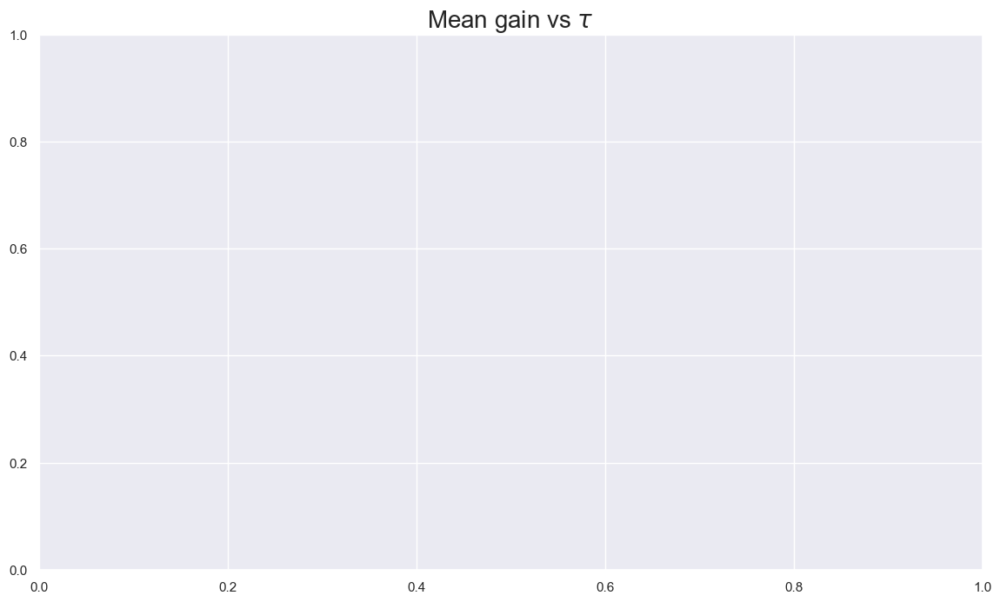

In [281]:
figure31 = plt.figure(figsize = (14,8))
plt.title(r"Mean gain vs $\tau}$", fontsize = 20)
plt.plot(tau_vector_different_taus, NT_mean_gain_vector_different_taus, label = r"$-\langle q_t^{NT}(p_t - p^F_t)$" )
plt.plot(tau_vector_different_taus, IT_mean_gain_vector_different_taus, label = r"$-\langle q_t^{IT}(p_t - p^F_t)$")
plt.plot(tau_vector_different_taus, MM_mean_gain_vector_different_taus, label = r"$-\langle q_t^{MM}(p_t - p^F_t)$")
plt.plot(tau_vector_different_taus, np.zeros(len(tau_vector_different_taus)), linestyle = 'dashed', color = 'r', label = "Zero")
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"Mean Gain of Trader", fontsize = 20)
plt.legend(loc = 1, prop={'size': 14})
plt.show()

**NT's gain vs $\tau$**

Mean

In [459]:
np.mean(NT_mean_gain_vector_different_taus)

-0.3708909143761558

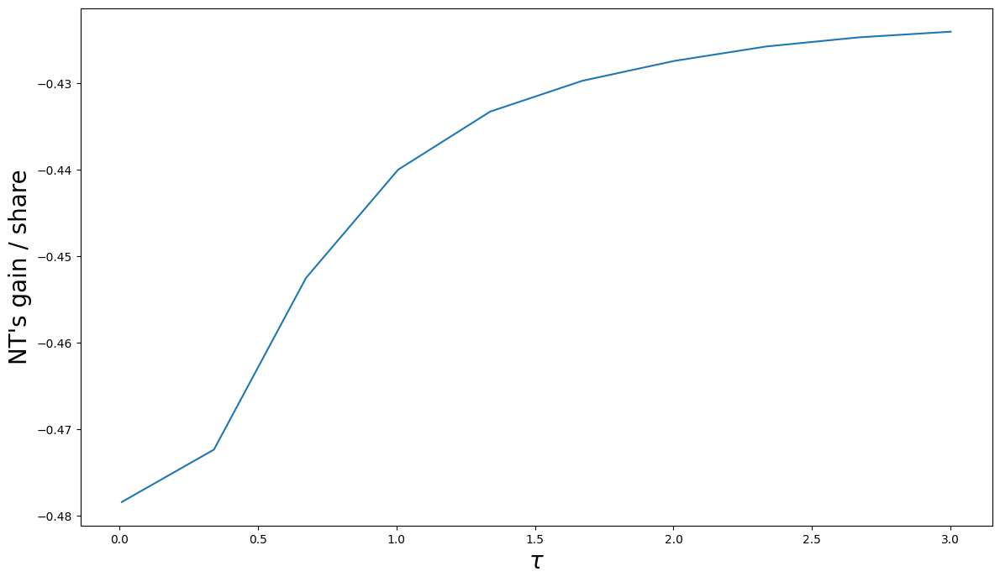

In [460]:
figure31 = plt.figure(figsize = (14,8))

normalized_NT_mean_gain = []

for i in range(0, number_of_points_different_taus):
    normalized_NT_mean_gain.append(NT_mean_gain_vector_different_taus[i]/np.sqrt(ACFs_NT_different_taus[i][-1][0,0]))
    
plt.plot(tau_vector_different_taus, normalized_NT_mean_gain)
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"NT's gain / share", fontsize = 20)
plt.show()

In [461]:
NT_mean_gain_vector_different_taus[0]/ACFs_NT_different_taus[0][-1][0,0]

-0.7047560744884387

**IT's gain vs $\tau$**

Mean

In [463]:
np.mean(IT_mean_gain_vector_different_taus)

0.3693446772495693

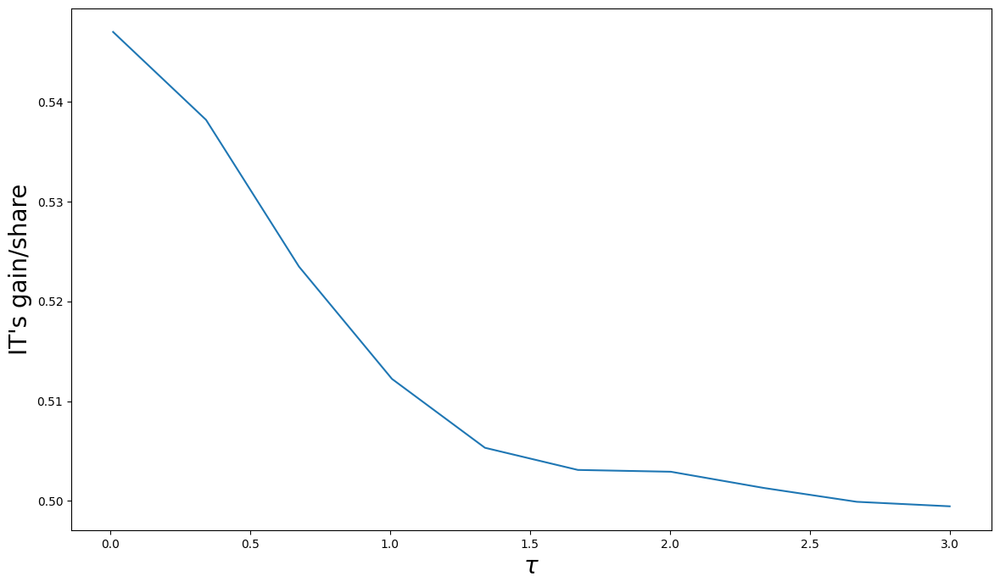

In [464]:
figure31 = plt.figure(figsize = (14,8))

normalized_IT_mean_gain = []

for i in range(0, number_of_points_different_taus):
    normalized_IT_mean_gain.append(IT_mean_gain_vector_different_taus[i]/np.sqrt(ACFs_IT_different_taus[i][-1][0,0]))
    
plt.plot(tau_vector_different_taus,  normalized_IT_mean_gain)
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"IT's gain/share", fontsize = 20)
plt.show()

**MM's gain vs $\tau$**

Mean

In [465]:
np.mean(MM_mean_gain_vector_different_taus)

-0.001546237126586156

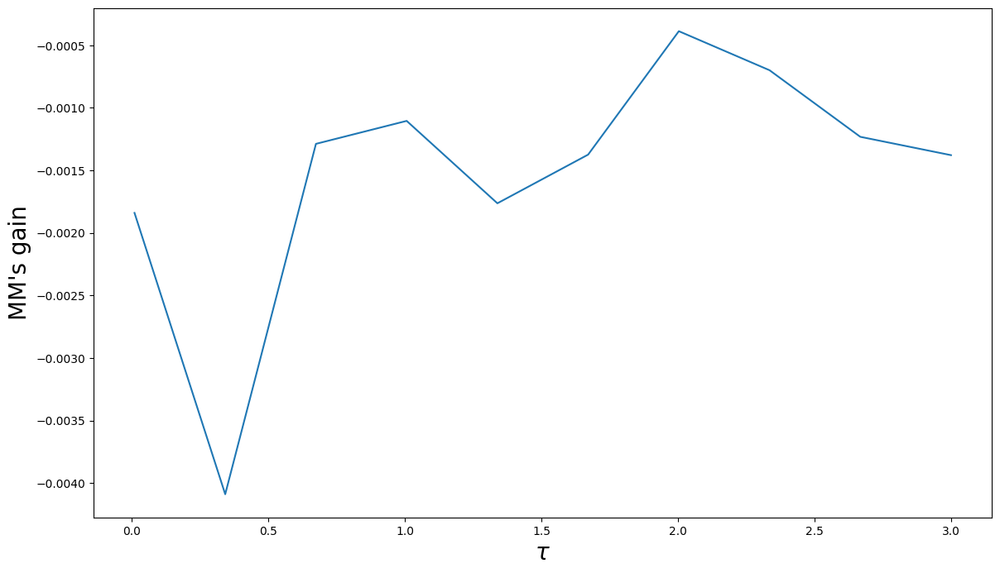

In [466]:
figure31 = plt.figure(figsize = (14,8))

normalized_MM_mean_gain = []

for i in range(0, number_of_points_different_taus):
    normalized_MM_mean_gain.append(MM_mean_gain_vector_different_taus[i]/np.sqrt(ACFs_Q_different_taus[i][-1][0,0]))
    
plt.plot(tau_vector_different_taus, normalized_MM_mean_gain)
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"MM's gain", fontsize = 20)
plt.show()

**Informational Market Efficiency vs $\tau$**

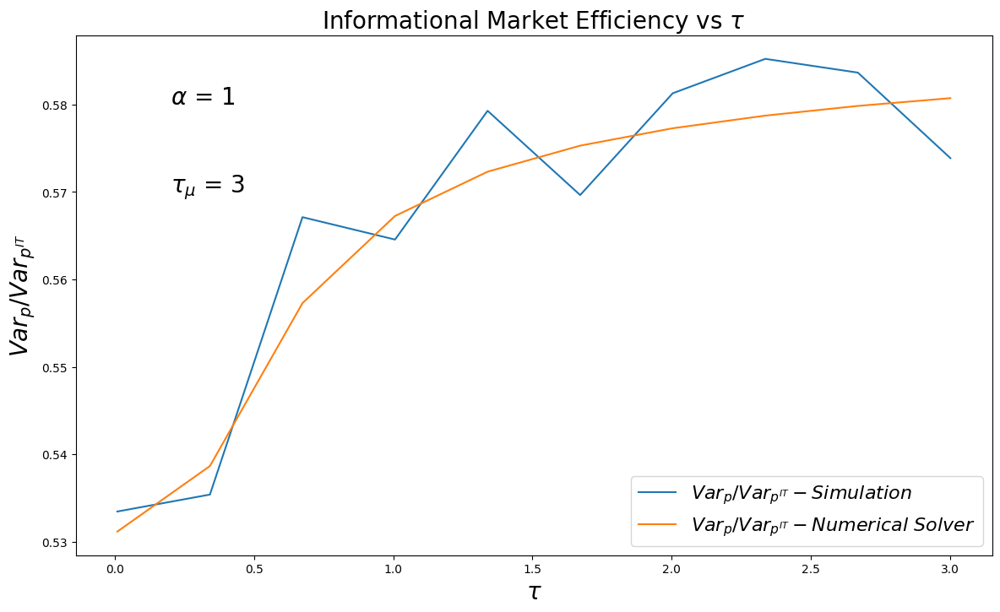

In [476]:
figure35 = plt.figure(figsize = (14,8))
plt.title(r"Informational Market Efficiency vs $\tau$", fontsize = 20)

ratio_var_p_pt_it_stationary_different_taus = []
ratio_var_p_pt_it_stationary_numerical_solver_different_taus = []


for i in range(0, number_of_points_different_taus):
    ratio_var_p_pt_it_stationary_different_taus.append((var_price_t_different_taus[i][-1]/var_IT_estimated_price_t_different_taus[i])[-1])
    ratio_var_p_pt_it_stationary_numerical_solver_different_taus.append(ACFs_P_different_taus[i][0,0])


plt.plot(tau_vector_different_taus, ratio_var_p_pt_it_stationary_different_taus, label = r"$ Var_{p}/Var_{p^{IT}} - Simulation$")
plt.plot(tau_vector_different_taus, ratio_var_p_pt_it_stationary_numerical_solver_different_taus, label = r"$ Var_{p}/Var_{p^{IT}} - Numerical \ Solver$")
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"$ Var_{p}/Var_{{p^{IT}}}$", fontsize = 20)
plt.text(0.2,0.58,r"$\alpha$ = {}".format(alpha), fontsize = 20)
plt.text(0.2,0.57,r"$\tau_{{\mu}}$ = {}".format(tau_MU_different_taus), fontsize = 20)
plt.legend(loc = 4, prop={'size': 16})
plt.show()

## Investigating $D_{\mu}^{IT}(t)$ for different $\tau$ values

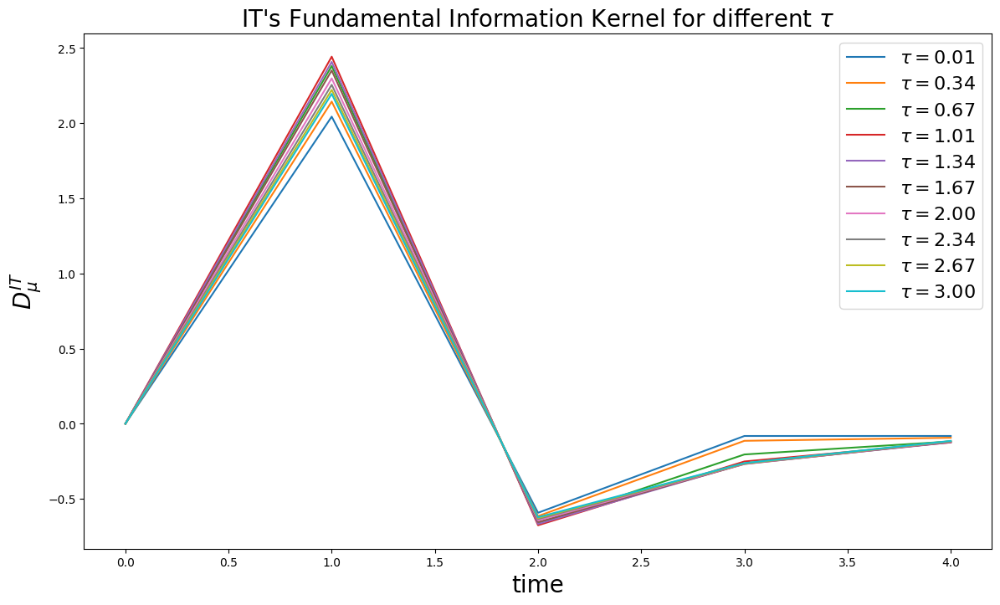

In [477]:
figure35 = plt.figure(figsize = (14,8))
plt.title(r"IT's Fundamental Information Kernel for different $\tau$", fontsize = 20)


for i in range(0, number_of_points_different_taus):
    plt.plot(np.arange(0,5), Ds_MU_IT_different_taus[i][0][:5]/np.sqrt(ACFs_Q[i][0]), label = r"$\tau = {:.2f}$".format(tau_vector_different_taus[i]))
    #plt.plot(np.arange(0,10), -1*Ds_MU_IT_different_taus[i][0][:10], label = r"$\tau = {:.2f}$".format(tau_vector_different_taus[i]))

plt.xlabel(r"time", fontsize = 20)
plt.ylabel(r"$D_{\mu}^{IT}$", fontsize = 20)
#plt.text(20,1,r"$\alpha$ = {}".format(alpha), fontsize = 20)
#plt.text(20,0.1,r"$\tau_{{\mu}}$ = {}".format(tau_MU_different_taus), fontsize = 20)
plt.legend(loc = 1, prop={'size': 16})
#plt.yscale('log')
plt.show()

## Testing if there is a functional dependency $\frac{\tau_{Q}}{\tau_{\mu}}(\alpha)$

In [498]:
T = 100
T_it = 100
G_0_seed = 1
alpha_G = 0.5
seed_type = "mark"
C_NT_0 = 1
tau_NT = 1
C_IT_0 = 1
tau_IT = 1
tau = 1
tau_MU = 3

Var_TGT = 1
ACF_TGT = Var_TGT*np.identity(T) ## Var_tgt is a white noise process

I = np.identity(T)

alpha_min = 0.00000000001
alpha_max = 1

number_of_points = 10

alpha_vector = np.linspace(alpha_min, alpha_max, number_of_points)
tau_MU = 3


D_MUs = []
D_TGTs = []
D_MU_NTs = []
D_TGT_NTs = []
D_MU_ITs = []
D_TGT_ITs = []
ACFs_NT = []
ACFs_Q = []
Gs = []
ACFs_MU = []

cte = np.exp(-1/tau_MU)
C_MU_0 = ((1 - cte)/(cte))**2

In [499]:
for j in range(0, number_of_points):

    numerical_solution = numerical_solver_simulation(T, T_it, G_0_seed, alpha_G, alpha_vector[j], C_MU_0, tau_MU, ACF_TGT, seed_type, C_NT_0, 
                            tau_NT, C_IT_0, tau_IT, tau, _ , bound_for_convergence)

    D_MU = numerical_solution[3][-1][0]
    D_TGT =  numerical_solution[3][-1][1]
    D_MU_NT =  numerical_solution[3][-1][2]
    D_TGT_NT =  numerical_solution[3][-1][3] 
    D_MU_IT =  numerical_solution[3][-1][4]
    D_TGT_IT =  numerical_solution[3][-1][5]
    
    D_MUs.append(D_MU)
    D_TGTs.append(D_TGT)
    D_MU_NTs.append(D_MU_NT)
    D_TGT_NTs.append(D_TGT_NT)
    D_MU_ITs.append(D_MU_IT)
    D_TGT_ITs.append(D_TGT_IT)
    ACFs_NT.append(numerical_solution[4][-1][0,:])
    ACFs_Q.append(numerical_solution[6][-1][0,:])
    Gs.append(numerical_solution[2][-1])
    
    print(f"Finished test {j + 1}")

Iteration 0 completed.

Iteration 1 completed.

Iteration 2 completed.

Iteration 3 completed.

Iteration 4 completed.

Iteration 5 completed.

Iteration 6 completed.

Iteration 7 completed.

Iteration 8 completed.

Iteration 9 completed.

Iteration 10 completed.

Iteration 11 completed.

Iteration 12 completed.

Iteration 13 completed.

Iteration 14 completed.

Iteration 15 completed.

Iteration 16 completed.

Iteration 17 completed.

Iteration 18 completed.

Iteration 19 completed.

Iteration 20 completed.

Iteration 21 completed.

Iteration 22 completed.

Iteration 23 completed.

Iteration 24 completed.

Iteration 25 completed.

Iteration 26 completed.

Iteration 27 completed.

Iteration 28 completed.

Iteration 29 completed.

Iteration 30 completed.

Iteration 31 completed.

Iteration 32 completed.

Iteration 33 completed.

Iteration 34 completed.

Iteration 35 completed.

Iteration 36 completed.

Iteration 37 completed.

Iteration 38 completed.

Iteration 39 completed.

Iteration 

Iteration 28 completed.

Iteration 29 completed.

Iteration 30 completed.

Iteration 31 completed.

Iteration 32 completed.

Iteration 33 completed.

Iteration 34 completed.

Iteration 35 completed.

Iteration 36 completed.

Iteration 37 completed.

Iteration 38 completed.

Iteration 39 completed.

Iteration 40 completed.

Iteration 41 completed.

Iteration 42 completed.

Iteration 43 completed.

Iteration 44 completed.

Iteration 45 completed.

Iteration 46 completed.

Iteration 47 completed.

Iteration 48 completed.

Iteration 49 completed.

Iteration 50 completed.

Iteration 51 completed.

Iteration 52 completed.

Iteration 53 completed.

Iteration 54 completed.

Iteration 55 completed.

Iteration 56 completed.

Iteration 57 completed.

Iteration 58 completed.

Iteration 59 completed.

Iteration 60 completed.

Iteration 61 completed.

Iteration 62 completed.

Iteration 63 completed.

Iteration 64 completed.

Iteration 65 completed.

Iteration 66 completed.

Iteration 67 completed.



Iteration 55 completed.

Iteration 56 completed.

Iteration 57 completed.

Iteration 58 completed.

Iteration 59 completed.

Iteration 60 completed.

Iteration 61 completed.

Iteration 62 completed.

Iteration 63 completed.

Iteration 64 completed.

Iteration 65 completed.

Iteration 66 completed.

Iteration 67 completed.

Iteration 68 completed.

Iteration 69 completed.

Iteration 70 completed.

Iteration 71 completed.

Iteration 72 completed.

Iteration 73 completed.

Iteration 74 completed.

Iteration 75 completed.

Iteration 76 completed.

Iteration 77 completed.

Iteration 78 completed.

Iteration 79 completed.

Iteration 80 completed.

Iteration 81 completed.

Iteration 82 completed.

Iteration 83 completed.

Iteration 84 completed.

Iteration 85 completed.

Iteration 86 completed.

Iteration 87 completed.

Iteration 88 completed.

Iteration 89 completed.

Iteration 90 completed.

Iteration 91 completed.

Iteration 92 completed.

Iteration 93 completed.

Iteration 94 completed.



Iteration 82 completed.

Iteration 83 completed.

Iteration 84 completed.

Iteration 85 completed.

Iteration 86 completed.

Iteration 87 completed.

Iteration 88 completed.

Iteration 89 completed.

Iteration 90 completed.

Iteration 91 completed.

Iteration 92 completed.

Iteration 93 completed.

Iteration 94 completed.

Iteration 95 completed.

Iteration 96 completed.

Iteration 97 completed.

Iteration 98 completed.

Iteration 99 completed.

Finished test 10


In [500]:
taus_Q = []

from scipy.optimize import curve_fit

def exp(x, a, tau):
    return a*np.exp(-x/tau)

x = np.arange(25,T)

seed_Q = np.zeros(2)
seed_Q[0] = 1
seed_Q[1] = 1

for i in range(0, number_of_points):
    y = ACFs_Q[i][25:T]
    parameters_Q, cov = curve_fit(f = exp, xdata = x, ydata = y, p0 = [1,1], maxfev = 50000)
    taus_Q.append(parameters_Q[1])

In [501]:
taus_MU = np.ones(number_of_points)*tau_MU

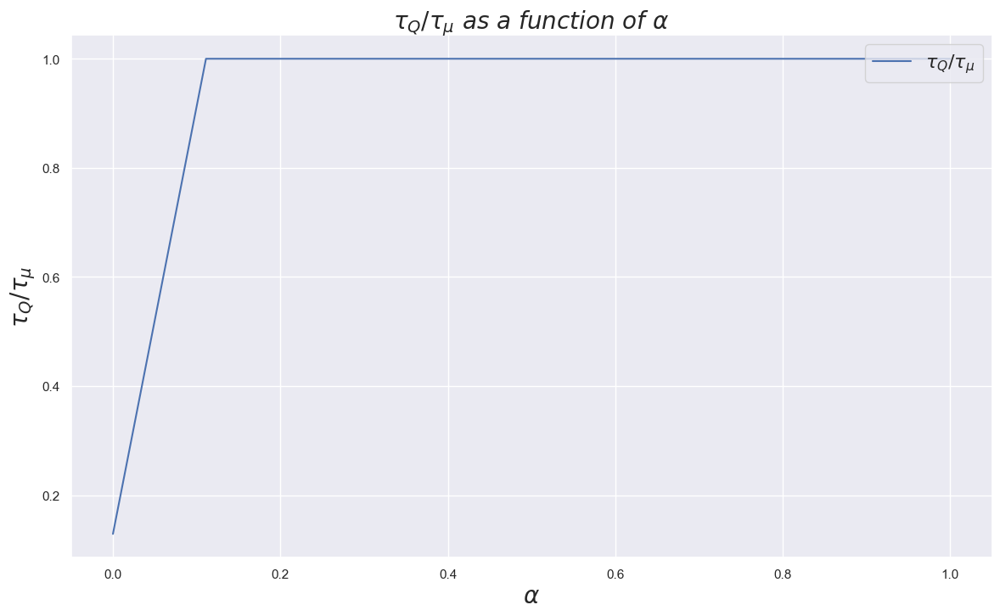

In [503]:
import seaborn as sns
sns.set_theme()
figure35 = plt.figure(figsize = (14,8))
plt.title(r"$\tau_{Q}/\tau_{\mu} \ as \ a \ function \ of \ \alpha$", fontsize = 20)
plt.plot(alpha_vector[:], taus_Q[:]/taus_MU[:], label = r"$\tau_{Q}/\tau_{\mu}$")
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$\tau_{Q}/\tau_{\mu}$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 16})
#plt.text(1, 1, r"$\tau$ = {}".format(tau), fontsize = 20)
plt.show()

In [492]:
taus_Q

[0.26366995349681244,
 0.2532521647383671,
 0.2221318122176288,
 0.2562375589027095,
 0.11509183404411498,
 0.7554804931025251,
 1.695775981349913,
 2.6267241180090886,
 2.979972593411339,
 3.118907206960203]

In [493]:
taus_MU

array([3., 3., 3., 3., 3., 3., 3., 3., 3., 3.])

In [494]:
taus_Q/taus_MU

array([0.08788998, 0.08441739, 0.07404394, 0.08541252, 0.03836394,
       0.25182683, 0.56525866, 0.87557471, 0.9933242 , 1.03963574])

**Printing $ACFs_{Q}$ vs $\tau$**

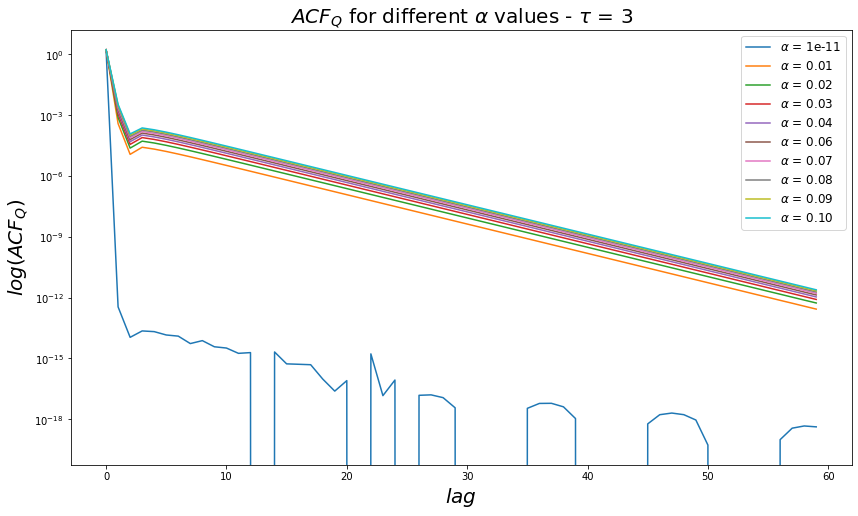

In [169]:
figure35 = plt.figure(figsize = (14,8))
plt.title(r"$ACF_{Q}$ for different $\alpha$ values - $\tau$ = 3", fontsize = 20)
for i in range(0, number_of_points):
    if i == 0:
        plt.plot(np.arange(0,60), ACFs_Q[i][:60], label =  r"$\alpha$ = {:.0e}".format(alpha_vector[i]))
    else:
        plt.plot(np.arange(0,60), ACFs_Q[i][:60], label =  r"$\alpha$ = {:.2f}".format(alpha_vector[i]))
        
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$log(ACF_{Q})$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 12})
#plt.text(1, 1, r"$\tau$ = {}".format(tau), fontsize = 20)
plt.yscale('log')
plt.show()

## Analyzing gains for a fixed tracking error

**Simulating the market**

In [115]:
number_of_points_different_taus = 10
market_simulation_different_taus  = simulate_market_for_different_taus(1, 0.01, 3, number_of_points_different_taus, 20000)
phi_t_vector_different_taus  = market_simulation_different_taus[0] 
noise_trader_total_position_t_different_taus = market_simulation_different_taus[1] 
target_portfolio_total_position_t_different_taus = market_simulation_different_taus[2] 
informed_trader_total_position_t_different_taus = market_simulation_different_taus[3] 
market_maker_total_position_t_different_taus = market_simulation_different_taus[4] 
var_noise_trader_total_position_t_different_taus = market_simulation_different_taus[5] 
var_target_portfolio_total_position_t_different_taus = market_simulation_different_taus[6] 
var_informed_trader_total_position_t_different_taus = market_simulation_different_taus[7] 
var_market_maker_total_position_t_different_taus = market_simulation_different_taus[8] 
MM_mean_gain_vector_different_taus = market_simulation_different_taus[9] 
NT_mean_gain_vector_different_taus = market_simulation_different_taus[10] 
IT_mean_gain_vector_different_taus = market_simulation_different_taus[11] 
tau_vector_different_taus = market_simulation_different_taus[12]
var_price_t_different_taus = market_simulation_different_taus[13]
var_IT_estimated_price_t_different_taus = market_simulation_different_taus[14]
ACFs_NT_different_taus = market_simulation_different_taus[15]
ACFs_IT_different_taus = market_simulation_different_taus[16]
ACFs_Q_different_taus = market_simulation_different_taus[17]
ACFs_MU_different_taus = market_simulation_different_taus[18]
ACFs_P_different_taus = market_simulation_different_taus[19]
tau_MU_different_taus =  market_simulation_different_taus[20] 
Ds_MU_IT_different_taus = market_simulation_different_taus[21] 

**NT's gain/tracking error vs $\tau$**

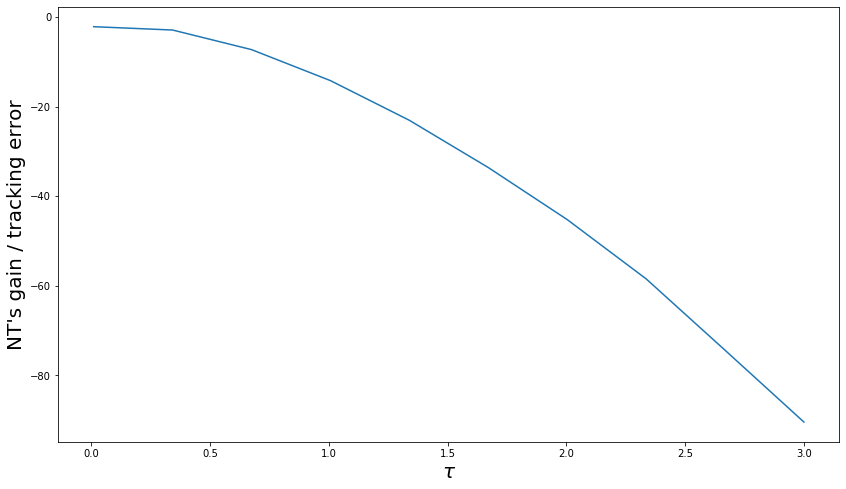

In [142]:
figure31 = plt.figure(figsize = (14,8))

normalized_NT_mean_gain = []

for i in range(0, number_of_points_different_taus):
    normalized_NT_mean_gain.append(NT_mean_gain_vector_different_taus[i]/phi_t_vector_different_taus[i][-1])
    
plt.plot(tau_vector_different_taus, normalized_NT_mean_gain)
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"NT's gain / tracking error", fontsize = 20)
plt.show()

**IT's gain/tracking error vs $\tau$**

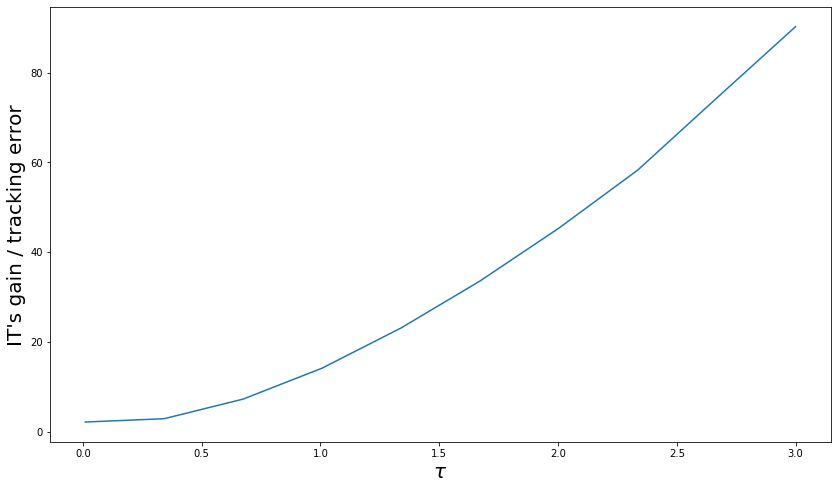

In [143]:
figure31 = plt.figure(figsize = (14,8))

normalized_NT_mean_gain = []

for i in range(0, number_of_points_different_taus):
    normalized_NT_mean_gain.append(IT_mean_gain_vector_different_taus[i]/phi_t_vector_different_taus[i][-1])
    
plt.plot(tau_vector_different_taus, normalized_NT_mean_gain)
plt.xlabel(r"$\tau$", fontsize = 20)
plt.ylabel(r"IT's gain / tracking error", fontsize = 20)
plt.show()

## Investigating $\frac{\tau_{Q}}{\tau_{\mu}}(\phi(T))$

In [218]:
number_of_points = 10
market_simulation  = simulate_market_for_different_alphas( 0.00000000001, 0.1, number_of_points, 20000)
phi_t_vector  = market_simulation[0] 
noise_trader_total_position_t = market_simulation[1] 
target_portfolio_total_position_t = market_simulation[2] 
informed_trader_total_position_t = market_simulation[3] 
market_maker_total_position_t = market_simulation[4] 
var_noise_trader_total_position_t = market_simulation[5] 
var_target_portfolio_total_position_t = market_simulation[6] 
var_informed_trader_total_position_t = market_simulation[7] 
var_market_maker_total_position_t = market_simulation[8] 
MM_mean_gain_vector = market_simulation[9] 
NT_mean_gain_vector = market_simulation[10] 
IT_mean_gain_vector = market_simulation[11] 
alpha_vector = market_simulation[12]
var_price_t = market_simulation[13]
var_IT_estimated_price_t = market_simulation[14]
ACFs_NT = market_simulation[15]
ACFs_IT = market_simulation[16]
ACFs_Q = market_simulation[17]
ACFs_MU = market_simulation[18]
ACFs_P = market_simulation[19]

In [248]:
taus_Q = []
amplitudes_Q = []

from scipy.optimize import curve_fit

def exp(x, a, tau):
    return a*np.exp(-x/tau)

x = np.arange(25,T)

seed_Q = np.zeros(2)
seed_Q[0] = 1
seed_Q[1] = 1

for i in range(0, number_of_points):
    y = ACFs_Q[i][-1][0,25:T]
    parameters_Q, cov = curve_fit(f = exp, xdata = x, ydata = y, p0 = [1,1], maxfev = 50000)
    taus_Q.append(parameters_Q[1])
    amplitudes_Q.append(parameters_Q[0])

In [228]:
taus_Q

[0.26447607221681224,
 3.0000036380195487,
 3.0000038806915965,
 3.000003713184672,
 3.000003729311664,
 3.0000036753808588,
 3.0000035805270078,
 3.00000358567266,
 3.0000035332883175,
 3.0000034670382267]

In [234]:
taus_MU = np.ones(number_of_points)*3

In [235]:
taus_MU

array([3., 3., 3., 3., 3., 3., 3., 3., 3., 3.])

In [236]:
taus_Q/taus_MU

array([0.08815869, 1.00000121, 1.00000129, 1.00000124, 1.00000124,
       1.00000123, 1.00000119, 1.0000012 , 1.00000118, 1.00000116])

In [237]:
phi_stationary = []

for i in range(0, number_of_points):
    phi_stationary.append(phi_t_vector[i][-1])

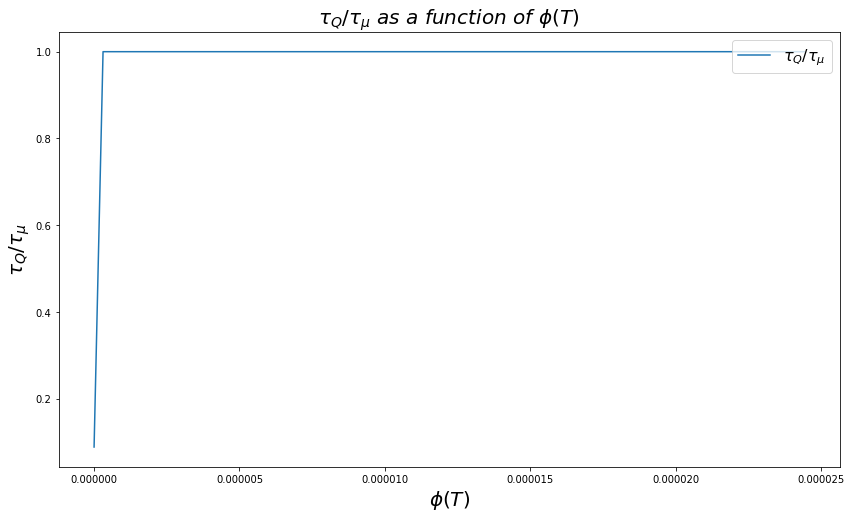

In [238]:
figure35 = plt.figure(figsize = (14,8))
plt.title(r"$\tau_{Q}/\tau_{\mu} \ as \ a \ function \ of \ \phi(T)$", fontsize = 20)
plt.plot(phi_stationary, taus_Q[:]/taus_MU[:], label = r"$\tau_{Q}/\tau_{\mu}$")
plt.xlabel(r"$\phi(T)$", fontsize = 20)
plt.ylabel(r"$\tau_{Q}/\tau_{\mu}$", fontsize = 20)
plt.legend(loc = 1, prop={'size': 16})
#plt.text(1, 1, r"$\tau$ = {}".format(tau), fontsize = 20)
plt.show()

In [226]:
phi_stationary

[2.433852063712371e-25,
 3.081622723445023e-07,
 1.2221808430340194e-06,
 2.743959875297914e-06,
 4.925926237519582e-06,
 7.57020792619989e-06,
 1.0866330780613699e-05,
 1.4577607891070849e-05,
 1.9499044731738496e-05,
 2.442482832448302e-05]

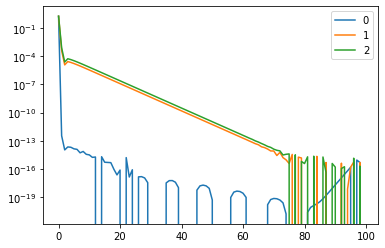

In [247]:
for i in range(0,3):
    plt.plot(np.arange(0,100), ACFs_Q[i][-1][0,:], label = f"{i}")
plt.legend()
plt.yscale('log')

No handles with labels found to put in legend.


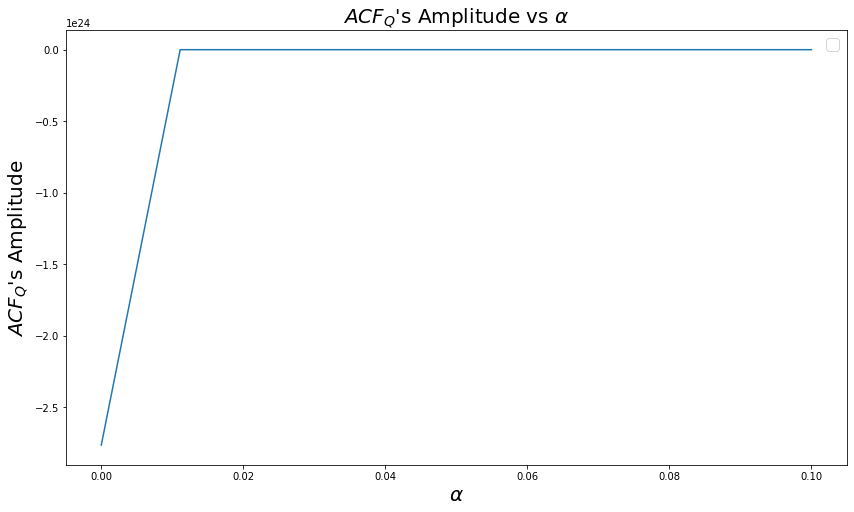

In [250]:
figure35 = plt.figure(figsize = (14,8))
plt.title(r"$ACF_{Q}$'s Amplitude vs $\alpha$", fontsize = 20)
plt.plot(alpha_vector, amplitudes_Q)
plt.xlabel(r"$\alpha$", fontsize = 20)
plt.ylabel(r"$ACF_{Q}$'s Amplitude", fontsize = 20)
plt.legend(loc = 1, prop={'size': 16})
#plt.text(1, 1, r"$\tau$ = {}".format(tau), fontsize = 20)
plt.show()

In [252]:
amplitudes_Q

[-2.762438060538024e+24,
 9.324681891142434e-05,
 0.00018642139761405508,
 0.0002795242009729439,
 0.00037255503570352716,
 0.00046551421526012075,
 0.000558401876763665,
 0.0006512179043608604,
 0.0007439626803268476,
 0.0008366362695912506]

## Exploring Market Efficiency with $D_{\mu}, D_{\mu}^{NT}, D_{\mu}^{IT}$

In [134]:
T = 100
T_it = 100
G_0_seed = 1
alpha_G = 0.5
seed_type = "mark"
C_NT_0 = 1
tau_NT = 1
C_IT_0 = 1
tau_IT = 1
bound_for_convergence = 0.00001


Var_TGT = 1
ACF_TGT = Var_TGT*np.identity(T) ## Var_tgt is a white noise process

I = np.identity(T)

alpha = 1

tau_min = 0.1
tau_max = 10

number_of_points = 10

tau_vector = np.linspace(tau_min, tau_max, number_of_points)

tau_MU = 3


D_MUs = []
D_TGTs = []
D_MU_NTs = []
D_TGT_NTs = []
D_MU_ITs = []
D_TGT_ITs = []
ACFs_NT = []
ACFs_IT = []
ACFs_Q = []
Gs = []

cte = np.exp(-1/tau_MU)
C_MU_0 = ((1 - cte)/(cte))**2

ACF_MU = return_Markovian_ACF(C_MU_0, tau_MU, T)

In [135]:
for j in range(0, number_of_points):

    numerical_solution = numerical_solver_simulation(T, T_it, G_0_seed, alpha_G, alpha, C_MU_0, tau_MU, ACF_TGT, seed_type, C_NT_0, 
                            tau_NT, C_IT_0, tau_IT, tau_vector[j], _ , bound_for_convergence)

    D_MU = numerical_solution[3][-1][0]
    D_TGT =  numerical_solution[3][-1][1]
    D_MU_NT =  numerical_solution[3][-1][2]
    D_TGT_NT =  numerical_solution[3][-1][3] 
    D_MU_IT =  numerical_solution[3][-1][4]
    D_TGT_IT =  numerical_solution[3][-1][5]
    
    D_MUs.append(D_MU)
    D_TGTs.append(D_TGT)
    D_MU_NTs.append(D_MU_NT)
    D_TGT_NTs.append(D_TGT_NT)
    D_MU_ITs.append(D_MU_IT)
    D_TGT_ITs.append(D_TGT_IT)
    ACFs_NT.append(numerical_solution[4][-1][0,:])
    ACFs_IT.append(numerical_solution[5][-1][0,:])
    ACFs_Q.append(numerical_solution[6][-1][0,:])
    Gs.append(numerical_solution[2][-1])
    
    print(f"Finished test {j + 1}")

Finished test 1
Finished test 2
Finished test 3
Finished test 4
Finished test 5
Finished test 6
Finished test 7
Finished test 8
Finished test 9
Finished test 10


**Exploring $D_{\mu}$**

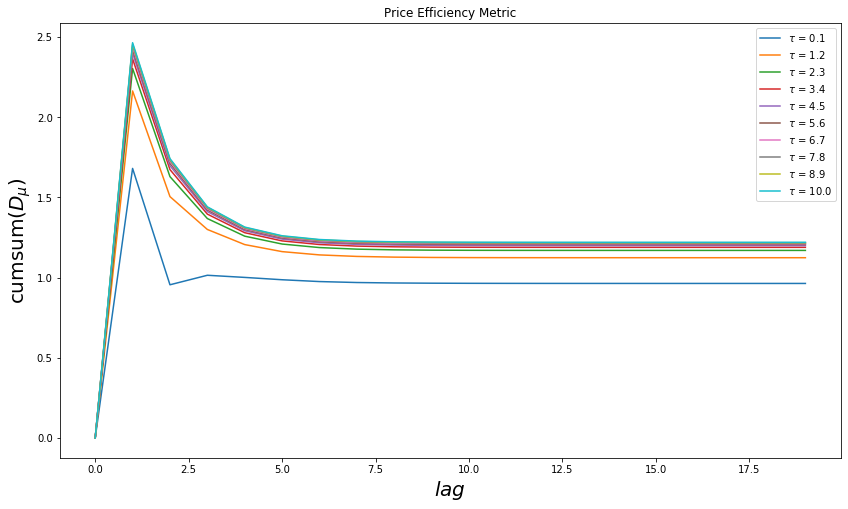

In [157]:
figure31 = plt.figure(figsize = (14,8))

price_efficiency_metric = []

for i in range(0, number_of_points):
    price_efficiency_metric.append(np.cumsum(D_MUs[i][0,:20]))
    plt.plot(np.arange(0,20), price_efficiency_metric[i], label = r"$\tau $ = {}".format(tau_vector[i].round(2)))
    

plt.legend()
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"cumsum($D_{\mu}$)", fontsize = 20)
plt.title("Price Efficiency Metric")
plt.show()

**Exploring $D_{\mu}^{NT}$**

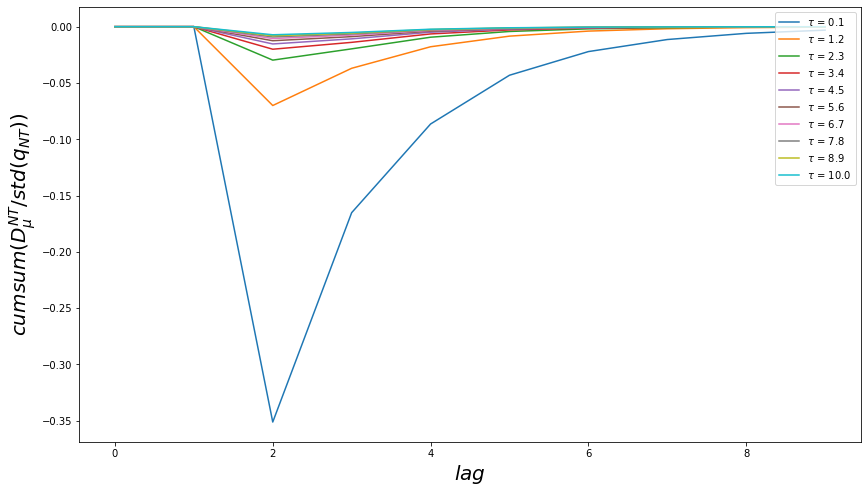

In [150]:
figure33 = plt.figure(figsize = (14,8))

for i in range(0, number_of_points):
    plt.plot(np.arange(0,10), np.cumsum(D_MU_NTs[i][0,:10]/(np.sqrt(ACFs_NT[i][0]))), label = r"$\tau $ = {}".format(tau_vector[i].round(2)))
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$cumsum(D_{\mu}^{NT}/std(q_{NT}))$", fontsize = 20)
plt.legend(loc = 1)

**Exploring $D_{\mu}^{IT}$**

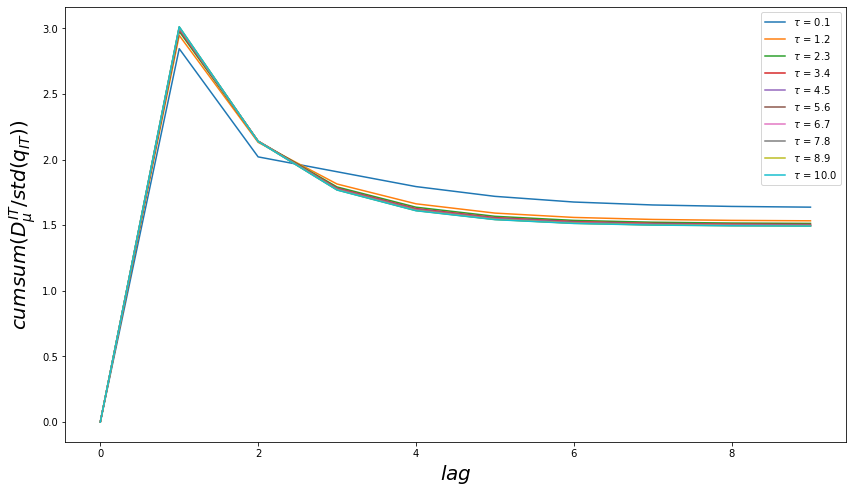

In [144]:
figure34 = plt.figure(figsize = (14,8))

for i in range(0, number_of_points):
    plt.plot(np.arange(0,10), np.cumsum(D_MU_ITs[i][0,:10]/(np.sqrt(ACFs_IT[i][0]))), label = r"$\tau $ = {}".format(tau_vector[i].round(2)))
plt.xlabel(r"$lag$", fontsize = 20)
plt.ylabel(r"$cumsum(D_{\mu}^{IT}/std(q_{IT}))$", fontsize = 20)
plt.legend(loc = 1)